# 14th February
Now that the whole-day recordings are in a readable format, they need to be converted to an attribute table that we can use in the Neural Network. Rather than separating the process into several stages, as we have done with the event recordings, we can just conjoin everything as we've already worked out our logic from first principles. 

In [12]:
import pandas as pd
import numpy as np
from tqdm import tqdm_notebook, tnrange, tqdm
import os
import matplotlib.pyplot as plt
from scipy.signal import kaiser
from numpy.fft import *
from pandasql import *
from skimage import util
#plt.style.use('classic')
%matplotlib notebook
pysqldf = lambda q: sqldf(q, globals())

In [2]:
manual_dataframe = pd.read_csv("../../Data/DATA/headless_only/TimeseriesAndAmplitude/2011.240.00.00.00.0000.YW.NAB1..HHE.D.txt")

In [3]:
manual_dataframe

,TimeSeries,Amplitude
0,0.00,-8290.0
1,0.01,-8253.0
2,0.02,-8337.0
3,0.03,-7883.0
4,0.04,-7459.0
5,0.05,-7260.0
6,0.06,-7167.0
7,0.07,-7264.0
8,0.08,-7558.0
9,0.09,-7935.0


We need to extract noise clips from the whole day recording. They will need to be the same length as the event recordings, (300 seconds, or 30000 datapoints) so we can run a rolling window through every day, and where the window meets a certain criterion, we can select that window as a noise specimen.

Initial experimentation showed poor results from using a rolling mean to select for noise, so let's look at standard deviation as an alternative.

In [3]:
window_size = 30000

manual_rolling = manual_dataframe['Amplitude'].rolling(window=window_size)

manual_dataframe['StandardDeviation']=manual_rolling.std()

stddev_series = manual_rolling.std()

stddev_sorted_series = stddev_series.sort_values()

<IPython.core.display.Javascript object>


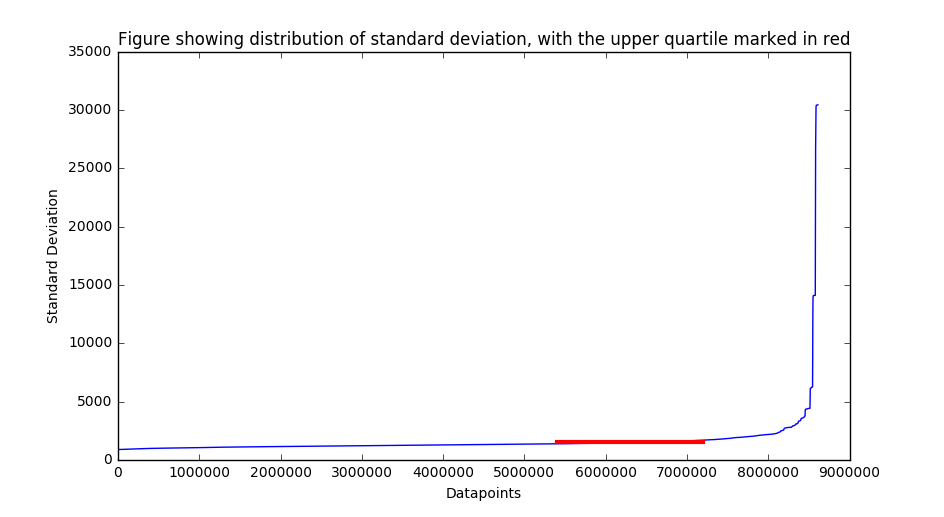

In [4]:
upper_quartile = stddev_sorted_series.quantile(0.75)
x_axis_values = np.linspace(0, len(stddev_sorted_series), len(stddev_sorted_series))

fig, ax = plt.subplots()
ax.plot(x_axis_values, stddev_sorted_series)
ax.axhline(upper_quartile, 0.6, 0.8, color="r", linewidth=3)
#ax.annotate(upper_quartile, xy_text=())
ax.set_xlabel("Datapoints")
ax.set_ylabel("Standard Deviation")
ax.set_title("Figure showing distribution of standard deviation, with the upper quartile marked in red")

By calculating the standard deviation values of every possible window, and reordering them by standard deviation size, we can see the distribution of standard deviation for the first recording. There appears to be a strong variation between events and noise, so we can safely use the upper quartile value as a threshold (marked in red) and still have a buffer between noise and weak events. 

We will use the std dev upper quartile value for each day as the noise threshold criterion.

In [5]:
stddev_limit = stddev_sorted_series.quantile(0.75)
stddev_limit

1519.3238351518671

In [6]:
def noise_checker(input_value, watershed_value):
    if input_value < watershed_value:
        return 1
    else:
        return 0

noise_labels = map(lambda x: noise_checker(x, stddev_limit) ,manual_dataframe['StandardDeviation'])
noise_labels_series = pd.Series(noise_labels)

manual_dataframe['NoiseLabel']=noise_labels_series

manual_dataframe = manual_dataframe.set_index(["TimeSeries"])

In [9]:
manual_dataframe[299.8:]

,Amplitude,StandardDeviation,NoiseLabel
TimeSeries,,,
299.80,-6858.0,NaN,0
299.81,-7243.0,NaN,0
299.82,-7495.0,NaN,0
299.83,-7793.0,NaN,0
299.84,-7819.0,NaN,0
299.85,-8044.0,NaN,0
299.86,-8158.0,NaN,0
299.87,-8215.0,NaN,0
299.88,-7996.0,NaN,0


In [10]:
manual_dataframe.groupby(['NoiseLabel']).mean()

,Amplitude,StandardDeviation
NoiseLabel,,
0,-8219.867049,2709.031824
1,-7645.996082,1242.043797


With the enitre dataframe rows labelled as either 1 for below threshold, or 0 for above threshold, we cna now extract each window out. However, with thousands of noise windows per day, we have far too many potential recordings, given the number of event recordings. We will randomly choose 500 recordings from each whole-day recording for now, and then further down sample it later in the process to exactly match the event dataset.

Then we pull out the window relating to each randomly chosen set of data and render it as a 300 second recording in a large dataframe, with a row per recording, and a column per 0.01 seconds (500x30000 for each whole-day recording)

In [11]:
noise_only_df = manual_dataframe.loc[manual_dataframe["NoiseLabel"] == 1]

random_cols = np.random.choice(noise_only_df.index, 500)

selected_df = pd.DataFrame(index=list(random_cols))

selected_df = selected_df.join(noise_only_df, how='inner')

In [16]:
selected_df

,Amplitude,StandardDeviation,NoiseLabel
33637.09,-7909.0,1195.063628,1
36568.25,-6110.0,1241.999261,1
49929.20,-7476.0,1059.870217,1
65187.15,-9296.0,1363.148640,1
1816.63,-5643.0,972.003215,1
73017.75,-9312.0,1318.083485,1
64691.55,-11932.0,1512.990453,1
22726.08,-5705.0,1198.561755,1
48842.95,-7112.0,1138.812165,1
9219.86,-7947.0,1096.488872,1


In [19]:
def noise_window_slicer(raw_dataframe, selected_df, window_size_seconds):
    output_df = pd.DataFrame()
    relabelled_series_axis = np.arange(0, window_size_seconds+0.01, 0.01)
    relabelled_series_axis_one_less = np.arange(0, window_size_seconds, 0.01)
    for index in tqdm(selected_df.index.values):
        index_name = str(index)
        slice_series = raw_dataframe.Amplitude.loc[index - window_size_seconds : index]
        slice_series = slice_series.rename(index_name)
        try:
            slice_series.index = relabelled_series_axis
        except ValueError:
            slice_series.index = relabelled_series_axis_one_less
            pass
        output_df = output_df.append(slice_series)
    return output_df

In [20]:
test_func_df = noise_window_slicer(manual_dataframe, selected_df, 300)

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:29<00:00,  5.59it/s]


In [21]:
test_func_df

,0.0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,...,299.91,299.92,299.93,299.94,299.95,299.96,299.97,299.98,299.99,300.0
33637.09,-8908.0,-8555.0,-8461.0,-7653.0,-7715.0,-7568.0,-7289.0,-7598.0,-7231.0,-7107.0,...,-5572.0,-5875.0,-6083.0,-6059.0,-5864.0,-5964.0,-6478.0,-7042.0,-7502.0,-7909.0
36568.25,-11110.0,-11080.0,-10779.0,-10245.0,-9764.0,-9149.0,-8766.0,-8389.0,-8045.0,-7793.0,...,-6953.0,-7029.0,-6904.0,-6675.0,-6605.0,-6582.0,-6367.0,-6246.0,-6191.0,-6110.0
49929.2,-6673.0,-6762.0,-6953.0,-7324.0,-7743.0,-8072.0,-7989.0,-8165.0,-8273.0,-8136.0,...,-8352.0,-8038.0,-7802.0,-7819.0,-7816.0,-7854.0,-7833.0,-7871.0,-7700.0,-7476.0
65187.15,-7473.0,-7691.0,-7359.0,-7010.0,-7426.0,-6829.0,-7270.0,-7328.0,-6958.0,-7394.0,...,-8867.0,-8248.0,-9047.0,-7853.0,-8777.0,-8464.0,-7998.0,-9160.0,-8447.0,-9296.0
1816.63,-7044.0,-6604.0,-6944.0,-7372.0,-7351.0,-7593.0,-8115.0,-8346.0,-8430.0,-8276.0,...,-6695.0,-6473.0,-6176.0,-5886.0,-5808.0,-5748.0,-5653.0,-5809.0,-5710.0,-5643.0
73017.75,-9044.0,-9127.0,-9263.0,-9037.0,-8257.0,-8059.0,-8008.0,-8344.0,-8763.0,-9193.0,...,-10763.0,-10365.0,-10744.0,-9887.0,-10231.0,-9951.0,-9859.0,-10270.0,-9562.0,-9312.0
64691.55,-9753.0,-10160.0,-9686.0,-9863.0,-9963.0,-9629.0,-9249.0,-9501.0,-8820.0,-9743.0,...,-12251.0,-11993.0,-11893.0,-11754.0,-10989.0,-11621.0,-11323.0,-11768.0,-12286.0,-11932.0
22726.08,-5727.0,-5880.0,-5934.0,-6134.0,-6216.0,-6174.0,-6220.0,-6428.0,-6944.0,-7308.0,...,-6347.0,-6470.0,-5871.0,-5744.0,-5645.0,-5419.0,-5440.0,-5408.0,-5578.0,-5705.0
48842.95,-6866.0,-6895.0,-6605.0,-6800.0,-7014.0,-7579.0,-7872.0,-7553.0,-7591.0,-7246.0,...,-6340.0,-6521.0,-6802.0,-6820.0,-6992.0,-7071.0,-7184.0,-7393.0,-7290.0,-7112.0
9219.86,-4157.0,-4246.0,-4786.0,-5278.0,-5473.0,-5690.0,-5784.0,-5828.0,-5807.0,-5891.0,...,-8931.0,-9126.0,-9343.0,-9259.0,-9230.0,-8928.0,-8523.0,-8157.0,-7844.0,-7947.0


# Fourier

with the first whole-day recording processed into 500 noise recordings, we can process it through a DFFT and Kaiser filter, like the event data.

In [49]:
test_func_df_tr = test_func_df.transpose()

In [92]:
test_func_df_tr

,33637.09,36568.25,49929.2,65187.15,1816.63,73017.75,64691.55,22726.08,48842.95,9219.86,...,26309.54,79869.38,15914.2,11836.18,4907.41,3095.24,17783.71,27375.7,37879.42,10867.75
0.00,-8908.0,-11110.0,-6673.0,-7473.0,-7044.0,-9044.0,-9753.0,-5727.0,-6866.0,-4157.0,...,-6293.0,-9224.0,-7084.0,-9776.0,-10009.0,-8246.0,-5748.0,-5271.0,-6472.0,-6920.0
0.01,-8555.0,-11080.0,-6762.0,-7691.0,-6604.0,-9127.0,-10160.0,-5880.0,-6895.0,-4246.0,...,-6508.0,-8998.0,-7365.0,-9940.0,-10016.0,-8211.0,-5819.0,-5095.0,-6149.0,-6891.0
0.02,-8461.0,-10779.0,-6953.0,-7359.0,-6944.0,-9263.0,-9686.0,-5934.0,-6605.0,-4786.0,...,-7611.0,-8987.0,-7309.0,-9575.0,-9892.0,-8070.0,-5741.0,-4789.0,-6411.0,-6847.0
0.03,-7653.0,-10245.0,-7324.0,-7010.0,-7372.0,-9037.0,-9863.0,-6134.0,-6800.0,-5278.0,...,-7942.0,-8860.0,-6966.0,-9099.0,-9688.0,-8059.0,-5638.0,-4673.0,-6413.0,-6717.0
0.04,-7715.0,-9764.0,-7743.0,-7426.0,-7351.0,-8257.0,-9963.0,-6216.0,-7014.0,-5473.0,...,-8500.0,-8410.0,-7299.0,-8606.0,-9522.0,-8058.0,-5411.0,-4771.0,-7069.0,-7487.0
0.05,-7568.0,-9149.0,-8072.0,-6829.0,-7593.0,-8059.0,-9629.0,-6174.0,-7579.0,-5690.0,...,-8490.0,-8115.0,-7276.0,-7896.0,-9594.0,-8332.0,-5620.0,-5064.0,-7188.0,-6988.0
0.06,-7289.0,-8766.0,-7989.0,-7270.0,-8115.0,-8008.0,-9249.0,-6220.0,-7872.0,-5784.0,...,-7826.0,-7408.0,-7092.0,-7629.0,-9584.0,-8622.0,-5753.0,-5623.0,-7238.0,-7384.0
0.07,-7598.0,-8389.0,-8165.0,-7328.0,-8346.0,-8344.0,-9501.0,-6428.0,-7553.0,-5828.0,...,-8172.0,-7052.0,-7486.0,-7789.0,-9361.0,-8731.0,-6053.0,-6323.0,-7289.0,-7620.0
0.08,-7231.0,-8045.0,-8273.0,-6958.0,-8430.0,-8763.0,-8820.0,-6944.0,-7591.0,-5807.0,...,-7006.0,-6824.0,-7460.0,-7889.0,-9074.0,-8722.0,-6282.0,-7216.0,-7173.0,-7769.0
0.09,-7107.0,-7793.0,-8136.0,-7394.0,-8276.0,-9193.0,-9743.0,-7308.0,-7246.0,-5891.0,...,-7357.0,-6710.0,-7732.0,-7548.0,-8830.0,-8742.0,-6466.0,-7746.0,-7225.0,-7609.0


In [111]:
input_series = test_func_df_tr.iloc[:, 499]
kaiser_betamax_value = 14
time_interval = 0.01

#def fft_kaiser_db (input_series, kaiser_betamax_value, time_interval):
ingested_series = input_series
sampling_rate = time_interval    
no_of_datapoints = len(ingested_series)

kaiser_window = kaiser(no_of_datapoints, kaiser_betamax_value)
    
frequency_components = fft(ingested_series * kaiser_window)
miror_trimmed_absolute_frequency_components = 2.0/no_of_datapoints * np.abs(frequency_components[:no_of_datapoints//2])
    
maximum_amplitude = miror_trimmed_absolute_frequency_components.max()
amplitude_ratio_values = map(lambda x: x/maximum_amplitude ,miror_trimmed_absolute_frequency_components)
mirror_trimmed_absolute_frequency_components_decibel = map(lambda x: 20*np.log10(x), amplitude_ratio_values)
    
sampling_frequencies = fftfreq(no_of_datapoints, d=sampling_rate)[:no_of_datapoints//2]
    
output_data_dict = {"Sampling_Frequencies": sampling_frequencies, "Decibels": mirror_trimmed_absolute_frequency_components_decibel}
output_dataframe = pd.DataFrame(data=output_data_dict)

#return output_dataframe



In [112]:
output_dataframe

,Decibels,Sampling_Frequencies
0,0.000000,0.000000
1,-2.940525,0.003333
2,-12.537740,0.006666
3,-34.169293,0.010000
4,-47.080018,0.013333
5,-32.304271,0.016666
6,-29.891279,0.019999
7,-28.433259,0.023333
8,-29.560787,0.026666
9,-34.202770,0.029999


<IPython.core.display.Javascript object>


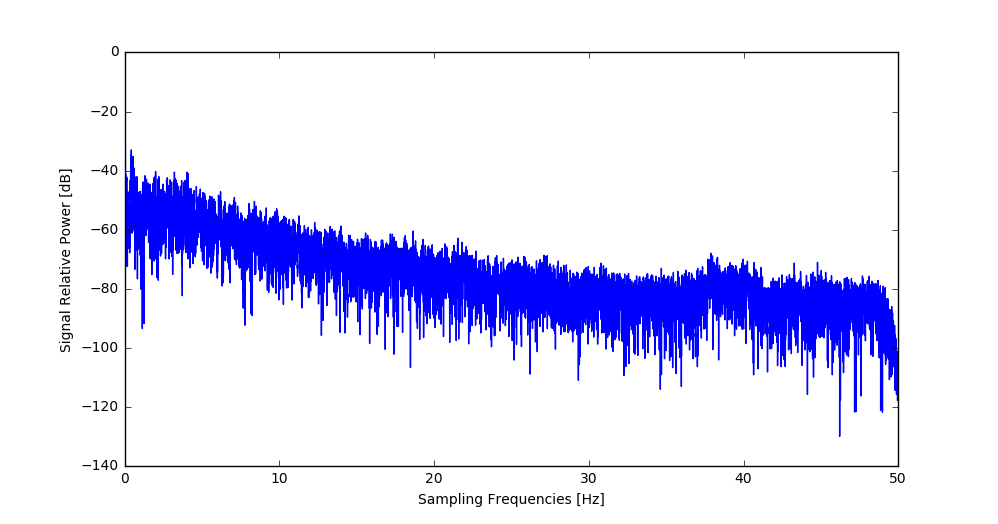

In [75]:
fig, ax = plt.subplots()
ax.plot(output_dataframe.Sampling_Frequencies, output_dataframe.Decibels)
ax.set_xlabel("Sampling Frequencies [Hz]")
ax.set_ylabel("Signal Relative Power [dB]")
plt.show()

The DFFT process seems to have worked as expected, with the same parameters (e.g. kaiser b-max) as the event DFFT processing. The kasier-filtered fourier plot does differ from the event frequency spectrum with a much flatter lower signal strength. This is promising, but may be atypicial of noise frequency spectra - once all the noise data has been processed we can see if they all follow this pattern.

------------------
# frequency binning

As with the event data, the noise data needs to be downsampled, and assembled into an attribute table ready for ingestion.

<IPython.core.display.Javascript object>


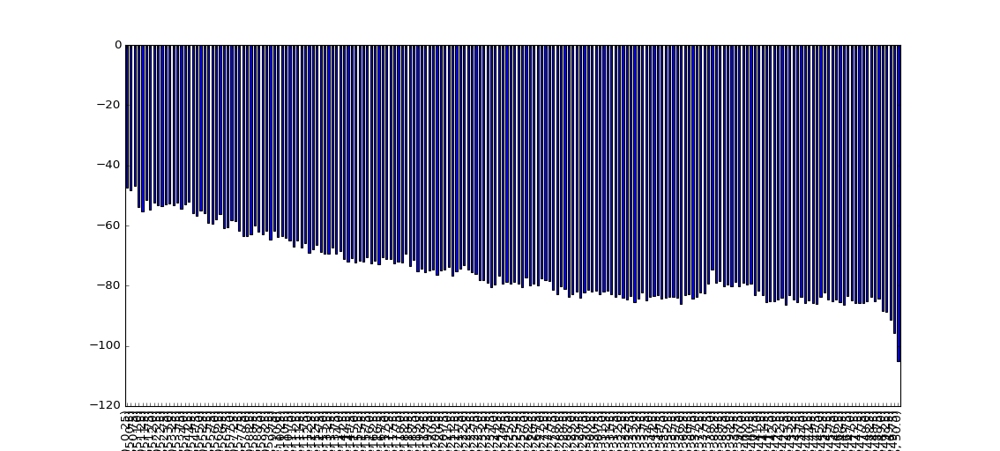

In [85]:
break_points = np.linspace(0, 50, 201)

output_dataframe['bins']=pd.cut(output_dataframe["Sampling_Frequencies"],break_points, right=False)

output_dataframe.groupby("bins")["Decibels"].mean().plot.bar()

In [88]:
whole_event_mean = output_dataframe['Decibels'].mean()
whole_event_median = output_dataframe['Decibels'].median()

origin_filename = "2011.240.00.00.00.0000.YW.NAB1..HHE.D.txt"
stats_and_labels_dict = {'Mean': whole_event_mean,
                         'Median': whole_event_median,
                         'Label': 0}

attributes_dataseries = output_dataframe.groupby("bins")["Decibels"].mean()

stats_and_labels_series = pd.Series(data=stats_and_labels_dict)
attributes_dataseries = pd.concat([stats_and_labels_series, attributes_dataseries])

attributes_dataframe = pd.DataFrame(data=attributes_dataseries, columns=[origin_filename])

attributes_dataframe

,2011.240.00.00.00.0000.YW.NAB1..HHE.D.txt
Label,0.000000
Mean,-74.718653
Median,-77.098446
"[0.0, 0.25)",-47.279647
"[0.25, 0.5)",-48.304417
"[0.5, 0.75)",-46.733059
"[0.75, 1.0)",-53.855668
"[1.0, 1.25)",-55.398663
"[1.25, 1.5)",-51.468996
"[1.5, 1.75)",-54.780064


In [89]:
attributes_dataframe = attributes_dataframe.transpose()
attributes_dataframe

,Label,Mean,Median,"[0.0, 0.25)","[0.25, 0.5)","[0.5, 0.75)","[0.75, 1.0)","[1.0, 1.25)","[1.25, 1.5)","[1.5, 1.75)",...,"[47.5, 47.75)","[47.75, 48.0)","[48.0, 48.25)","[48.25, 48.5)","[48.5, 48.75)","[48.75, 49.0)","[49.0, 49.25)","[49.25, 49.5)","[49.5, 49.75)","[49.75, 50.0)"
2011.240.00.00.00.0000.YW.NAB1..HHE.D.txt,0.0,-74.718653,-77.098446,-47.279647,-48.304417,-46.733059,-53.855668,-55.398663,-51.468996,-54.780064,...,-85.812949,-85.319353,-83.873789,-85.126067,-84.274655,-88.408413,-88.674088,-91.317546,-95.777854,-105.163715


------------------
# automation

With every component step functioning well, the entire process, end-to-end, needs to be automated. The code below is largely the same as seen in the rest of the notebook, with a few continuity changes. This will:
* iterate through all whole-day events, read each one in
* calculate the noise threshold
* identify noise windows
* randomly select 500 windows 
* reconstruct them as recordings
* DFFT/Kaiser process each recording
* downsample each recording as a 200 bin histogram
* attach statistical data (mean, median) and a label and contruct an attributes table

In [15]:
def noise_checker(input_value, watershed_value):
    """For a value, check if it is smaller than the watershed value. If so, return 1, else return 0"""
    if input_value < watershed_value:
        return 1
    else:
        return 0

def noise_window_slicer(raw_dataframe, random_noise_selection_dataframe, window_size_seconds):
    """Given a raw dataframe, and a database of the targeted noise dataframes, return a dataframe of window data"""
    #create an empty dataframe
    output_df = pd.DataFrame()
    
    #create a generic axis label to repalce current one for consistency
    relabelled_series_axis = np.arange(0, window_size_seconds+0.01, 0.01)
    #create one for the event that the window is 1 datapoint shorter
    relabelled_series_axis_one_less = np.arange(0, window_size_seconds, 0.01)
    
    #loop for each row in the input
    for index in tqdm(random_noise_selection_dataframe.index.values):
        #find the index name for later
        index_name = str(index)
        #select the window size form the raw data into a pd series
        slice_series = raw_dataframe.Amplitude.loc[index - window_size_seconds : index]
        #rename the series
        slice_series = slice_series.rename(index_name)
        #try - except catch for the odd occasions where a window is one less than it should be
        try:
            slice_series.index = relabelled_series_axis
        except ValueError:
            slice_series.index = relabelled_series_axis_one_less
            pass
        #add the series as a row to the output dataframe
        output_df = output_df.append(slice_series)
    #return each for the windows as a row each in the output dataframe
    return output_df



def noise_to_db(input_files_dir, window_size = 30000, kaiser_betamax_value = 14, time_interval = 0.01, no_of_buckets = 200):
    #########recording to noise
    
    attributes_dataframe = pd.DataFrame()
    
    #find every file in the directory
    files_list = os.listdir(input_files_dir)
    input_file_list = map( lambda x: input_files_dir + "\\" + x, files_list)
    #loop for each file
    for input_filepath in tqdm(input_file_list): 
        print input_filepath
        #import data from filepath
        input_dataframe = pd.read_csv(input_filepath)
        
        #find std dev in a rolling window
        input_rolling = input_dataframe['Amplitude'].rolling(window=window_size)
        input_dataframe['StandardDeviation']=input_rolling.std()
    
        #find the upper quartile in stddev distribution to find a noise definition
        stddev_series = input_rolling.std()
        stddev_sorted_series = stddev_series.sort_values()
        stddev_limit = stddev_sorted_series.quantile(0.75)
    
        #using the noise checker function, label any window that has stddev under the threshold
        noise_labels = map(lambda x: noise_checker(x, stddev_limit) ,input_dataframe['StandardDeviation'])
    
        #convert the data to a pd series, and append as a new column in the input df
        noise_labels_series = pd.Series(noise_labels)
        input_dataframe['NoiseLabel']=noise_labels_series
    
        #reindex the df to use time as the index
        input_dataframe = input_dataframe.set_index(["TimeSeries"])
    
        #select only the rows identified as noise. select 500 of them at random
        noise_only_df = input_dataframe.loc[input_dataframe["NoiseLabel"] == 1]
        random_cols = np.random.choice(noise_only_df.index, 500)
        
        #use the indexes of the 500 to make a new dataframe, repopulate it with an inner join
        random_noise_selection_dataframe = pd.DataFrame(index=list(random_cols))
        random_noise_selection_dataframe = random_noise_selection_dataframe.join(noise_only_df, how='inner')
        
        #using the noise slicer function, return the amplitudes for each of the 500 windows as a dataframe, 1 row per noise sample window. This is the form we need for fourier processing
        fft_ready_dataframe = noise_window_slicer(input_dataframe, random_noise_selection_dataframe, 300)
        #print "checkpoint 2"
        ##############noise to fft
        
        #the df is transposed so it can be selected column by column.
        ingested_dataframe = fft_ready_dataframe.transpose()
        
        #loop through each column. using range(len(iterable)) as we want numeric values for column to use with iloc
        for column in tqdm(range(len(ingested_dataframe.columns))):
            print column
            
            #pull the target column, find the number of datapoints, and use it and the function parameter "kaiser_betamax_value" to generate the kaiser window for filtering
            ingested_series = ingested_dataframe.iloc[:, column]
            no_of_datapoints = len(ingested_series)
            kaiser_window = kaiser(no_of_datapoints, kaiser_betamax_value)
            
            #generate the fft of the data from the column, and filter it. trim the mirror part and force it to real absolute values
            frequency_components = fft(ingested_series * kaiser_window)
            miror_trimmed_absolute_frequency_components = 2.0/no_of_datapoints * np.abs(frequency_components[:no_of_datapoints//2])
            
            #convert the fourier data into a ratio, normalised as datapoint_value/max_value, then converted into a decibel scale
            maximum_amplitude = miror_trimmed_absolute_frequency_components.max()
            amplitude_ratio_values = map(lambda x: x/maximum_amplitude ,miror_trimmed_absolute_frequency_components)
            mirror_trimmed_absolute_frequency_components_decibel = map(lambda x: 20*np.log10(x), amplitude_ratio_values)
            
            #find the x-axis - the sampled frequencies to our y-axis decibels
            sampling_frequencies = fftfreq(no_of_datapoints, d=time_interval)[:no_of_datapoints//2]
            
            #stream it out to a dataframe, for columns [Decibels, Sampling Frequencies]
            output_data_dict = {"Sampling_Frequencies": sampling_frequencies, "Decibels": mirror_trimmed_absolute_frequency_components_decibel}
            output_dataframe = pd.DataFrame(data=output_data_dict)
            #print "checkpoint 4"
        
            ##########fft to bins
            
            #we define the spacing of our sampling bins
            break_points = np.linspace(0, 50, 201)
        
            #we tag each row in the dataframe by its bin label, in a new column called "bins"
            output_dataframe['bins']=pd.cut(output_dataframe["Sampling_Frequencies"],break_points, right=False)
            
            #we calculate the whole-data mean and median
            whole_event_mean = output_dataframe['Decibels'].mean()
            whole_event_median = output_dataframe['Decibels'].median()
        
            #we find the recording name, and define a dict for our data structure. importantly, we create a label: 0 field, which tells us this is a NOISE row (EVENT rows are 1)
            stats_and_labels_dict = {'Mean': whole_event_mean,
                                 'Median': whole_event_median,
                                 'Label': 0}
        
            #we create our outgoing attributes dataframe by finding the mean for each bin
            attributes_dataseries = output_dataframe.groupby("bins")["Decibels"].mean()
        
            #we add the additional data from our dict, via a series
            stats_and_labels_series = pd.Series(data=stats_and_labels_dict)
            attributes_dataseries = pd.concat([stats_and_labels_series, attributes_dataseries])
        
            #we append the data onto any pre-existing rows in the dataframe, naming the column as we do so
            attributes_dataframe = attributes_dataframe.append(attributes_dataseries, ignore_index = True)
            #print "checkpoint 5"
        print attributes_dataframe

    #finally, we return the completed dataframe        
    return attributes_dataframe
        

In [7]:
files_dir = r"B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude"

In [8]:
os.listdir(files_dir)

['2011.240.00.00.00.0000.YW.NAB1..HHE.D.txt',
 '2011.240.00.00.00.0000.YW.NAB1..HHN.D.txt',
 '2011.240.00.00.00.0000.YW.NAB1..HHZ.D.txt',
 '2011.240.00.00.00.0000.YW.NAB4..HHE.D.txt',
 '2011.240.00.00.00.0000.YW.NAB4..HHZ.D.txt',
 '2011.240.00.00.00.0000.YW.NAB6..HHN.D.txt',
 '2011.241.00.00.00.0000.YW.NAB1..HHE.D.txt',
 '2011.241.00.00.00.0000.YW.NAB2..HHZ.D.txt',
 '2011.241.00.00.00.0000.YW.NAB5..HHZ.D.txt',
 '2011.242.00.00.00.0000.YW.NAB3..HHN.D.txt',
 '2011.242.00.00.00.0000.YW.NAB3..HHZ.D.txt',
 '2011.242.00.00.00.0000.YW.NAB4..HHN.D.txt',
 '2011.242.00.00.00.0000.YW.NAB4..HHZ.D.txt',
 '2011.242.00.00.00.0000.YW.NAB5..HHN.D.txt',
 '2011.242.00.00.00.0000.YW.NAB8..HHZ.D.txt',
 '2011.243.00.00.00.0000.YW.NAB1..HHZ.D.txt',
 '2011.243.00.00.00.0000.YW.NAB3..HHN.D.txt',
 '2011.243.00.00.00.0000.YW.NAB3..HHZ.D.txt',
 '2011.243.00.00.00.0000.YW.NAB4..HHZ.D.txt',
 '2011.244.00.00.00.0000.YW.NAB2..HHE.D.txt',
 '2011.244.00.00.00.0000.YW.NAB2..HHN.D.txt',
 '2011.244.00.00.00.0000.YW.NAB2..

In [16]:
final_df = noise_to_db(files_dir)

  0%|                                                                                           | 0/45 [00:00<?, ?it/s]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.240.00.00.00.0000.YW.NAB1..HHE.D.txt



 32%|█████████████████████████▌                                                      | 160/500 [00:18<00:39,  8.63it/s]


 59%|███████████████████████████████████████████████▎                                | 296/500 [00:42<00:28,  7.04it/s]


 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:14<00:11,  5.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.31it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:14,  3.72it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:03,  4.02it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:50,  4.50it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:42,  4.83it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:38,  5.04it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:35,  5.17it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:33,  5.29it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:31,  5.38it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:37,  5.04it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:35,  5.12it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:34,  5.18it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:33,  5.24it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:32,  5.28it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:31,  5.33it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:30,  5.34it/s]

15



  3%|██▌                                                                              | 16/500 [00:02<01:30,  5.36it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:30,  5.36it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:29,  5.37it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:29,  5.40it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:28,  5.42it/s]

20



  4%|███▍                                                                             | 21/500 [00:03<01:27,  5.45it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:27,  5.45it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:27,  5.45it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:27,  5.43it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:27,  5.41it/s]

25



  5%|████▏                                                                            | 26/500 [00:04<01:27,  5.41it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:27,  5.38it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:28,  5.32it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:29,  5.28it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:29,  5.26it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:29,  5.24it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:29,  5.20it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:29,  5.20it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:30,  5.17it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:29,  5.17it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:29,  5.17it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:29,  5.19it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:28,  5.19it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:28,  5.20it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:28,  5.18it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:28,  5.17it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:28,  5.16it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:28,  5.17it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:28,  5.17it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:28,  5.16it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:27,  5.17it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:27,  5.18it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:27,  5.19it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:26,  5.20it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:26,  5.18it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:27,  5.16it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:27,  5.12it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:27,  5.10it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:27,  5.11it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:27,  5.11it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:26,  5.11it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:26,  5.12it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:26,  5.13it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:25,  5.13it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:25,  5.14it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:25,  5.15it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:24,  5.17it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:24,  5.17it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:24,  5.18it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:23,  5.19it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:23,  5.19it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:23,  5.20it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:23,  5.20it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:22,  5.21it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:22,  5.22it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:22,  5.22it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:21,  5.23it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:21,  5.23it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:21,  5.24it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:21,  5.24it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:20,  5.25it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:20,  5.26it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:20,  5.27it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:19,  5.27it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:19,  5.28it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:19,  5.28it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:19,  5.29it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:18,  5.30it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:18,  5.31it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:18,  5.31it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:17,  5.31it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:17,  5.32it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:17,  5.32it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:17,  5.33it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:16<01:16,  5.34it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:16,  5.34it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:16,  5.35it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:16,  5.35it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:15,  5.36it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:15,  5.36it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:17<01:15,  5.37it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:14,  5.37it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:14,  5.38it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:14,  5.38it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:14,  5.39it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:18<01:14,  5.38it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:18<01:13,  5.39it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:13,  5.40it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:13,  5.40it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:13,  5.40it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:19<01:12,  5.40it/s]

106



 21%|█████████████████                                                               | 107/500 [00:19<01:12,  5.40it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:19<01:12,  5.40it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:12,  5.41it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:12,  5.41it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:20<01:11,  5.42it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:20<01:11,  5.42it/s]

112



 23%|██████████████████                                                              | 113/500 [00:20<01:11,  5.42it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:11,  5.43it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:21<01:10,  5.43it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:10,  5.44it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:21<01:10,  5.44it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:21<01:10,  5.44it/s]

118



 24%|███████████████████                                                             | 119/500 [00:21<01:09,  5.44it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:22<01:09,  5.45it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:22<01:09,  5.45it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:22<01:09,  5.45it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:22<01:09,  5.46it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:22<01:08,  5.46it/s]

124



 25%|████████████████████                                                            | 125/500 [00:22<01:08,  5.46it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:23<01:08,  5.47it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:23<01:08,  5.47it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:23<01:07,  5.47it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:23<01:07,  5.48it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:23<01:07,  5.48it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:23<01:07,  5.48it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:24<01:07,  5.49it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:24<01:06,  5.49it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:24<01:06,  5.49it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:24<01:06,  5.50it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:24<01:06,  5.50it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:24<01:06,  5.49it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:25<01:05,  5.49it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:25<01:05,  5.50it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:25<01:05,  5.50it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:25<01:05,  5.50it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:25<01:05,  5.50it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:25<01:04,  5.51it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:26<01:04,  5.51it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:26<01:04,  5.51it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:26<01:04,  5.51it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:26<01:04,  5.52it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:26<01:03,  5.52it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:27<01:03,  5.52it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:27<01:03,  5.52it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:27<01:03,  5.52it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:27<01:03,  5.52it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:27<01:02,  5.52it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:27<01:02,  5.52it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:28<01:03,  5.40it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:28<01:03,  5.40it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:29<01:03,  5.40it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:29<01:03,  5.40it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:29<01:03,  5.39it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:29<01:03,  5.39it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:29<01:02,  5.40it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:30<01:02,  5.40it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:30<01:02,  5.40it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:30<01:02,  5.40it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:30<01:02,  5.39it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:30<01:01,  5.40it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:30<01:01,  5.40it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:31<01:01,  5.40it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:31<01:01,  5.40it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:31<01:01,  5.41it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:31<01:00,  5.41it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:31<01:00,  5.41it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:31<01:00,  5.41it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:32<01:00,  5.41it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:32<00:59,  5.42it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:32<00:59,  5.42it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:32<00:59,  5.42it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:32<00:59,  5.43it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:32<00:59,  5.43it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:33<00:58,  5.43it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:33<00:58,  5.43it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:33<00:58,  5.43it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:33<00:58,  5.43it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:33<00:58,  5.44it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:34<00:57,  5.44it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:34<00:57,  5.44it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:34<00:57,  5.43it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:34<00:57,  5.44it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:34<00:57,  5.44it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:34<00:56,  5.44it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:35<00:56,  5.45it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:35<00:56,  5.45it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:35<00:56,  5.45it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:35<00:56,  5.45it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:35<00:55,  5.45it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:35<00:55,  5.45it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:36<00:55,  5.45it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:36<00:55,  5.45it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:36<00:55,  5.46it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:36<00:55,  5.45it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:36<00:54,  5.45it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:37<00:54,  5.45it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:37<00:54,  5.45it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:37<00:54,  5.45it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:37<00:54,  5.45it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:37<00:53,  5.46it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:37<00:53,  5.46it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:38<00:53,  5.46it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:38<00:53,  5.45it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:38<00:53,  5.45it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:38<00:53,  5.45it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:38<00:52,  5.45it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:39<00:52,  5.45it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:39<00:52,  5.45it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:39<00:52,  5.45it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:39<00:52,  5.45it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:39<00:51,  5.45it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:39<00:51,  5.45it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:40<00:51,  5.46it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:40<00:51,  5.46it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:40<00:51,  5.46it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:40<00:50,  5.46it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:40<00:50,  5.46it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:40<00:50,  5.47it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:41<00:50,  5.47it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:41<00:50,  5.47it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:41<00:49,  5.46it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:41<00:49,  5.47it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:41<00:49,  5.47it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:42<00:49,  5.47it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:42<00:49,  5.47it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:42<00:49,  5.47it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:42<00:48,  5.47it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:42<00:48,  5.47it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:42<00:48,  5.47it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:43<00:48,  5.47it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:43<00:48,  5.47it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:43<00:47,  5.47it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:43<00:47,  5.47it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:43<00:47,  5.47it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:44<00:47,  5.47it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:44<00:47,  5.48it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:44<00:46,  5.48it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:44<00:46,  5.48it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:44<00:46,  5.48it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:44<00:46,  5.48it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:45<00:46,  5.48it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:45<00:45,  5.48it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:45<00:45,  5.49it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:45<00:45,  5.49it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:45<00:45,  5.49it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:45<00:45,  5.49it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:46<00:44,  5.49it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:46<00:44,  5.49it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:46<00:44,  5.49it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:46<00:44,  5.49it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:46<00:44,  5.49it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:47<00:44,  5.49it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:47<00:43,  5.49it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:47<00:43,  5.49it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:47<00:43,  5.49it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:47<00:43,  5.49it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:47<00:43,  5.49it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:48<00:42,  5.49it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:48<00:42,  5.49it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:48<00:42,  5.49it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:48<00:42,  5.49it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:48<00:42,  5.50it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:48<00:42,  5.50it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:49<00:41,  5.50it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:49<00:41,  5.50it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:49<00:41,  5.50it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:49<00:41,  5.50it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:49<00:41,  5.50it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:49<00:40,  5.50it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:50<00:40,  5.50it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:50<00:40,  5.51it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:50<00:40,  5.51it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:50<00:40,  5.51it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:50<00:39,  5.51it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:50<00:39,  5.51it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:51<00:39,  5.51it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:51<00:39,  5.51it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:51<00:39,  5.51it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:51<00:38,  5.51it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:51<00:38,  5.52it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:52<00:38,  5.52it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:52<00:38,  5.51it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:52<00:38,  5.51it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:52<00:38,  5.52it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:52<00:37,  5.52it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:52<00:37,  5.52it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:53<00:37,  5.52it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:53<00:37,  5.52it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:53<00:37,  5.52it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:53<00:36,  5.52it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:53<00:36,  5.52it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:53<00:36,  5.52it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:54<00:36,  5.52it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:54<00:36,  5.52it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:54<00:36,  5.52it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:54<00:35,  5.52it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:54<00:35,  5.52it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:55<00:35,  5.52it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:55<00:35,  5.52it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:55<00:35,  5.52it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:55<00:34,  5.52it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:55<00:34,  5.52it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:55<00:34,  5.52it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:56<00:34,  5.52it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:56<00:34,  5.52it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:56<00:34,  5.53it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:56<00:33,  5.53it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:56<00:33,  5.53it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:56<00:33,  5.53it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:57<00:33,  5.53it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [00:57<00:33,  5.53it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [00:57<00:32,  5.53it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [00:57<00:32,  5.53it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [00:57<00:32,  5.53it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [00:58<00:32,  5.53it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [00:58<00:32,  5.53it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [00:58<00:32,  5.53it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [00:58<00:31,  5.53it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [00:58<00:31,  5.53it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [00:58<00:31,  5.53it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [00:59<00:31,  5.53it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [00:59<00:31,  5.53it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [00:59<00:30,  5.53it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [00:59<00:30,  5.53it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [00:59<00:30,  5.53it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:00<00:30,  5.53it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:00<00:30,  5.53it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:00<00:30,  5.53it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:00<00:29,  5.53it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:00<00:29,  5.53it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:00<00:29,  5.53it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:01<00:29,  5.53it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:01<00:29,  5.53it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:01<00:28,  5.54it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:01<00:28,  5.54it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:01<00:28,  5.54it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:01<00:28,  5.54it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:02<00:28,  5.54it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:02<00:27,  5.54it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:02<00:27,  5.54it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:02<00:27,  5.54it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:02<00:27,  5.54it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:02<00:27,  5.55it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:03<00:27,  5.54it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:03<00:26,  5.54it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:03<00:26,  5.54it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:03<00:26,  5.54it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:03<00:26,  5.54it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:04<00:26,  5.55it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:04<00:25,  5.55it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:04<00:25,  5.55it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:04<00:25,  5.55it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:04<00:25,  5.55it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:04<00:25,  5.55it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:05<00:25,  5.55it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:05<00:24,  5.55it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:05<00:24,  5.55it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:05<00:24,  5.55it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:05<00:24,  5.55it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:05<00:24,  5.55it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:06<00:23,  5.55it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:06<00:23,  5.55it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:06<00:23,  5.55it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:06<00:23,  5.55it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:06<00:23,  5.55it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:06<00:23,  5.56it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:07<00:22,  5.56it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:07<00:22,  5.56it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:07<00:22,  5.56it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:07<00:22,  5.56it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:07<00:22,  5.56it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:08<00:21,  5.56it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:08<00:21,  5.56it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:08<00:21,  5.56it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:08<00:21,  5.56it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:08<00:21,  5.55it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:08<00:21,  5.55it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:09<00:20,  5.55it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:09<00:20,  5.55it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:09<00:20,  5.55it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:09<00:20,  5.56it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:09<00:20,  5.56it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:09<00:19,  5.56it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:10<00:19,  5.56it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:10<00:19,  5.56it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:10<00:19,  5.56it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:10<00:19,  5.56it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:10<00:19,  5.56it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:11<00:18,  5.56it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:11<00:18,  5.56it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:11<00:18,  5.56it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:11<00:18,  5.56it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:11<00:18,  5.56it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:11<00:17,  5.57it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:12<00:17,  5.57it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:12<00:17,  5.57it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:12<00:17,  5.57it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:12<00:17,  5.57it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:12<00:17,  5.57it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:12<00:16,  5.57it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:13<00:16,  5.57it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:13<00:16,  5.57it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:13<00:16,  5.57it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:13<00:16,  5.57it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:13<00:15,  5.57it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:13<00:15,  5.57it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:14<00:15,  5.57it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:14<00:15,  5.57it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:14<00:15,  5.57it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:14<00:15,  5.57it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:14<00:14,  5.57it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:14<00:14,  5.57it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:15<00:14,  5.57it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:15<00:14,  5.58it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:15<00:14,  5.56it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:15<00:14,  5.56it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:16<00:13,  5.57it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:16<00:13,  5.56it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:16<00:13,  5.56it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:16<00:13,  5.56it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:16<00:13,  5.57it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:16<00:12,  5.57it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:17<00:12,  5.57it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:17<00:12,  5.57it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:17<00:12,  5.57it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:17<00:12,  5.57it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:17<00:12,  5.57it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:17<00:11,  5.57it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:18<00:11,  5.57it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:18<00:11,  5.57it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:18<00:11,  5.57it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:18<00:11,  5.57it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:18<00:10,  5.57it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:18<00:10,  5.57it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:19<00:10,  5.57it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:19<00:10,  5.57it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:19<00:10,  5.57it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:19<00:10,  5.57it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:19<00:09,  5.57it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:20<00:09,  5.57it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:20<00:09,  5.57it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:20<00:09,  5.58it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:20<00:09,  5.58it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:20<00:08,  5.58it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:20<00:08,  5.58it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:21<00:08,  5.58it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:21<00:08,  5.58it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:21<00:08,  5.58it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:21<00:08,  5.58it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:21<00:07,  5.58it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:21<00:07,  5.58it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:22<00:07,  5.58it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:22<00:07,  5.58it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:22<00:07,  5.58it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:22<00:06,  5.58it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:22<00:06,  5.58it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:22<00:06,  5.58it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:23<00:06,  5.58it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:23<00:06,  5.58it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:23<00:06,  5.58it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:23<00:05,  5.58it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:23<00:05,  5.58it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:24<00:05,  5.58it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:24<00:05,  5.58it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:24<00:05,  5.58it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:24<00:05,  5.58it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:24<00:04,  5.58it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:24<00:04,  5.58it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:25<00:04,  5.58it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:25<00:04,  5.58it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:25<00:04,  5.58it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:25<00:03,  5.58it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:25<00:03,  5.58it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:26<00:03,  5.58it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:26<00:03,  5.58it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:26<00:03,  5.58it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:26<00:03,  5.58it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:26<00:02,  5.58it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:26<00:02,  5.58it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:27<00:02,  5.58it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:27<00:02,  5.58it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:27<00:02,  5.58it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:27<00:01,  5.57it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:27<00:01,  5.57it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:28<00:01,  5.57it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:28<00:01,  5.57it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:28<00:01,  5.56it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:28<00:01,  5.56it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:28<00:00,  5.56it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:29<00:00,  5.57it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:29<00:00,  5.57it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:29<00:00,  5.57it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:29<00:00,  5.56it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:29<00:00,  5.56it/s]


     Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0      0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1      0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2      0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3      0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4      0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5      0.0          NaN          NaN          NaN          NaN          NaN   
6      0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7      0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8      0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9      0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10     0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11     0.0   -44.980030   -48.566965   -47.241906   

[500 rows x 203 columns]


  2%|█▊                                                                              | 1/45 [03:20<2:26:47, 200.18s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.240.00.00.00.0000.YW.NAB1..HHN.D.txt



 34%|███████████████████████████▎                                                    | 171/500 [00:19<00:37,  8.68it/s]


 61%|█████████████████████████████████████████████████                               | 307/500 [00:44<00:28,  6.86it/s]


 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:18<00:10,  5.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.27it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:24,  5.92it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:28,  5.60it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:28,  5.62it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:26,  5.73it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:25,  5.82it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:24,  5.85it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:24,  5.86it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:23,  5.89it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:23,  5.88it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:24,  5.83it/s]

10



  2%|█▊                                                                               | 11/500 [00:01<01:23,  5.85it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:23,  5.86it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:22,  5.89it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:25,  5.70it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:25,  5.68it/s]

15



  3%|██▌                                                                              | 16/500 [00:02<01:26,  5.62it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:26,  5.60it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:26,  5.60it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:25,  5.61it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:25,  5.62it/s]

20



  4%|███▍                                                                             | 21/500 [00:03<01:25,  5.63it/s]

21



  4%|███▌                                                                             | 22/500 [00:03<01:24,  5.65it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:24,  5.63it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:24,  5.64it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:24,  5.64it/s]

25



  5%|████▏                                                                            | 26/500 [00:04<01:24,  5.64it/s]

26



  5%|████▎                                                                            | 27/500 [00:04<01:23,  5.65it/s]

27



  6%|████▌                                                                            | 28/500 [00:04<01:23,  5.65it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:23,  5.64it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:23,  5.63it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:23,  5.61it/s]

31



  6%|█████▏                                                                           | 32/500 [00:05<01:23,  5.60it/s]

32



  7%|█████▎                                                                           | 33/500 [00:05<01:23,  5.60it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:23,  5.59it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:23,  5.59it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:23,  5.58it/s]

36



  7%|█████▉                                                                           | 37/500 [00:06<01:23,  5.58it/s]

37



  8%|██████▏                                                                          | 38/500 [00:06<01:22,  5.58it/s]

38



  8%|██████▎                                                                          | 39/500 [00:06<01:22,  5.58it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:22,  5.58it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:22,  5.57it/s]

41



  8%|██████▊                                                                          | 42/500 [00:07<01:22,  5.57it/s]

42



  9%|██████▉                                                                          | 43/500 [00:07<01:22,  5.56it/s]

43



  9%|███████▏                                                                         | 44/500 [00:07<01:21,  5.56it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:21,  5.57it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:21,  5.55it/s]

46



  9%|███████▌                                                                         | 47/500 [00:08<01:21,  5.53it/s]

47



 10%|███████▊                                                                         | 48/500 [00:08<01:21,  5.53it/s]

48



 10%|███████▉                                                                         | 49/500 [00:08<01:21,  5.53it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:21,  5.53it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:21,  5.52it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:21,  5.52it/s]

52



 11%|████████▌                                                                        | 53/500 [00:09<01:20,  5.52it/s]

53



 11%|████████▋                                                                        | 54/500 [00:09<01:20,  5.52it/s]

54



 11%|████████▉                                                                        | 55/500 [00:09<01:20,  5.52it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:20,  5.51it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:20,  5.52it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:10<01:20,  5.52it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:10<01:19,  5.52it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:10<01:19,  5.51it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:19,  5.52it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:19,  5.51it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:11<01:19,  5.51it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:11<01:19,  5.50it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:11<01:19,  5.50it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:11<01:18,  5.51it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:18,  5.51it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:18,  5.50it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:12<01:18,  5.50it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:12<01:18,  5.50it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:12<01:18,  5.50it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:17,  5.50it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:17,  5.50it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:13<01:17,  5.50it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:13<01:17,  5.50it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:13<01:17,  5.49it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:17,  5.48it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:16,  5.48it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:16,  5.48it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:14<01:16,  5.48it/s]

80



 16%|█████████████                                                                    | 81/500 [00:14<01:16,  5.48it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:14<01:16,  5.48it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:16,  5.48it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:15,  5.48it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:15<01:15,  5.48it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:15<01:15,  5.48it/s]

86



 17%|██████████████                                                                   | 87/500 [00:15<01:15,  5.48it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:15,  5.47it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:15,  5.47it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:16<01:14,  5.47it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:16<01:14,  5.48it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:16<01:14,  5.48it/s]

92



 19%|███████████████                                                                  | 93/500 [00:16<01:14,  5.48it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:14,  5.48it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:13,  5.48it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:17<01:13,  5.48it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:17<01:13,  5.47it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:17<01:13,  5.47it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:13,  5.47it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:13,  5.48it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:18<01:12,  5.47it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:18<01:12,  5.47it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:18<01:12,  5.48it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:18<01:12,  5.48it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:12,  5.48it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:19<01:11,  5.48it/s]

106



 21%|█████████████████                                                               | 107/500 [00:19<01:11,  5.48it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:19<01:11,  5.47it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:19<01:11,  5.48it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:11,  5.48it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:20<01:10,  5.48it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:20<01:10,  5.48it/s]

112



 23%|██████████████████                                                              | 113/500 [00:20<01:10,  5.49it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:20<01:10,  5.49it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:20<01:10,  5.49it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:09,  5.49it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:21<01:09,  5.50it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:21<01:09,  5.50it/s]

118



 24%|███████████████████                                                             | 119/500 [00:21<01:09,  5.50it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:21<01:09,  5.51it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:21<01:08,  5.51it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:22<01:08,  5.51it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:22<01:08,  5.51it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:22<01:08,  5.51it/s]

124



 25%|████████████████████                                                            | 125/500 [00:22<01:07,  5.52it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:22<01:07,  5.52it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:23<01:07,  5.52it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:23<01:07,  5.52it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:23<01:07,  5.52it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:23<01:06,  5.53it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:23<01:06,  5.53it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:23<01:06,  5.53it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:24<01:06,  5.53it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:24<01:06,  5.53it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:24<01:05,  5.54it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:24<01:05,  5.53it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:24<01:05,  5.53it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:24<01:05,  5.53it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:25<01:05,  5.54it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:25<01:05,  5.54it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:25<01:04,  5.53it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:25<01:04,  5.53it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:25<01:04,  5.52it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:26<01:04,  5.53it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:26<01:04,  5.53it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:26<01:04,  5.53it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:26<01:03,  5.53it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:26<01:03,  5.53it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:26<01:03,  5.53it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:27<01:03,  5.53it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:27<01:03,  5.53it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:27<01:02,  5.54it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:27<01:02,  5.54it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:27<01:02,  5.54it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:27<01:02,  5.54it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:28<01:02,  5.54it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:28<01:01,  5.54it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:28<01:01,  5.54it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:28<01:01,  5.54it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:28<01:01,  5.55it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:29<01:01,  5.55it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:29<01:00,  5.55it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:29<01:00,  5.55it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:29<01:00,  5.55it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:29<01:00,  5.55it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:29<01:00,  5.55it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:30<01:00,  5.55it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:30<00:59,  5.55it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:30<00:59,  5.55it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:30<00:59,  5.55it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:30<00:59,  5.55it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:30<00:59,  5.55it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:31<00:58,  5.55it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:31<00:58,  5.55it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:31<00:58,  5.56it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:31<00:58,  5.55it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:31<00:58,  5.56it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:32<00:57,  5.56it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:32<00:57,  5.56it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:32<00:57,  5.56it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:32<00:57,  5.56it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:32<00:57,  5.56it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:32<00:56,  5.56it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:33<00:57,  5.51it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:33<00:57,  5.51it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:33<00:56,  5.51it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:33<00:56,  5.51it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:34<00:56,  5.51it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:34<00:56,  5.51it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:34<00:56,  5.51it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:34<00:56,  5.51it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:34<00:55,  5.51it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:34<00:55,  5.52it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:35<00:55,  5.52it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:35<00:55,  5.52it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:35<00:55,  5.51it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:35<00:54,  5.51it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:35<00:54,  5.52it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:36<00:54,  5.52it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:36<00:54,  5.52it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:36<00:54,  5.52it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:36<00:53,  5.52it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:36<00:53,  5.52it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:36<00:53,  5.52it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:37<00:53,  5.52it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:37<00:53,  5.53it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:37<00:53,  5.53it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:37<00:52,  5.53it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:37<00:52,  5.53it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:38<00:52,  5.53it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:38<00:52,  5.53it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:38<00:52,  5.53it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:38<00:51,  5.53it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:38<00:51,  5.53it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:38<00:51,  5.53it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:39<00:51,  5.53it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:39<00:51,  5.53it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:39<00:50,  5.53it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:39<00:50,  5.54it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:39<00:50,  5.54it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:39<00:50,  5.54it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:40<00:50,  5.54it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:40<00:49,  5.54it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:40<00:49,  5.54it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:40<00:49,  5.54it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:40<00:49,  5.54it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:40<00:49,  5.54it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:41<00:49,  5.54it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:41<00:48,  5.54it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:41<00:48,  5.54it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:41<00:48,  5.54it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:41<00:48,  5.55it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:42<00:48,  5.55it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:42<00:47,  5.55it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:42<00:47,  5.55it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:42<00:47,  5.55it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:42<00:47,  5.55it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:42<00:47,  5.55it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:43<00:46,  5.55it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:43<00:46,  5.56it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:43<00:46,  5.56it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:43<00:46,  5.56it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:43<00:46,  5.56it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:43<00:46,  5.56it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:44<00:45,  5.56it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:44<00:45,  5.56it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:44<00:45,  5.56it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:44<00:45,  5.56it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:44<00:45,  5.56it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:44<00:44,  5.56it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:45<00:44,  5.56it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:45<00:44,  5.56it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:45<00:44,  5.56it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:45<00:44,  5.56it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:45<00:44,  5.56it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:46<00:43,  5.56it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:46<00:43,  5.56it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:46<00:43,  5.56it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:46<00:43,  5.56it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:46<00:43,  5.56it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:46<00:42,  5.56it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:47<00:42,  5.56it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:47<00:42,  5.56it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:47<00:42,  5.56it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:47<00:42,  5.57it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:47<00:42,  5.57it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:47<00:41,  5.57it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:48<00:41,  5.57it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:48<00:41,  5.57it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:48<00:41,  5.57it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:48<00:41,  5.57it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:48<00:40,  5.57it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:49<00:40,  5.57it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:49<00:40,  5.57it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:49<00:40,  5.56it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:49<00:40,  5.57it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:49<00:40,  5.57it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:49<00:39,  5.57it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:50<00:39,  5.57it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:50<00:39,  5.57it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:50<00:39,  5.57it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:50<00:39,  5.57it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:50<00:38,  5.57it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:50<00:38,  5.57it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:51<00:38,  5.57it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:51<00:38,  5.57it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:51<00:38,  5.57it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:51<00:38,  5.57it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:51<00:37,  5.57it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:52<00:37,  5.57it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:52<00:37,  5.57it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:52<00:37,  5.57it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:52<00:37,  5.57it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:52<00:36,  5.57it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:52<00:36,  5.57it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:53<00:36,  5.57it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:53<00:36,  5.57it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:53<00:36,  5.57it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:53<00:36,  5.58it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:53<00:35,  5.58it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:53<00:35,  5.58it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:54<00:35,  5.58it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:54<00:35,  5.58it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:54<00:35,  5.58it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:54<00:34,  5.58it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:54<00:34,  5.58it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:54<00:34,  5.58it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:55<00:34,  5.58it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:55<00:34,  5.58it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:55<00:34,  5.59it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:55<00:33,  5.59it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:55<00:33,  5.59it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:56<00:33,  5.59it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:56<00:33,  5.59it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:56<00:33,  5.59it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:56<00:32,  5.59it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [00:56<00:32,  5.59it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [00:56<00:32,  5.59it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [00:57<00:32,  5.59it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [00:57<00:32,  5.59it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [00:57<00:32,  5.59it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [00:57<00:31,  5.59it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [00:57<00:31,  5.59it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [00:57<00:31,  5.59it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [00:58<00:31,  5.59it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [00:58<00:31,  5.59it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [00:58<00:30,  5.59it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [00:58<00:30,  5.59it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [00:58<00:30,  5.59it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [00:59<00:30,  5.59it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [00:59<00:30,  5.59it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [00:59<00:30,  5.59it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [00:59<00:29,  5.59it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [00:59<00:29,  5.59it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [00:59<00:29,  5.60it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:00<00:29,  5.60it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:00<00:29,  5.60it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:00<00:28,  5.60it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:00<00:28,  5.60it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:00<00:28,  5.60it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:00<00:28,  5.60it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:01<00:28,  5.60it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:01<00:28,  5.60it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:01<00:27,  5.60it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:01<00:27,  5.60it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:01<00:27,  5.60it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:01<00:27,  5.60it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:02<00:27,  5.60it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:02<00:26,  5.60it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:02<00:26,  5.60it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:02<00:26,  5.60it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:02<00:26,  5.60it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:03<00:26,  5.60it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:03<00:26,  5.60it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:03<00:25,  5.60it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:03<00:25,  5.60it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:03<00:25,  5.60it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:03<00:25,  5.60it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:04<00:25,  5.60it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:04<00:24,  5.60it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:04<00:24,  5.60it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:04<00:24,  5.60it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:04<00:24,  5.60it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:04<00:24,  5.60it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:05<00:24,  5.60it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:05<00:23,  5.60it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:05<00:23,  5.60it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:05<00:23,  5.60it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:05<00:23,  5.60it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:06<00:23,  5.60it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:06<00:23,  5.60it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:06<00:22,  5.60it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:06<00:22,  5.60it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:06<00:22,  5.60it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:07<00:22,  5.60it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:07<00:22,  5.60it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:07<00:21,  5.60it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:07<00:21,  5.59it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:07<00:21,  5.59it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:07<00:21,  5.59it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:08<00:21,  5.59it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:08<00:21,  5.59it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:08<00:20,  5.59it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:08<00:20,  5.59it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:08<00:20,  5.59it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:09<00:20,  5.59it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:09<00:20,  5.59it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:09<00:20,  5.59it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:09<00:19,  5.59it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:09<00:19,  5.59it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:09<00:19,  5.59it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:10<00:19,  5.59it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:10<00:19,  5.59it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:10<00:18,  5.58it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:10<00:18,  5.58it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:10<00:18,  5.58it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:11<00:18,  5.58it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:11<00:18,  5.58it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:11<00:18,  5.58it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:11<00:17,  5.58it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:11<00:17,  5.58it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:12<00:17,  5.58it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:12<00:17,  5.58it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:12<00:17,  5.58it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:12<00:17,  5.58it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:12<00:16,  5.58it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:12<00:16,  5.58it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:13<00:16,  5.58it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:13<00:16,  5.58it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:13<00:16,  5.58it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:13<00:15,  5.57it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:13<00:15,  5.57it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:14<00:15,  5.57it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:14<00:15,  5.57it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:14<00:15,  5.57it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:14<00:15,  5.57it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:14<00:14,  5.57it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:15<00:14,  5.57it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:15<00:14,  5.57it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:15<00:14,  5.57it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:15<00:14,  5.56it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:15<00:14,  5.57it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:15<00:13,  5.57it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:16<00:13,  5.57it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:16<00:13,  5.57it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:16<00:13,  5.57it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:16<00:13,  5.57it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:16<00:12,  5.57it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:17<00:12,  5.57it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:17<00:12,  5.57it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:17<00:12,  5.56it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:17<00:12,  5.56it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:17<00:12,  5.56it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:18<00:11,  5.56it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:18<00:11,  5.56it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:18<00:11,  5.56it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:18<00:11,  5.56it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:18<00:11,  5.56it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:18<00:10,  5.56it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:19<00:10,  5.56it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:19<00:10,  5.56it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:19<00:10,  5.56it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:19<00:10,  5.56it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:19<00:10,  5.56it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:20<00:09,  5.56it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:20<00:09,  5.56it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:20<00:09,  5.56it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:20<00:09,  5.56it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:20<00:09,  5.56it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:21<00:09,  5.55it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:21<00:08,  5.55it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:21<00:08,  5.55it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:21<00:08,  5.55it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:21<00:08,  5.55it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:21<00:08,  5.56it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:22<00:07,  5.56it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:22<00:07,  5.56it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:22<00:07,  5.56it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:22<00:07,  5.56it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:22<00:07,  5.56it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:22<00:07,  5.56it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:23<00:06,  5.56it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:23<00:06,  5.56it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:23<00:06,  5.56it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:23<00:06,  5.56it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:23<00:06,  5.56it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:24<00:05,  5.56it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:24<00:05,  5.56it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:24<00:05,  5.56it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:24<00:05,  5.55it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:24<00:05,  5.55it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:24<00:05,  5.55it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:25<00:04,  5.55it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:25<00:04,  5.55it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:25<00:04,  5.56it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:25<00:04,  5.56it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:25<00:04,  5.56it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:26<00:03,  5.56it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:26<00:03,  5.56it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:26<00:03,  5.56it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:26<00:03,  5.56it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:26<00:03,  5.56it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:26<00:03,  5.56it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:27<00:02,  5.56it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:27<00:02,  5.56it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:27<00:02,  5.56it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:27<00:02,  5.56it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:27<00:02,  5.56it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:27<00:01,  5.56it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:28<00:01,  5.56it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:28<00:01,  5.56it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:28<00:01,  5.56it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:28<00:01,  5.56it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:28<00:01,  5.56it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:29<00:00,  5.56it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:29<00:00,  5.56it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:29<00:00,  5.56it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:29<00:00,  5.56it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:29<00:00,  5.56it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:29<00:00,  5.56it/s]


     Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0      0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1      0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2      0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3      0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4      0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5      0.0          NaN          NaN          NaN          NaN          NaN   
6      0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7      0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8      0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9      0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10     0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11     0.0   -44.980030   -48.566965   -47.241906   

[1000 rows x 203 columns]


  4%|███▌                                                                            | 2/45 [06:42<2:24:10, 201.18s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.240.00.00.00.0000.YW.NAB1..HHZ.D.txt



 33%|██████████████████████████▍                                                     | 165/500 [00:19<00:39,  8.46it/s]


 60%|████████████████████████████████████████████████▏                               | 301/500 [00:44<00:29,  6.77it/s]


 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:17<00:11,  5.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:36<00:00,  5.19it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:28,  5.62it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:28,  5.62it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:28,  5.60it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:28,  5.62it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:27,  5.64it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:27,  5.68it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:26,  5.70it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:26,  5.71it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:26,  5.71it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:25,  5.71it/s]

10



  2%|█▊                                                                               | 11/500 [00:01<01:25,  5.71it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:25,  5.70it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:25,  5.67it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:26,  5.62it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:26,  5.62it/s]

15



  3%|██▌                                                                              | 16/500 [00:02<01:26,  5.61it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:27,  5.49it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:27,  5.52it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:27,  5.52it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:26,  5.52it/s]

20



  4%|███▍                                                                             | 21/500 [00:03<01:26,  5.53it/s]

21



  4%|███▌                                                                             | 22/500 [00:03<01:26,  5.54it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:26,  5.54it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:25,  5.54it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:25,  5.55it/s]

25



  5%|████▏                                                                            | 26/500 [00:04<01:25,  5.56it/s]

26



  5%|████▎                                                                            | 27/500 [00:04<01:25,  5.55it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:25,  5.55it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:24,  5.55it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:24,  5.56it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:24,  5.56it/s]

31



  6%|█████▏                                                                           | 32/500 [00:05<01:24,  5.57it/s]

32



  7%|█████▎                                                                           | 33/500 [00:05<01:23,  5.58it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:23,  5.58it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:23,  5.59it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:22,  5.60it/s]

36



  7%|█████▉                                                                           | 37/500 [00:06<01:22,  5.59it/s]

37



  8%|██████▏                                                                          | 38/500 [00:06<01:22,  5.60it/s]

38



  8%|██████▎                                                                          | 39/500 [00:06<01:22,  5.61it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:21,  5.62it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:21,  5.62it/s]

41



  8%|██████▊                                                                          | 42/500 [00:07<01:21,  5.63it/s]

42



  9%|██████▉                                                                          | 43/500 [00:07<01:21,  5.62it/s]

43



  9%|███████▏                                                                         | 44/500 [00:07<01:21,  5.62it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:20,  5.62it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:20,  5.63it/s]

46



  9%|███████▌                                                                         | 47/500 [00:08<01:20,  5.64it/s]

47



 10%|███████▊                                                                         | 48/500 [00:08<01:20,  5.63it/s]

48



 10%|███████▉                                                                         | 49/500 [00:08<01:20,  5.63it/s]

49



 10%|████████                                                                         | 50/500 [00:08<01:19,  5.64it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:19,  5.64it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:19,  5.64it/s]

52



 11%|████████▌                                                                        | 53/500 [00:09<01:19,  5.65it/s]

53



 11%|████████▋                                                                        | 54/500 [00:09<01:18,  5.65it/s]

54



 11%|████████▉                                                                        | 55/500 [00:09<01:18,  5.64it/s]

55



 11%|█████████                                                                        | 56/500 [00:09<01:18,  5.65it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:18,  5.65it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:10<01:18,  5.65it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:10<01:18,  5.65it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:10<01:17,  5.65it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:10<01:17,  5.65it/s]

61



 12%|██████████                                                                       | 62/500 [00:10<01:17,  5.66it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:11<01:17,  5.66it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:11<01:17,  5.65it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:11<01:16,  5.66it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:11<01:16,  5.66it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:11<01:16,  5.66it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:16,  5.66it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:12<01:16,  5.66it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:12<01:16,  5.66it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:12<01:15,  5.66it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:12<01:15,  5.66it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:12<01:15,  5.66it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:13<01:15,  5.66it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:13<01:15,  5.65it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:13<01:15,  5.65it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:13<01:14,  5.65it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:13<01:14,  5.66it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:13<01:14,  5.66it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:14<01:14,  5.66it/s]

80



 16%|█████████████                                                                    | 81/500 [00:14<01:14,  5.66it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:14<01:13,  5.66it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:14<01:13,  5.65it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:14<01:13,  5.65it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:15<01:13,  5.66it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:15<01:13,  5.66it/s]

86



 17%|██████████████                                                                   | 87/500 [00:15<01:12,  5.66it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:15<01:12,  5.66it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:15<01:12,  5.66it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:15<01:12,  5.66it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:16<01:12,  5.66it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:16<01:12,  5.66it/s]

92



 19%|███████████████                                                                  | 93/500 [00:16<01:11,  5.67it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:16<01:11,  5.67it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:16<01:11,  5.67it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:16<01:11,  5.67it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:17<01:11,  5.67it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:17<01:10,  5.68it/s]

98



 20%|████████████████                                                                 | 99/500 [00:17<01:10,  5.68it/s]

99



 20%|████████████████                                                                | 100/500 [00:17<01:10,  5.68it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:17<01:10,  5.68it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:17<01:10,  5.68it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:18<01:09,  5.68it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:18<01:09,  5.68it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:18<01:09,  5.68it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:18<01:09,  5.67it/s]

106



 21%|█████████████████                                                               | 107/500 [00:18<01:09,  5.67it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:19<01:09,  5.68it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:19<01:08,  5.68it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:19<01:08,  5.68it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:19<01:08,  5.68it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:19<01:08,  5.68it/s]

112



 23%|██████████████████                                                              | 113/500 [00:19<01:08,  5.68it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:20<01:07,  5.68it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:20<01:07,  5.68it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:20<01:07,  5.68it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:20<01:07,  5.68it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:20<01:07,  5.68it/s]

118



 24%|███████████████████                                                             | 119/500 [00:20<01:07,  5.68it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:21<01:06,  5.68it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:21<01:06,  5.68it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:21<01:06,  5.68it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:21<01:06,  5.68it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:21<01:06,  5.68it/s]

124



 25%|████████████████████                                                            | 125/500 [00:22<01:06,  5.68it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:22<01:05,  5.68it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:22<01:05,  5.68it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:22<01:05,  5.68it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:22<01:05,  5.68it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:22<01:05,  5.67it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:23<01:04,  5.68it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:23<01:04,  5.68it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:23<01:04,  5.68it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:23<01:04,  5.68it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:23<01:04,  5.68it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:23<01:04,  5.68it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:24<01:04,  5.67it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:24<01:03,  5.67it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:24<01:03,  5.67it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:24<01:03,  5.67it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:24<01:03,  5.67it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:25<01:03,  5.67it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:25<01:02,  5.67it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:25<01:02,  5.67it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:25<01:02,  5.67it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:25<01:02,  5.67it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:25<01:02,  5.67it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:26<01:02,  5.67it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:26<01:01,  5.67it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:26<01:01,  5.67it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:26<01:01,  5.67it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:26<01:01,  5.67it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:26<01:01,  5.67it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:27<01:00,  5.67it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:27<01:00,  5.67it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:27<01:00,  5.67it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:27<01:00,  5.67it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:27<01:00,  5.67it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:28<01:00,  5.67it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:28<00:59,  5.67it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:28<00:59,  5.67it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:28<00:59,  5.67it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:28<00:59,  5.67it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:28<00:59,  5.67it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:29<00:59,  5.66it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:29<00:59,  5.66it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:29<00:58,  5.66it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:29<00:58,  5.65it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:29<00:58,  5.65it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:30<00:58,  5.65it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:30<00:58,  5.65it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:30<00:58,  5.65it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:30<00:57,  5.65it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:30<00:57,  5.65it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:30<00:57,  5.65it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:31<00:57,  5.65it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:31<00:57,  5.65it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:31<00:56,  5.65it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:31<00:56,  5.65it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:31<00:56,  5.65it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:32<00:56,  5.65it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:32<00:56,  5.65it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:32<00:56,  5.65it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:32<00:55,  5.65it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:32<00:55,  5.65it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:32<00:55,  5.65it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:33<00:55,  5.65it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:33<00:55,  5.65it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:33<00:55,  5.65it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:33<00:54,  5.65it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:33<00:54,  5.65it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:33<00:54,  5.65it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:34<00:54,  5.65it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:34<00:54,  5.65it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:34<00:53,  5.65it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:34<00:53,  5.65it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:34<00:53,  5.65it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:35<00:53,  5.65it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:35<00:53,  5.65it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:35<00:53,  5.65it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:35<00:52,  5.65it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:35<00:52,  5.65it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:35<00:52,  5.65it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:36<00:52,  5.65it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:36<00:52,  5.65it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:36<00:52,  5.65it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:36<00:51,  5.65it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:36<00:51,  5.65it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:36<00:51,  5.65it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:37<00:51,  5.65it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:37<00:51,  5.60it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:37<00:51,  5.60it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:38<00:51,  5.60it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:38<00:51,  5.60it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:38<00:50,  5.60it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:38<00:50,  5.60it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:38<00:50,  5.59it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:38<00:50,  5.59it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:39<00:50,  5.60it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:39<00:50,  5.60it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:39<00:49,  5.60it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:39<00:49,  5.60it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:39<00:49,  5.60it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:40<00:49,  5.60it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:40<00:49,  5.60it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:40<00:48,  5.60it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:40<00:48,  5.60it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:40<00:48,  5.59it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:40<00:48,  5.59it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:41<00:48,  5.59it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:41<00:48,  5.59it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:41<00:47,  5.59it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:41<00:47,  5.59it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:41<00:47,  5.59it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:42<00:47,  5.59it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:42<00:47,  5.59it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:42<00:47,  5.59it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:42<00:46,  5.59it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:42<00:46,  5.58it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:42<00:46,  5.58it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:43<00:46,  5.58it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:43<00:46,  5.58it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:43<00:46,  5.58it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:43<00:45,  5.58it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:43<00:45,  5.58it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:44<00:45,  5.58it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:44<00:45,  5.58it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:44<00:45,  5.58it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:44<00:45,  5.57it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:44<00:44,  5.58it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:45<00:44,  5.57it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:45<00:44,  5.58it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:45<00:44,  5.57it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:45<00:44,  5.57it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:45<00:43,  5.57it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:45<00:43,  5.57it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:46<00:43,  5.57it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:46<00:43,  5.57it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:46<00:43,  5.57it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:46<00:43,  5.57it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:46<00:42,  5.57it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:47<00:42,  5.57it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:47<00:42,  5.57it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:47<00:42,  5.57it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:47<00:42,  5.56it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:47<00:42,  5.56it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:48<00:41,  5.56it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:48<00:41,  5.56it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:48<00:41,  5.56it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:48<00:41,  5.56it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:48<00:41,  5.56it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:48<00:41,  5.56it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:49<00:40,  5.56it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:49<00:40,  5.56it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:49<00:40,  5.56it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:49<00:40,  5.55it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:49<00:40,  5.55it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:50<00:39,  5.55it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:50<00:39,  5.56it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:50<00:39,  5.55it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:50<00:39,  5.55it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:50<00:39,  5.55it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:50<00:39,  5.55it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:51<00:38,  5.55it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:51<00:38,  5.55it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:51<00:38,  5.55it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:51<00:38,  5.55it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:51<00:38,  5.55it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:52<00:38,  5.55it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:52<00:37,  5.55it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:52<00:37,  5.54it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:52<00:37,  5.54it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:52<00:37,  5.54it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:53<00:37,  5.54it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:53<00:36,  5.54it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:53<00:36,  5.54it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:53<00:36,  5.54it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:53<00:36,  5.54it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:53<00:36,  5.54it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:54<00:36,  5.54it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:54<00:35,  5.54it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:54<00:35,  5.54it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:54<00:35,  5.54it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:54<00:35,  5.54it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:55<00:35,  5.54it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:55<00:35,  5.54it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:55<00:34,  5.54it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:55<00:34,  5.54it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:55<00:34,  5.54it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:55<00:34,  5.54it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:56<00:34,  5.54it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:56<00:33,  5.54it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:56<00:33,  5.54it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:56<00:33,  5.54it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:56<00:33,  5.54it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:57<00:33,  5.54it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [00:57<00:33,  5.54it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [00:57<00:32,  5.54it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [00:57<00:32,  5.54it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [00:57<00:32,  5.54it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [00:57<00:32,  5.54it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [00:58<00:32,  5.54it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [00:58<00:31,  5.54it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [00:58<00:31,  5.54it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [00:58<00:31,  5.54it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [00:58<00:31,  5.54it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [00:59<00:31,  5.54it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [00:59<00:31,  5.54it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [00:59<00:30,  5.54it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [00:59<00:30,  5.54it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [00:59<00:30,  5.54it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [00:59<00:30,  5.54it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:00<00:30,  5.54it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:00<00:29,  5.54it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:00<00:29,  5.54it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:00<00:29,  5.54it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:00<00:29,  5.54it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:00<00:29,  5.54it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:01<00:29,  5.54it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:01<00:28,  5.54it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:01<00:28,  5.54it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:01<00:28,  5.54it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:01<00:28,  5.54it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:02<00:28,  5.54it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:02<00:27,  5.54it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:02<00:27,  5.54it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:02<00:27,  5.54it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:02<00:27,  5.54it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:02<00:27,  5.54it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:03<00:27,  5.54it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:03<00:26,  5.54it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:03<00:26,  5.54it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:03<00:26,  5.54it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:03<00:26,  5.54it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:04<00:26,  5.54it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:04<00:25,  5.54it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:04<00:25,  5.54it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:04<00:25,  5.54it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:04<00:25,  5.54it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:04<00:25,  5.54it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:05<00:25,  5.55it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:05<00:24,  5.55it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:05<00:24,  5.55it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:05<00:24,  5.55it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:05<00:24,  5.55it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:05<00:24,  5.55it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:06<00:23,  5.55it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:06<00:23,  5.55it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:06<00:23,  5.55it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:06<00:23,  5.55it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:06<00:23,  5.55it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:07<00:23,  5.55it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:07<00:22,  5.55it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:07<00:22,  5.55it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:07<00:22,  5.55it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:07<00:22,  5.55it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:07<00:22,  5.55it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:08<00:21,  5.55it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:08<00:21,  5.55it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:08<00:21,  5.55it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:08<00:21,  5.55it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:08<00:21,  5.55it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:08<00:21,  5.55it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:09<00:20,  5.55it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:09<00:20,  5.55it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:09<00:20,  5.55it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:09<00:20,  5.55it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:09<00:20,  5.55it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:10<00:19,  5.55it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:10<00:19,  5.55it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:10<00:19,  5.55it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:10<00:19,  5.55it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:10<00:19,  5.55it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:10<00:19,  5.55it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:11<00:18,  5.55it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:11<00:18,  5.56it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:11<00:18,  5.56it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:11<00:18,  5.56it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:11<00:18,  5.55it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:12<00:18,  5.55it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:12<00:17,  5.55it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:12<00:17,  5.55it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:12<00:17,  5.55it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:12<00:17,  5.55it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:12<00:17,  5.55it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:13<00:16,  5.55it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:13<00:16,  5.55it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:13<00:16,  5.55it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:13<00:16,  5.55it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:13<00:16,  5.55it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:13<00:16,  5.55it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:14<00:15,  5.56it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:14<00:15,  5.55it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:14<00:15,  5.55it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:14<00:15,  5.56it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:14<00:15,  5.56it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:15<00:14,  5.56it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:15<00:14,  5.56it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:15<00:14,  5.56it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:15<00:14,  5.56it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:15<00:14,  5.56it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:15<00:14,  5.56it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:16<00:13,  5.56it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:16<00:13,  5.56it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:16<00:13,  5.56it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:16<00:13,  5.56it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:16<00:13,  5.56it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:16<00:12,  5.56it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:17<00:12,  5.56it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:17<00:12,  5.56it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:17<00:12,  5.56it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:17<00:12,  5.56it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:17<00:12,  5.56it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:18<00:11,  5.56it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:18<00:11,  5.56it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:18<00:11,  5.56it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:18<00:11,  5.56it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:18<00:11,  5.56it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:18<00:10,  5.56it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:19<00:10,  5.56it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:19<00:10,  5.56it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:19<00:10,  5.56it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:19<00:10,  5.56it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:19<00:10,  5.56it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:20<00:09,  5.56it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:20<00:09,  5.56it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:20<00:09,  5.56it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:20<00:09,  5.56it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:20<00:09,  5.56it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:20<00:08,  5.56it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:21<00:08,  5.56it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:21<00:08,  5.56it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:21<00:08,  5.56it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:21<00:08,  5.56it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:21<00:08,  5.56it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:21<00:07,  5.56it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:22<00:07,  5.56it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:22<00:07,  5.56it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:22<00:07,  5.56it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:22<00:07,  5.56it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:22<00:07,  5.56it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:23<00:06,  5.56it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:23<00:06,  5.56it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:23<00:06,  5.57it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:23<00:06,  5.57it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:23<00:06,  5.57it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:23<00:05,  5.56it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:24<00:05,  5.56it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:24<00:05,  5.56it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:24<00:05,  5.57it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:24<00:05,  5.56it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:24<00:05,  5.57it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:24<00:04,  5.57it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:25<00:04,  5.56it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:25<00:04,  5.56it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:25<00:04,  5.56it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:25<00:04,  5.55it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:26<00:03,  5.55it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:26<00:03,  5.55it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:26<00:03,  5.55it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:26<00:03,  5.55it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:26<00:03,  5.56it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:26<00:03,  5.56it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:27<00:02,  5.55it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:27<00:02,  5.55it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:27<00:02,  5.55it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:27<00:02,  5.55it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:27<00:02,  5.55it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:28<00:01,  5.55it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:28<00:01,  5.55it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:28<00:01,  5.55it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:28<00:01,  5.55it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:28<00:01,  5.55it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:28<00:01,  5.55it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:29<00:00,  5.56it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:29<00:00,  5.56it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:29<00:00,  5.55it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:29<00:00,  5.55it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:29<00:00,  5.55it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.55it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[1500 rows x 203 columns]


  7%|█████▎                                                                          | 3/45 [10:05<2:21:14, 201.77s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.240.00.00.00.0000.YW.NAB4..HHE.D.txt



 32%|█████████████████████████▍                                                      | 159/500 [00:19<00:40,  8.37it/s]


 59%|███████████████████████████████████████████████▏                                | 295/500 [00:43<00:30,  6.79it/s]


 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:16<00:12,  5.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:23,  5.99it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:28,  5.62it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:28,  5.61it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:28,  5.59it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:28,  5.62it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:27,  5.65it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:27,  5.65it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:27,  5.65it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:26,  5.68it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:27,  5.63it/s]

10



  2%|█▊                                                                               | 11/500 [00:01<01:26,  5.62it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:26,  5.62it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:26,  5.62it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:26,  5.64it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:26,  5.63it/s]

15



  3%|██▌                                                                              | 16/500 [00:02<01:25,  5.64it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:25,  5.63it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:26,  5.54it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:26,  5.53it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:26,  5.54it/s]

20



  4%|███▍                                                                             | 21/500 [00:03<01:26,  5.55it/s]

21



  4%|███▌                                                                             | 22/500 [00:03<01:25,  5.57it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:25,  5.58it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:25,  5.56it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:25,  5.57it/s]

25



  5%|████▏                                                                            | 26/500 [00:04<01:24,  5.58it/s]

26



  5%|████▎                                                                            | 27/500 [00:04<01:24,  5.60it/s]

27



  6%|████▌                                                                            | 28/500 [00:04<01:24,  5.60it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:23,  5.61it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:23,  5.61it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:23,  5.60it/s]

31



  6%|█████▏                                                                           | 32/500 [00:05<01:23,  5.61it/s]

32



  7%|█████▎                                                                           | 33/500 [00:05<01:23,  5.60it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:23,  5.59it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:23,  5.60it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:22,  5.60it/s]

36



  7%|█████▉                                                                           | 37/500 [00:06<01:22,  5.60it/s]

37



  8%|██████▏                                                                          | 38/500 [00:06<01:22,  5.60it/s]

38



  8%|██████▎                                                                          | 39/500 [00:06<01:22,  5.60it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:22,  5.59it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:22,  5.57it/s]

41



  8%|██████▊                                                                          | 42/500 [00:07<01:22,  5.57it/s]

42



  9%|██████▉                                                                          | 43/500 [00:07<01:22,  5.57it/s]

43



  9%|███████▏                                                                         | 44/500 [00:07<01:21,  5.57it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:21,  5.58it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:21,  5.57it/s]

46



  9%|███████▌                                                                         | 47/500 [00:08<01:21,  5.58it/s]

47



 10%|███████▊                                                                         | 48/500 [00:08<01:21,  5.57it/s]

48



 10%|███████▉                                                                         | 49/500 [00:08<01:20,  5.58it/s]

49



 10%|████████                                                                         | 50/500 [00:08<01:20,  5.58it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:20,  5.59it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:20,  5.58it/s]

52



 11%|████████▌                                                                        | 53/500 [00:09<01:20,  5.58it/s]

53



 11%|████████▋                                                                        | 54/500 [00:09<01:19,  5.58it/s]

54



 11%|████████▉                                                                        | 55/500 [00:09<01:19,  5.58it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:19,  5.58it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:19,  5.58it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:10<01:19,  5.58it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:10<01:19,  5.58it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:10<01:18,  5.58it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:10<01:18,  5.59it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:18,  5.59it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:11<01:18,  5.58it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:11<01:18,  5.57it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:11<01:18,  5.58it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:11<01:17,  5.58it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:11<01:17,  5.58it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:17,  5.59it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:12<01:17,  5.59it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:12<01:16,  5.59it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:12<01:16,  5.59it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:12<01:16,  5.58it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:16,  5.58it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:13<01:16,  5.59it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:13<01:16,  5.59it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:13<01:15,  5.59it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:13<01:15,  5.59it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:13<01:15,  5.59it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:15,  5.59it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:14<01:15,  5.59it/s]

80



 16%|█████████████                                                                    | 81/500 [00:14<01:14,  5.59it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:14<01:14,  5.59it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:14<01:14,  5.59it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:14,  5.58it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:15<01:14,  5.58it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:15<01:14,  5.58it/s]

86



 17%|██████████████                                                                   | 87/500 [00:15<01:14,  5.58it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:15<01:13,  5.58it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:15<01:13,  5.58it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:16<01:13,  5.58it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:16<01:13,  5.58it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:16<01:13,  5.58it/s]

92



 19%|███████████████                                                                  | 93/500 [00:16<01:12,  5.59it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:16<01:12,  5.58it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:12,  5.58it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:17<01:12,  5.59it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:17<01:12,  5.58it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:17<01:11,  5.58it/s]

98



 20%|████████████████                                                                 | 99/500 [00:17<01:11,  5.58it/s]

99



 20%|████████████████                                                                | 100/500 [00:17<01:11,  5.59it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:18<01:11,  5.58it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:18<01:11,  5.57it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:18<01:11,  5.57it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:18<01:11,  5.57it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:18<01:10,  5.57it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:19<01:10,  5.57it/s]

106



 21%|█████████████████                                                               | 107/500 [00:19<01:10,  5.57it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:19<01:10,  5.57it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:19<01:10,  5.57it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:19<01:10,  5.57it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:19<01:09,  5.57it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:20<01:09,  5.57it/s]

112



 23%|██████████████████                                                              | 113/500 [00:20<01:09,  5.57it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:20<01:09,  5.57it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:20<01:09,  5.56it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:20<01:09,  5.56it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:21<01:08,  5.56it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:21<01:08,  5.56it/s]

118



 24%|███████████████████                                                             | 119/500 [00:21<01:08,  5.55it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:21<01:08,  5.55it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:21<01:08,  5.55it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:21<01:08,  5.55it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:22<01:07,  5.55it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:22<01:07,  5.54it/s]

124



 25%|████████████████████                                                            | 125/500 [00:22<01:07,  5.54it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:22<01:07,  5.54it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:22<01:07,  5.54it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:23<01:07,  5.54it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:23<01:07,  5.53it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:23<01:06,  5.53it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:23<01:06,  5.52it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:23<01:06,  5.52it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:24<01:06,  5.52it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:24<01:06,  5.52it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:24<01:06,  5.52it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:24<01:06,  5.51it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:24<01:05,  5.51it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:25<01:05,  5.51it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:25<01:05,  5.51it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:25<01:05,  5.51it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:25<01:05,  5.51it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:25<01:04,  5.51it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:25<01:04,  5.51it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:26<01:04,  5.51it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:26<01:04,  5.51it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:26<01:04,  5.51it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:26<01:04,  5.51it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:26<01:03,  5.51it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:27<01:03,  5.51it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:27<01:03,  5.51it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:27<01:03,  5.50it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:27<01:03,  5.51it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:27<01:03,  5.50it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:27<01:02,  5.50it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:28<01:02,  5.50it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:28<01:02,  5.50it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:28<01:02,  5.50it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:28<01:02,  5.50it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:28<01:02,  5.50it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:29<01:01,  5.50it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:29<01:01,  5.49it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:29<01:01,  5.49it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:29<01:01,  5.49it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:29<01:01,  5.49it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:30<01:01,  5.48it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:30<01:00,  5.48it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:30<01:00,  5.48it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:30<01:00,  5.48it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:30<01:00,  5.48it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:31<01:00,  5.48it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:31<01:00,  5.48it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:31<00:59,  5.48it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:31<00:59,  5.48it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:31<00:59,  5.48it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:31<00:59,  5.48it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:32<00:59,  5.48it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:32<00:58,  5.48it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:32<00:58,  5.48it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:32<00:58,  5.48it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:32<00:58,  5.49it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:32<00:58,  5.49it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:33<00:57,  5.48it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:33<00:57,  5.48it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:33<00:57,  5.48it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:33<00:57,  5.48it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:33<00:57,  5.48it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:34<00:57,  5.48it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:34<00:56,  5.48it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:34<00:56,  5.48it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:34<00:56,  5.48it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:34<00:56,  5.48it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:35<00:56,  5.48it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:35<00:55,  5.48it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:35<00:55,  5.49it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:35<00:55,  5.48it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:35<00:55,  5.48it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:35<00:55,  5.48it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:36<00:55,  5.48it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:36<00:54,  5.49it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:36<00:54,  5.49it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:36<00:54,  5.49it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:36<00:54,  5.49it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:36<00:54,  5.49it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:37<00:53,  5.49it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:37<00:53,  5.49it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:37<00:53,  5.49it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:37<00:53,  5.49it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:37<00:53,  5.49it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:38<00:53,  5.49it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:38<00:52,  5.49it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:38<00:52,  5.49it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:38<00:52,  5.49it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:38<00:52,  5.50it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:38<00:52,  5.50it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:39<00:51,  5.50it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:39<00:51,  5.50it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:39<00:51,  5.50it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:39<00:51,  5.50it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:39<00:51,  5.50it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:40<00:50,  5.50it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:40<00:50,  5.49it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:40<00:50,  5.49it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:40<00:50,  5.49it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:40<00:50,  5.49it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:41<00:50,  5.49it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:41<00:49,  5.49it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:41<00:49,  5.49it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:41<00:49,  5.49it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:41<00:49,  5.49it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:41<00:49,  5.48it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:42<00:49,  5.48it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:42<00:48,  5.49it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:42<00:48,  5.49it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:42<00:48,  5.49it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:42<00:48,  5.49it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:43<00:48,  5.45it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:43<00:48,  5.45it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:43<00:48,  5.45it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:43<00:47,  5.45it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:44<00:47,  5.45it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:44<00:47,  5.45it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:44<00:47,  5.45it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:44<00:47,  5.45it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:44<00:46,  5.45it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:44<00:46,  5.45it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:45<00:46,  5.45it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:45<00:46,  5.45it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:45<00:46,  5.45it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:45<00:46,  5.45it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:45<00:45,  5.45it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:46<00:45,  5.45it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:46<00:45,  5.46it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:46<00:45,  5.45it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:46<00:45,  5.46it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:46<00:44,  5.46it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:46<00:44,  5.46it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:47<00:44,  5.46it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:47<00:44,  5.46it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:47<00:44,  5.46it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:47<00:43,  5.46it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:47<00:43,  5.46it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:47<00:43,  5.46it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:48<00:43,  5.47it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:48<00:43,  5.47it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:48<00:42,  5.47it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:48<00:42,  5.47it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:48<00:42,  5.47it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:49<00:42,  5.47it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:49<00:42,  5.47it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:49<00:42,  5.47it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:49<00:41,  5.47it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:49<00:41,  5.47it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:49<00:41,  5.47it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:50<00:41,  5.47it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:50<00:41,  5.47it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:50<00:40,  5.47it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:50<00:40,  5.47it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:50<00:40,  5.47it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:50<00:40,  5.47it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:51<00:40,  5.47it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:51<00:40,  5.47it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:51<00:39,  5.47it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:51<00:39,  5.47it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:51<00:39,  5.47it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:52<00:39,  5.47it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:52<00:39,  5.47it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:52<00:38,  5.47it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:52<00:38,  5.47it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:52<00:38,  5.47it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:52<00:38,  5.48it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:53<00:38,  5.48it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:53<00:37,  5.48it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:53<00:37,  5.48it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:53<00:37,  5.48it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:53<00:37,  5.48it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:54<00:37,  5.48it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:54<00:37,  5.48it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:54<00:36,  5.48it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:54<00:36,  5.48it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:54<00:36,  5.48it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:54<00:36,  5.48it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:55<00:36,  5.48it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:55<00:35,  5.48it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:55<00:35,  5.48it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:55<00:35,  5.48it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:55<00:35,  5.48it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:55<00:35,  5.48it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:56<00:35,  5.48it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:56<00:34,  5.48it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:56<00:34,  5.48it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:56<00:34,  5.48it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:56<00:34,  5.49it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:57<00:34,  5.49it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:57<00:33,  5.49it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:57<00:33,  5.49it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:57<00:33,  5.49it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [00:57<00:33,  5.49it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [00:57<00:33,  5.49it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [00:58<00:32,  5.49it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [00:58<00:32,  5.49it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [00:58<00:32,  5.49it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [00:58<00:32,  5.49it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [00:58<00:32,  5.49it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [00:59<00:32,  5.49it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [00:59<00:31,  5.49it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [00:59<00:31,  5.49it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [00:59<00:31,  5.49it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [00:59<00:31,  5.49it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [00:59<00:31,  5.49it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:00<00:30,  5.49it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:00<00:30,  5.49it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:00<00:30,  5.49it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:00<00:30,  5.49it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:00<00:30,  5.49it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:00<00:30,  5.50it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:01<00:29,  5.50it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:01<00:29,  5.50it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:01<00:29,  5.49it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:01<00:29,  5.50it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:01<00:29,  5.49it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:02<00:28,  5.49it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:02<00:28,  5.50it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:02<00:28,  5.50it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:02<00:28,  5.50it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:02<00:28,  5.50it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:02<00:28,  5.50it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:03<00:27,  5.50it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:03<00:27,  5.50it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:03<00:27,  5.50it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:03<00:27,  5.50it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:03<00:27,  5.50it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:03<00:26,  5.50it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:04<00:26,  5.50it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:04<00:26,  5.50it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:04<00:26,  5.50it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:04<00:26,  5.50it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:04<00:25,  5.50it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:05<00:25,  5.50it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:05<00:25,  5.50it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:05<00:25,  5.50it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:05<00:25,  5.50it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:05<00:25,  5.50it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:05<00:24,  5.50it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:06<00:24,  5.50it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:06<00:24,  5.50it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:06<00:24,  5.50it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:06<00:24,  5.50it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:06<00:23,  5.50it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:07<00:23,  5.50it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:07<00:23,  5.50it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:07<00:23,  5.50it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:07<00:23,  5.50it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:07<00:23,  5.50it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:07<00:22,  5.50it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:08<00:22,  5.50it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:08<00:22,  5.50it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:08<00:22,  5.50it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:08<00:22,  5.50it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:08<00:21,  5.51it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:09<00:21,  5.51it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:09<00:21,  5.51it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:09<00:21,  5.51it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:09<00:21,  5.51it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:09<00:21,  5.51it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:09<00:20,  5.51it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:10<00:20,  5.51it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:10<00:20,  5.51it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:10<00:20,  5.50it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:10<00:20,  5.50it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:10<00:19,  5.50it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:11<00:19,  5.50it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:11<00:19,  5.50it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:11<00:19,  5.50it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:11<00:19,  5.50it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:11<00:19,  5.51it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:11<00:18,  5.51it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:12<00:18,  5.51it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:12<00:18,  5.51it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:12<00:18,  5.50it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:12<00:18,  5.50it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:12<00:17,  5.50it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:13<00:17,  5.50it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:13<00:17,  5.51it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:13<00:17,  5.50it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:13<00:17,  5.51it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:13<00:17,  5.51it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:13<00:16,  5.51it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:14<00:16,  5.51it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:14<00:16,  5.51it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:14<00:16,  5.51it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:14<00:16,  5.51it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:14<00:15,  5.51it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:15<00:15,  5.51it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:15<00:15,  5.51it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:15<00:15,  5.51it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:15<00:15,  5.50it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:15<00:15,  5.50it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:15<00:14,  5.50it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:16<00:14,  5.50it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:16<00:14,  5.50it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:16<00:14,  5.50it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:16<00:14,  5.50it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:16<00:14,  5.50it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:17<00:13,  5.50it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:17<00:13,  5.50it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:17<00:13,  5.50it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:17<00:13,  5.50it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:17<00:13,  5.50it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:17<00:12,  5.50it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:18<00:12,  5.50it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:18<00:12,  5.50it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:18<00:12,  5.50it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:18<00:12,  5.50it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:18<00:11,  5.50it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:19<00:11,  5.50it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:19<00:11,  5.50it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:19<00:11,  5.50it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:19<00:11,  5.50it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:19<00:11,  5.50it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:20<00:10,  5.50it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:20<00:10,  5.50it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:20<00:10,  5.49it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:20<00:10,  5.49it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:20<00:10,  5.49it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:21<00:10,  5.49it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:21<00:09,  5.49it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:21<00:09,  5.49it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:21<00:09,  5.49it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:21<00:09,  5.49it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:21<00:09,  5.49it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:22<00:08,  5.49it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:22<00:08,  5.49it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:22<00:08,  5.49it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:22<00:08,  5.49it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:22<00:08,  5.49it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:23<00:08,  5.49it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:23<00:07,  5.49it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:23<00:07,  5.49it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:23<00:07,  5.49it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:23<00:07,  5.49it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:24<00:07,  5.49it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:24<00:06,  5.49it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:24<00:06,  5.48it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:24<00:06,  5.48it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:24<00:06,  5.48it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:24<00:06,  5.48it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:25<00:06,  5.48it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:25<00:05,  5.48it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:25<00:05,  5.48it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:25<00:05,  5.48it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:25<00:05,  5.48it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:26<00:05,  5.48it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:26<00:04,  5.48it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:26<00:04,  5.48it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:26<00:04,  5.48it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:26<00:04,  5.48it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:27<00:04,  5.48it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:27<00:04,  5.48it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:27<00:03,  5.48it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:27<00:03,  5.48it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:27<00:03,  5.48it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:27<00:03,  5.48it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:28<00:03,  5.48it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:28<00:02,  5.47it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:28<00:02,  5.47it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:28<00:02,  5.47it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:28<00:02,  5.47it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:29<00:02,  5.47it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:29<00:02,  5.47it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:29<00:01,  5.47it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:29<00:01,  5.47it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:29<00:01,  5.47it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:30<00:01,  5.47it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:30<00:01,  5.47it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:30<00:00,  5.47it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:30<00:00,  5.47it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:30<00:00,  5.47it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:31<00:00,  5.47it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:31<00:00,  5.47it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:31<00:00,  5.47it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[2000 rows x 203 columns]


  9%|███████                                                                         | 4/45 [13:29<2:18:13, 202.27s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.240.00.00.00.0000.YW.NAB4..HHZ.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.47it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:44<00:29,  6.76it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:17<00:11,  5.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.21it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:31,  5.43it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:35,  5.24it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:33,  5.30it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:33,  5.31it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:31,  5.40it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:31,  5.42it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:32,  5.36it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:31,  5.38it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:30,  5.40it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:30,  5.39it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:30,  5.40it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:30,  5.42it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:30,  5.38it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:30,  5.39it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:30,  5.38it/s]

15



  3%|██▌                                                                              | 16/500 [00:02<01:29,  5.38it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:29,  5.38it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:31,  5.27it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:31,  5.26it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:31,  5.26it/s]

20



  4%|███▍                                                                             | 21/500 [00:03<01:30,  5.28it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:30,  5.28it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:30,  5.27it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:30,  5.28it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:29,  5.29it/s]

25



  5%|████▏                                                                            | 26/500 [00:04<01:29,  5.28it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:29,  5.28it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:29,  5.27it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:29,  5.28it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:29,  5.28it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:28,  5.27it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:28,  5.27it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:28,  5.28it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:28,  5.28it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:28,  5.28it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:27,  5.29it/s]

36



  7%|█████▉                                                                           | 37/500 [00:06<01:27,  5.30it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:27,  5.29it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:27,  5.27it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:27,  5.28it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:26,  5.29it/s]

41



  8%|██████▊                                                                          | 42/500 [00:07<01:26,  5.29it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:26,  5.30it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:26,  5.29it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:26,  5.29it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:25,  5.29it/s]

46



  9%|███████▌                                                                         | 47/500 [00:08<01:25,  5.29it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:25,  5.30it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:25,  5.30it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:24,  5.30it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:24,  5.30it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:24,  5.31it/s]

52



 11%|████████▌                                                                        | 53/500 [00:09<01:24,  5.32it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:23,  5.33it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:23,  5.33it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:23,  5.33it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:23,  5.33it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:10<01:22,  5.33it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:22,  5.34it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:22,  5.34it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:22,  5.35it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:21,  5.35it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:11<01:21,  5.36it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:11<01:21,  5.36it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:21,  5.36it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:20,  5.36it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:20,  5.36it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:20,  5.36it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:12<01:20,  5.37it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:19,  5.38it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:19,  5.38it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:19,  5.38it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:19,  5.38it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:13<01:19,  5.39it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:13<01:18,  5.39it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:18,  5.40it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:18,  5.39it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:18,  5.39it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:18,  5.39it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:14<01:17,  5.40it/s]

80



 16%|█████████████                                                                    | 81/500 [00:14<01:17,  5.40it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:17,  5.40it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:17,  5.40it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:17,  5.40it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:15<01:16,  5.40it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:15<01:16,  5.40it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:16,  5.40it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:16,  5.40it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:16,  5.40it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:16<01:15,  5.40it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:16<01:15,  5.40it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:15,  5.41it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:15,  5.41it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:15,  5.41it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:14,  5.42it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:17<01:14,  5.42it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:17<01:14,  5.42it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:14,  5.42it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:13,  5.43it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:13,  5.43it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:18<01:13,  5.43it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:18<01:13,  5.44it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:18<01:12,  5.44it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:12,  5.44it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:12,  5.44it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:19<01:12,  5.44it/s]

106



 21%|█████████████████                                                               | 107/500 [00:19<01:12,  5.44it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:19<01:11,  5.44it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:11,  5.45it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:11,  5.45it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:20<01:11,  5.45it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:20<01:11,  5.45it/s]

112



 23%|██████████████████                                                              | 113/500 [00:20<01:10,  5.46it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:20<01:10,  5.46it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:21<01:10,  5.46it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:10,  5.46it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:21<01:10,  5.46it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:21<01:10,  5.45it/s]

118



 24%|███████████████████                                                             | 119/500 [00:21<01:09,  5.46it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:21<01:09,  5.46it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:22<01:09,  5.46it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:22<01:09,  5.46it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:22<01:08,  5.47it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:22<01:08,  5.47it/s]

124



 25%|████████████████████                                                            | 125/500 [00:22<01:08,  5.47it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:23<01:08,  5.47it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:23<01:08,  5.47it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:23<01:07,  5.47it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:23<01:07,  5.48it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:23<01:07,  5.47it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:23<01:07,  5.48it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:24<01:07,  5.48it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:24<01:07,  5.48it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:24<01:06,  5.48it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:24<01:06,  5.48it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:24<01:06,  5.48it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:25<01:06,  5.48it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:25<01:06,  5.47it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:25<01:05,  5.47it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:25<01:05,  5.48it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:25<01:05,  5.48it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:25<01:05,  5.48it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:26<01:05,  5.48it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:26<01:04,  5.48it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:26<01:04,  5.48it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:26<01:04,  5.48it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:26<01:04,  5.48it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:26<01:04,  5.48it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:27<01:04,  5.48it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:27<01:03,  5.48it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:27<01:03,  5.48it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:27<01:03,  5.49it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:27<01:03,  5.49it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:28<01:03,  5.49it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:28<01:02,  5.49it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:28<01:02,  5.49it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:28<01:02,  5.50it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:28<01:02,  5.50it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:28<01:01,  5.50it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:29<01:01,  5.50it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:29<01:01,  5.50it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:29<01:01,  5.50it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:29<01:01,  5.50it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:29<01:01,  5.50it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:29<01:00,  5.50it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:30<01:00,  5.51it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:30<01:00,  5.51it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:30<01:00,  5.51it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:30<01:00,  5.51it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:30<00:59,  5.51it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:31<00:59,  5.51it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:31<00:59,  5.51it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:31<00:59,  5.51it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:31<00:59,  5.52it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:31<00:58,  5.52it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:31<00:58,  5.52it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:32<00:58,  5.52it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:32<00:58,  5.52it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:32<00:58,  5.51it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:32<00:58,  5.51it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:32<00:57,  5.51it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:33<00:57,  5.51it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:33<00:57,  5.52it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:33<00:57,  5.51it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:33<00:57,  5.51it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:33<00:56,  5.52it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:33<00:56,  5.52it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:34<00:56,  5.52it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:34<00:56,  5.52it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:34<00:56,  5.52it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:34<00:56,  5.52it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:34<00:55,  5.52it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:34<00:55,  5.52it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:35<00:55,  5.52it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:35<00:55,  5.52it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:35<00:55,  5.52it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:35<00:54,  5.52it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:35<00:54,  5.52it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:36<00:54,  5.52it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:36<00:54,  5.52it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:36<00:54,  5.51it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:36<00:54,  5.52it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:36<00:53,  5.52it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:36<00:53,  5.52it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:37<00:53,  5.52it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:37<00:53,  5.52it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:37<00:53,  5.52it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:37<00:52,  5.52it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:37<00:52,  5.52it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:38<00:52,  5.52it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:38<00:52,  5.52it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:38<00:52,  5.52it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:38<00:52,  5.52it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:38<00:51,  5.52it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:38<00:51,  5.52it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:39<00:51,  5.52it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:39<00:51,  5.52it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:39<00:51,  5.52it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:39<00:50,  5.52it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:39<00:50,  5.52it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:40<00:50,  5.52it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:40<00:50,  5.52it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:40<00:50,  5.52it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:40<00:49,  5.52it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:40<00:49,  5.52it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:40<00:49,  5.52it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:41<00:49,  5.52it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:41<00:49,  5.52it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:41<00:49,  5.52it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:41<00:48,  5.52it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:41<00:48,  5.52it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:41<00:48,  5.53it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:42<00:48,  5.53it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:42<00:48,  5.52it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:42<00:47,  5.53it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:42<00:47,  5.53it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:42<00:47,  5.53it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:43<00:47,  5.52it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:43<00:47,  5.52it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:43<00:47,  5.52it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:43<00:46,  5.52it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:43<00:46,  5.52it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:43<00:46,  5.53it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:44<00:46,  5.52it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:44<00:46,  5.52it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:44<00:45,  5.52it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:44<00:45,  5.52it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:44<00:45,  5.53it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:45<00:45,  5.52it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:45<00:45,  5.53it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:45<00:45,  5.52it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:45<00:44,  5.53it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:45<00:44,  5.53it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:45<00:44,  5.53it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:46<00:44,  5.53it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:46<00:44,  5.53it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:46<00:43,  5.53it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:46<00:43,  5.53it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:46<00:43,  5.53it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:47<00:43,  5.49it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:47<00:43,  5.49it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:47<00:43,  5.49it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:47<00:43,  5.49it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:48<00:43,  5.49it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:48<00:42,  5.49it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:48<00:42,  5.49it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:48<00:42,  5.48it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:48<00:42,  5.48it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:49<00:42,  5.48it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:49<00:41,  5.48it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:49<00:41,  5.48it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:49<00:41,  5.48it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:49<00:41,  5.48it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:50<00:41,  5.48it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:50<00:41,  5.48it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:50<00:40,  5.47it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:50<00:40,  5.47it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:50<00:40,  5.47it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:51<00:40,  5.47it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:51<00:40,  5.47it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:51<00:40,  5.46it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:51<00:39,  5.46it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:51<00:39,  5.46it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:51<00:39,  5.46it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:52<00:39,  5.46it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:52<00:39,  5.46it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:52<00:38,  5.46it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:52<00:38,  5.46it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:52<00:38,  5.46it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:53<00:38,  5.46it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:53<00:38,  5.46it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:53<00:38,  5.45it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:53<00:37,  5.45it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:53<00:37,  5.45it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:54<00:37,  5.44it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:54<00:37,  5.44it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:54<00:37,  5.44it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:54<00:37,  5.44it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:54<00:36,  5.44it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:55<00:36,  5.44it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:55<00:36,  5.44it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:55<00:36,  5.44it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:55<00:36,  5.43it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:55<00:36,  5.43it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:56<00:35,  5.43it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:56<00:35,  5.43it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:56<00:35,  5.42it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:56<00:35,  5.42it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:57<00:35,  5.42it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:57<00:35,  5.42it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:57<00:34,  5.41it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:57<00:34,  5.41it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:57<00:34,  5.41it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:58<00:34,  5.41it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:58<00:34,  5.41it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:58<00:34,  5.41it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [00:58<00:33,  5.41it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [00:58<00:33,  5.40it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [00:59<00:33,  5.40it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [00:59<00:33,  5.40it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [00:59<00:33,  5.40it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [00:59<00:32,  5.39it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [00:59<00:32,  5.39it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:00<00:32,  5.39it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:00<00:32,  5.39it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:00<00:32,  5.39it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:00<00:32,  5.39it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:00<00:31,  5.39it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:01<00:31,  5.39it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:01<00:31,  5.39it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:01<00:31,  5.38it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:01<00:31,  5.38it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:01<00:31,  5.38it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:02<00:30,  5.38it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:02<00:30,  5.38it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:02<00:30,  5.38it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:02<00:30,  5.38it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:02<00:30,  5.38it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:03<00:29,  5.38it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:03<00:29,  5.38it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:03<00:29,  5.37it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:03<00:29,  5.37it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:03<00:29,  5.37it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:04<00:29,  5.37it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:04<00:28,  5.37it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:04<00:28,  5.37it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:04<00:28,  5.37it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:04<00:28,  5.37it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:05<00:28,  5.37it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:05<00:27,  5.36it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:05<00:27,  5.36it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:05<00:27,  5.36it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:05<00:27,  5.36it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:06<00:27,  5.36it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:06<00:27,  5.36it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:06<00:26,  5.36it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:06<00:26,  5.35it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:06<00:26,  5.35it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:07<00:26,  5.35it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:07<00:26,  5.35it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:07<00:25,  5.35it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:07<00:25,  5.35it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:07<00:25,  5.35it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:08<00:25,  5.35it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:08<00:25,  5.35it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:08<00:25,  5.35it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:08<00:24,  5.35it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:08<00:24,  5.35it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:09<00:24,  5.35it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:09<00:24,  5.35it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:09<00:24,  5.35it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:09<00:23,  5.35it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:09<00:23,  5.35it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:09<00:23,  5.35it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:10<00:23,  5.35it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:10<00:23,  5.34it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:10<00:23,  5.34it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:10<00:22,  5.34it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:10<00:22,  5.34it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:11<00:22,  5.34it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:11<00:22,  5.34it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:11<00:22,  5.34it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:11<00:21,  5.34it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:11<00:21,  5.34it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:12<00:21,  5.34it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:12<00:21,  5.34it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:12<00:21,  5.34it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:12<00:20,  5.34it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:12<00:20,  5.34it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:13<00:20,  5.34it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:13<00:20,  5.34it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:13<00:20,  5.33it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:13<00:20,  5.34it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:13<00:19,  5.34it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:14<00:19,  5.34it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:14<00:19,  5.34it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:14<00:19,  5.34it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:14<00:19,  5.33it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:14<00:18,  5.33it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:15<00:18,  5.33it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:15<00:18,  5.33it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:15<00:18,  5.33it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:15<00:18,  5.33it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:15<00:18,  5.33it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:16<00:17,  5.33it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:16<00:17,  5.32it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:16<00:17,  5.32it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:16<00:17,  5.32it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:16<00:17,  5.32it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:17<00:16,  5.32it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:17<00:16,  5.32it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:17<00:16,  5.32it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:17<00:16,  5.32it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:17<00:16,  5.32it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:17<00:15,  5.32it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:18<00:15,  5.32it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:18<00:15,  5.32it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:18<00:15,  5.32it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:18<00:15,  5.32it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:18<00:15,  5.32it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:19<00:14,  5.32it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:19<00:14,  5.32it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:19<00:14,  5.32it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:19<00:14,  5.32it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:19<00:14,  5.32it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:19<00:13,  5.33it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:20<00:13,  5.33it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:20<00:13,  5.32it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:20<00:13,  5.32it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:20<00:13,  5.32it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:20<00:12,  5.32it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:21<00:12,  5.32it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:21<00:12,  5.32it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:21<00:12,  5.32it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:21<00:12,  5.32it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:21<00:12,  5.32it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:22<00:11,  5.32it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:22<00:11,  5.32it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:22<00:11,  5.32it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:22<00:11,  5.32it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:22<00:11,  5.32it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:23<00:10,  5.32it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:23<00:10,  5.32it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:23<00:10,  5.32it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:23<00:10,  5.32it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:23<00:10,  5.32it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:23<00:09,  5.32it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:24<00:09,  5.32it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:24<00:09,  5.32it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:24<00:09,  5.32it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:24<00:09,  5.32it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:24<00:09,  5.32it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:25<00:08,  5.32it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:25<00:08,  5.32it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:25<00:08,  5.32it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:25<00:08,  5.32it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:25<00:08,  5.32it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:26<00:07,  5.32it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:26<00:07,  5.32it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:26<00:07,  5.32it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:26<00:07,  5.32it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:26<00:07,  5.32it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:27<00:06,  5.32it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:27<00:06,  5.32it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:27<00:06,  5.31it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:27<00:06,  5.32it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:27<00:06,  5.32it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:28<00:06,  5.32it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:28<00:05,  5.32it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:28<00:05,  5.31it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:28<00:05,  5.32it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:28<00:05,  5.32it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:28<00:05,  5.32it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:29<00:04,  5.32it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:29<00:04,  5.32it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:29<00:04,  5.32it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:29<00:04,  5.32it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:29<00:04,  5.32it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:30<00:03,  5.32it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:30<00:03,  5.32it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:30<00:03,  5.32it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:30<00:03,  5.32it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:30<00:03,  5.32it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:31<00:03,  5.32it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:31<00:02,  5.32it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:31<00:02,  5.32it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:31<00:02,  5.32it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:31<00:02,  5.32it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:31<00:02,  5.32it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:32<00:01,  5.32it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:32<00:01,  5.32it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:32<00:01,  5.32it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:32<00:01,  5.32it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:32<00:01,  5.32it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:33<00:00,  5.32it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:33<00:00,  5.32it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:33<00:00,  5.32it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:33<00:00,  5.32it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:33<00:00,  5.32it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.32it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[2500 rows x 203 columns]


 11%|████████▉                                                                       | 5/45 [16:55<2:15:24, 203.11s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.240.00.00.00.0000.YW.NAB6..HHN.D.txt



 31%|████████████████████████▋                                                       | 154/500 [00:19<00:43,  7.96it/s]


 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:44<00:31,  6.57it/s]


 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:18<00:13,  5.45it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:40<00:00,  5.00it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:29,  5.56it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:59,  4.18it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:48,  4.58it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:43,  4.78it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:41,  4.90it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:39,  4.97it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:38,  4.99it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:38,  4.99it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:37,  5.01it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:37,  5.02it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:37,  5.04it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:36,  5.06it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:35,  5.10it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:35,  5.10it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:34,  5.11it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:34,  5.12it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:34,  5.12it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:33,  5.14it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:33,  5.17it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:32,  5.19it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:32,  5.19it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:33,  5.12it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:32,  5.13it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:38,  4.82it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:38,  4.82it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:38,  4.83it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:37,  4.85it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:36,  4.87it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:36,  4.88it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:35,  4.90it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:35,  4.91it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:35,  4.92it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:34,  4.93it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:34,  4.94it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:33,  4.95it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:33,  4.95it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:33,  4.94it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:33,  4.95it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:33,  4.96it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:32,  4.97it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:32,  4.98it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:31,  4.99it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:31,  5.00it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:31,  5.00it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:30,  5.01it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:30,  5.00it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:30,  5.00it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:30,  5.01it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:29,  5.02it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:29,  5.01it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:29,  5.02it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:29,  5.02it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:28,  5.03it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:28,  5.04it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:28,  5.04it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:28,  5.04it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:27,  5.04it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:27,  5.04it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:27,  5.05it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:27,  5.06it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:26,  5.06it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:26,  5.06it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:26,  5.06it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:26,  5.07it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:25,  5.07it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:25,  5.07it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:25,  5.08it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:24,  5.08it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:24,  5.09it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:24,  5.09it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:24,  5.10it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:23,  5.10it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:23,  5.10it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:23,  5.10it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:23,  5.10it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:23,  5.10it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:22,  5.11it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:22,  5.11it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:22,  5.11it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:22,  5.12it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:21,  5.12it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:21,  5.12it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:21,  5.12it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:21,  5.12it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:20,  5.12it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:20,  5.13it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:20,  5.13it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:20,  5.13it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:20,  5.13it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:19,  5.13it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:19,  5.13it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:19,  5.13it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:19,  5.13it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:18<01:19,  5.13it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:18<01:18,  5.13it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:18,  5.13it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:18,  5.14it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:19<01:18,  5.14it/s]

98



 20%|████████████████                                                                 | 99/500 [00:19<01:18,  5.14it/s]

99



 20%|████████████████                                                                | 100/500 [00:19<01:17,  5.14it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:17,  5.14it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:17,  5.14it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:20<01:17,  5.14it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:20<01:17,  5.14it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:20<01:16,  5.14it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:16,  5.13it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:16,  5.13it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:21<01:16,  5.12it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:21<01:16,  5.12it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:21<01:16,  5.12it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:21<01:15,  5.12it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:15,  5.13it/s]

112



 23%|██████████████████                                                              | 113/500 [00:22<01:15,  5.13it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:22<01:15,  5.13it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:22<01:15,  5.13it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:22<01:14,  5.13it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:14,  5.13it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:14,  5.14it/s]

118



 24%|███████████████████                                                             | 119/500 [00:23<01:14,  5.14it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:23<01:13,  5.14it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:23<01:13,  5.14it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:23<01:13,  5.14it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:13,  5.14it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:24<01:13,  5.14it/s]

124



 25%|████████████████████                                                            | 125/500 [00:24<01:13,  5.14it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:24<01:12,  5.14it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:24<01:12,  5.14it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:12,  5.14it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:25<01:12,  5.14it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:25<01:12,  5.14it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:25<01:11,  5.13it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:25<01:11,  5.13it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:11,  5.13it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:26<01:11,  5.13it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:26<01:11,  5.12it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:26<01:11,  5.12it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:26<01:10,  5.12it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:26<01:10,  5.12it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:27<01:10,  5.12it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:27<01:10,  5.12it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:27<01:10,  5.12it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:27<01:09,  5.12it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:27<01:09,  5.12it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:28<01:09,  5.12it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:28<01:09,  5.12it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:28<01:09,  5.12it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:28<01:08,  5.12it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:08,  5.12it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:29<01:08,  5.12it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:29<01:08,  5.11it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:29<01:08,  5.11it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:29<01:08,  5.11it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:29<01:07,  5.11it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:30<01:07,  5.11it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:30<01:07,  5.11it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:30<01:07,  5.11it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:30<01:07,  5.11it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:30<01:06,  5.11it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:31<01:06,  5.11it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:31<01:06,  5.11it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:31<01:06,  5.11it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:31<01:06,  5.11it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:31<01:06,  5.11it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:32<01:05,  5.11it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:32<01:05,  5.10it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:32<01:05,  5.10it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:32<01:05,  5.10it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:32<01:05,  5.10it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:33<01:04,  5.10it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:33<01:04,  5.09it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:33<01:04,  5.09it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:33<01:04,  5.10it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:33<01:04,  5.09it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:34<01:03,  5.09it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:34<01:03,  5.09it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:34<01:03,  5.09it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:34<01:03,  5.09it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:34<01:03,  5.09it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:35<01:03,  5.09it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:35<01:02,  5.09it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:35<01:02,  5.08it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:35<01:02,  5.09it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:35<01:02,  5.09it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:36<01:02,  5.09it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:36<01:01,  5.08it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:36<01:01,  5.08it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:36<01:01,  5.08it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:36<01:01,  5.09it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:37<01:01,  5.09it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:37<01:00,  5.08it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:37<01:00,  5.08it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:37<01:00,  5.08it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:37<01:00,  5.08it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:38<01:00,  5.08it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:38<01:00,  5.08it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:38<00:59,  5.08it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:38<00:59,  5.08it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:38<00:59,  5.08it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:39<00:59,  5.08it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:39<00:59,  5.08it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:39<00:58,  5.08it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:39<00:58,  5.08it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:39<00:58,  5.08it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:40<00:58,  5.08it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:40<00:58,  5.08it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:40<00:57,  5.08it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:40<00:57,  5.08it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:40<00:57,  5.08it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:41<00:57,  5.09it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:41<00:57,  5.09it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:41<00:56,  5.09it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:41<00:56,  5.09it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:41<00:56,  5.09it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:42<00:56,  5.09it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:42<00:55,  5.09it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:42<00:55,  5.09it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:42<00:55,  5.09it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:42<00:55,  5.09it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:42<00:55,  5.09it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:43<00:54,  5.10it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:43<00:54,  5.10it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:43<00:54,  5.10it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:43<00:54,  5.10it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:43<00:54,  5.10it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:44<00:53,  5.10it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:44<00:53,  5.10it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:44<00:53,  5.10it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:44<00:53,  5.10it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:44<00:53,  5.10it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:45<00:52,  5.10it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:45<00:52,  5.10it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:45<00:52,  5.10it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:45<00:52,  5.10it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:45<00:52,  5.10it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:46<00:51,  5.10it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:46<00:51,  5.10it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:46<00:51,  5.10it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:46<00:51,  5.10it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:46<00:51,  5.10it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:47<00:50,  5.10it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:47<00:50,  5.10it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:47<00:50,  5.10it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:47<00:50,  5.10it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:47<00:50,  5.10it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:47<00:49,  5.10it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:48<00:49,  5.11it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:48<00:49,  5.11it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:48<00:49,  5.11it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:48<00:49,  5.11it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:48<00:48,  5.11it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:49<00:48,  5.11it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:49<00:48,  5.11it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:49<00:48,  5.11it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:49<00:48,  5.11it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:49<00:47,  5.11it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:50<00:47,  5.11it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:50<00:47,  5.11it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:50<00:47,  5.11it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:50<00:47,  5.11it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:50<00:46,  5.11it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:51<00:46,  5.11it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:51<00:46,  5.11it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:51<00:46,  5.11it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:51<00:46,  5.11it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:51<00:45,  5.11it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:51<00:45,  5.12it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:52<00:45,  5.12it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:52<00:45,  5.12it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:52<00:45,  5.12it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:52<00:44,  5.12it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:52<00:44,  5.12it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:53<00:44,  5.12it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:53<00:44,  5.12it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:53<00:44,  5.12it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:53<00:43,  5.12it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:53<00:43,  5.12it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:54<00:43,  5.12it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:54<00:43,  5.12it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:54<00:43,  5.12it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:54<00:42,  5.12it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:54<00:42,  5.12it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:55<00:42,  5.12it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:55<00:42,  5.12it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:55<00:42,  5.12it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:55<00:41,  5.13it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:55<00:41,  5.13it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:55<00:41,  5.13it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:56<00:41,  5.13it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:56<00:41,  5.13it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:56<00:41,  5.11it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:56<00:40,  5.11it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:57<00:40,  5.11it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:57<00:40,  5.11it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:57<00:40,  5.11it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:57<00:40,  5.11it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:57<00:39,  5.11it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:58<00:39,  5.11it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:58<00:39,  5.11it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:58<00:39,  5.11it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:58<00:39,  5.11it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:58<00:38,  5.12it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:59<00:38,  5.12it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:59<00:38,  5.12it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:59<00:38,  5.12it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:59<00:38,  5.12it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:59<00:37,  5.12it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:59<00:37,  5.12it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:00<00:37,  5.12it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:00<00:37,  5.12it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:00<00:37,  5.12it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:00<00:36,  5.12it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:00<00:36,  5.12it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:01<00:36,  5.12it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:01<00:36,  5.12it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:01<00:36,  5.12it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:01<00:35,  5.12it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:01<00:35,  5.12it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:02<00:35,  5.12it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:02<00:35,  5.12it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:02<00:35,  5.12it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:02<00:34,  5.12it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:02<00:34,  5.12it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:03<00:34,  5.12it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:03<00:34,  5.13it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:03<00:34,  5.13it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:03<00:33,  5.13it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:03<00:33,  5.13it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:03<00:33,  5.13it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:04<00:33,  5.13it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:04<00:33,  5.13it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:04<00:32,  5.13it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:04<00:32,  5.13it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:04<00:32,  5.13it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:05<00:32,  5.13it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:05<00:32,  5.13it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:05<00:31,  5.13it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:05<00:31,  5.13it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:05<00:31,  5.13it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:06<00:31,  5.13it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:06<00:31,  5.13it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:06<00:30,  5.13it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:06<00:30,  5.13it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:06<00:30,  5.13it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:07<00:30,  5.13it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:07<00:30,  5.14it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:07<00:29,  5.13it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:07<00:29,  5.13it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:07<00:29,  5.13it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:07<00:29,  5.13it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:08<00:29,  5.13it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:08<00:29,  5.13it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:08<00:28,  5.14it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:08<00:28,  5.14it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:08<00:28,  5.14it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:09<00:28,  5.14it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:09<00:28,  5.14it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:09<00:27,  5.14it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:09<00:27,  5.14it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:09<00:27,  5.14it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:10<00:27,  5.14it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:10<00:27,  5.14it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:10<00:26,  5.14it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:10<00:26,  5.14it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:10<00:26,  5.14it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:11<00:26,  5.14it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:11<00:26,  5.14it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:11<00:25,  5.14it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:11<00:25,  5.14it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:11<00:25,  5.14it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:11<00:25,  5.14it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:12<00:25,  5.14it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:12<00:24,  5.14it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:12<00:24,  5.14it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:12<00:24,  5.14it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:12<00:24,  5.14it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:13<00:24,  5.14it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:13<00:23,  5.14it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:13<00:23,  5.14it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:13<00:23,  5.14it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:13<00:23,  5.15it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:14<00:23,  5.14it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:14<00:22,  5.15it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:14<00:22,  5.15it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:14<00:22,  5.15it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:14<00:22,  5.15it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:14<00:22,  5.15it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:15<00:21,  5.15it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:15<00:21,  5.15it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:15<00:21,  5.15it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:15<00:21,  5.15it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:15<00:21,  5.15it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:16<00:20,  5.15it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:16<00:20,  5.15it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:16<00:20,  5.15it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:16<00:20,  5.15it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:16<00:20,  5.15it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:17<00:19,  5.15it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:17<00:19,  5.15it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:17<00:19,  5.15it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:17<00:19,  5.15it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:17<00:19,  5.15it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:18<00:19,  5.15it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:18<00:18,  5.15it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:18<00:18,  5.15it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:18<00:18,  5.15it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:18<00:18,  5.15it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:18<00:18,  5.15it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:19<00:17,  5.15it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:19<00:17,  5.15it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:19<00:17,  5.15it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:19<00:17,  5.15it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:19<00:17,  5.15it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:20<00:16,  5.15it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:20<00:16,  5.15it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:20<00:16,  5.15it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:20<00:16,  5.15it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:20<00:16,  5.15it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:21<00:15,  5.16it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:21<00:15,  5.15it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:21<00:15,  5.16it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:21<00:15,  5.16it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:21<00:15,  5.16it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:22<00:14,  5.16it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:22<00:14,  5.16it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:22<00:14,  5.16it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:22<00:14,  5.16it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:22<00:14,  5.16it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:22<00:13,  5.16it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:23<00:13,  5.16it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:23<00:13,  5.16it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:23<00:13,  5.15it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:23<00:13,  5.15it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:24<00:13,  5.15it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:24<00:12,  5.15it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:24<00:12,  5.15it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:24<00:12,  5.15it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:24<00:12,  5.15it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:25<00:12,  5.14it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:25<00:11,  5.14it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:25<00:11,  5.14it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:25<00:11,  5.14it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:26<00:11,  5.14it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:26<00:11,  5.13it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:26<00:10,  5.13it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:26<00:10,  5.13it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:26<00:10,  5.13it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:27<00:10,  5.13it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:27<00:10,  5.13it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:27<00:09,  5.13it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:27<00:09,  5.12it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:28<00:09,  5.12it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:28<00:09,  5.12it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:28<00:09,  5.12it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:28<00:08,  5.12it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:28<00:08,  5.12it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:29<00:08,  5.12it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:29<00:08,  5.12it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:29<00:08,  5.12it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:29<00:08,  5.12it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:29<00:07,  5.12it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:30<00:07,  5.12it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:30<00:07,  5.11it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:30<00:07,  5.11it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:30<00:07,  5.11it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:30<00:06,  5.11it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:31<00:06,  5.11it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:31<00:06,  5.11it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:31<00:06,  5.11it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:31<00:06,  5.11it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:31<00:05,  5.11it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:32<00:05,  5.11it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:32<00:05,  5.11it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:32<00:05,  5.11it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:32<00:05,  5.11it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:32<00:04,  5.11it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:33<00:04,  5.11it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:33<00:04,  5.11it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:33<00:04,  5.11it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:33<00:04,  5.11it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:33<00:03,  5.11it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:34<00:03,  5.11it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:34<00:03,  5.11it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:34<00:03,  5.11it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:34<00:03,  5.11it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:34<00:02,  5.11it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:35<00:02,  5.11it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:35<00:02,  5.10it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:35<00:02,  5.10it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:35<00:02,  5.10it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:36<00:01,  5.10it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:36<00:01,  5.10it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:36<00:01,  5.10it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:36<00:01,  5.10it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:36<00:01,  5.10it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:37<00:00,  5.10it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:37<00:00,  5.10it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:37<00:00,  5.10it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:37<00:00,  5.10it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:37<00:00,  5.10it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:38<00:00,  5.10it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[3000 rows x 203 columns]


 13%|██████████▋                                                                     | 6/45 [20:30<2:13:18, 205.10s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.241.00.00.00.0000.YW.NAB1..HHE.D.txt



 32%|█████████████████████████▌                                                      | 160/500 [00:19<00:41,  8.21it/s]


 59%|███████████████████████████████████████████████▎                                | 296/500 [00:47<00:32,  6.29it/s]


 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:19<00:12,  5.43it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:38<00:00,  5.06it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:24,  5.92it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:58,  4.22it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:52,  4.41it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<02:01,  4.09it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:54,  4.31it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:51,  4.43it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:48,  4.54it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:45,  4.64it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:44,  4.71it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:43,  4.76it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:41,  4.80it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:41,  4.82it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:40,  4.85it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:39,  4.90it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:38,  4.93it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:37,  4.95it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:37,  4.95it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:36,  4.99it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:35,  5.03it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:34,  5.07it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:33,  5.10it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:33,  5.12it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:32,  5.14it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:32,  5.16it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:31,  5.18it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:31,  5.19it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:30,  5.21it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:30,  5.23it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:29,  5.24it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:29,  5.25it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:29,  5.27it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:28,  5.28it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:28,  5.28it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:28,  5.29it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:27,  5.29it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:27,  5.30it/s]

36



  7%|█████▉                                                                           | 37/500 [00:06<01:27,  5.31it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:26,  5.33it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:26,  5.33it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:26,  5.34it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:25,  5.35it/s]

41



  8%|██████▊                                                                          | 42/500 [00:07<01:25,  5.36it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:25,  5.37it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:24,  5.37it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:24,  5.37it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:24,  5.38it/s]

46



  9%|███████▌                                                                         | 47/500 [00:08<01:24,  5.38it/s]

47



 10%|███████▊                                                                         | 48/500 [00:08<01:23,  5.38it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:23,  5.38it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:23,  5.38it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:23,  5.38it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:23,  5.39it/s]

52



 11%|████████▌                                                                        | 53/500 [00:09<01:22,  5.39it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:25,  5.22it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:25,  5.22it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:25,  5.22it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:24,  5.22it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:24,  5.23it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:24,  5.23it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:24,  5.24it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:23,  5.24it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:23,  5.24it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:23,  5.24it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:23,  5.25it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:22,  5.25it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:22,  5.25it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:22,  5.25it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:22,  5.26it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:21,  5.26it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:21,  5.26it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:21,  5.27it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:21,  5.27it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:20,  5.27it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:20,  5.28it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:20,  5.28it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:20,  5.28it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:20,  5.28it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:19,  5.28it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:19,  5.29it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:19,  5.29it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:19,  5.29it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:18,  5.29it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:18,  5.29it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:18,  5.30it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:18,  5.29it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:18,  5.30it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:17,  5.30it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:17,  5.30it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:17,  5.30it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:16<01:17,  5.30it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:17,  5.30it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:16,  5.30it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:16,  5.31it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:16,  5.31it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:16,  5.31it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:16,  5.31it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:15,  5.31it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:15,  5.32it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:15,  5.32it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:15,  5.32it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:18<01:14,  5.32it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:14,  5.32it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:14,  5.32it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:14,  5.33it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:14,  5.33it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:19<01:13,  5.33it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:13,  5.33it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:20<01:13,  5.33it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:13,  5.34it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:12,  5.34it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:20<01:12,  5.35it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:20<01:12,  5.35it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:12,  5.35it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:12,  5.35it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:21<01:12,  5.35it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:11,  5.35it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:21<01:11,  5.35it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:11,  5.35it/s]

118



 24%|███████████████████                                                             | 119/500 [00:22<01:11,  5.35it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:22<01:11,  5.34it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:22<01:10,  5.34it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:22<01:10,  5.34it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:10,  5.35it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:23<01:10,  5.35it/s]

124



 25%|████████████████████                                                            | 125/500 [00:23<01:10,  5.35it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:23<01:09,  5.35it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:23<01:09,  5.36it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:23<01:09,  5.36it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:09,  5.36it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:24<01:08,  5.36it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:24<01:08,  5.36it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:24<01:08,  5.36it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:24<01:08,  5.37it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:24<01:08,  5.37it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:25<01:07,  5.37it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:25<01:07,  5.37it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:25<01:07,  5.37it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:25<01:07,  5.37it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:25<01:07,  5.37it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:26<01:07,  5.37it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:26<01:06,  5.37it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:26<01:06,  5.37it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:26<01:06,  5.37it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:26<01:06,  5.37it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:26<01:06,  5.37it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:27<01:05,  5.38it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:27<01:05,  5.37it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:27<01:05,  5.37it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:27<01:05,  5.37it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:27<01:05,  5.37it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:28<01:04,  5.37it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:28<01:04,  5.37it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:28<01:04,  5.37it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:28<01:04,  5.38it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:28<01:04,  5.38it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:28<01:03,  5.38it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:29<01:03,  5.38it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:29<01:03,  5.38it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:29<01:03,  5.38it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:29<01:03,  5.38it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:29<01:02,  5.38it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:30<01:02,  5.39it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:30<01:02,  5.39it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:30<01:02,  5.39it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:30<01:02,  5.39it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:30<01:01,  5.39it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:30<01:01,  5.39it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:31<01:01,  5.39it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:31<01:01,  5.39it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:31<01:01,  5.39it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:31<01:00,  5.40it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:31<01:00,  5.40it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:32<01:00,  5.40it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:32<01:00,  5.40it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:32<01:00,  5.40it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:32<01:00,  5.40it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:32<00:59,  5.40it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:32<00:59,  5.40it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:33<00:59,  5.40it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:33<00:59,  5.39it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:33<00:59,  5.39it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:33<00:58,  5.39it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:33<00:58,  5.40it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:34<00:58,  5.40it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:34<00:58,  5.40it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:34<00:58,  5.40it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:34<00:57,  5.40it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:34<00:57,  5.40it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:34<00:57,  5.40it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:35<00:57,  5.40it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:35<00:57,  5.40it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:35<00:57,  5.40it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:35<00:56,  5.40it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:35<00:56,  5.40it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:36<00:56,  5.40it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:36<00:56,  5.40it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:36<00:56,  5.40it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:36<00:55,  5.40it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:36<00:55,  5.40it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:37<00:55,  5.40it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:37<00:55,  5.40it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:37<00:55,  5.40it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:37<00:54,  5.40it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:37<00:54,  5.41it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:37<00:54,  5.41it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:38<00:54,  5.41it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:38<00:54,  5.41it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:38<00:53,  5.41it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:38<00:53,  5.41it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:38<00:53,  5.40it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:39<00:53,  5.40it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:39<00:53,  5.40it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:39<00:53,  5.40it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:39<00:52,  5.40it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:39<00:52,  5.41it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:39<00:52,  5.41it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:40<00:52,  5.41it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:40<00:52,  5.41it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:40<00:51,  5.41it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:40<00:51,  5.41it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:40<00:51,  5.41it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:41<00:51,  5.41it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:41<00:51,  5.41it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:41<00:51,  5.41it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:41<00:50,  5.41it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:41<00:50,  5.41it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:41<00:50,  5.41it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:42<00:50,  5.41it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:42<00:50,  5.41it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:42<00:49,  5.41it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:42<00:49,  5.41it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:42<00:49,  5.40it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:43<00:49,  5.40it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:43<00:49,  5.40it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:43<00:49,  5.40it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:43<00:48,  5.40it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:43<00:48,  5.40it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:44<00:48,  5.40it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:44<00:48,  5.39it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:44<00:48,  5.39it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:44<00:48,  5.39it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:44<00:47,  5.38it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:45<00:47,  5.38it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:45<00:47,  5.38it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:45<00:47,  5.38it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:45<00:47,  5.38it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:45<00:46,  5.38it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:46<00:46,  5.38it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:46<00:46,  5.38it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:46<00:46,  5.38it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:46<00:46,  5.38it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:46<00:46,  5.39it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:46<00:45,  5.39it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:47<00:45,  5.39it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:47<00:45,  5.39it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:47<00:45,  5.39it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:47<00:45,  5.39it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:47<00:44,  5.39it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:48<00:44,  5.39it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:48<00:44,  5.39it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:48<00:44,  5.39it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:48<00:44,  5.39it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:48<00:43,  5.39it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:48<00:43,  5.39it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:49<00:43,  5.39it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:49<00:43,  5.39it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:49<00:43,  5.39it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:49<00:43,  5.39it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:49<00:42,  5.39it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:50<00:42,  5.39it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:50<00:42,  5.39it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:50<00:42,  5.39it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:50<00:42,  5.39it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:50<00:41,  5.39it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:51<00:41,  5.39it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:51<00:41,  5.39it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:51<00:41,  5.38it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:51<00:41,  5.38it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:51<00:41,  5.38it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:52<00:40,  5.38it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:52<00:40,  5.38it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:52<00:40,  5.38it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:52<00:40,  5.38it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:52<00:40,  5.38it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:52<00:39,  5.38it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:53<00:39,  5.38it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:53<00:39,  5.38it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:53<00:39,  5.38it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:53<00:39,  5.38it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:53<00:39,  5.37it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:54<00:38,  5.37it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:54<00:38,  5.37it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:54<00:38,  5.38it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:54<00:38,  5.38it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:54<00:38,  5.38it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:55<00:37,  5.38it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:55<00:37,  5.37it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:55<00:37,  5.37it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:55<00:37,  5.37it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:55<00:37,  5.37it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:56<00:37,  5.37it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:56<00:36,  5.37it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:56<00:36,  5.37it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:56<00:36,  5.37it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:56<00:36,  5.37it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:56<00:36,  5.37it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:57<00:35,  5.37it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:57<00:35,  5.37it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:57<00:35,  5.37it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:57<00:35,  5.37it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:57<00:35,  5.37it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:58<00:35,  5.37it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:58<00:34,  5.36it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:58<00:34,  5.36it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:58<00:34,  5.36it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:58<00:34,  5.36it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [00:59<00:34,  5.36it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [00:59<00:33,  5.36it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [00:59<00:33,  5.36it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [00:59<00:33,  5.34it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:00<00:33,  5.34it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:00<00:33,  5.34it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:00<00:33,  5.34it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:00<00:32,  5.34it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:00<00:32,  5.34it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:01<00:32,  5.34it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:01<00:32,  5.34it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:01<00:32,  5.34it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:01<00:32,  5.34it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:01<00:31,  5.34it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:01<00:31,  5.34it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:02<00:31,  5.34it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:02<00:31,  5.34it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:02<00:31,  5.34it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:02<00:30,  5.34it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:02<00:30,  5.34it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:03<00:30,  5.34it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:03<00:30,  5.34it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:03<00:30,  5.34it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:03<00:29,  5.34it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:03<00:29,  5.34it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:04<00:29,  5.34it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:04<00:29,  5.34it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:04<00:29,  5.34it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:04<00:29,  5.34it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:04<00:28,  5.34it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:04<00:28,  5.34it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:05<00:28,  5.34it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:05<00:28,  5.34it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:05<00:28,  5.35it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:05<00:27,  5.35it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:05<00:27,  5.35it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:06<00:27,  5.35it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:06<00:27,  5.35it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:06<00:27,  5.34it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:06<00:26,  5.35it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:06<00:26,  5.35it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:06<00:26,  5.35it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:07<00:26,  5.35it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:07<00:26,  5.35it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:07<00:25,  5.35it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:07<00:25,  5.35it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:07<00:25,  5.35it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:08<00:25,  5.35it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:08<00:25,  5.35it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:08<00:25,  5.35it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:08<00:24,  5.35it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:08<00:24,  5.35it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:08<00:24,  5.35it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:09<00:24,  5.35it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:09<00:24,  5.35it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:09<00:23,  5.35it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:09<00:23,  5.35it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:09<00:23,  5.35it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:10<00:23,  5.35it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:10<00:23,  5.35it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:10<00:23,  5.35it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:10<00:22,  5.34it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:10<00:22,  5.34it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:11<00:22,  5.34it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:11<00:22,  5.34it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:11<00:22,  5.34it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:11<00:21,  5.34it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:11<00:21,  5.34it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:12<00:21,  5.34it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:12<00:21,  5.34it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:12<00:21,  5.34it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:12<00:20,  5.34it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:12<00:20,  5.34it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:13<00:20,  5.34it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:13<00:20,  5.34it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:13<00:20,  5.34it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:13<00:20,  5.34it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:13<00:19,  5.34it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:13<00:19,  5.34it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:14<00:19,  5.34it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:14<00:19,  5.34it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:14<00:19,  5.34it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:14<00:18,  5.34it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:14<00:18,  5.34it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:15<00:18,  5.34it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:15<00:18,  5.34it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:15<00:18,  5.34it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:15<00:17,  5.34it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:15<00:17,  5.34it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:15<00:17,  5.34it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:16<00:17,  5.34it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:16<00:17,  5.34it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:16<00:17,  5.34it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:16<00:16,  5.35it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:16<00:16,  5.35it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:17<00:16,  5.35it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:17<00:16,  5.35it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:17<00:16,  5.35it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:17<00:15,  5.35it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:17<00:15,  5.35it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:17<00:15,  5.35it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:18<00:15,  5.35it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:18<00:15,  5.35it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:18<00:14,  5.35it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:18<00:14,  5.35it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:18<00:14,  5.35it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:19<00:14,  5.35it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:19<00:14,  5.35it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:19<00:14,  5.35it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:19<00:13,  5.35it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:19<00:13,  5.35it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:20<00:13,  5.35it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:20<00:13,  5.35it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:20<00:13,  5.35it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:20<00:12,  5.35it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:20<00:12,  5.35it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:20<00:12,  5.35it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:21<00:12,  5.35it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:21<00:12,  5.35it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:21<00:11,  5.35it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:21<00:11,  5.35it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:21<00:11,  5.35it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:22<00:11,  5.35it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:22<00:11,  5.35it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:22<00:11,  5.35it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:22<00:10,  5.35it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:22<00:10,  5.35it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:22<00:10,  5.35it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:23<00:10,  5.35it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:23<00:10,  5.35it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:23<00:09,  5.35it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:23<00:09,  5.35it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:23<00:09,  5.35it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:24<00:09,  5.35it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:24<00:09,  5.35it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:24<00:08,  5.35it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:24<00:08,  5.35it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:24<00:08,  5.35it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:24<00:08,  5.35it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:25<00:08,  5.35it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:25<00:08,  5.36it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:25<00:07,  5.36it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:25<00:07,  5.36it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:25<00:07,  5.36it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:26<00:07,  5.36it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:26<00:07,  5.36it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:26<00:06,  5.36it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:26<00:06,  5.36it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:26<00:06,  5.36it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:26<00:06,  5.36it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:27<00:06,  5.36it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:27<00:05,  5.36it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:27<00:05,  5.36it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:27<00:05,  5.36it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:27<00:05,  5.36it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:28<00:05,  5.36it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:28<00:05,  5.36it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:28<00:04,  5.36it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:28<00:04,  5.36it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:28<00:04,  5.36it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:29<00:04,  5.36it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:29<00:04,  5.36it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:29<00:03,  5.36it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:29<00:03,  5.36it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:29<00:03,  5.36it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:29<00:03,  5.36it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:30<00:03,  5.36it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:30<00:02,  5.36it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:30<00:02,  5.36it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:30<00:02,  5.36it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:30<00:02,  5.36it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:31<00:02,  5.36it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:31<00:02,  5.36it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:31<00:01,  5.36it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:31<00:01,  5.36it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:31<00:01,  5.36it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:32<00:01,  5.36it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:32<00:01,  5.36it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:32<00:00,  5.36it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:32<00:00,  5.36it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:32<00:00,  5.36it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:32<00:00,  5.36it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:33<00:00,  5.36it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.36it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[3500 rows x 203 columns]


 16%|████████████▍                                                                   | 7/45 [24:00<2:10:22, 205.85s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.241.00.00.00.0000.YW.NAB2..HHZ.D.txt



 32%|█████████████████████████▍                                                      | 159/500 [00:18<00:40,  8.39it/s]


 59%|███████████████████████████████████████████████▏                                | 295/500 [00:43<00:29,  6.84it/s]


 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:15<00:12,  5.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.27it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:20,  6.21it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:49,  4.54it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:44,  4.76it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:40,  4.94it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:37,  5.09it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:35,  5.18it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:34,  5.24it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:34,  5.22it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:33,  5.23it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:35,  5.11it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:34,  5.16it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:34,  5.17it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:34,  5.18it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:33,  5.18it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:32,  5.22it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:32,  5.25it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:31,  5.27it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:31,  5.29it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:31,  5.27it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:31,  5.27it/s]

20



  4%|███▍                                                                             | 21/500 [00:03<01:31,  5.26it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:30,  5.26it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:30,  5.26it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:30,  5.26it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:29,  5.28it/s]

25



  5%|████▏                                                                            | 26/500 [00:04<01:29,  5.30it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:29,  5.30it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:29,  5.30it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:28,  5.30it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:28,  5.31it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:28,  5.31it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:27,  5.32it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:27,  5.33it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:27,  5.33it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:27,  5.33it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:26,  5.33it/s]

36



  7%|█████▉                                                                           | 37/500 [00:06<01:26,  5.35it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:26,  5.35it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:25,  5.36it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:25,  5.37it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:25,  5.36it/s]

41



  8%|██████▊                                                                          | 42/500 [00:07<01:25,  5.36it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:25,  5.36it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:24,  5.37it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:24,  5.36it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:24,  5.37it/s]

46



  9%|███████▌                                                                         | 47/500 [00:08<01:24,  5.36it/s]

47



 10%|███████▊                                                                         | 48/500 [00:08<01:24,  5.36it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:24,  5.36it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:23,  5.36it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:23,  5.36it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:23,  5.35it/s]

52



 11%|████████▌                                                                        | 53/500 [00:09<01:23,  5.36it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:23,  5.35it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:23,  5.35it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:22,  5.35it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:22,  5.35it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:10<01:22,  5.36it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:22,  5.36it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:22,  5.36it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:21,  5.36it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:21,  5.37it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:11<01:21,  5.37it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:11<01:21,  5.37it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:20,  5.37it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:20,  5.37it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:20,  5.37it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:20,  5.37it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:12<01:20,  5.37it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:20,  5.37it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:19,  5.38it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:19,  5.38it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:19,  5.38it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:13<01:19,  5.38it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:13<01:18,  5.38it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:18,  5.39it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:18,  5.38it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:18,  5.39it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:18,  5.38it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:14<01:18,  5.38it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:17,  5.38it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:17,  5.39it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:17,  5.38it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:18,  5.28it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:18,  5.28it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:18,  5.28it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:18,  5.29it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:17,  5.28it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:17,  5.29it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:17,  5.29it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:17,  5.29it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:17,  5.30it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:16,  5.30it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:16,  5.30it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:16,  5.31it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:16,  5.31it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:15,  5.31it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:15,  5.31it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:15,  5.31it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:15,  5.31it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:15,  5.31it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:14,  5.31it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:14,  5.32it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:14,  5.31it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:14,  5.31it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:19<01:14,  5.31it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:14,  5.30it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:20<01:13,  5.30it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:13,  5.30it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:13,  5.30it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:20<01:13,  5.30it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:13,  5.30it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:12,  5.30it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:12,  5.30it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:21<01:12,  5.30it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:12,  5.30it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:12,  5.30it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:12,  5.30it/s]

118



 24%|███████████████████                                                             | 119/500 [00:22<01:11,  5.31it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:22<01:11,  5.30it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:22<01:11,  5.31it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:22<01:11,  5.31it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:11,  5.31it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:23<01:10,  5.31it/s]

124



 25%|████████████████████                                                            | 125/500 [00:23<01:10,  5.31it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:23<01:10,  5.31it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:23<01:10,  5.31it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:10,  5.31it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:09,  5.31it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:24<01:09,  5.31it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:24<01:09,  5.31it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:24<01:09,  5.32it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:09,  5.32it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:25<01:08,  5.32it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:25<01:08,  5.32it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:25<01:08,  5.31it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:25<01:08,  5.31it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:26<01:08,  5.30it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:26<01:08,  5.30it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:26<01:07,  5.31it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:26<01:07,  5.31it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:26<01:07,  5.30it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:26<01:07,  5.30it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:27<01:07,  5.30it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:27<01:06,  5.30it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:27<01:06,  5.30it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:27<01:06,  5.30it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:27<01:06,  5.30it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:28<01:06,  5.30it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:28<01:06,  5.30it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:28<01:05,  5.30it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:28<01:05,  5.30it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:28<01:05,  5.30it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:29<01:05,  5.30it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:29<01:05,  5.30it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:29<01:04,  5.29it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:29<01:04,  5.29it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:29<01:04,  5.28it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:04,  5.29it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:30<01:04,  5.29it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:30<01:04,  5.28it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:30<01:03,  5.29it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:30<01:03,  5.28it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:03,  5.28it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:31<01:03,  5.28it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:31<01:03,  5.28it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:31<01:03,  5.28it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:31<01:02,  5.28it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:02,  5.28it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:32<01:02,  5.28it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:32<01:02,  5.28it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:32<01:02,  5.28it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:32<01:02,  5.27it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:33<01:01,  5.27it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:33<01:01,  5.27it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:33<01:01,  5.27it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:33<01:01,  5.27it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:33<01:01,  5.27it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:34<01:01,  5.26it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:34<01:00,  5.26it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:34<01:00,  5.26it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:34<01:00,  5.26it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:34<01:00,  5.26it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:35<01:00,  5.26it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:35<00:59,  5.26it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:35<00:59,  5.26it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:35<00:59,  5.26it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:35<00:59,  5.25it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:35<00:59,  5.26it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:36<00:59,  5.25it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:36<00:58,  5.25it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:36<00:58,  5.24it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:36<00:58,  5.24it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:37<00:58,  5.24it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:37<00:58,  5.24it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:37<00:58,  5.24it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:37<00:57,  5.24it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:37<00:57,  5.24it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:37<00:57,  5.24it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:38<00:57,  5.24it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:38<00:57,  5.24it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:38<00:56,  5.24it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:38<00:56,  5.24it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:38<00:56,  5.24it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:39<00:56,  5.24it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:39<00:56,  5.25it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:39<00:55,  5.25it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:39<00:55,  5.25it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:39<00:55,  5.25it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:39<00:55,  5.25it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:40<00:55,  5.25it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:40<00:54,  5.25it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:40<00:54,  5.26it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:40<00:54,  5.25it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:40<00:54,  5.26it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:41<00:54,  5.26it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:41<00:53,  5.26it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:41<00:53,  5.26it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:41<00:53,  5.26it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:41<00:53,  5.26it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:42<00:53,  5.26it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:42<00:52,  5.26it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:42<00:52,  5.26it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:42<00:52,  5.26it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:42<00:52,  5.26it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:42<00:52,  5.26it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:43<00:51,  5.26it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:43<00:51,  5.26it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:43<00:51,  5.26it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:43<00:51,  5.26it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:43<00:51,  5.26it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:44<00:50,  5.26it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:44<00:50,  5.26it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:44<00:50,  5.26it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:44<00:50,  5.25it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:44<00:50,  5.25it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:45<00:50,  5.25it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:45<00:49,  5.26it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:45<00:49,  5.25it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:45<00:49,  5.26it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:45<00:49,  5.25it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:46<00:49,  5.25it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:46<00:48,  5.25it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:46<00:48,  5.25it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:46<00:48,  5.26it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:46<00:48,  5.26it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:46<00:48,  5.26it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:47<00:47,  5.26it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:47<00:47,  5.26it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:47<00:47,  5.26it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:47<00:47,  5.26it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:47<00:47,  5.26it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:48<00:46,  5.26it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:48<00:46,  5.26it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:48<00:46,  5.26it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:48<00:46,  5.26it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:48<00:46,  5.26it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:49<00:46,  5.26it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:49<00:45,  5.26it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:49<00:45,  5.26it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:49<00:45,  5.26it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:49<00:45,  5.26it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:49<00:45,  5.26it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:50<00:44,  5.26it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:50<00:44,  5.26it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:50<00:44,  5.27it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:50<00:44,  5.27it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:50<00:44,  5.27it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:51<00:43,  5.27it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:51<00:43,  5.27it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:51<00:43,  5.27it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:51<00:43,  5.27it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:51<00:43,  5.27it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:52<00:42,  5.27it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:52<00:42,  5.27it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:52<00:42,  5.27it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:52<00:42,  5.27it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:52<00:42,  5.27it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:52<00:41,  5.26it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:53<00:41,  5.27it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:53<00:41,  5.27it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:53<00:41,  5.27it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:53<00:41,  5.27it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:53<00:40,  5.27it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:54<00:40,  5.27it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:54<00:40,  5.27it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:54<00:40,  5.27it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:54<00:40,  5.27it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:54<00:40,  5.27it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:55<00:39,  5.27it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:55<00:39,  5.27it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:55<00:39,  5.27it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:55<00:39,  5.27it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:55<00:39,  5.27it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:55<00:38,  5.27it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:56<00:38,  5.27it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:56<00:38,  5.27it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:56<00:38,  5.27it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:56<00:38,  5.27it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:56<00:37,  5.27it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:57<00:37,  5.27it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:57<00:37,  5.28it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:57<00:37,  5.28it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:57<00:37,  5.28it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:57<00:36,  5.28it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:57<00:36,  5.28it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:58<00:36,  5.28it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:58<00:36,  5.28it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:58<00:36,  5.28it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:58<00:35,  5.28it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:58<00:35,  5.28it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:59<00:35,  5.28it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:59<00:35,  5.28it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:59<00:35,  5.28it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:59<00:35,  5.28it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:59<00:34,  5.28it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:00<00:34,  5.28it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:00<00:34,  5.28it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:00<00:34,  5.28it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:00<00:34,  5.28it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:00<00:33,  5.28it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:00<00:33,  5.28it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:01<00:33,  5.28it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:01<00:33,  5.28it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:01<00:33,  5.28it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:01<00:32,  5.28it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:01<00:32,  5.28it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:02<00:32,  5.28it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:02<00:32,  5.28it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:02<00:32,  5.28it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:02<00:31,  5.28it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:02<00:31,  5.28it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:03<00:31,  5.28it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:03<00:31,  5.29it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:03<00:31,  5.29it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:03<00:31,  5.29it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:03<00:30,  5.29it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:03<00:30,  5.29it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:04<00:30,  5.29it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:04<00:30,  5.29it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:04<00:30,  5.29it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:04<00:29,  5.29it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:04<00:29,  5.29it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:05<00:29,  5.29it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:05<00:29,  5.29it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:05<00:29,  5.29it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:05<00:28,  5.29it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:05<00:28,  5.29it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:05<00:28,  5.29it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:06<00:28,  5.28it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:06<00:28,  5.28it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:06<00:28,  5.28it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:06<00:27,  5.28it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:07<00:27,  5.28it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:07<00:27,  5.28it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:07<00:27,  5.28it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:07<00:27,  5.28it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:07<00:26,  5.28it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:07<00:26,  5.28it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:08<00:26,  5.28it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:08<00:26,  5.28it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:08<00:26,  5.28it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:08<00:25,  5.28it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:08<00:25,  5.28it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:09<00:25,  5.28it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:09<00:25,  5.28it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:09<00:25,  5.28it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:09<00:24,  5.28it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:09<00:24,  5.28it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:10<00:24,  5.28it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:10<00:24,  5.28it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:10<00:24,  5.29it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:10<00:24,  5.29it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:10<00:23,  5.29it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:10<00:23,  5.29it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:11<00:23,  5.29it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:11<00:23,  5.29it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:11<00:23,  5.29it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:11<00:22,  5.29it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:11<00:22,  5.29it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:12<00:22,  5.29it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:12<00:22,  5.29it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:12<00:22,  5.29it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:12<00:21,  5.29it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:12<00:21,  5.29it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:12<00:21,  5.29it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:13<00:21,  5.29it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:13<00:21,  5.29it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:13<00:20,  5.29it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:13<00:20,  5.29it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:13<00:20,  5.29it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:14<00:20,  5.29it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:14<00:20,  5.29it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:14<00:20,  5.29it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:14<00:19,  5.29it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:14<00:19,  5.29it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:15<00:19,  5.29it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:15<00:19,  5.29it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:15<00:19,  5.29it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:15<00:18,  5.29it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:15<00:18,  5.29it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:15<00:18,  5.29it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:16<00:18,  5.29it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:16<00:18,  5.29it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:16<00:17,  5.29it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:16<00:17,  5.29it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:16<00:17,  5.29it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:17<00:17,  5.29it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:17<00:17,  5.29it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:17<00:17,  5.29it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:17<00:16,  5.29it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:17<00:16,  5.29it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:18<00:16,  5.29it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:18<00:16,  5.29it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:18<00:16,  5.29it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:18<00:15,  5.29it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:18<00:15,  5.29it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:18<00:15,  5.30it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:19<00:15,  5.30it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:19<00:15,  5.30it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:19<00:14,  5.30it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:19<00:14,  5.30it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:19<00:14,  5.29it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:20<00:14,  5.29it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:20<00:14,  5.29it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:20<00:13,  5.29it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:20<00:13,  5.29it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:20<00:13,  5.29it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:21<00:13,  5.29it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:21<00:13,  5.29it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:21<00:13,  5.29it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:21<00:12,  5.29it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:21<00:12,  5.29it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:21<00:12,  5.29it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:22<00:12,  5.29it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:22<00:12,  5.29it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:22<00:11,  5.29it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:22<00:11,  5.29it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:22<00:11,  5.29it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:23<00:11,  5.29it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:23<00:11,  5.29it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:23<00:10,  5.29it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:23<00:10,  5.29it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:23<00:10,  5.29it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:24<00:10,  5.29it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:24<00:10,  5.29it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:24<00:10,  5.29it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:24<00:09,  5.29it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:24<00:09,  5.29it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:25<00:09,  5.29it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:25<00:09,  5.29it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:25<00:09,  5.29it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:25<00:08,  5.29it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:25<00:08,  5.29it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:26<00:08,  5.29it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:26<00:08,  5.29it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:26<00:08,  5.29it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:26<00:07,  5.29it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:26<00:07,  5.29it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:27<00:07,  5.29it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:27<00:07,  5.29it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:27<00:07,  5.29it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:27<00:06,  5.29it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:27<00:06,  5.29it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:27<00:06,  5.29it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:28<00:06,  5.29it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:28<00:06,  5.29it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:28<00:06,  5.29it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:28<00:05,  5.28it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:28<00:05,  5.28it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:29<00:05,  5.28it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:29<00:05,  5.28it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:29<00:05,  5.28it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:29<00:04,  5.28it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:29<00:04,  5.28it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:30<00:04,  5.28it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:30<00:04,  5.28it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:30<00:04,  5.28it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:30<00:03,  5.28it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:30<00:03,  5.28it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:31<00:03,  5.28it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:31<00:03,  5.28it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:31<00:03,  5.28it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:31<00:03,  5.28it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:31<00:02,  5.28it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:32<00:02,  5.28it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:32<00:02,  5.28it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:32<00:02,  5.28it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:32<00:02,  5.28it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:32<00:01,  5.28it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:33<00:01,  5.28it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:33<00:01,  5.28it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:33<00:01,  5.28it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:33<00:01,  5.28it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:33<00:00,  5.28it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:33<00:00,  5.28it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:34<00:00,  5.28it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:34<00:00,  5.28it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:34<00:00,  5.28it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.28it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[4000 rows x 203 columns]


 18%|██████████████▏                                                                 | 8/45 [27:27<2:06:57, 205.88s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.241.00.00.00.0000.YW.NAB5..HHZ.D.txt



 33%|██████████████████████████▍                                                     | 165/500 [00:19<00:39,  8.52it/s]


 60%|████████████████████████████████████████████████▏                               | 301/500 [00:44<00:29,  6.80it/s]


 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:17<00:11,  5.60it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.22it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:29,  5.59it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:55,  4.30it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:47,  4.61it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:44,  4.73it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:43,  4.80it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:41,  4.85it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:40,  4.90it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:40,  4.91it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:39,  4.96it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:38,  4.96it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:38,  4.96it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:38,  4.94it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:38,  4.95it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:37,  4.98it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:37,  4.97it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:36,  4.99it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:38,  4.90it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:38,  4.91it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:37,  4.92it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:37,  4.92it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:37,  4.93it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:36,  4.94it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:36,  4.95it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:35,  4.97it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:35,  4.99it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:34,  5.00it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:34,  5.00it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:34,  5.02it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:33,  5.02it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:33,  5.03it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:33,  5.04it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:32,  5.04it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:32,  5.04it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:32,  5.05it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:31,  5.06it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:31,  5.06it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:31,  5.07it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:31,  5.06it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:31,  5.07it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:30,  5.07it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:30,  5.08it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:30,  5.07it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:30,  5.07it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:29,  5.07it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:29,  5.09it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:29,  5.09it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:28,  5.09it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:28,  5.09it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:28,  5.09it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:28,  5.09it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:28,  5.10it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:27,  5.10it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:27,  5.09it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:27,  5.10it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:27,  5.10it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:27,  5.10it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:26,  5.10it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:26,  5.10it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:26,  5.11it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:25,  5.12it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:25,  5.12it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:25,  5.12it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:25,  5.13it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:24,  5.13it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:24,  5.14it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:24,  5.15it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:23,  5.16it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:23,  5.16it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:23,  5.16it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:23,  5.16it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:23,  5.17it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:22,  5.17it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:22,  5.18it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:22,  5.18it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:22,  5.18it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:21,  5.18it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:21,  5.19it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:21,  5.19it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:21,  5.19it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:20,  5.20it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:20,  5.20it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:20,  5.20it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:20,  5.21it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:19,  5.21it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:19,  5.21it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:19,  5.22it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:19,  5.22it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:18,  5.22it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:18,  5.22it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:18,  5.22it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:18,  5.22it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:18,  5.22it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:17,  5.23it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:17,  5.23it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:18<01:17,  5.23it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:17,  5.23it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:17,  5.23it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:16,  5.23it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:16,  5.24it/s]

99



 20%|████████████████                                                                | 100/500 [00:19<01:16,  5.24it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:16,  5.24it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:15,  5.24it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:15,  5.25it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:15,  5.25it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:20<01:15,  5.25it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:15,  5.25it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:14,  5.24it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:20<01:14,  5.24it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:14,  5.24it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:14,  5.25it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:21<01:14,  5.25it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:13,  5.25it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:13,  5.25it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:13,  5.25it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:22<01:14,  5.18it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:22<01:14,  5.18it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:13,  5.18it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:13,  5.18it/s]

118



 24%|███████████████████                                                             | 119/500 [00:22<01:13,  5.18it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:23<01:13,  5.18it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:23<01:13,  5.18it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:23<01:12,  5.18it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:12,  5.18it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:23<01:12,  5.18it/s]

124



 25%|████████████████████                                                            | 125/500 [00:24<01:12,  5.18it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:24<01:12,  5.18it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:24<01:12,  5.17it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:11,  5.18it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:11,  5.18it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:25<01:11,  5.18it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:25<01:11,  5.18it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:25<01:11,  5.18it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:10,  5.18it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:25<01:10,  5.18it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:26<01:10,  5.18it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:26<01:10,  5.19it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:26<01:09,  5.19it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:26<01:09,  5.19it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:26<01:09,  5.19it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:26<01:09,  5.19it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:27<01:09,  5.19it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:27<01:08,  5.20it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:27<01:08,  5.19it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:27<01:08,  5.19it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:27<01:08,  5.19it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:28<01:08,  5.20it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:28<01:07,  5.20it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:07,  5.20it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:28<01:07,  5.20it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:28<01:07,  5.20it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:29<01:07,  5.20it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:29<01:06,  5.21it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:29<01:06,  5.21it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:29<01:06,  5.21it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:29<01:06,  5.21it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:29<01:06,  5.21it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:30<01:05,  5.21it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:30<01:05,  5.21it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:05,  5.21it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:30<01:05,  5.21it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:30<01:05,  5.21it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:31<01:04,  5.22it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:31<01:04,  5.21it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:04,  5.21it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:31<01:04,  5.22it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:31<01:04,  5.22it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:31<01:03,  5.22it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:32<01:03,  5.22it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:03,  5.22it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:32<01:03,  5.22it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:32<01:02,  5.22it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:32<01:02,  5.22it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:33<01:02,  5.22it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:33<01:02,  5.23it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:33<01:02,  5.22it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:33<01:01,  5.23it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:33<01:01,  5.23it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:34<01:01,  5.23it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:34<01:01,  5.23it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:34<01:01,  5.23it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:34<01:00,  5.24it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:34<01:00,  5.24it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:34<01:00,  5.24it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:35<01:00,  5.24it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:35<01:00,  5.24it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:35<00:59,  5.24it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:35<00:59,  5.24it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:35<00:59,  5.24it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:36<00:59,  5.24it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:36<00:59,  5.25it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:36<00:58,  5.24it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:36<00:58,  5.24it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:36<00:58,  5.24it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:36<00:58,  5.25it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:37<00:58,  5.25it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:37<00:57,  5.25it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:37<00:57,  5.25it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:37<00:57,  5.25it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:37<00:57,  5.25it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:38<00:57,  5.25it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:38<00:56,  5.25it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:38<00:56,  5.25it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:38<00:56,  5.25it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:38<00:56,  5.25it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:38<00:56,  5.26it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:39<00:55,  5.26it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:39<00:55,  5.26it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:39<00:55,  5.26it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:39<00:55,  5.26it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:39<00:55,  5.26it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:40<00:54,  5.26it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:40<00:54,  5.26it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:40<00:54,  5.26it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:40<00:54,  5.26it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:40<00:54,  5.26it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:41<00:53,  5.27it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:41<00:53,  5.27it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:41<00:53,  5.27it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:41<00:53,  5.27it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:41<00:53,  5.27it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:41<00:52,  5.26it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:42<00:52,  5.27it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:42<00:52,  5.27it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:42<00:52,  5.27it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:42<00:52,  5.27it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:42<00:52,  5.27it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:43<00:51,  5.27it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:43<00:51,  5.27it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:43<00:51,  5.27it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:43<00:51,  5.27it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:43<00:51,  5.27it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:44<00:50,  5.27it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:44<00:50,  5.27it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:44<00:50,  5.27it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:44<00:50,  5.27it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:44<00:50,  5.27it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:44<00:49,  5.27it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:45<00:49,  5.27it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:45<00:49,  5.28it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:45<00:49,  5.27it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:45<00:49,  5.28it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:45<00:48,  5.28it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:46<00:48,  5.28it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:46<00:48,  5.28it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:46<00:48,  5.28it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:46<00:48,  5.28it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:46<00:47,  5.28it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:46<00:47,  5.28it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:47<00:47,  5.28it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:47<00:47,  5.28it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:47<00:47,  5.28it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:47<00:47,  5.28it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:47<00:46,  5.27it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:48<00:46,  5.28it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:48<00:46,  5.28it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:48<00:46,  5.28it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:48<00:46,  5.28it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:48<00:45,  5.28it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:49<00:45,  5.28it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:49<00:45,  5.28it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:49<00:45,  5.28it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:49<00:45,  5.28it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:49<00:44,  5.28it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:50<00:44,  5.28it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:50<00:44,  5.28it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:50<00:44,  5.28it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:50<00:44,  5.28it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:50<00:43,  5.28it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:50<00:43,  5.28it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:51<00:43,  5.28it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:51<00:43,  5.28it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:51<00:43,  5.28it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:51<00:43,  5.28it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:51<00:42,  5.28it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:52<00:42,  5.28it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:52<00:42,  5.28it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:52<00:42,  5.28it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:52<00:42,  5.28it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:52<00:41,  5.28it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:53<00:41,  5.28it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:53<00:41,  5.28it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:53<00:41,  5.27it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:53<00:41,  5.28it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:53<00:40,  5.28it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:54<00:40,  5.28it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:54<00:40,  5.28it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:54<00:40,  5.28it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:54<00:40,  5.28it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:54<00:39,  5.28it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:54<00:39,  5.28it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:55<00:39,  5.28it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:55<00:39,  5.28it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:55<00:39,  5.28it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:55<00:39,  5.28it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:55<00:38,  5.28it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:56<00:38,  5.28it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:56<00:38,  5.28it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:56<00:38,  5.28it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:56<00:38,  5.28it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:56<00:37,  5.28it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:56<00:37,  5.28it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:57<00:37,  5.29it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:57<00:37,  5.29it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:57<00:37,  5.28it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:57<00:36,  5.29it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:57<00:36,  5.29it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:58<00:36,  5.29it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:58<00:36,  5.28it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:58<00:36,  5.28it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:58<00:35,  5.28it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:58<00:35,  5.28it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:59<00:35,  5.28it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [00:59<00:35,  5.28it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [00:59<00:35,  5.28it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [00:59<00:35,  5.28it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [00:59<00:34,  5.28it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:00<00:34,  5.28it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:00<00:34,  5.28it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:00<00:34,  5.28it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:00<00:34,  5.28it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:00<00:33,  5.28it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:01<00:33,  5.28it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:01<00:33,  5.28it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:01<00:33,  5.28it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:01<00:33,  5.28it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:01<00:32,  5.28it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:01<00:32,  5.28it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:02<00:32,  5.28it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:02<00:32,  5.27it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:02<00:32,  5.27it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:02<00:32,  5.27it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:02<00:31,  5.28it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:03<00:31,  5.28it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:03<00:31,  5.28it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:03<00:31,  5.27it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:03<00:31,  5.27it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:03<00:30,  5.27it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:04<00:30,  5.27it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:04<00:30,  5.27it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:04<00:30,  5.27it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:04<00:30,  5.27it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:04<00:29,  5.27it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:05<00:29,  5.27it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:05<00:29,  5.27it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:05<00:29,  5.27it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:05<00:29,  5.27it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:05<00:29,  5.27it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:06<00:28,  5.27it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:06<00:28,  5.27it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:06<00:28,  5.27it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:06<00:28,  5.27it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:06<00:28,  5.27it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:07<00:27,  5.27it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:07<00:27,  5.27it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:07<00:27,  5.26it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:07<00:27,  5.26it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:07<00:27,  5.26it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:07<00:26,  5.27it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:08<00:26,  5.27it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:08<00:26,  5.26it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:08<00:26,  5.26it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:08<00:26,  5.26it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:08<00:26,  5.26it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:09<00:25,  5.26it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:09<00:25,  5.26it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:09<00:25,  5.26it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:09<00:25,  5.26it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:09<00:25,  5.26it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:10<00:24,  5.26it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:10<00:24,  5.26it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:10<00:24,  5.26it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:10<00:24,  5.26it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:10<00:24,  5.26it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:11<00:23,  5.26it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:11<00:23,  5.26it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:11<00:23,  5.26it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:11<00:23,  5.26it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:11<00:23,  5.26it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:12<00:23,  5.26it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:12<00:22,  5.26it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:12<00:22,  5.25it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:12<00:22,  5.25it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:12<00:22,  5.25it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:13<00:22,  5.25it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:13<00:21,  5.25it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:13<00:21,  5.25it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:13<00:21,  5.25it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:13<00:21,  5.25it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:14<00:21,  5.25it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:14<00:20,  5.25it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:14<00:20,  5.25it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:14<00:20,  5.25it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:14<00:20,  5.25it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:14<00:20,  5.25it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:15<00:19,  5.26it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:15<00:19,  5.26it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:15<00:19,  5.26it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:15<00:19,  5.26it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:15<00:19,  5.26it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:16<00:19,  5.26it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:16<00:18,  5.26it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:16<00:18,  5.26it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:16<00:18,  5.26it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:16<00:18,  5.26it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:17<00:18,  5.26it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:17<00:17,  5.26it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:17<00:17,  5.26it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:17<00:17,  5.26it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:17<00:17,  5.26it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:17<00:17,  5.26it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:18<00:16,  5.26it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:18<00:16,  5.26it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:18<00:16,  5.26it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:18<00:16,  5.26it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:18<00:16,  5.26it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:19<00:15,  5.26it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:19<00:15,  5.26it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:19<00:15,  5.26it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:19<00:15,  5.26it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:19<00:15,  5.26it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:20<00:15,  5.26it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:20<00:14,  5.26it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:20<00:14,  5.26it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:20<00:14,  5.26it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:20<00:14,  5.26it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:20<00:14,  5.26it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:21<00:13,  5.26it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:21<00:13,  5.26it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:21<00:13,  5.26it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:21<00:13,  5.26it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:21<00:13,  5.26it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:22<00:12,  5.26it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:22<00:12,  5.26it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:22<00:12,  5.26it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:22<00:12,  5.26it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:22<00:12,  5.26it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:23<00:11,  5.26it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:23<00:11,  5.27it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:23<00:11,  5.27it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:23<00:11,  5.27it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:23<00:11,  5.27it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:23<00:11,  5.27it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:24<00:10,  5.27it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:24<00:10,  5.27it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:24<00:10,  5.27it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:24<00:10,  5.26it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:24<00:10,  5.27it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:25<00:09,  5.27it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:25<00:09,  5.26it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:25<00:09,  5.26it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:25<00:09,  5.26it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:25<00:09,  5.26it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:26<00:08,  5.26it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:26<00:08,  5.26it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:26<00:08,  5.26it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:26<00:08,  5.26it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:26<00:08,  5.26it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:27<00:07,  5.26it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:27<00:07,  5.26it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:27<00:07,  5.26it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:27<00:07,  5.26it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:27<00:07,  5.26it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:28<00:07,  5.26it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:28<00:06,  5.26it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:28<00:06,  5.26it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:28<00:06,  5.26it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:28<00:06,  5.26it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:28<00:06,  5.26it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:29<00:05,  5.26it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:29<00:05,  5.26it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:29<00:05,  5.26it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:29<00:05,  5.26it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:29<00:05,  5.26it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:30<00:04,  5.26it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:30<00:04,  5.26it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:30<00:04,  5.26it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:30<00:04,  5.26it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:30<00:04,  5.26it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:30<00:03,  5.26it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:31<00:03,  5.26it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:31<00:03,  5.26it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:31<00:03,  5.26it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:31<00:03,  5.26it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:31<00:03,  5.26it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:32<00:02,  5.26it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:32<00:02,  5.26it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:32<00:02,  5.26it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:32<00:02,  5.26it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:32<00:02,  5.26it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:33<00:01,  5.26it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:33<00:01,  5.27it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:33<00:01,  5.26it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:33<00:01,  5.26it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:33<00:01,  5.27it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:33<00:00,  5.27it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:34<00:00,  5.27it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:34<00:00,  5.27it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:34<00:00,  5.27it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:34<00:00,  5.27it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.27it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[4500 rows x 203 columns]


 20%|████████████████                                                                | 9/45 [30:54<2:03:38, 206.06s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.242.00.00.00.0000.YW.NAB3..HHN.D.txt



 33%|██████████████████████████                                                      | 163/500 [00:19<00:40,  8.30it/s]


 60%|███████████████████████████████████████████████▊                                | 299/500 [00:44<00:29,  6.76it/s]


 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:17<00:11,  5.61it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.22it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:15,  3.68it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:53,  4.40it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:46,  4.67it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:43,  4.80it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:41,  4.90it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:39,  4.95it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:38,  4.99it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:37,  5.02it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:37,  5.01it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:38,  5.00it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:37,  5.01it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:36,  5.05it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:36,  5.07it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:35,  5.11it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:34,  5.13it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:34,  5.14it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:33,  5.15it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:33,  5.16it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:32,  5.18it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:32,  5.19it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:32,  5.20it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:32,  5.18it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:33,  5.09it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:33,  5.10it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:33,  5.11it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:32,  5.12it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:32,  5.13it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:31,  5.14it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:31,  5.14it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:31,  5.16it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:30,  5.17it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:30,  5.18it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:30,  5.18it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:29,  5.19it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:29,  5.19it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:29,  5.20it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:29,  5.20it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:28,  5.20it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:28,  5.21it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:28,  5.22it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:27,  5.22it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:27,  5.21it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:27,  5.21it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:27,  5.21it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:27,  5.21it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:27,  5.21it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:26,  5.22it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:26,  5.22it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:26,  5.23it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:26,  5.23it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:25,  5.23it/s]

51



 10%|████████▍                                                                        | 52/500 [00:09<01:25,  5.23it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:25,  5.24it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:25,  5.24it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:25,  5.23it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:24,  5.24it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:24,  5.24it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:24,  5.25it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:23,  5.25it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:23,  5.26it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:23,  5.26it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:23,  5.26it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:11<01:23,  5.26it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:22,  5.26it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:22,  5.26it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:22,  5.27it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:22,  5.26it/s]

67



 14%|███████████                                                                      | 68/500 [00:12<01:22,  5.26it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:21,  5.26it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:21,  5.27it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:21,  5.27it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:21,  5.26it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:21,  5.27it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:20,  5.27it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:20,  5.27it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:20,  5.27it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:20,  5.27it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:20,  5.27it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:14<01:19,  5.28it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:19,  5.28it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:19,  5.27it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:19,  5.27it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:19,  5.28it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:18,  5.28it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:18,  5.28it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:18,  5.28it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:18,  5.28it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:18,  5.28it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:17,  5.28it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:17,  5.28it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:17,  5.28it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:17,  5.28it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:17,  5.28it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:16,  5.28it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:17<01:16,  5.28it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:16,  5.28it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:16,  5.28it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:16,  5.29it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:15,  5.28it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:15,  5.29it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:15,  5.29it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:15,  5.29it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:15,  5.29it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:14,  5.30it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:14,  5.30it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:14,  5.30it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:14,  5.30it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:20<01:13,  5.30it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:13,  5.31it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:13,  5.30it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:20<01:13,  5.30it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:13,  5.31it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:12,  5.30it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:12,  5.31it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:21<01:12,  5.31it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:12,  5.31it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:12,  5.31it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:11,  5.31it/s]

118



 24%|███████████████████                                                             | 119/500 [00:22<01:11,  5.31it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:22<01:11,  5.31it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:22<01:11,  5.31it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:22<01:11,  5.31it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:10,  5.31it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:23<01:10,  5.31it/s]

124



 25%|████████████████████                                                            | 125/500 [00:23<01:10,  5.31it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:23<01:10,  5.31it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:23<01:10,  5.31it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:09,  5.32it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:09,  5.32it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:24<01:09,  5.32it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:24<01:09,  5.31it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:24<01:09,  5.31it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:09,  5.31it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:25<01:08,  5.31it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:25<01:08,  5.31it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:25<01:08,  5.31it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:25<01:08,  5.31it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:25<01:08,  5.31it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:26<01:07,  5.31it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:26<01:07,  5.31it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:26<01:07,  5.31it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:26<01:07,  5.31it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:26<01:07,  5.31it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:27<01:07,  5.31it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:27<01:07,  5.25it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:27<01:07,  5.25it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:27<01:07,  5.25it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:07,  5.25it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:28<01:06,  5.25it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:28<01:06,  5.25it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:28<01:06,  5.25it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:28<01:06,  5.25it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:29<01:06,  5.25it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:29<01:05,  5.25it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:29<01:05,  5.26it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:29<01:05,  5.26it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:29<01:05,  5.26it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:30<01:05,  5.26it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:04,  5.26it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:30<01:04,  5.26it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:30<01:04,  5.26it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:30<01:04,  5.26it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:30<01:04,  5.26it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:03,  5.26it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:31<01:03,  5.25it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:31<01:03,  5.24it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:31<01:03,  5.24it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:32<01:03,  5.24it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:03,  5.23it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:32<01:03,  5.24it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:32<01:02,  5.24it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:32<01:02,  5.24it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:33<01:02,  5.23it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:33<01:02,  5.23it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:33<01:02,  5.23it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:33<01:01,  5.23it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:33<01:01,  5.23it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:34<01:01,  5.23it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:34<01:01,  5.23it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:34<01:01,  5.23it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:34<01:00,  5.23it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:34<01:00,  5.23it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:34<01:00,  5.23it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:35<01:00,  5.23it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:35<01:00,  5.23it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:35<01:00,  5.23it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:35<00:59,  5.23it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:35<00:59,  5.23it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:36<00:59,  5.23it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:36<00:59,  5.22it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:36<00:59,  5.22it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:36<00:58,  5.22it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:36<00:58,  5.22it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:37<00:58,  5.22it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:37<00:58,  5.21it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:37<00:58,  5.21it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:37<00:58,  5.21it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:37<00:57,  5.21it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:38<00:57,  5.21it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:38<00:57,  5.21it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:38<00:57,  5.21it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:38<00:57,  5.21it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:38<00:56,  5.21it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:39<00:56,  5.21it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:39<00:56,  5.21it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:39<00:56,  5.21it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:39<00:56,  5.21it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:39<00:56,  5.21it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:40<00:55,  5.21it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:40<00:55,  5.21it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:40<00:55,  5.21it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:40<00:55,  5.21it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:40<00:55,  5.21it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:41<00:54,  5.21it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:41<00:54,  5.21it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:41<00:54,  5.21it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:41<00:54,  5.21it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:41<00:54,  5.21it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:42<00:53,  5.20it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:42<00:53,  5.20it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:42<00:53,  5.20it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:42<00:53,  5.20it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:42<00:53,  5.20it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:43<00:53,  5.20it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:43<00:52,  5.20it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:43<00:52,  5.20it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:43<00:52,  5.20it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:43<00:52,  5.19it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:44<00:52,  5.19it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:44<00:51,  5.19it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:44<00:51,  5.19it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:44<00:51,  5.20it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:44<00:51,  5.20it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:45<00:51,  5.20it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:45<00:50,  5.20it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:45<00:50,  5.20it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:45<00:50,  5.20it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:45<00:50,  5.20it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:45<00:50,  5.20it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:46<00:49,  5.20it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:46<00:49,  5.20it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:46<00:49,  5.20it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:46<00:49,  5.20it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:46<00:49,  5.20it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:47<00:49,  5.20it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:47<00:48,  5.20it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:47<00:48,  5.20it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:47<00:48,  5.20it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:47<00:48,  5.20it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:48<00:48,  5.20it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:48<00:47,  5.20it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:48<00:47,  5.20it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:48<00:47,  5.20it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:48<00:47,  5.20it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:49<00:47,  5.20it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:49<00:46,  5.20it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:49<00:46,  5.20it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:49<00:46,  5.20it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:49<00:46,  5.20it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:49<00:46,  5.20it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:50<00:45,  5.20it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:50<00:45,  5.20it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:50<00:45,  5.20it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:50<00:45,  5.20it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:50<00:45,  5.21it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:51<00:44,  5.21it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:51<00:44,  5.21it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:51<00:44,  5.20it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:51<00:44,  5.20it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:51<00:44,  5.21it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:52<00:43,  5.21it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:52<00:43,  5.21it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:52<00:43,  5.21it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:52<00:43,  5.21it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:52<00:43,  5.21it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:52<00:42,  5.21it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:53<00:42,  5.21it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:53<00:42,  5.21it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:53<00:42,  5.21it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:53<00:42,  5.21it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:53<00:42,  5.21it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:54<00:41,  5.21it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:54<00:41,  5.21it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:54<00:41,  5.21it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:54<00:41,  5.21it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:54<00:41,  5.21it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:55<00:40,  5.21it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:55<00:40,  5.21it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:55<00:40,  5.21it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:55<00:40,  5.21it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:55<00:40,  5.21it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:56<00:39,  5.21it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:56<00:39,  5.21it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:56<00:39,  5.21it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:56<00:39,  5.21it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:56<00:39,  5.21it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:57<00:38,  5.21it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:57<00:38,  5.21it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:57<00:38,  5.21it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:57<00:38,  5.21it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:57<00:38,  5.21it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:57<00:38,  5.21it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:58<00:37,  5.21it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:58<00:37,  5.21it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:58<00:37,  5.21it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:58<00:37,  5.21it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:58<00:37,  5.21it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:59<00:36,  5.21it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:59<00:36,  5.21it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:59<00:36,  5.21it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:59<00:36,  5.21it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:59<00:36,  5.21it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:00<00:35,  5.21it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:00<00:35,  5.21it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:00<00:35,  5.21it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:00<00:35,  5.21it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:00<00:35,  5.21it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:01<00:34,  5.21it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:01<00:34,  5.21it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:01<00:34,  5.21it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:01<00:34,  5.21it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:01<00:34,  5.21it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:01<00:33,  5.21it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:02<00:33,  5.21it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:02<00:33,  5.21it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:02<00:33,  5.21it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:02<00:33,  5.22it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:02<00:32,  5.22it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:03<00:32,  5.22it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:03<00:32,  5.22it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:03<00:32,  5.22it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:03<00:32,  5.22it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:03<00:32,  5.22it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:03<00:31,  5.22it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:04<00:31,  5.22it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:04<00:31,  5.22it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:04<00:31,  5.22it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:04<00:31,  5.22it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:04<00:30,  5.22it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:05<00:30,  5.22it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:05<00:30,  5.22it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:05<00:30,  5.22it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:05<00:30,  5.22it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:05<00:29,  5.22it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:06<00:29,  5.22it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:06<00:29,  5.22it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:06<00:29,  5.22it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:06<00:29,  5.22it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:06<00:28,  5.23it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:06<00:28,  5.23it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:07<00:28,  5.23it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:07<00:28,  5.23it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:07<00:28,  5.23it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:07<00:27,  5.23it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:07<00:27,  5.23it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:08<00:27,  5.23it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:08<00:27,  5.23it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:08<00:27,  5.23it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:08<00:26,  5.23it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:08<00:26,  5.23it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:09<00:26,  5.23it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:09<00:26,  5.23it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:09<00:26,  5.23it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:09<00:25,  5.23it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:09<00:25,  5.23it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:09<00:25,  5.23it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:10<00:25,  5.23it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:10<00:25,  5.23it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:10<00:25,  5.23it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:10<00:24,  5.23it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:10<00:24,  5.23it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:11<00:24,  5.23it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:11<00:24,  5.23it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:11<00:24,  5.24it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:11<00:23,  5.23it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:11<00:23,  5.24it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:12<00:23,  5.24it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:12<00:23,  5.24it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:12<00:23,  5.24it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:12<00:22,  5.24it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:12<00:22,  5.24it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:12<00:22,  5.24it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:13<00:22,  5.24it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:13<00:22,  5.24it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:13<00:21,  5.24it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:13<00:21,  5.24it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:13<00:21,  5.24it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:14<00:21,  5.24it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:14<00:21,  5.24it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:14<00:20,  5.24it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:14<00:20,  5.24it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:14<00:20,  5.24it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:14<00:20,  5.24it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:15<00:20,  5.24it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:15<00:20,  5.24it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:15<00:19,  5.24it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:15<00:19,  5.24it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:15<00:19,  5.24it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:16<00:19,  5.24it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:16<00:19,  5.24it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:16<00:18,  5.24it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:16<00:18,  5.24it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:16<00:18,  5.24it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:17<00:18,  5.24it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:17<00:18,  5.24it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:17<00:17,  5.24it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:17<00:17,  5.24it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:17<00:17,  5.24it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:17<00:17,  5.25it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:18<00:17,  5.25it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:18<00:17,  5.23it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:18<00:16,  5.23it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:18<00:16,  5.23it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:19<00:16,  5.23it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:19<00:16,  5.24it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:19<00:16,  5.24it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:19<00:15,  5.24it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:19<00:15,  5.24it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:20<00:15,  5.24it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:20<00:15,  5.24it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:20<00:15,  5.24it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:20<00:14,  5.24it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:20<00:14,  5.24it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:20<00:14,  5.24it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:21<00:14,  5.24it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:21<00:14,  5.24it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:21<00:13,  5.24it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:21<00:13,  5.24it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:21<00:13,  5.24it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:22<00:13,  5.24it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:22<00:13,  5.24it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:22<00:12,  5.24it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:22<00:12,  5.24it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:22<00:12,  5.24it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:23<00:12,  5.24it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:23<00:12,  5.24it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:23<00:12,  5.24it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:23<00:11,  5.24it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:23<00:11,  5.24it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:24<00:11,  5.24it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:24<00:11,  5.24it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:24<00:11,  5.24it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:24<00:10,  5.24it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:24<00:10,  5.24it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:24<00:10,  5.24it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:25<00:10,  5.24it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:25<00:10,  5.24it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:25<00:09,  5.24it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:25<00:09,  5.24it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:25<00:09,  5.24it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:26<00:09,  5.24it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:26<00:09,  5.24it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:26<00:08,  5.24it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:26<00:08,  5.24it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:26<00:08,  5.24it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:27<00:08,  5.24it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:27<00:08,  5.24it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:27<00:08,  5.24it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:27<00:07,  5.24it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:27<00:07,  5.24it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:28<00:07,  5.24it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:28<00:07,  5.24it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:28<00:07,  5.24it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:28<00:06,  5.24it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:28<00:06,  5.24it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:28<00:06,  5.24it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:29<00:06,  5.24it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:29<00:06,  5.24it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:29<00:05,  5.24it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:29<00:05,  5.24it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:29<00:05,  5.24it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:30<00:05,  5.24it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:30<00:05,  5.24it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:30<00:04,  5.24it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:30<00:04,  5.24it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:30<00:04,  5.24it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:31<00:04,  5.24it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:31<00:04,  5.24it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:31<00:04,  5.23it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:31<00:03,  5.23it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:31<00:03,  5.23it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:32<00:03,  5.23it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:32<00:03,  5.23it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:32<00:03,  5.23it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:32<00:02,  5.23it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:32<00:02,  5.23it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:33<00:02,  5.23it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:33<00:02,  5.23it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:33<00:02,  5.23it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:33<00:01,  5.23it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:33<00:01,  5.23it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:34<00:01,  5.23it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:34<00:01,  5.23it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:34<00:01,  5.23it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:34<00:00,  5.23it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:34<00:00,  5.23it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:35<00:00,  5.23it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:35<00:00,  5.23it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:35<00:00,  5.23it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.23it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[5000 rows x 203 columns]


 22%|█████████████████▌                                                             | 10/45 [34:22<2:00:18, 206.24s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.242.00.00.00.0000.YW.NAB3..HHZ.D.txt



 33%|██████████████████████████                                                      | 163/500 [00:19<00:39,  8.57it/s]


 60%|███████████████████████████████████████████████▊                                | 299/500 [00:43<00:29,  6.80it/s]


 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:16<00:11,  5.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.26it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:30,  5.49it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:30,  5.48it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:33,  5.33it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:42,  4.83it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:39,  4.96it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:38,  5.03it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:36,  5.09it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:36,  5.12it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:35,  5.17it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:35,  5.14it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:35,  5.14it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:34,  5.17it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:33,  5.19it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:33,  5.19it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:33,  5.20it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:33,  5.16it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:34,  5.10it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:34,  5.08it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:34,  5.08it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:34,  5.08it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:34,  5.06it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:34,  5.07it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:33,  5.08it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:33,  5.10it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:33,  5.11it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:32,  5.10it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:32,  5.10it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:32,  5.09it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:32,  5.08it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:32,  5.09it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:32,  5.09it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:31,  5.10it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:31,  5.11it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:31,  5.11it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:31,  5.10it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:31,  5.10it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:30,  5.10it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:30,  5.10it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:30,  5.10it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:30,  5.10it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:30,  5.10it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:29,  5.09it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:29,  5.09it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:29,  5.09it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:29,  5.09it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:29,  5.09it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:29,  5.08it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:29,  5.08it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:28,  5.08it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:28,  5.08it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:28,  5.08it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:28,  5.08it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:27,  5.08it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:27,  5.09it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:27,  5.09it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:27,  5.09it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:27,  5.08it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:26,  5.08it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:26,  5.08it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:26,  5.08it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:26,  5.08it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:26,  5.08it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:26,  5.08it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:25,  5.08it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:25,  5.08it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:25,  5.07it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:25,  5.07it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:25,  5.07it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:24,  5.07it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:24,  5.07it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:24,  5.08it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:24,  5.07it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:24,  5.07it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:24,  5.07it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:23,  5.06it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:23,  5.06it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:23,  5.06it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:23,  5.06it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:23,  5.06it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:22,  5.07it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:22,  5.07it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:22,  5.07it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:22,  5.07it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:21,  5.07it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:21,  5.08it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:21,  5.08it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:21,  5.08it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:21,  5.08it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:20,  5.09it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:20,  5.09it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:20,  5.10it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:20,  5.10it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:19,  5.10it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:18<01:19,  5.11it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:18<01:19,  5.11it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:19,  5.11it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:18,  5.11it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:19<01:18,  5.12it/s]

98



 20%|████████████████                                                                 | 99/500 [00:19<01:18,  5.12it/s]

99



 20%|████████████████                                                                | 100/500 [00:19<01:18,  5.12it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:17,  5.13it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:17,  5.13it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:20<01:17,  5.13it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:20<01:17,  5.13it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:20<01:17,  5.13it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:16,  5.13it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:16,  5.13it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:21<01:16,  5.13it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:21<01:16,  5.13it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:21<01:15,  5.14it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:21<01:15,  5.14it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:15,  5.14it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:15,  5.15it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:22<01:15,  5.15it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:22<01:14,  5.15it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:22<01:14,  5.15it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:14,  5.15it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:14,  5.15it/s]

118



 24%|███████████████████                                                             | 119/500 [00:23<01:13,  5.15it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:23<01:13,  5.15it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:23<01:13,  5.15it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:23<01:13,  5.15it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:13,  5.16it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:24<01:12,  5.15it/s]

124



 25%|████████████████████                                                            | 125/500 [00:24<01:12,  5.16it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:24<01:12,  5.16it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:24<01:12,  5.16it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:12,  5.16it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:11,  5.16it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:25<01:11,  5.17it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:25<01:11,  5.17it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:25<01:11,  5.17it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:10,  5.17it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:25<01:10,  5.17it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:26<01:10,  5.17it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:26<01:10,  5.17it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:26<01:10,  5.18it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:26<01:09,  5.18it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:26<01:09,  5.18it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:27<01:09,  5.18it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:27<01:09,  5.18it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:27<01:09,  5.18it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:27<01:08,  5.18it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:27<01:08,  5.19it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:27<01:08,  5.19it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:28<01:08,  5.19it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:28<01:08,  5.19it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:07,  5.19it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:28<01:07,  5.19it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:28<01:07,  5.19it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:29<01:07,  5.19it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:29<01:07,  5.19it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:29<01:06,  5.19it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:29<01:06,  5.20it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:29<01:06,  5.20it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:30<01:06,  5.20it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:30<01:06,  5.20it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:30<01:05,  5.20it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:05,  5.20it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:30<01:05,  5.20it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:30<01:05,  5.20it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:31<01:05,  5.20it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:31<01:04,  5.20it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:04,  5.20it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:31<01:04,  5.20it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:31<01:04,  5.20it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:32<01:04,  5.20it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:32<01:03,  5.20it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:03,  5.20it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:32<01:03,  5.20it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:32<01:03,  5.20it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:33<01:03,  5.20it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:33<01:02,  5.20it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:33<01:03,  5.15it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:33<01:03,  5.15it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:34<01:02,  5.15it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:34<01:02,  5.15it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:34<01:02,  5.15it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:34<01:02,  5.16it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:34<01:02,  5.16it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:35<01:01,  5.16it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:35<01:01,  5.16it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:35<01:01,  5.16it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:35<01:01,  5.16it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:35<01:01,  5.16it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:36<01:00,  5.16it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:36<01:00,  5.17it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:36<01:00,  5.17it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:36<01:00,  5.17it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:36<01:00,  5.16it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:36<00:59,  5.16it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:37<00:59,  5.17it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:37<00:59,  5.17it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:37<00:59,  5.17it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:37<00:58,  5.17it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:37<00:58,  5.17it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:38<00:58,  5.17it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:38<00:58,  5.17it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:38<00:58,  5.17it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:38<00:57,  5.17it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:38<00:57,  5.18it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:39<00:57,  5.18it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:39<00:57,  5.18it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:39<00:57,  5.18it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:39<00:56,  5.18it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:39<00:56,  5.18it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:39<00:56,  5.18it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:40<00:56,  5.18it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:40<00:56,  5.18it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:40<00:55,  5.19it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:40<00:55,  5.19it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:40<00:55,  5.19it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:41<00:55,  5.19it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:41<00:55,  5.19it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:41<00:54,  5.19it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:41<00:54,  5.19it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:41<00:54,  5.19it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:42<00:54,  5.19it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:42<00:54,  5.19it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:42<00:53,  5.19it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:42<00:53,  5.19it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:42<00:53,  5.19it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:42<00:53,  5.19it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:43<00:53,  5.19it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:43<00:52,  5.19it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:43<00:52,  5.19it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:43<00:52,  5.20it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:43<00:52,  5.20it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:44<00:52,  5.20it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:44<00:51,  5.20it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:44<00:51,  5.20it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:44<00:51,  5.20it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:44<00:51,  5.20it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:45<00:51,  5.20it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:45<00:50,  5.20it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:45<00:50,  5.20it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:45<00:50,  5.20it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:45<00:50,  5.20it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:45<00:50,  5.20it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:46<00:50,  5.20it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:46<00:49,  5.20it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:46<00:49,  5.20it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:46<00:49,  5.20it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:46<00:49,  5.20it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:47<00:49,  5.20it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:47<00:48,  5.20it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:47<00:48,  5.20it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:47<00:48,  5.20it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:47<00:48,  5.20it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:48<00:48,  5.20it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:48<00:47,  5.20it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:48<00:47,  5.20it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:48<00:47,  5.20it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:48<00:47,  5.20it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:49<00:47,  5.20it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:49<00:46,  5.20it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:49<00:46,  5.20it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:49<00:46,  5.20it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:49<00:46,  5.20it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:49<00:46,  5.20it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:50<00:45,  5.20it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:50<00:45,  5.20it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:50<00:45,  5.20it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:50<00:45,  5.20it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:50<00:45,  5.20it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:51<00:44,  5.20it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:51<00:44,  5.20it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:51<00:44,  5.20it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:51<00:44,  5.20it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:51<00:44,  5.21it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:52<00:43,  5.21it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:52<00:43,  5.21it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:52<00:43,  5.21it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:52<00:43,  5.21it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:52<00:43,  5.21it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:53<00:43,  5.21it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:53<00:42,  5.21it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:53<00:42,  5.21it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:53<00:42,  5.21it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:53<00:42,  5.21it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:53<00:42,  5.21it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:54<00:41,  5.21it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:54<00:41,  5.21it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:54<00:41,  5.21it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:54<00:41,  5.21it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:54<00:41,  5.21it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:55<00:40,  5.21it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:55<00:40,  5.21it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:55<00:40,  5.21it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:55<00:40,  5.22it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:55<00:40,  5.22it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:55<00:39,  5.22it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:56<00:39,  5.22it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:56<00:39,  5.22it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:56<00:39,  5.22it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:56<00:39,  5.22it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:56<00:38,  5.22it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:57<00:38,  5.22it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:57<00:38,  5.22it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:57<00:38,  5.22it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:57<00:38,  5.21it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:57<00:37,  5.22it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:58<00:37,  5.22it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:58<00:37,  5.21it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:58<00:37,  5.21it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:58<00:37,  5.21it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:58<00:37,  5.21it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:59<00:36,  5.21it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:59<00:36,  5.21it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:59<00:36,  5.21it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [00:59<00:36,  5.21it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [00:59<00:36,  5.21it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:00<00:35,  5.21it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:00<00:35,  5.21it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:00<00:35,  5.22it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:00<00:35,  5.22it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:00<00:35,  5.22it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:00<00:34,  5.22it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:01<00:34,  5.22it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:01<00:34,  5.22it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:01<00:34,  5.22it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:01<00:34,  5.22it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:01<00:33,  5.22it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:02<00:33,  5.22it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:02<00:33,  5.22it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:02<00:33,  5.22it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:02<00:33,  5.22it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:02<00:32,  5.22it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:03<00:32,  5.22it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:03<00:32,  5.21it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:03<00:32,  5.21it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:03<00:32,  5.21it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:03<00:32,  5.21it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:04<00:31,  5.20it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:04<00:31,  5.20it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:04<00:31,  5.20it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:04<00:31,  5.20it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:04<00:31,  5.20it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:05<00:30,  5.20it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:05<00:30,  5.20it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:05<00:30,  5.20it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:05<00:30,  5.20it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:05<00:30,  5.20it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:06<00:29,  5.20it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:06<00:29,  5.20it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:06<00:29,  5.20it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:06<00:29,  5.20it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:06<00:29,  5.20it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:07<00:29,  5.20it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:07<00:28,  5.20it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:07<00:28,  5.20it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:07<00:28,  5.20it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:07<00:28,  5.20it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:08<00:28,  5.20it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:08<00:27,  5.20it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:08<00:27,  5.20it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:08<00:27,  5.20it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:08<00:27,  5.20it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:09<00:27,  5.20it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:09<00:26,  5.20it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:09<00:26,  5.20it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:09<00:26,  5.20it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:09<00:26,  5.20it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:10<00:26,  5.19it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:10<00:25,  5.19it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:10<00:25,  5.19it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:10<00:25,  5.19it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:10<00:25,  5.19it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:11<00:25,  5.19it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:11<00:25,  5.19it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:11<00:24,  5.19it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:11<00:24,  5.19it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:11<00:24,  5.19it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:12<00:24,  5.19it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:12<00:24,  5.19it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:12<00:23,  5.19it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:12<00:23,  5.19it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:12<00:23,  5.19it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:13<00:23,  5.19it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:13<00:23,  5.19it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:13<00:22,  5.19it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:13<00:22,  5.19it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:13<00:22,  5.19it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:14<00:22,  5.19it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:14<00:22,  5.19it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:14<00:21,  5.19it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:14<00:21,  5.19it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:14<00:21,  5.19it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:15<00:21,  5.19it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:15<00:21,  5.18it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:15<00:21,  5.18it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:15<00:20,  5.18it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:15<00:20,  5.19it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:15<00:20,  5.19it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:16<00:20,  5.19it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:16<00:20,  5.19it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:16<00:19,  5.19it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:16<00:19,  5.19it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:16<00:19,  5.19it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:17<00:19,  5.19it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:17<00:19,  5.19it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:17<00:18,  5.19it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:17<00:18,  5.19it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:17<00:18,  5.19it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:18<00:18,  5.19it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:18<00:18,  5.19it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:18<00:17,  5.19it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:18<00:17,  5.19it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:18<00:17,  5.19it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:18<00:17,  5.19it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:19<00:17,  5.19it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:19<00:16,  5.20it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:19<00:16,  5.20it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:19<00:16,  5.20it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:19<00:16,  5.20it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:20<00:16,  5.20it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:20<00:15,  5.20it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:20<00:15,  5.19it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:20<00:15,  5.20it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:20<00:15,  5.20it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:21<00:15,  5.20it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:21<00:15,  5.20it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:21<00:14,  5.20it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:21<00:14,  5.20it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:21<00:14,  5.20it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:21<00:14,  5.20it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:22<00:14,  5.20it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:22<00:13,  5.20it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:22<00:13,  5.20it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:22<00:13,  5.20it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:22<00:13,  5.20it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:23<00:13,  5.20it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:23<00:12,  5.20it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:23<00:12,  5.20it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:23<00:12,  5.20it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:23<00:12,  5.20it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:24<00:12,  5.20it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:24<00:11,  5.20it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:24<00:11,  5.20it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:24<00:11,  5.19it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:24<00:11,  5.19it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:25<00:11,  5.19it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:25<00:10,  5.19it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:25<00:10,  5.19it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:25<00:10,  5.19it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:25<00:10,  5.19it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:26<00:10,  5.19it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:26<00:10,  5.19it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:26<00:09,  5.19it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:26<00:09,  5.19it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:26<00:09,  5.19it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:27<00:09,  5.19it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:27<00:09,  5.19it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:27<00:08,  5.19it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:27<00:08,  5.19it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:27<00:08,  5.19it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:28<00:08,  5.19it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:28<00:08,  5.19it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:28<00:07,  5.19it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:28<00:07,  5.19it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:28<00:07,  5.19it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:28<00:07,  5.19it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:29<00:07,  5.19it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:29<00:06,  5.19it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:29<00:06,  5.19it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:29<00:06,  5.19it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:29<00:06,  5.19it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:30<00:06,  5.19it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:30<00:05,  5.19it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:30<00:05,  5.19it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:30<00:05,  5.19it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:30<00:05,  5.19it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:31<00:05,  5.19it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:31<00:05,  5.19it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:31<00:04,  5.19it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:31<00:04,  5.19it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:31<00:04,  5.19it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:32<00:04,  5.19it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:32<00:04,  5.19it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:32<00:03,  5.19it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:32<00:03,  5.19it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:32<00:03,  5.19it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:33<00:03,  5.19it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:33<00:03,  5.19it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:33<00:02,  5.19it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:33<00:02,  5.19it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:33<00:02,  5.19it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:33<00:02,  5.19it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:34<00:02,  5.19it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:34<00:01,  5.19it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:34<00:01,  5.19it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:34<00:01,  5.19it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:34<00:01,  5.19it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:35<00:01,  5.19it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:35<00:00,  5.19it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:35<00:00,  5.19it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:35<00:00,  5.19it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:35<00:00,  5.20it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:36<00:00,  5.20it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:36<00:00,  5.20it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[5500 rows x 203 columns]


 24%|███████████████████▎                                                           | 11/45 [37:51<1:56:59, 206.47s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.242.00.00.00.0000.YW.NAB4..HHN.D.txt



 32%|█████████████████████████▌                                                      | 160/500 [00:19<00:40,  8.31it/s]


 59%|███████████████████████████████████████████████▎                                | 296/500 [00:44<00:30,  6.73it/s]


 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:16<00:12,  5.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:36<00:00,  5.20it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:36,  5.18it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:36,  5.14it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:34,  5.28it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:33,  5.28it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:33,  5.31it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:34,  5.24it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:33,  5.26it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:37,  5.06it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:36,  5.08it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:36,  5.09it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:35,  5.11it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:36,  5.08it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:36,  5.07it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:35,  5.08it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:35,  5.06it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:35,  5.05it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:35,  5.06it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:35,  5.07it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:34,  5.08it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:34,  5.09it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:34,  5.09it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:33,  5.11it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:33,  5.12it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:32,  5.12it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:32,  5.13it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:32,  5.14it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:31,  5.15it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:31,  5.16it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:31,  5.17it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:30,  5.18it/s]

30



  6%|█████                                                                            | 31/500 [00:05<01:30,  5.18it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:30,  5.18it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:30,  5.18it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:30,  5.17it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:29,  5.18it/s]

35



  7%|█████▊                                                                           | 36/500 [00:06<01:29,  5.18it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:29,  5.18it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:29,  5.18it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:28,  5.18it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:28,  5.19it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:28,  5.20it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:28,  5.20it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:27,  5.20it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:27,  5.19it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:27,  5.19it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:27,  5.20it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:27,  5.20it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:26,  5.20it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:26,  5.19it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:26,  5.20it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:26,  5.20it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:26,  5.20it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:26,  5.20it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:25,  5.20it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:25,  5.19it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:25,  5.20it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:10<01:25,  5.20it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:24,  5.21it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:24,  5.21it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:24,  5.21it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:24,  5.21it/s]

61



 12%|██████████                                                                       | 62/500 [00:11<01:23,  5.22it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:23,  5.22it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:23,  5.22it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:23,  5.22it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:23,  5.22it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:22,  5.22it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:22,  5.22it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:22,  5.23it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:22,  5.23it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:21,  5.23it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:21,  5.23it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:13<01:21,  5.23it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:21,  5.24it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:21,  5.24it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:20,  5.24it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:20,  5.24it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:14<01:20,  5.24it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:20,  5.25it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:20,  5.25it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:19,  5.25it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:19,  5.25it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:15<01:19,  5.25it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:15<01:19,  5.25it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:18,  5.25it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:18,  5.26it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:18,  5.26it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:16<01:18,  5.25it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:16<01:18,  5.25it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:18,  5.26it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:17,  5.26it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:17,  5.26it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:17,  5.26it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:17<01:17,  5.26it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:18<01:16,  5.26it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:16,  5.26it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:16,  5.26it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:16,  5.27it/s]

98



 20%|████████████████                                                                 | 99/500 [00:18<01:16,  5.27it/s]

99



 20%|████████████████                                                                | 100/500 [00:18<01:15,  5.27it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:15,  5.27it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:15,  5.27it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:15,  5.27it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:19<01:15,  5.27it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:19<01:14,  5.27it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:14,  5.27it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:14,  5.27it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:20<01:14,  5.27it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:20<01:14,  5.27it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:20<01:14,  5.27it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:21<01:13,  5.27it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:13,  5.27it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:13,  5.27it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:13,  5.27it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:21<01:12,  5.28it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:21<01:12,  5.28it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:12,  5.28it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:12,  5.28it/s]

118



 24%|███████████████████                                                             | 119/500 [00:22<01:12,  5.28it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:22<01:11,  5.28it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:22<01:11,  5.28it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:23<01:11,  5.28it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:11,  5.28it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:23<01:11,  5.28it/s]

124



 25%|████████████████████                                                            | 125/500 [00:23<01:11,  5.28it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:23<01:10,  5.28it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:24<01:10,  5.28it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:10,  5.28it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:10,  5.28it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:24<01:10,  5.28it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:24<01:09,  5.28it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:25<01:09,  5.28it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:09,  5.28it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:25<01:09,  5.28it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:25<01:09,  5.28it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:25<01:08,  5.28it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:25<01:08,  5.28it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:26<01:08,  5.28it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:26<01:08,  5.29it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:26<01:08,  5.29it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:26<01:07,  5.29it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:26<01:07,  5.29it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:27<01:07,  5.29it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:27<01:07,  5.29it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:27<01:07,  5.28it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:27<01:06,  5.29it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:27<01:06,  5.29it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:06,  5.28it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:28<01:06,  5.29it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:28<01:06,  5.28it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:28<01:06,  5.28it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:28<01:05,  5.28it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:28<01:05,  5.28it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:29<01:05,  5.28it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:29<01:05,  5.28it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:29<01:05,  5.28it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:29<01:05,  5.28it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:29<01:04,  5.27it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:04,  5.27it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:30<01:04,  5.27it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:30<01:04,  5.26it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:30<01:04,  5.27it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:30<01:03,  5.27it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:03,  5.27it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:31<01:03,  5.26it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:31<01:03,  5.26it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:31<01:03,  5.26it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:31<01:03,  5.26it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:02,  5.26it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:32<01:02,  5.26it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:32<01:02,  5.26it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:32<01:02,  5.26it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:32<01:02,  5.26it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:33<01:01,  5.26it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:33<01:01,  5.26it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:33<01:01,  5.26it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:33<01:01,  5.26it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:33<01:01,  5.26it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:34<01:01,  5.26it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:34<01:00,  5.26it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:34<01:00,  5.25it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:34<01:00,  5.25it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:34<01:00,  5.25it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:35<01:00,  5.25it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:35<01:00,  5.25it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:35<00:59,  5.25it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:35<00:59,  5.24it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:35<00:59,  5.24it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:36<00:59,  5.24it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:36<00:59,  5.24it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:36<00:59,  5.24it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:36<00:58,  5.23it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:36<00:58,  5.24it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:37<00:58,  5.23it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:37<00:58,  5.23it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:37<00:58,  5.23it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:37<00:57,  5.23it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:37<00:57,  5.23it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:38<00:57,  5.23it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:38<00:57,  5.23it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:38<00:57,  5.23it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:38<00:57,  5.18it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:39<00:57,  5.18it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:39<00:57,  5.18it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:39<00:56,  5.18it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:39<00:56,  5.18it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:39<00:56,  5.18it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:40<00:56,  5.18it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:40<00:56,  5.18it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:40<00:56,  5.18it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:40<00:55,  5.17it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:40<00:55,  5.17it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:41<00:55,  5.17it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:41<00:55,  5.17it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:41<00:55,  5.17it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:41<00:54,  5.17it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:42<00:54,  5.17it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:42<00:54,  5.17it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:42<00:54,  5.17it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:42<00:54,  5.17it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:42<00:54,  5.17it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:42<00:53,  5.17it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:43<00:53,  5.17it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:43<00:53,  5.16it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:43<00:53,  5.16it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:43<00:53,  5.16it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:43<00:52,  5.17it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:44<00:52,  5.17it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:44<00:52,  5.16it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:44<00:52,  5.16it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:44<00:52,  5.16it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:44<00:51,  5.16it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:45<00:51,  5.16it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:45<00:51,  5.16it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:45<00:51,  5.16it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:45<00:51,  5.16it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:45<00:50,  5.16it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:46<00:50,  5.16it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:46<00:50,  5.16it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:46<00:50,  5.16it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:46<00:50,  5.16it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:46<00:50,  5.16it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:47<00:49,  5.16it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:47<00:49,  5.15it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:47<00:49,  5.16it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:47<00:49,  5.16it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:47<00:49,  5.16it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:48<00:48,  5.16it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:48<00:48,  5.16it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:48<00:48,  5.16it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:48<00:48,  5.16it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:48<00:48,  5.16it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:49<00:47,  5.16it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:49<00:47,  5.16it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:49<00:47,  5.16it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:49<00:47,  5.16it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:49<00:47,  5.16it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:49<00:46,  5.16it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:50<00:46,  5.16it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:50<00:46,  5.16it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:50<00:46,  5.16it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:50<00:46,  5.16it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:50<00:45,  5.16it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:51<00:45,  5.17it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:51<00:45,  5.17it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:51<00:45,  5.17it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:51<00:45,  5.17it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:51<00:44,  5.17it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:52<00:44,  5.17it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:52<00:44,  5.17it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:52<00:44,  5.17it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:52<00:44,  5.17it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:52<00:43,  5.17it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:53<00:43,  5.17it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:53<00:43,  5.17it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:53<00:43,  5.17it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:53<00:43,  5.17it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:53<00:42,  5.17it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:53<00:42,  5.17it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:54<00:42,  5.17it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:54<00:42,  5.17it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:54<00:42,  5.17it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:54<00:41,  5.17it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:54<00:41,  5.17it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:55<00:41,  5.17it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:55<00:41,  5.17it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:55<00:41,  5.17it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:55<00:40,  5.17it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:55<00:40,  5.17it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:56<00:40,  5.17it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:56<00:40,  5.17it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:56<00:40,  5.17it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:56<00:40,  5.17it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:56<00:39,  5.17it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:57<00:39,  5.17it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:57<00:39,  5.18it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:57<00:39,  5.17it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:57<00:39,  5.17it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:57<00:38,  5.17it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:58<00:38,  5.17it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:58<00:38,  5.17it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:58<00:38,  5.17it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:58<00:38,  5.17it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:58<00:37,  5.17it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:58<00:37,  5.18it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:59<00:37,  5.18it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [00:59<00:37,  5.18it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [00:59<00:37,  5.18it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [00:59<00:36,  5.18it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [00:59<00:36,  5.18it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:00<00:36,  5.18it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:00<00:36,  5.18it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:00<00:36,  5.18it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:00<00:35,  5.18it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:00<00:35,  5.18it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:01<00:35,  5.18it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:01<00:35,  5.18it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:01<00:35,  5.18it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:01<00:34,  5.18it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:01<00:34,  5.18it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:01<00:34,  5.18it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:02<00:34,  5.18it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:02<00:34,  5.18it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:02<00:33,  5.18it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:02<00:33,  5.18it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:02<00:33,  5.18it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:03<00:33,  5.18it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:03<00:33,  5.18it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:03<00:33,  5.18it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:03<00:32,  5.18it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:03<00:32,  5.18it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:04<00:32,  5.18it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:04<00:32,  5.18it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:04<00:32,  5.18it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:04<00:31,  5.18it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:04<00:31,  5.18it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:05<00:31,  5.18it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:05<00:31,  5.18it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:05<00:31,  5.18it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:05<00:30,  5.18it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:05<00:30,  5.17it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:06<00:30,  5.17it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:06<00:30,  5.17it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:06<00:30,  5.17it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:06<00:29,  5.17it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:06<00:29,  5.17it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:07<00:29,  5.17it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:07<00:29,  5.17it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:07<00:29,  5.17it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:07<00:28,  5.17it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:07<00:28,  5.18it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:08<00:28,  5.18it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:08<00:28,  5.18it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:08<00:28,  5.17it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:08<00:28,  5.17it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:08<00:27,  5.17it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:09<00:27,  5.17it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:09<00:27,  5.17it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:09<00:27,  5.17it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:09<00:27,  5.17it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:09<00:26,  5.17it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:09<00:26,  5.17it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:10<00:26,  5.17it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:10<00:26,  5.18it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:10<00:26,  5.18it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:10<00:25,  5.18it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:10<00:25,  5.18it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:11<00:25,  5.18it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:11<00:25,  5.18it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:11<00:25,  5.18it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:11<00:24,  5.18it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:11<00:24,  5.18it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:12<00:24,  5.18it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:12<00:24,  5.18it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:12<00:24,  5.18it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:12<00:23,  5.18it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:12<00:23,  5.18it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:12<00:23,  5.18it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:13<00:23,  5.18it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:13<00:23,  5.18it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:13<00:22,  5.18it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:13<00:22,  5.18it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:13<00:22,  5.18it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:14<00:22,  5.18it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:14<00:22,  5.18it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:14<00:22,  5.18it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:14<00:21,  5.18it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:14<00:21,  5.18it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:15<00:21,  5.18it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:15<00:21,  5.18it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:15<00:21,  5.18it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:15<00:20,  5.18it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:15<00:20,  5.18it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:16<00:20,  5.18it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:16<00:20,  5.18it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:16<00:20,  5.18it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:16<00:19,  5.18it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:16<00:19,  5.18it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:16<00:19,  5.18it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:17<00:19,  5.18it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:17<00:19,  5.18it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:17<00:18,  5.18it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:17<00:18,  5.18it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:17<00:18,  5.18it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:18<00:18,  5.18it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:18<00:18,  5.18it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:18<00:17,  5.18it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:18<00:17,  5.18it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:18<00:17,  5.18it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:19<00:17,  5.18it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:19<00:17,  5.18it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:19<00:16,  5.18it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:19<00:16,  5.18it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:19<00:16,  5.18it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:20<00:16,  5.18it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:20<00:16,  5.18it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:20<00:16,  5.18it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:20<00:15,  5.18it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:20<00:15,  5.18it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:21<00:15,  5.18it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:21<00:15,  5.18it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:21<00:15,  5.18it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:21<00:14,  5.18it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:21<00:14,  5.18it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:22<00:14,  5.18it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:22<00:14,  5.18it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:22<00:14,  5.18it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:22<00:13,  5.18it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:22<00:13,  5.18it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:22<00:13,  5.18it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:23<00:13,  5.18it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:23<00:13,  5.18it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:23<00:12,  5.18it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:23<00:12,  5.18it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:23<00:12,  5.18it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:24<00:12,  5.18it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:24<00:12,  5.18it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:24<00:11,  5.18it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:24<00:11,  5.18it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:24<00:11,  5.18it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:25<00:11,  5.18it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:25<00:11,  5.18it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:25<00:11,  5.18it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:25<00:10,  5.18it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:25<00:10,  5.18it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:26<00:10,  5.18it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:26<00:10,  5.18it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:26<00:10,  5.18it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:26<00:09,  5.18it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:26<00:09,  5.18it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:26<00:09,  5.18it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:27<00:09,  5.18it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:27<00:09,  5.18it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:27<00:08,  5.18it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:27<00:08,  5.18it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:27<00:08,  5.18it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:28<00:08,  5.18it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:28<00:08,  5.18it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:28<00:07,  5.18it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:28<00:07,  5.18it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:28<00:07,  5.18it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:29<00:07,  5.18it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:29<00:07,  5.18it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:29<00:06,  5.18it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:29<00:06,  5.18it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:29<00:06,  5.18it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:30<00:06,  5.18it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:30<00:06,  5.17it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:30<00:05,  5.17it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:30<00:05,  5.17it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:31<00:05,  5.17it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:31<00:05,  5.17it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:31<00:05,  5.17it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:31<00:05,  5.17it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:31<00:04,  5.17it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:32<00:04,  5.17it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:32<00:04,  5.17it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:32<00:04,  5.17it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:32<00:04,  5.17it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:32<00:03,  5.17it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:33<00:03,  5.17it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:33<00:03,  5.17it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:33<00:03,  5.17it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:33<00:03,  5.17it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:33<00:02,  5.17it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:34<00:02,  5.17it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:34<00:02,  5.17it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:34<00:02,  5.16it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:34<00:02,  5.16it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:34<00:01,  5.16it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:35<00:01,  5.16it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:35<00:01,  5.16it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:35<00:01,  5.16it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:35<00:01,  5.16it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:35<00:00,  5.16it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:36<00:00,  5.16it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:36<00:00,  5.16it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:36<00:00,  5.16it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:36<00:00,  5.16it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:36<00:00,  5.16it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[6000 rows x 203 columns]


 27%|█████████████████████                                                          | 12/45 [41:20<1:53:41, 206.71s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.242.00.00.00.0000.YW.NAB4..HHZ.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:39,  8.47it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:29,  6.78it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:17<00:10,  5.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.26it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:30,  5.52it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:33,  5.33it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:35,  5.23it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:35,  5.18it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:35,  5.16it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:37,  5.09it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:39,  4.96it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:39,  4.96it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:38,  5.01it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:39,  4.91it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:38,  4.95it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:38,  4.95it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:37,  4.98it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:36,  5.01it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:36,  5.04it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:35,  5.06it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:35,  5.08it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:34,  5.08it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:34,  5.09it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:33,  5.11it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:33,  5.10it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:33,  5.11it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:33,  5.10it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:33,  5.10it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:32,  5.11it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:32,  5.11it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:32,  5.11it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:33,  5.08it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:32,  5.08it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:32,  5.07it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:32,  5.07it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:32,  5.07it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:32,  5.07it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:31,  5.07it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:31,  5.07it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:31,  5.05it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:31,  5.05it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:31,  5.05it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:31,  5.05it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:31,  5.05it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:30,  5.06it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:30,  5.05it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:30,  5.05it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:30,  5.05it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:29,  5.06it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:29,  5.05it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:29,  5.06it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:29,  5.05it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:29,  5.05it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:29,  5.05it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:28,  5.06it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:28,  5.06it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:28,  5.06it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:28,  5.07it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:27,  5.07it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:27,  5.07it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:27,  5.07it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:27,  5.06it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:27,  5.07it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:26,  5.07it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:26,  5.06it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:26,  5.06it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:26,  5.05it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:26,  5.05it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:26,  5.05it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:25,  5.05it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:25,  5.05it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:25,  5.05it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:25,  5.05it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:25,  5.05it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:25,  5.04it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:24,  5.04it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:24,  5.04it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:24,  5.04it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:24,  5.04it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:24,  5.04it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:23,  5.04it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:23,  5.04it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:23,  5.04it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:23,  5.04it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:23,  5.04it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:22,  5.05it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:22,  5.05it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:22,  5.05it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:22,  5.05it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:22,  5.05it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:21,  5.05it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:21,  5.05it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:21,  5.04it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:21,  5.04it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:21,  5.04it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:20,  5.04it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:20,  5.04it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:18<01:20,  5.05it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:18<01:20,  5.05it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:19,  5.06it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:19,  5.05it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:19<01:19,  5.06it/s]

98



 20%|████████████████                                                                 | 99/500 [00:19<01:19,  5.06it/s]

99



 20%|████████████████                                                                | 100/500 [00:19<01:18,  5.07it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:18,  5.07it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:18,  5.07it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:20<01:18,  5.07it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:20<01:18,  5.07it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:20<01:17,  5.08it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:17,  5.08it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:17,  5.08it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:21<01:17,  5.08it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:21<01:16,  5.08it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:21<01:16,  5.08it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:21<01:16,  5.08it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:16,  5.08it/s]

112



 23%|██████████████████                                                              | 113/500 [00:22<01:16,  5.09it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:22<01:15,  5.09it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:22<01:15,  5.09it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:22<01:15,  5.09it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:15,  5.09it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:23<01:15,  5.09it/s]

118



 24%|███████████████████                                                             | 119/500 [00:23<01:14,  5.08it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:23<01:14,  5.08it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:23<01:14,  5.09it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:23<01:14,  5.09it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:24<01:14,  5.09it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:24<01:13,  5.09it/s]

124



 25%|████████████████████                                                            | 125/500 [00:24<01:13,  5.09it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:24<01:13,  5.09it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:24<01:13,  5.09it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:25<01:13,  5.09it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:25<01:12,  5.09it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:25<01:12,  5.09it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:25<01:12,  5.09it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:25<01:12,  5.10it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:26<01:12,  5.10it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:26<01:11,  5.10it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:26<01:11,  5.10it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:26<01:11,  5.10it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:26<01:11,  5.10it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:27<01:10,  5.10it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:27<01:10,  5.11it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:27<01:10,  5.11it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:27<01:10,  5.11it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:27<01:10,  5.11it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:27<01:09,  5.11it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:28<01:09,  5.11it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:28<01:09,  5.11it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:28<01:09,  5.11it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:28<01:09,  5.11it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:08,  5.11it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:29<01:08,  5.12it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:29<01:08,  5.12it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:29<01:08,  5.12it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:29<01:07,  5.12it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:29<01:07,  5.12it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:30<01:07,  5.12it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:30<01:07,  5.12it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:30<01:07,  5.13it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:30<01:06,  5.13it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:30<01:06,  5.13it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:06,  5.13it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:31<01:06,  5.13it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:31<01:06,  5.13it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:31<01:05,  5.13it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:31<01:05,  5.13it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:05,  5.13it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:32<01:05,  5.13it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:32<01:05,  5.13it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:32<01:04,  5.13it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:32<01:04,  5.13it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:04,  5.13it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:33<01:04,  5.13it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:33<01:04,  5.12it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:33<01:04,  5.12it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:33<01:03,  5.12it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:34<01:03,  5.12it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:34<01:03,  5.11it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:34<01:03,  5.11it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:34<01:03,  5.11it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:34<01:03,  5.10it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:35<01:02,  5.10it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:35<01:02,  5.10it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:35<01:02,  5.10it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:35<01:02,  5.10it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:35<01:02,  5.10it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:36<01:01,  5.10it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:36<01:01,  5.10it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:36<01:01,  5.10it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:36<01:01,  5.10it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:36<01:01,  5.10it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:37<01:00,  5.10it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:37<01:00,  5.10it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:37<01:00,  5.11it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:37<01:00,  5.11it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:37<01:00,  5.11it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:37<00:59,  5.11it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:38<00:59,  5.11it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:38<00:59,  5.11it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:38<00:59,  5.11it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:38<00:59,  5.11it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:38<00:58,  5.11it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:39<00:58,  5.12it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:39<00:58,  5.12it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:39<00:58,  5.12it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:39<00:58,  5.11it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:39<00:57,  5.11it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:40<00:57,  5.11it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:40<00:57,  5.11it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:40<00:57,  5.12it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:40<00:57,  5.12it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:40<00:56,  5.12it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:41<00:56,  5.12it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:41<00:56,  5.12it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:41<00:56,  5.12it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:41<00:56,  5.12it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:41<00:55,  5.12it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:42<00:55,  5.12it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:42<00:55,  5.12it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:42<00:55,  5.12it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:42<00:55,  5.12it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:42<00:54,  5.12it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:42<00:54,  5.12it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:43<00:54,  5.12it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:43<00:54,  5.12it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:43<00:54,  5.12it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:43<00:53,  5.12it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:43<00:53,  5.12it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:44<00:53,  5.12it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:44<00:53,  5.12it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:44<00:53,  5.08it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:45<00:53,  5.08it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:45<00:53,  5.08it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:45<00:52,  5.08it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:45<00:52,  5.08it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:45<00:52,  5.08it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:46<00:52,  5.08it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:46<00:52,  5.08it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:46<00:51,  5.08it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:46<00:51,  5.09it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:46<00:51,  5.09it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:46<00:51,  5.09it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:47<00:51,  5.09it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:47<00:50,  5.09it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:47<00:50,  5.09it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:47<00:50,  5.09it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:47<00:50,  5.09it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:48<00:50,  5.09it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:48<00:49,  5.09it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:48<00:49,  5.09it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:48<00:49,  5.09it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:48<00:49,  5.09it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:49<00:49,  5.09it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:49<00:48,  5.09it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:49<00:48,  5.09it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:49<00:48,  5.10it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:49<00:48,  5.09it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:50<00:48,  5.10it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:50<00:47,  5.09it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:50<00:47,  5.09it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:50<00:47,  5.09it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:50<00:47,  5.09it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:51<00:47,  5.09it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:51<00:46,  5.10it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:51<00:46,  5.09it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:51<00:46,  5.09it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:51<00:46,  5.10it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:52<00:46,  5.10it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:52<00:45,  5.10it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:52<00:45,  5.10it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:52<00:45,  5.10it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:52<00:45,  5.10it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:52<00:45,  5.10it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:53<00:44,  5.10it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:53<00:44,  5.10it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:53<00:44,  5.10it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:53<00:44,  5.10it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:53<00:44,  5.10it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:54<00:43,  5.10it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:54<00:43,  5.10it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:54<00:43,  5.10it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:54<00:43,  5.10it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:54<00:43,  5.10it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:55<00:42,  5.11it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:55<00:42,  5.11it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:55<00:42,  5.11it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:55<00:42,  5.11it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:55<00:42,  5.11it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:55<00:41,  5.11it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:56<00:41,  5.11it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:56<00:41,  5.11it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:56<00:41,  5.11it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:56<00:41,  5.11it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:56<00:40,  5.11it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:57<00:40,  5.11it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:57<00:40,  5.11it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:57<00:40,  5.11it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:57<00:40,  5.11it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:57<00:39,  5.11it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:58<00:39,  5.11it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:58<00:39,  5.11it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:58<00:39,  5.11it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:58<00:39,  5.11it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:58<00:38,  5.11it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:59<00:38,  5.11it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:59<00:38,  5.11it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:59<00:38,  5.11it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:59<00:38,  5.12it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [00:59<00:37,  5.12it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:00<00:37,  5.11it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:00<00:37,  5.12it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:00<00:37,  5.11it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:00<00:37,  5.11it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:00<00:36,  5.12it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:00<00:36,  5.12it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:01<00:36,  5.12it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:01<00:36,  5.11it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:01<00:36,  5.11it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:01<00:35,  5.11it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:01<00:35,  5.12it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:02<00:35,  5.11it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:02<00:35,  5.11it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:02<00:35,  5.11it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:02<00:34,  5.12it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:02<00:34,  5.12it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:03<00:34,  5.12it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:03<00:34,  5.12it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:03<00:34,  5.11it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:03<00:34,  5.12it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:03<00:33,  5.12it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:04<00:33,  5.12it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:04<00:33,  5.12it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:04<00:33,  5.11it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:04<00:33,  5.11it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:04<00:32,  5.11it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:05<00:32,  5.11it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:05<00:32,  5.11it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:05<00:32,  5.11it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:05<00:32,  5.11it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:05<00:31,  5.11it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:06<00:31,  5.11it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:06<00:31,  5.11it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:06<00:31,  5.11it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:06<00:31,  5.11it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:06<00:30,  5.11it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:07<00:30,  5.11it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:07<00:30,  5.10it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:07<00:30,  5.10it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:07<00:30,  5.10it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:07<00:29,  5.10it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:08<00:29,  5.10it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:08<00:29,  5.10it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:08<00:29,  5.10it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:08<00:29,  5.10it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:08<00:29,  5.10it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:09<00:28,  5.10it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:09<00:28,  5.10it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:09<00:28,  5.10it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:09<00:28,  5.10it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:09<00:28,  5.10it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:10<00:27,  5.10it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:10<00:27,  5.10it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:10<00:27,  5.10it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:10<00:27,  5.10it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:10<00:27,  5.10it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:11<00:26,  5.10it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:11<00:26,  5.10it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:11<00:26,  5.10it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:11<00:26,  5.10it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:11<00:26,  5.10it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:12<00:25,  5.10it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:12<00:25,  5.10it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:12<00:25,  5.10it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:12<00:25,  5.09it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:13<00:25,  5.09it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:13<00:24,  5.09it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:13<00:24,  5.09it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:13<00:24,  5.09it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:13<00:24,  5.09it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:14<00:24,  5.09it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:14<00:23,  5.09it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:14<00:23,  5.09it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:14<00:23,  5.09it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:14<00:23,  5.09it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:15<00:23,  5.09it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:15<00:22,  5.09it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:15<00:22,  5.09it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:15<00:22,  5.09it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:15<00:22,  5.09it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:16<00:22,  5.09it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:16<00:22,  5.09it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:16<00:21,  5.09it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:16<00:21,  5.09it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:16<00:21,  5.09it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:17<00:21,  5.09it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:17<00:21,  5.09it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:17<00:20,  5.09it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:17<00:20,  5.09it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:17<00:20,  5.09it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:18<00:20,  5.08it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:18<00:20,  5.09it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:18<00:19,  5.08it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:18<00:19,  5.09it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:18<00:19,  5.09it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:19<00:19,  5.09it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:19<00:19,  5.09it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:19<00:18,  5.09it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:19<00:18,  5.09it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:19<00:18,  5.09it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:19<00:18,  5.09it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:20<00:18,  5.09it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:20<00:17,  5.09it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:20<00:17,  5.09it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:20<00:17,  5.09it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:20<00:17,  5.09it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:21<00:17,  5.09it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:21<00:16,  5.09it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:21<00:16,  5.09it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:21<00:16,  5.09it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:21<00:16,  5.09it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:22<00:16,  5.09it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:22<00:15,  5.09it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:22<00:15,  5.09it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:22<00:15,  5.10it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:22<00:15,  5.10it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:23<00:15,  5.09it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:23<00:14,  5.09it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:23<00:14,  5.09it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:23<00:14,  5.09it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:23<00:14,  5.09it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:24<00:14,  5.09it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:24<00:13,  5.09it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:24<00:13,  5.09it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:24<00:13,  5.09it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:24<00:13,  5.09it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:25<00:13,  5.09it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:25<00:12,  5.09it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:25<00:12,  5.09it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:25<00:12,  5.09it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:25<00:12,  5.09it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:26<00:12,  5.09it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:26<00:11,  5.09it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:26<00:11,  5.09it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:26<00:11,  5.09it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:26<00:11,  5.09it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:27<00:11,  5.09it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:27<00:11,  5.09it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:27<00:10,  5.09it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:27<00:10,  5.09it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:27<00:10,  5.09it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:28<00:10,  5.09it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:28<00:10,  5.09it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:28<00:09,  5.09it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:28<00:09,  5.09it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:28<00:09,  5.09it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:28<00:09,  5.09it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:29<00:09,  5.09it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:29<00:08,  5.09it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:29<00:08,  5.09it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:29<00:08,  5.09it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:29<00:08,  5.09it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:30<00:08,  5.09it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:30<00:07,  5.09it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:30<00:07,  5.09it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:30<00:07,  5.09it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:30<00:07,  5.09it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:31<00:07,  5.09it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:31<00:06,  5.09it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:31<00:06,  5.09it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:31<00:06,  5.09it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:31<00:06,  5.09it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:32<00:06,  5.09it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:32<00:05,  5.09it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:32<00:05,  5.10it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:32<00:05,  5.10it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:32<00:05,  5.10it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:33<00:05,  5.10it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:33<00:04,  5.10it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:33<00:04,  5.10it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:33<00:04,  5.10it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:33<00:04,  5.10it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:33<00:04,  5.10it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:34<00:03,  5.10it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:34<00:03,  5.09it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:34<00:03,  5.09it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:34<00:03,  5.09it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:35<00:03,  5.09it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:35<00:02,  5.09it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:35<00:02,  5.09it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:35<00:02,  5.09it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:35<00:02,  5.09it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:36<00:02,  5.09it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:36<00:01,  5.09it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:36<00:01,  5.09it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:36<00:01,  5.09it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:36<00:01,  5.09it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:37<00:01,  5.08it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:37<00:00,  5.08it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:37<00:00,  5.08it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:37<00:00,  5.08it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:37<00:00,  5.08it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:38<00:00,  5.09it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:38<00:00,  5.09it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[6500 rows x 203 columns]


 29%|██████████████████████▊                                                        | 13/45 [44:50<1:50:23, 207.00s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.242.00.00.00.0000.YW.NAB5..HHN.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:40,  8.30it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:29,  6.76it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:17<00:10,  5.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:27,  5.68it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:32,  5.39it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:34,  5.25it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:33,  5.31it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:34,  5.26it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:33,  5.28it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:33,  5.27it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:32,  5.30it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:33,  5.24it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:33,  5.24it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:36,  5.05it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:36,  5.05it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:36,  5.06it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:36,  5.06it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:35,  5.08it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:34,  5.10it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:34,  5.11it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:33,  5.13it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:33,  5.14it/s]

19



  4%|███▏                                                                             | 20/500 [00:03<01:33,  5.14it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:32,  5.16it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:32,  5.15it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:32,  5.13it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:32,  5.14it/s]

24



  5%|████                                                                             | 25/500 [00:04<01:32,  5.13it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:32,  5.13it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:32,  5.13it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:31,  5.13it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:31,  5.13it/s]

29



  6%|████▊                                                                            | 30/500 [00:05<01:31,  5.13it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:31,  5.12it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:31,  5.13it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:31,  5.13it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:30,  5.14it/s]

34



  7%|█████▋                                                                           | 35/500 [00:06<01:30,  5.14it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:30,  5.14it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:29,  5.15it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:29,  5.15it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:29,  5.15it/s]

39



  8%|██████▍                                                                          | 40/500 [00:07<01:29,  5.15it/s]

40



  8%|██████▋                                                                          | 41/500 [00:07<01:29,  5.14it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:29,  5.14it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:28,  5.14it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:28,  5.15it/s]

44



  9%|███████▎                                                                         | 45/500 [00:08<01:28,  5.15it/s]

45



  9%|███████▍                                                                         | 46/500 [00:08<01:28,  5.16it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:27,  5.16it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:27,  5.16it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:27,  5.16it/s]

49



 10%|████████                                                                         | 50/500 [00:09<01:27,  5.17it/s]

50



 10%|████████▎                                                                        | 51/500 [00:09<01:26,  5.17it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:26,  5.17it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:26,  5.16it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:26,  5.16it/s]

54



 11%|████████▉                                                                        | 55/500 [00:10<01:26,  5.16it/s]

55



 11%|█████████                                                                        | 56/500 [00:10<01:26,  5.16it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:25,  5.16it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:25,  5.16it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:25,  5.16it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:11<01:25,  5.16it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:11<01:25,  5.16it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:24,  5.16it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:24,  5.16it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:24,  5.16it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:12<01:24,  5.17it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:12<01:23,  5.17it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:12<01:23,  5.16it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:23,  5.16it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:23,  5.16it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:13<01:23,  5.16it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:13<01:23,  5.16it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:13<01:23,  5.16it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:22,  5.15it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:22,  5.15it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:14<01:22,  5.15it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:14<01:22,  5.15it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:14<01:22,  5.16it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:21,  5.16it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:21,  5.16it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:15<01:21,  5.16it/s]

80



 16%|█████████████                                                                    | 81/500 [00:15<01:21,  5.16it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:15<01:21,  5.16it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:20,  5.16it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:20,  5.16it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:16<01:20,  5.16it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:16<01:20,  5.16it/s]

86



 17%|██████████████                                                                   | 87/500 [00:16<01:20,  5.16it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:19,  5.16it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:19,  5.16it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:17<01:19,  5.16it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:17<01:19,  5.17it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:17<01:18,  5.17it/s]

92



 19%|███████████████                                                                  | 93/500 [00:17<01:18,  5.17it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:18<01:18,  5.17it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:18<01:18,  5.17it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:18<01:18,  5.17it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:18<01:17,  5.17it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:18<01:17,  5.17it/s]

98



 20%|████████████████                                                                 | 99/500 [00:19<01:17,  5.17it/s]

99



 20%|████████████████                                                                | 100/500 [00:19<01:17,  5.17it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:19<01:17,  5.17it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:19<01:16,  5.17it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:19<01:16,  5.17it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:20<01:16,  5.17it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:20<01:16,  5.17it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:20<01:16,  5.17it/s]

106



 21%|█████████████████                                                               | 107/500 [00:20<01:15,  5.17it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:20<01:15,  5.18it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:21<01:15,  5.18it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:21<01:15,  5.17it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:21<01:15,  5.18it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:21<01:14,  5.18it/s]

112



 23%|██████████████████                                                              | 113/500 [00:21<01:14,  5.18it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:21<01:14,  5.18it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:22<01:14,  5.18it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:22<01:14,  5.18it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:22<01:13,  5.18it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:22<01:13,  5.19it/s]

118



 24%|███████████████████                                                             | 119/500 [00:22<01:13,  5.19it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:23<01:13,  5.19it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:23<01:13,  5.19it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:23<01:12,  5.19it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:23<01:12,  5.19it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:23<01:12,  5.19it/s]

124



 25%|████████████████████                                                            | 125/500 [00:24<01:12,  5.19it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:24<01:12,  5.19it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:24<01:11,  5.19it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:24<01:11,  5.19it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:24<01:11,  5.19it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:25<01:11,  5.19it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:25<01:11,  5.19it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:25<01:10,  5.19it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:25<01:10,  5.19it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:25<01:10,  5.19it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:26<01:10,  5.19it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:26<01:10,  5.19it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:26<01:09,  5.19it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:26<01:09,  5.19it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:26<01:09,  5.19it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:26<01:09,  5.19it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:27<01:09,  5.19it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:27<01:08,  5.19it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:27<01:08,  5.19it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:27<01:08,  5.19it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:27<01:08,  5.19it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:28<01:08,  5.19it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:28<01:08,  5.19it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:28<01:07,  5.19it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:28<01:07,  5.19it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:28<01:07,  5.19it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:29<01:07,  5.19it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:29<01:07,  5.19it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:29<01:06,  5.19it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:29<01:06,  5.19it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:29<01:06,  5.19it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:30<01:06,  5.19it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:30<01:06,  5.19it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:30<01:05,  5.19it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:30<01:05,  5.19it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:30<01:05,  5.19it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:31<01:05,  5.19it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:31<01:05,  5.19it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:31<01:04,  5.19it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:31<01:04,  5.19it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:31<01:04,  5.19it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:32<01:04,  5.18it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:32<01:04,  5.18it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:32<01:04,  5.18it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:32<01:03,  5.18it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:32<01:03,  5.18it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:33<01:03,  5.18it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:33<01:03,  5.18it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:33<01:03,  5.17it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:33<01:03,  5.17it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:33<01:02,  5.17it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:34<01:02,  5.17it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:34<01:02,  5.17it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:34<01:02,  5.16it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:34<01:02,  5.16it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:34<01:02,  5.16it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:35<01:01,  5.16it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:35<01:01,  5.16it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:35<01:01,  5.15it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:35<01:01,  5.15it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:35<01:01,  5.15it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:36<01:01,  5.14it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:36<01:00,  5.14it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:36<01:00,  5.14it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:36<01:00,  5.14it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:36<01:00,  5.14it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:37<01:00,  5.14it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:37<00:59,  5.14it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:37<00:59,  5.14it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:37<00:59,  5.14it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:37<00:59,  5.14it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:38<00:59,  5.13it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:38<00:59,  5.13it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:38<00:58,  5.13it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:38<00:58,  5.13it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:38<00:58,  5.13it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:39<00:58,  5.13it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:39<00:58,  5.13it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:39<00:57,  5.12it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:39<00:57,  5.12it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:40<00:57,  5.12it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:40<00:57,  5.12it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:40<00:57,  5.12it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:40<00:57,  5.12it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:40<00:56,  5.12it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:41<00:56,  5.12it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:41<00:56,  5.11it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:41<00:56,  5.11it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:41<00:56,  5.11it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:41<00:55,  5.11it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:42<00:55,  5.11it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:42<00:55,  5.11it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:42<00:55,  5.11it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:42<00:55,  5.11it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:42<00:54,  5.11it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:43<00:54,  5.11it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:43<00:54,  5.11it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:43<00:54,  5.11it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:43<00:54,  5.11it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:43<00:54,  5.11it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:44<00:53,  5.11it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:44<00:53,  5.11it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:44<00:53,  5.11it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:44<00:53,  5.11it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:44<00:53,  5.11it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:45<00:52,  5.11it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:45<00:52,  5.10it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:45<00:52,  5.10it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:45<00:52,  5.10it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:45<00:52,  5.10it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:46<00:51,  5.10it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:46<00:51,  5.10it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:46<00:51,  5.10it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:46<00:51,  5.10it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:46<00:51,  5.10it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:47<00:50,  5.10it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:47<00:50,  5.10it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:47<00:50,  5.11it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:47<00:50,  5.10it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:47<00:50,  5.10it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:47<00:49,  5.11it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:48<00:49,  5.11it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:48<00:49,  5.11it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:48<00:49,  5.11it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:48<00:49,  5.11it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:48<00:48,  5.11it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:49<00:48,  5.11it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:49<00:48,  5.11it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:49<00:48,  5.08it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:50<00:48,  5.08it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:50<00:48,  5.08it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:50<00:48,  5.08it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:50<00:47,  5.08it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:50<00:47,  5.08it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:51<00:47,  5.08it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:51<00:47,  5.08it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:51<00:47,  5.07it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:51<00:46,  5.08it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:51<00:46,  5.08it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:51<00:46,  5.08it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:52<00:46,  5.08it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:52<00:46,  5.08it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:52<00:45,  5.08it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:52<00:45,  5.08it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:52<00:45,  5.08it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:53<00:45,  5.08it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:53<00:45,  5.08it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:53<00:44,  5.08it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:53<00:44,  5.08it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:53<00:44,  5.08it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:54<00:44,  5.08it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:54<00:44,  5.08it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:54<00:43,  5.08it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:54<00:43,  5.08it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:54<00:43,  5.08it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:55<00:43,  5.08it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:55<00:43,  5.08it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:55<00:42,  5.09it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:55<00:42,  5.09it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:55<00:42,  5.09it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:56<00:42,  5.09it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:56<00:42,  5.09it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:56<00:41,  5.09it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:56<00:41,  5.09it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:56<00:41,  5.09it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:57<00:41,  5.09it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:57<00:41,  5.09it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:57<00:40,  5.08it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:57<00:40,  5.09it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:57<00:40,  5.09it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:58<00:40,  5.09it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:58<00:40,  5.09it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:58<00:39,  5.09it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:58<00:39,  5.09it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [00:58<00:39,  5.09it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [00:58<00:39,  5.09it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [00:59<00:39,  5.09it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [00:59<00:38,  5.09it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [00:59<00:38,  5.09it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [00:59<00:38,  5.09it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [00:59<00:38,  5.09it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:00<00:38,  5.09it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:00<00:37,  5.09it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:00<00:37,  5.09it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:00<00:37,  5.09it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:00<00:37,  5.09it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:01<00:37,  5.09it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:01<00:36,  5.09it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:01<00:36,  5.09it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:01<00:36,  5.09it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:01<00:36,  5.09it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:02<00:36,  5.09it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:02<00:35,  5.09it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:02<00:35,  5.09it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:02<00:35,  5.09it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:02<00:35,  5.09it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:03<00:35,  5.09it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:03<00:34,  5.09it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:03<00:34,  5.09it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:03<00:34,  5.09it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:03<00:34,  5.09it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:04<00:34,  5.09it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:04<00:34,  5.09it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:04<00:33,  5.09it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:04<00:33,  5.09it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:04<00:33,  5.09it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:05<00:33,  5.09it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:05<00:33,  5.09it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:05<00:32,  5.09it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:05<00:32,  5.09it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:05<00:32,  5.09it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:05<00:32,  5.09it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:06<00:32,  5.09it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:06<00:31,  5.09it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:06<00:31,  5.09it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:06<00:31,  5.09it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:06<00:31,  5.09it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:07<00:31,  5.09it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:07<00:30,  5.09it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:07<00:30,  5.09it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:07<00:30,  5.09it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:07<00:30,  5.09it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:08<00:30,  5.09it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:08<00:29,  5.09it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:08<00:29,  5.09it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:08<00:29,  5.09it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:08<00:29,  5.10it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:09<00:29,  5.10it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:09<00:28,  5.10it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:09<00:28,  5.10it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:09<00:28,  5.10it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:09<00:28,  5.10it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:10<00:28,  5.10it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:10<00:27,  5.10it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:10<00:27,  5.10it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:10<00:27,  5.10it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:10<00:27,  5.10it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:10<00:27,  5.10it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:11<00:26,  5.10it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:11<00:26,  5.10it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:11<00:26,  5.10it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:11<00:26,  5.10it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:11<00:26,  5.10it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:12<00:25,  5.10it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:12<00:25,  5.10it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:12<00:25,  5.10it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:12<00:25,  5.10it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:12<00:25,  5.10it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:13<00:24,  5.10it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:13<00:24,  5.10it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:13<00:24,  5.10it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:13<00:24,  5.10it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:13<00:24,  5.10it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:14<00:23,  5.10it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:14<00:23,  5.10it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:14<00:23,  5.10it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:14<00:23,  5.10it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:14<00:23,  5.10it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:15<00:22,  5.10it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:15<00:22,  5.10it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:15<00:22,  5.10it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:15<00:22,  5.10it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:15<00:22,  5.10it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:16<00:21,  5.10it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:16<00:21,  5.10it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:16<00:21,  5.10it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:16<00:21,  5.10it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:16<00:21,  5.10it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:17<00:20,  5.10it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:17<00:20,  5.10it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:17<00:20,  5.10it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:17<00:20,  5.10it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:17<00:20,  5.10it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:18<00:19,  5.10it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:18<00:19,  5.10it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:18<00:19,  5.10it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:18<00:19,  5.10it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:18<00:19,  5.10it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:18<00:19,  5.10it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:19<00:18,  5.10it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:19<00:18,  5.10it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:19<00:18,  5.10it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:19<00:18,  5.10it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:19<00:18,  5.10it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:20<00:17,  5.10it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:20<00:17,  5.10it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:20<00:17,  5.10it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:20<00:17,  5.10it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:20<00:17,  5.10it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:21<00:16,  5.11it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:21<00:16,  5.10it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:21<00:16,  5.11it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:21<00:16,  5.11it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:21<00:16,  5.11it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:22<00:15,  5.11it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:22<00:15,  5.11it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:22<00:15,  5.11it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:22<00:15,  5.11it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:22<00:15,  5.11it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:22<00:14,  5.11it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:23<00:14,  5.11it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:23<00:14,  5.11it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:23<00:14,  5.11it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:23<00:14,  5.11it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:23<00:13,  5.11it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:24<00:13,  5.11it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:24<00:13,  5.11it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:24<00:13,  5.11it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:24<00:13,  5.11it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:24<00:12,  5.11it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:25<00:12,  5.11it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:25<00:12,  5.11it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:25<00:12,  5.11it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:25<00:12,  5.11it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:25<00:11,  5.11it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:26<00:11,  5.11it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:26<00:11,  5.11it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:26<00:11,  5.11it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:26<00:11,  5.11it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:26<00:10,  5.11it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:27<00:10,  5.11it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:27<00:10,  5.11it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:27<00:10,  5.11it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:27<00:10,  5.11it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:27<00:09,  5.11it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:28<00:09,  5.11it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:28<00:09,  5.11it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:28<00:09,  5.11it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:28<00:09,  5.11it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:28<00:09,  5.11it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:29<00:08,  5.11it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:29<00:08,  5.11it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:29<00:08,  5.11it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:29<00:08,  5.11it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:29<00:08,  5.11it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:30<00:07,  5.11it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:30<00:07,  5.11it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:30<00:07,  5.11it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:30<00:07,  5.11it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:30<00:07,  5.11it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:31<00:06,  5.11it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:31<00:06,  5.11it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:31<00:06,  5.11it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:31<00:06,  5.11it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:31<00:06,  5.11it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:32<00:05,  5.10it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:32<00:05,  5.10it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:32<00:05,  5.10it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:32<00:05,  5.10it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:32<00:05,  5.10it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:33<00:04,  5.11it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:33<00:04,  5.10it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:33<00:04,  5.10it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:33<00:04,  5.10it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:33<00:04,  5.10it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:34<00:03,  5.10it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:34<00:03,  5.10it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:34<00:03,  5.10it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:34<00:03,  5.10it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:34<00:03,  5.10it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:35<00:02,  5.09it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:35<00:02,  5.09it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:35<00:02,  5.09it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:35<00:02,  5.09it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:36<00:02,  5.09it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:36<00:01,  5.09it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:36<00:01,  5.09it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:36<00:01,  5.09it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:36<00:01,  5.09it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:37<00:01,  5.09it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:37<00:00,  5.09it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:37<00:00,  5.09it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:37<00:00,  5.09it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:37<00:00,  5.09it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:38<00:00,  5.09it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:38<00:00,  5.09it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[7000 rows x 203 columns]


 31%|████████████████████████▌                                                      | 14/45 [48:23<1:47:08, 207.36s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.242.00.00.00.0000.YW.NAB8..HHZ.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:39,  8.56it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:29,  6.78it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:17<00:10,  5.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.27it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:15,  3.68it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:56,  4.26it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:49,  4.55it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:45,  4.68it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:43,  4.78it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:42,  4.82it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:41,  4.84it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:40,  4.90it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:40,  4.91it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:39,  4.92it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:39,  4.93it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:39,  4.92it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:39,  4.88it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:39,  4.88it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:41,  4.79it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:41,  4.79it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:49,  4.40it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:49,  4.40it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:50,  4.37it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:49,  4.37it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:49,  4.37it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:48,  4.40it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:48,  4.41it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:47,  4.43it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:46,  4.45it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:45,  4.48it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:45,  4.50it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:44,  4.53it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:43,  4.54it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:43,  4.54it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:43,  4.55it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:42,  4.57it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:42,  4.58it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:41,  4.59it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:41,  4.59it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:40,  4.60it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:40,  4.61it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:40,  4.62it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:39,  4.62it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:39,  4.63it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:39,  4.63it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:38,  4.64it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:38,  4.66it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:37,  4.66it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:37,  4.67it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:37,  4.67it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:37,  4.66it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:36,  4.67it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:36,  4.68it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:36,  4.67it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:35,  4.68it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:35,  4.68it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:35,  4.68it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:35,  4.69it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:34,  4.69it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:34,  4.70it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:34,  4.70it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:33,  4.71it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:33,  4.71it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:33,  4.71it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:33,  4.71it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:32,  4.71it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:32,  4.72it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:32,  4.72it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:32,  4.72it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:31,  4.73it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:31,  4.74it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:31,  4.74it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:30,  4.74it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:30,  4.75it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:30,  4.75it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:29,  4.76it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:29,  4.76it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:29,  4.76it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:29,  4.76it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:28,  4.77it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:28,  4.77it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:28,  4.78it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:28,  4.78it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:27,  4.78it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:27,  4.79it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:27,  4.80it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:26,  4.80it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:26,  4.80it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:26,  4.81it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:25,  4.82it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:25,  4.82it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:25,  4.83it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:25,  4.83it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:24,  4.83it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:24,  4.84it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:24,  4.84it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:23,  4.85it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:23,  4.85it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:23,  4.85it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:23,  4.86it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:22,  4.86it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:22,  4.86it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:22,  4.87it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:22,  4.87it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:21,  4.87it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:21,  4.87it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:21,  4.87it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:21,  4.87it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:21,  4.87it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:20,  4.88it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:20,  4.88it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:20,  4.88it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:20,  4.89it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:19,  4.88it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:19,  4.88it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:19,  4.89it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:19,  4.89it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:18,  4.89it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:18,  4.89it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:18,  4.90it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:23<01:18,  4.90it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:17,  4.90it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:17,  4.91it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:17,  4.91it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:17,  4.91it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:24<01:16,  4.91it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:16,  4.92it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:16,  4.92it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:16,  4.92it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:15,  4.92it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:25<01:15,  4.93it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:25<01:15,  4.93it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:15,  4.93it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:15,  4.93it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:14,  4.93it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:26<01:14,  4.93it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:26<01:14,  4.93it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:14,  4.93it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:13,  4.94it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:27<01:13,  4.94it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:27<01:13,  4.94it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:27<01:13,  4.94it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:12,  4.95it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:12,  4.95it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:28<01:12,  4.95it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:28<01:12,  4.96it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:28<01:12,  4.95it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:11,  4.96it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:11,  4.96it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:29<01:11,  4.96it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:29<01:11,  4.96it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:29<01:10,  4.96it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:10,  4.96it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:30<01:10,  4.96it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:30<01:10,  4.96it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:30<01:10,  4.96it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:30<01:09,  4.96it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:09,  4.96it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:09,  4.96it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:31<01:09,  4.96it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:31<01:09,  4.96it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:31<01:08,  4.96it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:08,  4.96it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:08,  4.96it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:32<01:08,  4.97it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:32<01:08,  4.97it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:32<01:07,  4.97it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:32<01:07,  4.97it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:07,  4.97it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:33<01:07,  4.97it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:33<01:06,  4.97it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:33<01:06,  4.98it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:33<01:06,  4.98it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:34<01:06,  4.98it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:34<01:06,  4.98it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:34<01:05,  4.98it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:34<01:05,  4.98it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:34<01:05,  4.98it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:35<01:05,  4.98it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:35<01:05,  4.98it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:35<01:04,  4.98it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:35<01:04,  4.98it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:35<01:04,  4.98it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:36<01:04,  4.98it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:36<01:04,  4.98it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:36<01:03,  4.98it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:36<01:03,  4.97it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:36<01:03,  4.98it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:37<01:03,  4.98it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:37<01:03,  4.97it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:37<01:02,  4.97it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:37<01:02,  4.97it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:37<01:02,  4.97it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:38<01:02,  4.98it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:38<01:02,  4.98it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:38<01:01,  4.98it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:38<01:01,  4.98it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:38<01:01,  4.98it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:39<01:01,  4.98it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:39<01:00,  4.98it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:39<01:00,  4.98it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:39<01:00,  4.99it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:39<01:00,  4.99it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:40<01:00,  4.99it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:40<00:59,  4.99it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:40<00:59,  4.99it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:40<00:59,  4.99it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:40<00:59,  4.99it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:41<00:59,  4.99it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:41<00:58,  4.99it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:41<00:58,  4.99it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:41<00:58,  4.99it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:41<00:58,  4.99it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:42<00:58,  4.99it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:42<00:57,  5.00it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:42<00:57,  4.99it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:42<00:57,  4.99it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:42<00:57,  4.99it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:43<00:57,  5.00it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:43<00:56,  5.00it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:43<00:56,  5.00it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:43<00:56,  5.00it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:43<00:56,  5.00it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:43<00:55,  5.00it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:44<00:55,  5.00it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:44<00:55,  5.00it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:44<00:55,  5.00it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:44<00:55,  5.00it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:44<00:54,  5.00it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:45<00:54,  5.01it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:45<00:54,  5.01it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:45<00:54,  5.01it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:45<00:54,  5.01it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:45<00:53,  5.01it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:46<00:53,  5.01it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:46<00:53,  5.01it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:46<00:53,  5.01it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:46<00:53,  5.01it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:46<00:52,  5.01it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:47<00:52,  5.01it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:47<00:52,  5.01it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:47<00:52,  5.01it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:47<00:52,  5.01it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:47<00:51,  5.01it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:48<00:51,  5.01it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:48<00:51,  5.01it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:48<00:51,  5.01it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:48<00:51,  5.01it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:48<00:50,  5.01it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:49<00:50,  5.01it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:49<00:50,  5.01it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:49<00:50,  5.01it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:49<00:50,  5.01it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:49<00:49,  5.02it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:50<00:49,  5.02it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:50<00:49,  5.02it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:50<00:49,  5.02it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:50<00:49,  5.02it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:50<00:48,  5.02it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:50<00:48,  5.02it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:51<00:48,  5.02it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:51<00:48,  5.02it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:51<00:47,  5.02it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:51<00:47,  5.02it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:51<00:47,  5.02it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:52<00:47,  5.02it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:52<00:47,  5.03it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:52<00:46,  5.02it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:52<00:46,  5.02it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:52<00:46,  5.02it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:53<00:46,  5.02it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:53<00:46,  5.02it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:53<00:45,  5.02it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:53<00:45,  5.02it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:53<00:45,  5.02it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:54<00:45,  5.02it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:54<00:45,  5.02it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:54<00:45,  5.02it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:54<00:44,  5.02it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:54<00:44,  5.02it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:55<00:44,  5.03it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:55<00:44,  5.03it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:55<00:43,  5.03it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:55<00:43,  5.03it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:55<00:43,  5.03it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:56<00:43,  5.03it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:56<00:43,  5.01it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:56<00:43,  5.01it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:56<00:42,  5.01it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:57<00:42,  5.01it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:57<00:42,  5.01it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:57<00:42,  5.01it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:57<00:42,  5.01it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:57<00:41,  5.01it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:58<00:41,  5.01it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:58<00:41,  5.01it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:58<00:41,  5.01it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:58<00:41,  5.01it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:58<00:40,  5.00it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:59<00:40,  5.00it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:59<00:40,  4.99it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [00:59<00:40,  4.99it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:00<00:40,  4.98it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:00<00:40,  4.98it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:00<00:40,  4.97it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:00<00:39,  4.97it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:00<00:39,  4.97it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:01<00:39,  4.97it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:01<00:39,  4.96it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:01<00:39,  4.96it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:01<00:38,  4.96it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:02<00:38,  4.95it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:02<00:38,  4.95it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:02<00:38,  4.95it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:02<00:38,  4.95it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:03<00:38,  4.95it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:03<00:37,  4.95it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:03<00:37,  4.94it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:03<00:37,  4.95it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:03<00:37,  4.94it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:04<00:37,  4.95it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:04<00:36,  4.95it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:04<00:36,  4.94it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:04<00:36,  4.94it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:04<00:36,  4.94it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:05<00:36,  4.94it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:05<00:35,  4.94it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:05<00:35,  4.94it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:05<00:35,  4.94it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:05<00:35,  4.94it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:06<00:35,  4.94it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:06<00:34,  4.94it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:06<00:34,  4.94it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:06<00:34,  4.94it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:07<00:34,  4.94it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:07<00:34,  4.94it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:07<00:33,  4.94it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:07<00:33,  4.94it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:07<00:33,  4.94it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:08<00:33,  4.94it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:08<00:33,  4.94it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:08<00:32,  4.93it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:08<00:32,  4.93it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:08<00:32,  4.93it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:09<00:32,  4.93it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:09<00:32,  4.93it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:09<00:31,  4.93it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:09<00:31,  4.93it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:10<00:31,  4.93it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:10<00:31,  4.93it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:10<00:31,  4.93it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:10<00:30,  4.93it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:10<00:30,  4.93it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:11<00:30,  4.92it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:11<00:30,  4.92it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:11<00:30,  4.92it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:11<00:29,  4.92it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:11<00:29,  4.92it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:12<00:29,  4.92it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:12<00:29,  4.92it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:12<00:29,  4.92it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:12<00:28,  4.92it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:12<00:28,  4.92it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:13<00:28,  4.92it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:13<00:28,  4.92it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:13<00:28,  4.92it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:13<00:27,  4.92it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:13<00:27,  4.92it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:14<00:27,  4.92it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:14<00:27,  4.92it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:14<00:27,  4.92it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:14<00:26,  4.92it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:14<00:26,  4.92it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:15<00:26,  4.92it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:15<00:26,  4.92it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:15<00:26,  4.92it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:15<00:25,  4.92it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:16<00:25,  4.92it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:16<00:25,  4.92it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:16<00:25,  4.92it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:16<00:25,  4.92it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:16<00:24,  4.92it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:17<00:24,  4.92it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:17<00:24,  4.92it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:17<00:24,  4.92it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:17<00:23,  4.92it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:17<00:23,  4.92it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:18<00:23,  4.92it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:18<00:23,  4.92it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:18<00:23,  4.92it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:18<00:22,  4.92it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:18<00:22,  4.92it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:18<00:22,  4.93it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:19<00:22,  4.93it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:19<00:22,  4.93it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:19<00:21,  4.93it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:19<00:21,  4.93it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:20<00:21,  4.92it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:20<00:21,  4.92it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:20<00:21,  4.92it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:20<00:20,  4.92it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:20<00:20,  4.93it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:21<00:20,  4.93it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:21<00:20,  4.93it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:21<00:20,  4.93it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:21<00:19,  4.93it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:21<00:19,  4.93it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:21<00:19,  4.93it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:22<00:19,  4.93it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:22<00:19,  4.93it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:22<00:18,  4.93it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:22<00:18,  4.93it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:22<00:18,  4.93it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:23<00:18,  4.93it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:23<00:18,  4.93it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:23<00:17,  4.93it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:23<00:17,  4.93it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:23<00:17,  4.93it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:24<00:17,  4.93it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:24<00:17,  4.93it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:24<00:16,  4.94it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:24<00:16,  4.94it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:24<00:16,  4.94it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:25<00:16,  4.94it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:25<00:15,  4.94it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:25<00:15,  4.94it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:25<00:15,  4.94it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:25<00:15,  4.94it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:26<00:15,  4.94it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:26<00:14,  4.94it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:26<00:14,  4.94it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:26<00:14,  4.94it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:26<00:14,  4.94it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:27<00:14,  4.94it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:27<00:13,  4.93it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:27<00:13,  4.93it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:27<00:13,  4.93it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:27<00:13,  4.94it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:28<00:13,  4.94it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:28<00:12,  4.94it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:28<00:12,  4.94it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:28<00:12,  4.94it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:28<00:12,  4.94it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:29<00:12,  4.94it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:29<00:11,  4.94it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:29<00:11,  4.94it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:29<00:11,  4.94it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:29<00:11,  4.94it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:30<00:11,  4.94it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:30<00:10,  4.94it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:30<00:10,  4.94it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:30<00:10,  4.94it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:30<00:10,  4.94it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:31<00:10,  4.94it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:31<00:09,  4.94it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:31<00:09,  4.95it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:31<00:09,  4.95it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:31<00:09,  4.95it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:31<00:09,  4.95it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:32<00:08,  4.95it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:32<00:08,  4.95it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:32<00:08,  4.95it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:32<00:08,  4.95it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:32<00:08,  4.95it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:33<00:07,  4.95it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:33<00:07,  4.95it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:33<00:07,  4.95it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:33<00:07,  4.95it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:33<00:07,  4.95it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:34<00:06,  4.95it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:34<00:06,  4.95it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:34<00:06,  4.95it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:34<00:06,  4.95it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:34<00:06,  4.95it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:35<00:05,  4.95it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:35<00:05,  4.95it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:35<00:05,  4.95it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:35<00:05,  4.95it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:35<00:05,  4.96it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:36<00:04,  4.96it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:36<00:04,  4.96it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:36<00:04,  4.96it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:36<00:04,  4.96it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:36<00:04,  4.96it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:37<00:03,  4.96it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:37<00:03,  4.96it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:37<00:03,  4.96it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:37<00:03,  4.96it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:37<00:03,  4.96it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:38<00:02,  4.96it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:38<00:02,  4.96it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:38<00:02,  4.96it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:38<00:02,  4.96it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:38<00:02,  4.96it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:38<00:01,  4.96it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:39<00:01,  4.96it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:39<00:01,  4.96it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:39<00:01,  4.96it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:39<00:01,  4.96it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:39<00:00,  4.96it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:40<00:00,  4.96it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:40<00:00,  4.96it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:40<00:00,  4.96it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:40<00:00,  4.96it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[7500 rows x 203 columns]


 33%|██████████████████████████▎                                                    | 15/45 [51:56<1:43:52, 207.76s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.243.00.00.00.0000.YW.NAB1..HHZ.D.txt



 32%|█████████████████████████▊                                                      | 161/500 [00:19<00:40,  8.29it/s]


 59%|███████████████████████████████████████████████▌                                | 297/500 [00:43<00:29,  6.82it/s]


 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:17<00:11,  5.62it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:36<00:00,  5.20it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:27,  3.38it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:00,  4.14it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:54,  4.33it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:50,  4.47it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:49,  4.51it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:48,  4.55it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:47,  4.59it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:46,  4.62it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:46,  4.63it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:45,  4.63it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:45,  4.66it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:44,  4.66it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:43,  4.69it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:43,  4.70it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:43,  4.69it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:42,  4.71it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:42,  4.71it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:42,  4.71it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:41,  4.72it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:41,  4.73it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:42,  4.67it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:42,  4.68it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:41,  4.68it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:42,  4.66it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:41,  4.66it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:41,  4.67it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:41,  4.66it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:41,  4.66it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:41,  4.65it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:41,  4.64it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:40,  4.64it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:40,  4.65it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:40,  4.63it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:40,  4.64it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:40,  4.64it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:39,  4.66it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:38,  4.68it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:38,  4.69it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:38,  4.70it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:37,  4.71it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:37,  4.72it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:36,  4.73it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:36,  4.74it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:36,  4.75it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:35,  4.75it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:35,  4.76it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:38,  4.62it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:37,  4.62it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:37,  4.63it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:37,  4.64it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:36,  4.64it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:36,  4.65it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:35,  4.66it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:35,  4.67it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:35,  4.68it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:34,  4.69it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:34,  4.69it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:34,  4.70it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:33,  4.71it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:33,  4.72it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:32,  4.73it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:32,  4.73it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:32,  4.74it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:31,  4.75it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:31,  4.75it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:31,  4.75it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:31,  4.76it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:30,  4.76it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:30,  4.76it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:30,  4.77it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:29,  4.77it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:29,  4.78it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:29,  4.78it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:29,  4.78it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:28,  4.78it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:28,  4.79it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:28,  4.79it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:28,  4.79it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:27,  4.80it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:27,  4.80it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:27,  4.81it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:26,  4.81it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:26,  4.81it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:26,  4.82it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:26,  4.82it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:25,  4.83it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:25,  4.83it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:25,  4.83it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:25,  4.83it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:24,  4.84it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:24,  4.84it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:24,  4.85it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:23,  4.85it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:23,  4.86it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:23,  4.86it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:23,  4.86it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:22,  4.86it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:22,  4.87it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:22,  4.87it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:22,  4.87it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:21,  4.87it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:21,  4.87it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:21,  4.87it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:21,  4.88it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:20,  4.88it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:20,  4.88it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:20,  4.88it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:20,  4.89it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:19,  4.89it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:19,  4.89it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:19,  4.89it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:19,  4.89it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:19,  4.89it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:18,  4.90it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:18,  4.90it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:18,  4.90it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:23<01:18,  4.90it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:17,  4.90it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:17,  4.90it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:17,  4.90it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:17,  4.90it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:24<01:17,  4.90it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:16,  4.91it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:16,  4.91it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:16,  4.91it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:16,  4.91it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:25<01:16,  4.91it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:15,  4.90it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:15,  4.90it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:15,  4.90it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:15,  4.90it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:26<01:14,  4.91it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:14,  4.91it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:14,  4.91it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:14,  4.92it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:27<01:14,  4.92it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:27<01:13,  4.92it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:13,  4.92it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:13,  4.92it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:13,  4.92it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:28<01:12,  4.92it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:28<01:12,  4.92it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:12,  4.92it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:12,  4.91it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:12,  4.91it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:29<01:12,  4.92it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:29<01:11,  4.92it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:11,  4.92it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:11,  4.91it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:30<01:11,  4.92it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:30<01:10,  4.92it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:30<01:10,  4.92it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:10,  4.92it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:10,  4.92it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:10,  4.92it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:31<01:09,  4.92it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:31<01:09,  4.92it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:09,  4.92it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:09,  4.92it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:09,  4.92it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:32<01:08,  4.92it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:32<01:08,  4.92it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:08,  4.92it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:33<01:08,  4.92it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:08,  4.92it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:33<01:07,  4.92it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:33<01:07,  4.92it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:07,  4.92it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:34<01:07,  4.92it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:34<01:07,  4.92it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:34<01:06,  4.92it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:34<01:06,  4.92it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:06,  4.92it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:35<01:06,  4.92it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:35<01:06,  4.92it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:35<01:05,  4.92it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:35<01:05,  4.92it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:05,  4.92it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:36<01:05,  4.92it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:36<01:05,  4.92it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:36<01:04,  4.92it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:36<01:04,  4.92it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:04,  4.92it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:37<01:04,  4.92it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:37<01:04,  4.91it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:37<01:03,  4.91it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:38<01:03,  4.91it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:38<01:03,  4.91it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:38<01:03,  4.92it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:38<01:03,  4.92it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:38<01:02,  4.92it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:39<01:02,  4.92it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:39<01:02,  4.92it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:39<01:02,  4.92it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:39<01:02,  4.92it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:39<01:01,  4.92it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:40<01:01,  4.92it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:40<01:01,  4.92it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:40<01:01,  4.92it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:40<01:01,  4.92it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:40<01:00,  4.92it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:41<01:00,  4.92it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:41<01:00,  4.92it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:41<01:00,  4.92it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:41<00:59,  4.92it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:41<00:59,  4.92it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:42<00:59,  4.92it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:42<00:59,  4.92it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:42<00:59,  4.92it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:42<00:58,  4.92it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:42<00:58,  4.92it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:43<00:58,  4.92it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:43<00:58,  4.92it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:43<00:58,  4.92it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:43<00:57,  4.92it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:43<00:57,  4.92it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:44<00:57,  4.92it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:44<00:57,  4.92it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:44<00:57,  4.92it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:44<00:56,  4.92it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:44<00:56,  4.92it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:45<00:56,  4.93it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:45<00:56,  4.93it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:45<00:56,  4.93it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:45<00:55,  4.93it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:45<00:55,  4.93it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:46<00:55,  4.93it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:46<00:55,  4.93it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:46<00:54,  4.93it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:46<00:54,  4.93it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:46<00:54,  4.94it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:47<00:54,  4.94it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:47<00:54,  4.94it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:47<00:53,  4.94it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:47<00:53,  4.94it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:47<00:53,  4.94it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:47<00:53,  4.94it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:48<00:53,  4.94it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:48<00:52,  4.94it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:48<00:52,  4.94it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:48<00:52,  4.94it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:48<00:52,  4.94it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:49<00:52,  4.94it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:49<00:51,  4.94it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:49<00:51,  4.94it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:49<00:51,  4.94it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:49<00:51,  4.94it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:50<00:50,  4.94it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:50<00:50,  4.94it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:50<00:50,  4.94it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:50<00:50,  4.94it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:50<00:50,  4.94it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:51<00:49,  4.94it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:51<00:49,  4.95it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:51<00:49,  4.95it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:51<00:49,  4.95it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:51<00:49,  4.95it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:52<00:48,  4.94it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:52<00:48,  4.95it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:52<00:48,  4.95it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:52<00:48,  4.95it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:52<00:48,  4.95it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:53<00:47,  4.95it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:53<00:47,  4.95it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:53<00:47,  4.95it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:53<00:47,  4.95it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:53<00:47,  4.95it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:54<00:46,  4.95it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:54<00:46,  4.95it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:54<00:46,  4.95it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:54<00:46,  4.95it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:54<00:46,  4.95it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:55<00:45,  4.95it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:55<00:45,  4.95it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:55<00:45,  4.95it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:55<00:45,  4.95it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:55<00:45,  4.95it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:56<00:44,  4.95it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:56<00:44,  4.96it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:56<00:44,  4.96it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:56<00:44,  4.96it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:56<00:43,  4.96it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:57<00:43,  4.96it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:57<00:43,  4.96it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:57<00:43,  4.96it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:57<00:43,  4.96it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:57<00:42,  4.96it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:58<00:42,  4.96it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:58<00:42,  4.96it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:58<00:42,  4.96it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:58<00:42,  4.96it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:58<00:41,  4.96it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:59<00:41,  4.96it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:59<00:41,  4.96it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:59<00:41,  4.96it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:59<00:41,  4.96it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:59<00:40,  4.96it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:00<00:40,  4.96it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:00<00:40,  4.96it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:00<00:40,  4.96it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:00<00:40,  4.96it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:00<00:39,  4.96it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:01<00:39,  4.96it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:01<00:39,  4.96it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:01<00:39,  4.96it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:01<00:39,  4.96it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:01<00:38,  4.96it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:02<00:38,  4.96it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:02<00:38,  4.96it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:02<00:38,  4.97it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:02<00:38,  4.96it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:02<00:37,  4.97it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:03<00:37,  4.95it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:03<00:37,  4.95it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:03<00:37,  4.96it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:03<00:37,  4.96it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:03<00:36,  4.96it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:04<00:36,  4.96it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:04<00:36,  4.96it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:04<00:36,  4.96it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:04<00:36,  4.96it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:04<00:35,  4.96it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:05<00:35,  4.96it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:05<00:35,  4.96it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:05<00:35,  4.96it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:05<00:35,  4.96it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:05<00:34,  4.96it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:06<00:34,  4.96it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:06<00:34,  4.96it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:06<00:34,  4.96it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:06<00:34,  4.96it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:06<00:33,  4.96it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:07<00:33,  4.96it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:07<00:33,  4.96it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:07<00:33,  4.96it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:07<00:33,  4.96it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:07<00:32,  4.97it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:08<00:32,  4.97it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:08<00:32,  4.97it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:08<00:32,  4.97it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:08<00:32,  4.97it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:08<00:31,  4.97it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:09<00:31,  4.97it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:09<00:31,  4.97it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:09<00:31,  4.97it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:09<00:30,  4.97it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:09<00:30,  4.97it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:10<00:30,  4.97it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:10<00:30,  4.97it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:10<00:30,  4.97it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:10<00:29,  4.97it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:10<00:29,  4.97it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:11<00:29,  4.97it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:11<00:29,  4.97it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:11<00:29,  4.97it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:11<00:28,  4.97it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:11<00:28,  4.97it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:12<00:28,  4.97it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:12<00:28,  4.97it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:12<00:28,  4.97it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:12<00:27,  4.97it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:12<00:27,  4.97it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:13<00:27,  4.97it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:13<00:27,  4.97it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:13<00:27,  4.97it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:13<00:26,  4.97it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:13<00:26,  4.97it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:14<00:26,  4.97it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:14<00:26,  4.97it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:14<00:26,  4.97it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:14<00:25,  4.97it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:14<00:25,  4.97it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:14<00:25,  4.97it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:15<00:25,  4.97it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:15<00:25,  4.97it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:15<00:24,  4.97it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:15<00:24,  4.97it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:16<00:24,  4.97it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:16<00:24,  4.97it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:16<00:24,  4.97it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:16<00:23,  4.97it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:16<00:23,  4.97it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:17<00:23,  4.97it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:17<00:23,  4.97it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:17<00:23,  4.97it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:17<00:22,  4.97it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:17<00:22,  4.97it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:17<00:22,  4.98it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:18<00:22,  4.98it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:18<00:22,  4.98it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:18<00:21,  4.98it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:18<00:21,  4.98it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:18<00:21,  4.98it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:19<00:21,  4.98it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:19<00:21,  4.98it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:19<00:20,  4.98it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:19<00:20,  4.98it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:19<00:20,  4.98it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:20<00:20,  4.98it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:20<00:20,  4.98it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:20<00:19,  4.98it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:20<00:19,  4.98it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:20<00:19,  4.98it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:21<00:19,  4.98it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:21<00:19,  4.98it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:21<00:18,  4.98it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:21<00:18,  4.98it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:21<00:18,  4.98it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:22<00:18,  4.98it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:22<00:18,  4.98it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:22<00:17,  4.98it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:22<00:17,  4.99it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:22<00:17,  4.99it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:23<00:17,  4.98it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:23<00:17,  4.98it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:23<00:16,  4.98it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:23<00:16,  4.98it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:23<00:16,  4.99it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:24<00:16,  4.99it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:24<00:16,  4.99it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:24<00:15,  4.99it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:24<00:15,  4.99it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:24<00:15,  4.99it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:25<00:15,  4.99it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:25<00:15,  4.99it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:25<00:14,  4.99it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:25<00:14,  4.99it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:25<00:14,  4.99it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:26<00:14,  4.99it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:26<00:14,  4.99it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:26<00:13,  4.99it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:26<00:13,  4.99it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:26<00:13,  4.99it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:27<00:13,  4.99it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:27<00:13,  4.99it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:27<00:12,  4.99it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:27<00:12,  4.99it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:27<00:12,  4.99it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:28<00:12,  4.99it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:28<00:12,  4.99it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:28<00:11,  4.99it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:28<00:11,  4.99it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:28<00:11,  4.99it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:29<00:11,  4.99it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:29<00:11,  4.98it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:29<00:10,  4.98it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:29<00:10,  4.98it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:29<00:10,  4.98it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:30<00:10,  4.98it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:30<00:10,  4.98it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:30<00:09,  4.98it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:30<00:09,  4.98it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:30<00:09,  4.98it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:31<00:09,  4.98it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:31<00:09,  4.98it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:31<00:08,  4.98it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:31<00:08,  4.98it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:31<00:08,  4.98it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:32<00:08,  4.98it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:32<00:08,  4.98it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:32<00:07,  4.98it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:32<00:07,  4.98it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:32<00:07,  4.98it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:33<00:07,  4.98it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:33<00:07,  4.98it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:33<00:06,  4.98it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:33<00:06,  4.98it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:33<00:06,  4.98it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:34<00:06,  4.98it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:34<00:06,  4.98it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:34<00:05,  4.98it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:34<00:05,  4.98it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:34<00:05,  4.98it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:35<00:05,  4.98it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:35<00:05,  4.98it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:35<00:04,  4.98it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:35<00:04,  4.98it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:35<00:04,  4.98it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:36<00:04,  4.98it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:36<00:04,  4.98it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:36<00:03,  4.98it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:36<00:03,  4.98it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:36<00:03,  4.98it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:37<00:03,  4.98it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:37<00:03,  4.98it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:37<00:02,  4.98it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:37<00:02,  4.98it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:38<00:02,  4.98it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:38<00:02,  4.98it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:38<00:02,  4.98it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:38<00:01,  4.98it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:38<00:01,  4.98it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:39<00:01,  4.98it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:39<00:01,  4.98it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:39<00:01,  4.98it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:39<00:00,  4.98it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:39<00:00,  4.98it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:40<00:00,  4.98it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:40<00:00,  4.98it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:40<00:00,  4.98it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[8000 rows x 203 columns]


 36%|████████████████████████████                                                   | 16/45 [55:29<1:40:34, 208.09s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.243.00.00.00.0000.YW.NAB3..HHN.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.52it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:43<00:29,  6.83it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:16<00:11,  5.67it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:27,  3.39it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:04,  4.02it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:11,  3.77it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<02:03,  4.02it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:57,  4.20it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:53,  4.34it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:52,  4.38it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:51,  4.40it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:50,  4.44it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:49,  4.47it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:47,  4.53it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:47,  4.55it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:46,  4.57it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:45,  4.59it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:45,  4.61it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:44,  4.64it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:44,  4.64it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:43,  4.65it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:43,  4.67it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:42,  4.68it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:42,  4.69it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:42,  4.68it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:41,  4.69it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:41,  4.68it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:41,  4.66it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:41,  4.67it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:41,  4.67it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:40,  4.68it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:40,  4.68it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:40,  4.69it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:40,  4.68it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:39,  4.69it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:39,  4.70it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:38,  4.71it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:38,  4.72it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:38,  4.72it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:37,  4.73it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:37,  4.74it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:37,  4.75it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:36,  4.75it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:36,  4.76it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:36,  4.77it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:35,  4.76it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:35,  4.77it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:35,  4.78it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:35,  4.78it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:34,  4.78it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:34,  4.79it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:34,  4.80it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:33,  4.80it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:33,  4.81it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:33,  4.81it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:32,  4.82it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:32,  4.83it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:32,  4.83it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:31,  4.83it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:31,  4.84it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:31,  4.85it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:30,  4.85it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:30,  4.86it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:30,  4.86it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:30,  4.87it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:29,  4.87it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:29,  4.88it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:28,  4.89it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:28,  4.89it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:28,  4.89it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:28,  4.89it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:27,  4.90it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:27,  4.91it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:27,  4.90it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:27,  4.90it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:27,  4.90it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:26,  4.90it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:26,  4.90it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:26,  4.91it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:27,  4.81it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:27,  4.80it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:27,  4.81it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:27,  4.81it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:27,  4.81it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:26,  4.80it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:26,  4.81it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:26,  4.80it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:26,  4.79it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:26,  4.79it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:26,  4.79it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:26,  4.79it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:25,  4.79it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:25,  4.79it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:25,  4.80it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:24,  4.80it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:24,  4.81it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:24,  4.81it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:24,  4.81it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:23,  4.82it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:23,  4.82it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:23,  4.82it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:23,  4.83it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:22,  4.83it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:22,  4.83it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:21<01:22,  4.84it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:22,  4.84it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:21,  4.84it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:21,  4.84it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:21,  4.84it/s]

106



 21%|█████████████████                                                               | 107/500 [00:22<01:21,  4.85it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:20,  4.85it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:20,  4.86it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:20,  4.86it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:19,  4.86it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:23<01:19,  4.87it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:19,  4.86it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:19,  4.86it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:19,  4.87it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:18,  4.87it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:24<01:18,  4.87it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:18,  4.87it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:18,  4.87it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:17,  4.87it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:17,  4.88it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:25<01:17,  4.88it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:17,  4.88it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:17,  4.88it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:16,  4.88it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:16,  4.89it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:25<01:16,  4.89it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:16,  4.89it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:15,  4.89it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:15,  4.89it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:15,  4.89it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:27<01:15,  4.89it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:15,  4.88it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:14,  4.89it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:14,  4.89it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:27<01:14,  4.89it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:28<01:14,  4.89it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:14,  4.89it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:13,  4.89it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:13,  4.89it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:28<01:13,  4.90it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:29<01:13,  4.90it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:12,  4.90it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:12,  4.90it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:12,  4.90it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:29<01:12,  4.90it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:29<01:12,  4.90it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:11,  4.90it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:11,  4.91it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:30<01:11,  4.91it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:30<01:11,  4.91it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:30<01:10,  4.91it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:10,  4.91it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:10,  4.91it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:10,  4.91it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:31<01:10,  4.91it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:31<01:09,  4.91it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:09,  4.92it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:09,  4.92it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:09,  4.92it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:32<01:08,  4.92it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:32<01:08,  4.92it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:08,  4.92it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:33<01:08,  4.92it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:07,  4.93it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:33<01:07,  4.93it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:33<01:07,  4.93it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:07,  4.93it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:34<01:07,  4.93it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:34<01:06,  4.94it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:34<01:06,  4.94it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:34<01:06,  4.94it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:06,  4.94it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:35<01:05,  4.94it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:35<01:05,  4.94it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:35<01:05,  4.94it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:35<01:05,  4.94it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:05,  4.94it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:36<01:04,  4.94it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:36<01:04,  4.94it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:36<01:04,  4.94it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:36<01:04,  4.94it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:04,  4.94it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:37<01:03,  4.94it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:37<01:03,  4.95it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:37<01:03,  4.95it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:37<01:03,  4.95it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:37<01:03,  4.95it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:38<01:02,  4.95it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:38<01:02,  4.95it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:38<01:02,  4.95it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:38<01:02,  4.95it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:38<01:02,  4.95it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:39<01:01,  4.95it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:39<01:01,  4.95it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:39<01:01,  4.95it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:39<01:01,  4.95it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:39<01:00,  4.95it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:40<01:00,  4.95it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:40<01:00,  4.96it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:40<01:00,  4.96it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:40<01:00,  4.96it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:40<00:59,  4.96it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:41<00:59,  4.96it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:41<00:59,  4.96it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:41<00:59,  4.95it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:41<00:59,  4.95it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:41<00:58,  4.95it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:42<00:58,  4.95it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:42<00:58,  4.96it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:42<00:58,  4.96it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:42<00:58,  4.96it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:42<00:57,  4.96it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:43<00:57,  4.96it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:43<00:57,  4.96it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:43<00:57,  4.96it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:43<00:57,  4.96it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:43<00:56,  4.96it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:44<00:56,  4.96it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:44<00:56,  4.96it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:44<00:56,  4.96it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:44<00:56,  4.96it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:44<00:55,  4.96it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:45<00:55,  4.96it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:45<00:55,  4.96it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:45<00:55,  4.96it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:45<00:55,  4.96it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:45<00:54,  4.96it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:46<00:54,  4.96it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:46<00:54,  4.96it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:46<00:54,  4.96it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:46<00:53,  4.96it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:46<00:53,  4.97it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:47<00:53,  4.97it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:47<00:53,  4.97it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:47<00:53,  4.97it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:47<00:52,  4.97it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:47<00:52,  4.97it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:48<00:52,  4.97it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:48<00:52,  4.97it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:48<00:52,  4.97it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:48<00:51,  4.97it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:48<00:51,  4.97it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:49<00:51,  4.97it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:49<00:51,  4.97it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:49<00:51,  4.97it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:49<00:50,  4.97it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:49<00:50,  4.97it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:50<00:50,  4.97it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:50<00:50,  4.97it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:50<00:50,  4.97it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:50<00:49,  4.97it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:50<00:49,  4.97it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:51<00:49,  4.97it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:51<00:49,  4.97it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:51<00:49,  4.97it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:51<00:48,  4.97it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:51<00:48,  4.97it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:52<00:48,  4.97it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:52<00:48,  4.97it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:52<00:48,  4.97it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:52<00:47,  4.97it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:52<00:47,  4.97it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:53<00:47,  4.97it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:53<00:47,  4.97it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:53<00:47,  4.97it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:53<00:46,  4.97it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:53<00:46,  4.97it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:54<00:46,  4.97it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:54<00:46,  4.97it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:54<00:46,  4.97it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:54<00:45,  4.97it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:54<00:45,  4.97it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:55<00:45,  4.97it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:55<00:45,  4.97it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:55<00:45,  4.97it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:55<00:44,  4.97it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:55<00:44,  4.97it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:56<00:44,  4.97it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:56<00:44,  4.97it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:56<00:44,  4.97it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:56<00:43,  4.97it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:56<00:43,  4.97it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:57<00:43,  4.96it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:57<00:43,  4.97it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:57<00:43,  4.97it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:57<00:42,  4.96it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:58<00:42,  4.96it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:58<00:42,  4.96it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:58<00:42,  4.96it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:58<00:42,  4.96it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:58<00:41,  4.96it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:59<00:41,  4.96it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:59<00:41,  4.96it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:59<00:41,  4.96it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:59<00:41,  4.96it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [00:59<00:40,  4.96it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:00<00:40,  4.96it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:00<00:40,  4.96it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:00<00:40,  4.96it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:00<00:40,  4.96it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:00<00:39,  4.96it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:01<00:39,  4.96it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:01<00:39,  4.96it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:01<00:39,  4.96it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:01<00:39,  4.95it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:01<00:38,  4.95it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:02<00:38,  4.95it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:02<00:38,  4.95it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:02<00:38,  4.95it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:02<00:38,  4.95it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:03<00:37,  4.95it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:03<00:37,  4.95it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:03<00:37,  4.95it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:03<00:37,  4.95it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:03<00:37,  4.95it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:04<00:36,  4.95it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:04<00:36,  4.95it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:04<00:36,  4.95it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:04<00:36,  4.95it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:04<00:36,  4.95it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:05<00:35,  4.95it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:05<00:35,  4.94it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:05<00:35,  4.94it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:05<00:35,  4.94it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:05<00:35,  4.94it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:06<00:34,  4.94it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:06<00:34,  4.94it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:06<00:34,  4.94it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:06<00:34,  4.94it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:06<00:34,  4.94it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:07<00:34,  4.94it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:07<00:33,  4.94it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:07<00:33,  4.94it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:07<00:33,  4.94it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:08<00:33,  4.94it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:08<00:32,  4.94it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:08<00:32,  4.94it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:08<00:32,  4.94it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:08<00:32,  4.94it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:09<00:32,  4.94it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:09<00:31,  4.94it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:09<00:31,  4.93it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:09<00:31,  4.93it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:10<00:31,  4.93it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:10<00:31,  4.93it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:10<00:31,  4.93it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:10<00:30,  4.93it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:10<00:30,  4.93it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:11<00:30,  4.93it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:11<00:30,  4.93it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:11<00:30,  4.93it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:11<00:29,  4.93it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:11<00:29,  4.93it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:12<00:29,  4.93it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:12<00:29,  4.93it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:12<00:29,  4.93it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:12<00:28,  4.93it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:12<00:28,  4.93it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:13<00:28,  4.93it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:13<00:28,  4.93it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:13<00:27,  4.93it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:13<00:27,  4.93it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:13<00:27,  4.93it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:14<00:27,  4.93it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:14<00:27,  4.93it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:14<00:26,  4.93it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:14<00:26,  4.93it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:14<00:26,  4.93it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:15<00:26,  4.93it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:15<00:26,  4.93it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:15<00:25,  4.93it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:15<00:25,  4.93it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:15<00:25,  4.93it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:16<00:25,  4.93it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:16<00:25,  4.93it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:16<00:24,  4.93it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:16<00:24,  4.93it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:16<00:24,  4.93it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:17<00:24,  4.93it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:17<00:24,  4.93it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:17<00:23,  4.93it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:17<00:23,  4.93it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:17<00:23,  4.93it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:18<00:23,  4.93it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:18<00:23,  4.93it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:18<00:22,  4.93it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:18<00:22,  4.93it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:18<00:22,  4.94it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:19<00:22,  4.94it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:19<00:22,  4.94it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:19<00:21,  4.94it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:19<00:21,  4.94it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:19<00:21,  4.94it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:20<00:21,  4.94it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:20<00:21,  4.94it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:20<00:20,  4.94it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:20<00:20,  4.94it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:20<00:20,  4.94it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:20<00:20,  4.94it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:21<00:20,  4.94it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:21<00:19,  4.94it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:21<00:19,  4.94it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:21<00:19,  4.94it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:21<00:19,  4.94it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:22<00:19,  4.94it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:22<00:18,  4.94it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:22<00:18,  4.94it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:22<00:18,  4.94it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:22<00:18,  4.94it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:23<00:18,  4.94it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:23<00:17,  4.94it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:23<00:17,  4.94it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:23<00:17,  4.94it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:23<00:17,  4.94it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:24<00:16,  4.94it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:24<00:16,  4.94it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:24<00:16,  4.94it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:24<00:16,  4.94it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:24<00:16,  4.94it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:25<00:15,  4.94it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:25<00:15,  4.94it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:25<00:15,  4.94it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:25<00:15,  4.94it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:25<00:15,  4.94it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:26<00:14,  4.94it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:26<00:14,  4.94it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:26<00:14,  4.95it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:26<00:14,  4.95it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:26<00:14,  4.95it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:27<00:13,  4.95it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:27<00:13,  4.95it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:27<00:13,  4.95it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:27<00:13,  4.95it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:27<00:13,  4.95it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:28<00:12,  4.95it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:28<00:12,  4.95it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:28<00:12,  4.95it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:28<00:12,  4.95it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:28<00:12,  4.95it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:29<00:11,  4.95it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:29<00:11,  4.95it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:29<00:11,  4.95it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:29<00:11,  4.95it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:29<00:11,  4.95it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:30<00:10,  4.95it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:30<00:10,  4.95it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:30<00:10,  4.95it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:30<00:10,  4.95it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:30<00:10,  4.95it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:31<00:09,  4.95it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:31<00:09,  4.95it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:31<00:09,  4.95it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:31<00:09,  4.95it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:31<00:09,  4.95it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:32<00:08,  4.95it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:32<00:08,  4.95it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:32<00:08,  4.95it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:32<00:08,  4.95it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:32<00:08,  4.95it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:33<00:07,  4.95it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:33<00:07,  4.95it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:33<00:07,  4.95it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:33<00:07,  4.95it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:33<00:07,  4.95it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:34<00:06,  4.95it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:34<00:06,  4.95it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:34<00:06,  4.95it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:34<00:06,  4.95it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:34<00:06,  4.95it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:35<00:05,  4.95it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:35<00:05,  4.95it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:35<00:05,  4.95it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:35<00:05,  4.95it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:35<00:05,  4.95it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:36<00:04,  4.95it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:36<00:04,  4.95it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:36<00:04,  4.95it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:36<00:04,  4.95it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:36<00:04,  4.95it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:37<00:03,  4.95it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:37<00:03,  4.95it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:37<00:03,  4.95it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:37<00:03,  4.95it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:37<00:03,  4.95it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:38<00:02,  4.95it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:38<00:02,  4.95it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:38<00:02,  4.95it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:38<00:02,  4.95it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:38<00:02,  4.95it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:39<00:01,  4.95it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:39<00:01,  4.95it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:39<00:01,  4.95it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:39<00:01,  4.95it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:39<00:01,  4.95it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:40<00:00,  4.96it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:40<00:00,  4.96it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:40<00:00,  4.96it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:40<00:00,  4.96it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:40<00:00,  4.96it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[8500 rows x 203 columns]


 38%|█████████████████████████████▊                                                 | 17/45 [59:02<1:37:14, 208.37s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.243.00.00.00.0000.YW.NAB3..HHZ.D.txt



 32%|█████████████████████████▌                                                      | 160/500 [00:19<00:41,  8.26it/s]


 59%|███████████████████████████████████████████████▎                                | 296/500 [00:44<00:30,  6.65it/s]


 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:17<00:12,  5.55it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:37<00:00,  5.12it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:20,  3.55it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:01,  4.10it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:51,  4.44it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:47,  4.61it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:45,  4.68it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:43,  4.77it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:42,  4.79it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:41,  4.85it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:44,  4.70it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:43,  4.72it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:42,  4.76it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:42,  4.78it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:41,  4.80it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:40,  4.83it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:40,  4.84it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:39,  4.86it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:39,  4.86it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:38,  4.87it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:39,  4.85it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:38,  4.85it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:38,  4.87it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:38,  4.87it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:37,  4.88it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:37,  4.89it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:36,  4.90it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:36,  4.90it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:36,  4.90it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:36,  4.91it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:35,  4.92it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:35,  4.92it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:35,  4.93it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:34,  4.94it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:34,  4.95it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:34,  4.94it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:34,  4.93it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:33,  4.94it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:33,  4.94it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:33,  4.95it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:33,  4.95it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:32,  4.95it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:32,  4.96it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:32,  4.96it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:32,  4.96it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:31,  4.96it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:31,  4.97it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:31,  4.97it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:31,  4.96it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:31,  4.95it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:30,  4.96it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:30,  4.96it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:30,  4.97it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:30,  4.97it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:29,  4.97it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:29,  4.97it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:29,  4.97it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:29,  4.98it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:28,  4.98it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:28,  4.99it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:28,  4.98it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:28,  4.98it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:28,  4.98it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:27,  4.98it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:27,  4.98it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:27,  4.98it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:27,  4.98it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:27,  4.98it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:26,  4.98it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:26,  4.98it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:26,  4.99it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:26,  4.99it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:25,  4.99it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:25,  4.99it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:25,  4.99it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:25,  4.99it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:25,  4.99it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:24,  4.99it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:24,  4.99it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:24,  4.99it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:24,  4.98it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:24,  4.98it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:24,  4.98it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:23,  4.98it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:23,  4.98it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:23,  4.98it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:23,  4.99it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:22,  4.99it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:22,  4.99it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:22,  4.99it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:22,  4.99it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:22,  4.99it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:21,  4.99it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:21,  4.99it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:21,  4.99it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:18<01:21,  4.99it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:21,  4.99it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:20,  4.99it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:20,  4.99it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:19<01:20,  4.99it/s]

98



 20%|████████████████                                                                 | 99/500 [00:19<01:20,  4.99it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:20,  4.99it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:20,  4.99it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:19,  4.98it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:20<01:19,  4.99it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:20<01:19,  4.99it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:19,  4.99it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:19,  4.98it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:20,  4.90it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:20,  4.89it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:19,  4.90it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:19,  4.90it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:19,  4.90it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:19,  4.90it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:18,  4.90it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:18,  4.90it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:18,  4.90it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:18,  4.90it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:23<01:18,  4.89it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:18,  4.89it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:17,  4.90it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:17,  4.89it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:17,  4.89it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:24<01:17,  4.89it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:17,  4.89it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:16,  4.89it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:16,  4.89it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:16,  4.89it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:25<01:16,  4.89it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:16,  4.89it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:15,  4.89it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:15,  4.89it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:15,  4.89it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:26<01:15,  4.89it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:15,  4.89it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:14,  4.89it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:14,  4.89it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:27<01:14,  4.89it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:28<01:14,  4.89it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:14,  4.89it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:13,  4.89it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:13,  4.89it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:28<01:13,  4.89it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:29<01:13,  4.89it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:12,  4.89it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:12,  4.89it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:12,  4.89it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:29<01:12,  4.89it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:30<01:12,  4.89it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:11,  4.89it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:11,  4.89it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:30<01:11,  4.89it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:30<01:11,  4.89it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:31<01:11,  4.89it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:11,  4.88it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:10,  4.88it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:10,  4.88it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:31<01:10,  4.88it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:32<01:10,  4.88it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:10,  4.88it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:09,  4.88it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:09,  4.88it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:32<01:09,  4.88it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:33<01:09,  4.88it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:08,  4.89it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:33<01:08,  4.89it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:08,  4.88it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:33<01:08,  4.88it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:34<01:08,  4.88it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:07,  4.88it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:34<01:07,  4.88it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:34<01:07,  4.89it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:34<01:07,  4.89it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:35<01:07,  4.89it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:06,  4.89it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:35<01:06,  4.89it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:35<01:06,  4.90it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:35<01:06,  4.90it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:36<01:05,  4.90it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:05,  4.90it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:36<01:05,  4.90it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:36<01:05,  4.90it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:36<01:05,  4.90it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:37<01:04,  4.90it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:04,  4.89it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:37<01:04,  4.89it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:37<01:04,  4.90it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:37<01:04,  4.90it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:38<01:03,  4.90it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:38<01:03,  4.90it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:38<01:03,  4.90it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:38<01:03,  4.90it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:38<01:03,  4.90it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:39<01:02,  4.90it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:39<01:02,  4.90it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:39<01:02,  4.90it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:39<01:02,  4.90it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:39<01:02,  4.90it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:40<01:01,  4.90it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:40<01:01,  4.90it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:40<01:01,  4.90it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:40<01:01,  4.90it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:40<01:00,  4.91it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:41<01:00,  4.91it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:41<01:00,  4.91it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:41<01:00,  4.91it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:41<01:00,  4.91it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:42<00:59,  4.90it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:42<00:59,  4.90it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:42<00:59,  4.90it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:42<00:59,  4.90it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:42<00:59,  4.91it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:43<00:58,  4.90it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:43<00:58,  4.91it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:43<00:58,  4.91it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:43<00:58,  4.91it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:43<00:58,  4.91it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:43<00:57,  4.91it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:44<00:57,  4.91it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:44<00:57,  4.91it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:44<00:57,  4.91it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:44<00:56,  4.91it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:44<00:56,  4.91it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:45<00:56,  4.92it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:45<00:56,  4.92it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:45<00:56,  4.92it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:45<00:55,  4.92it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:45<00:55,  4.92it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:46<00:55,  4.92it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:46<00:55,  4.92it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:46<00:55,  4.92it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:46<00:54,  4.92it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:46<00:54,  4.92it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:47<00:54,  4.92it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:47<00:54,  4.92it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:47<00:54,  4.92it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:47<00:53,  4.92it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:47<00:53,  4.92it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:48<00:53,  4.92it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:48<00:53,  4.92it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:48<00:53,  4.92it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:48<00:52,  4.92it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:48<00:52,  4.92it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:49<00:52,  4.92it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:49<00:52,  4.93it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:49<00:51,  4.93it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:49<00:51,  4.93it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:49<00:51,  4.93it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:50<00:51,  4.93it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:50<00:51,  4.93it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:50<00:50,  4.93it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:50<00:50,  4.93it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:50<00:50,  4.93it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:51<00:50,  4.93it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:51<00:50,  4.93it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:51<00:49,  4.93it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:51<00:49,  4.93it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:51<00:49,  4.93it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:52<00:49,  4.93it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:52<00:49,  4.93it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:52<00:48,  4.93it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:52<00:48,  4.93it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:52<00:48,  4.93it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:53<00:48,  4.93it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:53<00:48,  4.93it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:53<00:47,  4.93it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:53<00:47,  4.93it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:53<00:47,  4.93it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:54<00:47,  4.93it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:54<00:47,  4.93it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:54<00:46,  4.93it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:54<00:46,  4.93it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:54<00:46,  4.93it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:55<00:46,  4.94it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:55<00:45,  4.94it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:55<00:45,  4.94it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:55<00:45,  4.94it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:55<00:45,  4.94it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:56<00:45,  4.94it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:56<00:44,  4.94it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:56<00:44,  4.94it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:56<00:44,  4.94it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:56<00:44,  4.94it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:57<00:44,  4.94it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:57<00:43,  4.94it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:57<00:43,  4.94it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:57<00:43,  4.94it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:57<00:43,  4.94it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:58<00:43,  4.94it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:58<00:42,  4.94it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:58<00:42,  4.94it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:58<00:42,  4.94it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:58<00:42,  4.94it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:59<00:42,  4.94it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:59<00:41,  4.94it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:59<00:41,  4.94it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:59<00:41,  4.94it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [00:59<00:41,  4.94it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:00<00:41,  4.94it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:00<00:40,  4.95it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:00<00:40,  4.95it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:00<00:40,  4.95it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:00<00:40,  4.95it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:01<00:40,  4.95it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:01<00:39,  4.95it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:01<00:39,  4.95it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:01<00:39,  4.95it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:01<00:39,  4.95it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:02<00:39,  4.95it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:02<00:38,  4.95it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:02<00:38,  4.95it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:02<00:38,  4.95it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:02<00:38,  4.95it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:03<00:37,  4.95it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:03<00:37,  4.95it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:03<00:37,  4.95it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:03<00:37,  4.95it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:03<00:37,  4.95it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:04<00:36,  4.95it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:04<00:36,  4.95it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:04<00:36,  4.95it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:04<00:36,  4.95it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:04<00:36,  4.95it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:05<00:35,  4.95it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:05<00:35,  4.95it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:05<00:35,  4.95it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:05<00:35,  4.95it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:05<00:35,  4.95it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:06<00:34,  4.95it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:06<00:34,  4.95it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:06<00:34,  4.95it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:06<00:34,  4.95it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:06<00:34,  4.95it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:07<00:33,  4.95it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:07<00:33,  4.95it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:07<00:33,  4.95it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:07<00:33,  4.95it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:07<00:33,  4.95it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:08<00:32,  4.95it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:08<00:32,  4.95it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:08<00:32,  4.95it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:08<00:32,  4.95it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:08<00:32,  4.95it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:09<00:31,  4.95it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:09<00:31,  4.95it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:09<00:31,  4.95it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:09<00:31,  4.95it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:09<00:31,  4.95it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:10<00:30,  4.95it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:10<00:30,  4.95it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:10<00:30,  4.95it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:10<00:30,  4.95it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:10<00:30,  4.96it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:11<00:29,  4.96it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:11<00:29,  4.96it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:11<00:29,  4.96it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:11<00:29,  4.96it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:11<00:29,  4.96it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:12<00:28,  4.96it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:12<00:28,  4.96it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:12<00:28,  4.95it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:12<00:28,  4.95it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:12<00:28,  4.95it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:13<00:27,  4.95it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:13<00:27,  4.95it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:13<00:27,  4.95it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:13<00:27,  4.95it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:13<00:27,  4.95it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:14<00:26,  4.95it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:14<00:26,  4.96it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:14<00:26,  4.96it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:14<00:26,  4.96it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:14<00:26,  4.96it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:15<00:25,  4.96it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:15<00:25,  4.94it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:15<00:25,  4.94it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:15<00:25,  4.94it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:16<00:25,  4.94it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:16<00:24,  4.94it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:16<00:24,  4.94it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:16<00:24,  4.94it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:16<00:24,  4.94it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:17<00:24,  4.94it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:17<00:23,  4.94it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:17<00:23,  4.94it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:17<00:23,  4.94it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:17<00:23,  4.94it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:18<00:23,  4.94it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:18<00:22,  4.94it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:18<00:22,  4.94it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:18<00:22,  4.94it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:18<00:22,  4.94it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:19<00:22,  4.94it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:19<00:21,  4.94it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:19<00:21,  4.94it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:19<00:21,  4.94it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:19<00:21,  4.94it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:20<00:21,  4.94it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:20<00:20,  4.94it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:20<00:20,  4.94it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:20<00:20,  4.94it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:20<00:20,  4.94it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:21<00:20,  4.94it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:21<00:19,  4.94it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:21<00:19,  4.94it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:21<00:19,  4.94it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:22<00:19,  4.94it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:22<00:19,  4.94it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:22<00:18,  4.94it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:22<00:18,  4.94it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:22<00:18,  4.94it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:23<00:18,  4.94it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:23<00:18,  4.94it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:23<00:17,  4.94it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:23<00:17,  4.94it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:23<00:17,  4.94it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:24<00:17,  4.94it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:24<00:17,  4.94it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:24<00:16,  4.94it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:24<00:16,  4.94it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:24<00:16,  4.94it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:25<00:16,  4.94it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:25<00:16,  4.94it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:25<00:15,  4.93it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:25<00:15,  4.93it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:25<00:15,  4.93it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:26<00:15,  4.93it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:26<00:15,  4.93it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:26<00:14,  4.93it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:26<00:14,  4.93it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:26<00:14,  4.93it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:27<00:14,  4.93it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:27<00:13,  4.93it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:27<00:13,  4.93it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:27<00:13,  4.93it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:27<00:13,  4.93it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:28<00:13,  4.93it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:28<00:12,  4.93it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:28<00:12,  4.93it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:28<00:12,  4.93it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:29<00:12,  4.93it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:29<00:12,  4.93it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:29<00:11,  4.93it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:29<00:11,  4.93it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:29<00:11,  4.93it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:30<00:11,  4.93it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:30<00:11,  4.93it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:30<00:10,  4.93it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:30<00:10,  4.93it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:30<00:10,  4.93it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:31<00:10,  4.93it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:31<00:10,  4.93it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:31<00:09,  4.93it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:31<00:09,  4.93it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:31<00:09,  4.93it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:32<00:09,  4.93it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:32<00:09,  4.93it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:32<00:08,  4.93it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:32<00:08,  4.93it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:32<00:08,  4.93it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:33<00:08,  4.93it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:33<00:08,  4.93it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:33<00:07,  4.93it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:33<00:07,  4.93it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:33<00:07,  4.93it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:34<00:07,  4.93it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:34<00:07,  4.93it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:34<00:06,  4.93it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:34<00:06,  4.93it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:34<00:06,  4.93it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:35<00:06,  4.93it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:35<00:06,  4.93it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:35<00:05,  4.93it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:35<00:05,  4.93it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:35<00:05,  4.93it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:36<00:05,  4.93it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:36<00:05,  4.93it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:36<00:04,  4.93it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:36<00:04,  4.93it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:36<00:04,  4.93it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:37<00:04,  4.93it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:37<00:04,  4.93it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:37<00:03,  4.93it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:37<00:03,  4.93it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:37<00:03,  4.93it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:38<00:03,  4.93it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:38<00:03,  4.93it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:38<00:02,  4.93it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:38<00:02,  4.93it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:38<00:02,  4.93it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:39<00:02,  4.93it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:39<00:02,  4.93it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:39<00:01,  4.93it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:39<00:01,  4.93it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:39<00:01,  4.93it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:40<00:01,  4.93it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:40<00:01,  4.93it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:40<00:00,  4.93it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:40<00:00,  4.93it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:40<00:00,  4.93it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:41<00:00,  4.93it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:41<00:00,  4.93it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[9000 rows x 203 columns]


 40%|██████████████████████████████▊                                              | 18/45 [1:02:37<1:33:56, 208.78s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.243.00.00.00.0000.YW.NAB4..HHZ.D.txt



 33%|██████████████████████████                                                      | 163/500 [00:18<00:38,  8.66it/s]


 60%|███████████████████████████████████████████████▊                                | 299/500 [00:43<00:29,  6.82it/s]


 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:16<00:11,  5.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:32,  3.28it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:06,  3.93it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:57,  4.21it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:53,  4.36it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:49,  4.52it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:46,  4.63it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:46,  4.64it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:44,  4.71it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:43,  4.74it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:42,  4.77it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:41,  4.80it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:40,  4.83it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:40,  4.84it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:40,  4.85it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:41,  4.76it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:41,  4.78it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:40,  4.80it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:40,  4.82it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:39,  4.84it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:39,  4.83it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:38,  4.85it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:38,  4.85it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:38,  4.86it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:37,  4.86it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:37,  4.86it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:37,  4.85it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:37,  4.85it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:36,  4.87it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:36,  4.88it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:36,  4.88it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:36,  4.88it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:35,  4.88it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:35,  4.88it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:35,  4.89it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:34,  4.90it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:34,  4.90it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:34,  4.90it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:34,  4.90it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:34,  4.90it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:33,  4.90it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:33,  4.90it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:33,  4.89it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:33,  4.89it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:33,  4.90it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:32,  4.90it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:32,  4.91it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:32,  4.92it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:31,  4.92it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:31,  4.91it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:31,  4.92it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:31,  4.92it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:31,  4.92it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:30,  4.93it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:30,  4.93it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:30,  4.94it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:29,  4.94it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:29,  4.94it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:29,  4.95it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:29,  4.95it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:28,  4.96it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:28,  4.96it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:28,  4.96it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:28,  4.96it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:27,  4.96it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:27,  4.96it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:27,  4.96it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:27,  4.96it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:27,  4.96it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:26,  4.96it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:26,  4.96it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:26,  4.97it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:26,  4.97it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:25,  4.97it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:25,  4.97it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:25,  4.97it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:25,  4.98it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:25,  4.98it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:24,  4.98it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:15<01:24,  4.98it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:24,  4.97it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:24,  4.97it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:24,  4.97it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:23,  4.97it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:16<01:23,  4.97it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:23,  4.96it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:23,  4.96it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:23,  4.96it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:23,  4.96it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:17<01:22,  4.96it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:22,  4.96it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:22,  4.96it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:22,  4.96it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:22,  4.96it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:18<01:21,  4.96it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:21,  4.96it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:21,  4.96it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:21,  4.96it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:19<01:21,  4.96it/s]

98



 20%|████████████████                                                                 | 99/500 [00:19<01:20,  4.96it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:20,  4.96it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:20,  4.96it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:20,  4.96it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:20<01:20,  4.96it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:20<01:19,  4.96it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:19,  4.96it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:19,  4.97it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:19,  4.97it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:21<01:18,  4.97it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:21<01:18,  4.97it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:18,  4.97it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:18,  4.97it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:18,  4.97it/s]

112



 23%|██████████████████                                                              | 113/500 [00:22<01:17,  4.98it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:22<01:17,  4.98it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:17,  4.97it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:17,  4.98it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:23<01:16,  4.98it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:23<01:16,  4.98it/s]

118



 24%|███████████████████                                                             | 119/500 [00:23<01:16,  4.98it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:16,  4.98it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:16,  4.98it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:24<01:15,  4.98it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:24<01:15,  4.98it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:24<01:15,  4.98it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:15,  4.98it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:15,  4.98it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:25<01:14,  4.98it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:25<01:14,  4.98it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:25<01:14,  4.98it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:14,  4.99it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:13,  4.99it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:26<01:13,  4.99it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:26<01:13,  4.99it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:26<01:13,  4.99it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:13,  4.99it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:27<01:12,  4.99it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:27<01:13,  4.94it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:27<01:13,  4.94it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:13,  4.94it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:12,  4.94it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:28<01:12,  4.94it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:28<01:12,  4.94it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:28<01:12,  4.94it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:12,  4.94it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:11,  4.95it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:29<01:11,  4.94it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:29<01:11,  4.95it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:29<01:11,  4.94it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:11,  4.94it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:30<01:10,  4.94it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:30<01:10,  4.94it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:30<01:10,  4.95it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:30<01:10,  4.95it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:09,  4.95it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:09,  4.95it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:31<01:09,  4.95it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:31<01:09,  4.95it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:31<01:09,  4.95it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:08,  4.95it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:08,  4.95it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:32<01:08,  4.95it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:32<01:08,  4.95it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:32<01:08,  4.95it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:33<01:07,  4.95it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:07,  4.96it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:33<01:07,  4.95it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:33<01:07,  4.95it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:33<01:07,  4.96it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:34<01:06,  4.96it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:34<01:06,  4.95it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:34<01:06,  4.95it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:34<01:06,  4.96it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:34<01:05,  4.96it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:35<01:05,  4.96it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:35<01:05,  4.96it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:35<01:05,  4.96it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:35<01:05,  4.96it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:35<01:04,  4.96it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:36<01:04,  4.96it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:36<01:04,  4.96it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:36<01:04,  4.96it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:36<01:04,  4.96it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:36<01:03,  4.96it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:37<01:03,  4.96it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:37<01:03,  4.96it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:37<01:03,  4.96it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:37<01:03,  4.96it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:37<01:02,  4.96it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:38<01:02,  4.96it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:38<01:02,  4.96it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:38<01:02,  4.96it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:38<01:02,  4.96it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:38<01:01,  4.96it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:39<01:01,  4.96it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:39<01:01,  4.96it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:39<01:01,  4.96it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:39<01:01,  4.96it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:39<01:00,  4.96it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:40<01:00,  4.96it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:40<01:00,  4.96it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:40<01:00,  4.96it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:40<01:00,  4.96it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:40<00:59,  4.96it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:41<00:59,  4.96it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:41<00:59,  4.96it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:41<00:59,  4.96it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:41<00:59,  4.96it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:41<00:58,  4.96it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:42<00:58,  4.96it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:42<00:58,  4.96it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:42<00:58,  4.96it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:42<00:58,  4.95it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:42<00:57,  4.96it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:43<00:57,  4.95it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:43<00:57,  4.95it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:43<00:57,  4.95it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:43<00:57,  4.96it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:43<00:56,  4.96it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:44<00:56,  4.95it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:44<00:56,  4.95it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:44<00:56,  4.95it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:44<00:56,  4.96it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:44<00:55,  4.96it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:45<00:55,  4.96it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:45<00:55,  4.96it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:45<00:55,  4.96it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:45<00:55,  4.96it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:45<00:54,  4.96it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:46<00:54,  4.96it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:46<00:54,  4.96it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:46<00:54,  4.96it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:46<00:54,  4.96it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:46<00:53,  4.96it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:47<00:53,  4.96it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:47<00:53,  4.96it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:47<00:53,  4.95it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:47<00:53,  4.95it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:48<00:52,  4.95it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:48<00:52,  4.95it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:48<00:52,  4.95it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:48<00:52,  4.95it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:48<00:52,  4.95it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:49<00:51,  4.95it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:49<00:51,  4.95it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:49<00:51,  4.94it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:49<00:51,  4.94it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:49<00:51,  4.95it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:50<00:50,  4.95it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:50<00:50,  4.95it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:50<00:50,  4.94it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:50<00:50,  4.94it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:50<00:50,  4.95it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:51<00:49,  4.94it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:51<00:49,  4.95it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:51<00:49,  4.94it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:51<00:49,  4.94it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:52<00:49,  4.94it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:52<00:48,  4.94it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:52<00:48,  4.94it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:52<00:48,  4.94it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:52<00:48,  4.94it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:53<00:48,  4.94it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:53<00:48,  4.94it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:53<00:47,  4.93it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:53<00:47,  4.93it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:53<00:47,  4.93it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:54<00:47,  4.93it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:54<00:47,  4.93it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:54<00:46,  4.93it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:54<00:46,  4.93it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:54<00:46,  4.93it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:55<00:46,  4.93it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:55<00:46,  4.93it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:55<00:45,  4.93it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:55<00:45,  4.93it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:55<00:45,  4.93it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:56<00:45,  4.93it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:56<00:45,  4.93it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:56<00:44,  4.93it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:56<00:44,  4.93it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:57<00:44,  4.93it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:57<00:44,  4.93it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:57<00:44,  4.93it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:57<00:43,  4.93it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:57<00:43,  4.93it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:58<00:43,  4.93it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:58<00:43,  4.93it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:58<00:43,  4.93it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:58<00:42,  4.93it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:58<00:42,  4.92it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:59<00:42,  4.92it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:59<00:42,  4.93it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:59<00:42,  4.92it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [00:59<00:41,  4.92it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [00:59<00:41,  4.92it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:00<00:41,  4.92it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:00<00:41,  4.92it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:00<00:41,  4.92it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:00<00:40,  4.92it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:00<00:40,  4.93it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:01<00:40,  4.93it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:01<00:40,  4.93it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:01<00:39,  4.93it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:01<00:39,  4.93it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:01<00:39,  4.93it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:02<00:39,  4.93it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:02<00:39,  4.93it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:02<00:38,  4.93it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:02<00:38,  4.93it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:02<00:38,  4.93it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:03<00:38,  4.93it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:03<00:38,  4.93it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:03<00:37,  4.93it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:03<00:37,  4.93it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:03<00:37,  4.93it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:04<00:37,  4.93it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:04<00:37,  4.93it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:04<00:36,  4.93it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:04<00:36,  4.93it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:04<00:36,  4.93it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:05<00:36,  4.93it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:05<00:36,  4.93it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:05<00:35,  4.93it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:05<00:35,  4.93it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:05<00:35,  4.93it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:06<00:35,  4.93it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:06<00:35,  4.93it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:06<00:34,  4.93it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:06<00:34,  4.93it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:06<00:34,  4.93it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:07<00:34,  4.93it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:07<00:34,  4.93it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:07<00:33,  4.93it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:07<00:33,  4.93it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:07<00:33,  4.93it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:08<00:33,  4.93it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:08<00:33,  4.93it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:08<00:32,  4.93it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:08<00:32,  4.93it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:09<00:32,  4.93it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:09<00:32,  4.93it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:09<00:32,  4.93it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:09<00:31,  4.93it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:09<00:31,  4.93it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:09<00:31,  4.93it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:10<00:31,  4.93it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:10<00:31,  4.93it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:10<00:30,  4.93it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:10<00:30,  4.93it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:11<00:30,  4.93it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:11<00:30,  4.93it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:11<00:30,  4.93it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:11<00:29,  4.93it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:11<00:29,  4.93it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:11<00:29,  4.93it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:12<00:29,  4.93it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:12<00:28,  4.93it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:12<00:28,  4.93it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:12<00:28,  4.93it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:12<00:28,  4.93it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:13<00:28,  4.93it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:13<00:27,  4.93it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:13<00:27,  4.93it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:13<00:27,  4.93it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:13<00:27,  4.93it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:14<00:27,  4.93it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:14<00:26,  4.93it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:14<00:26,  4.93it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:14<00:26,  4.93it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:15<00:26,  4.93it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:15<00:26,  4.93it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:15<00:25,  4.93it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:15<00:25,  4.93it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:15<00:25,  4.93it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:16<00:25,  4.93it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:16<00:25,  4.93it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:16<00:24,  4.93it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:16<00:24,  4.93it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:16<00:24,  4.93it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:17<00:24,  4.93it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:17<00:24,  4.93it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:17<00:23,  4.93it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:17<00:23,  4.93it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:17<00:23,  4.93it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:18<00:23,  4.94it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:18<00:23,  4.93it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:18<00:22,  4.93it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:18<00:22,  4.93it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:18<00:22,  4.93it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:19<00:22,  4.94it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:19<00:22,  4.94it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:19<00:21,  4.93it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:19<00:21,  4.93it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:19<00:21,  4.93it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:20<00:21,  4.94it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:20<00:21,  4.94it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:20<00:20,  4.94it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:20<00:20,  4.94it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:20<00:20,  4.94it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:21<00:20,  4.94it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:21<00:20,  4.94it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:21<00:19,  4.94it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:21<00:19,  4.93it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:21<00:19,  4.93it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:22<00:19,  4.93it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:22<00:19,  4.93it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:22<00:18,  4.93it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:22<00:18,  4.93it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:22<00:18,  4.93it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:23<00:18,  4.93it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:23<00:18,  4.93it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:23<00:17,  4.93it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:23<00:17,  4.93it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:23<00:17,  4.93it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:24<00:17,  4.93it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:24<00:17,  4.93it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:24<00:16,  4.93it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:24<00:16,  4.93it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:24<00:16,  4.93it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:25<00:16,  4.93it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:25<00:16,  4.93it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:25<00:15,  4.93it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:25<00:15,  4.93it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:25<00:15,  4.93it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:26<00:15,  4.93it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:26<00:14,  4.93it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:26<00:14,  4.93it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:26<00:14,  4.93it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:26<00:14,  4.93it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:27<00:14,  4.93it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:27<00:13,  4.93it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:27<00:13,  4.93it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:27<00:13,  4.94it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:27<00:13,  4.94it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:28<00:13,  4.94it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:28<00:12,  4.94it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:28<00:12,  4.94it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:28<00:12,  4.94it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:28<00:12,  4.94it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:29<00:12,  4.94it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:29<00:11,  4.94it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:29<00:11,  4.94it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:29<00:11,  4.94it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:29<00:11,  4.94it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:30<00:11,  4.94it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:30<00:10,  4.94it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:30<00:10,  4.94it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:30<00:10,  4.94it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:30<00:10,  4.94it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:31<00:10,  4.94it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:31<00:09,  4.94it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:31<00:09,  4.94it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:31<00:09,  4.94it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:31<00:09,  4.94it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:32<00:09,  4.94it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:32<00:08,  4.94it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:32<00:08,  4.94it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:32<00:08,  4.94it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:32<00:08,  4.94it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:33<00:08,  4.94it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:33<00:07,  4.94it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:33<00:07,  4.94it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:33<00:07,  4.94it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:33<00:07,  4.94it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:34<00:07,  4.94it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:34<00:06,  4.94it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:34<00:06,  4.94it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:34<00:06,  4.94it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:34<00:06,  4.94it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:35<00:06,  4.94it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:35<00:05,  4.94it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:35<00:05,  4.94it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:35<00:05,  4.94it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:35<00:05,  4.94it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:36<00:05,  4.94it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:36<00:04,  4.94it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:36<00:04,  4.94it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:36<00:04,  4.94it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:36<00:04,  4.94it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:37<00:04,  4.94it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:37<00:03,  4.94it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:37<00:03,  4.94it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:37<00:03,  4.94it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:37<00:03,  4.94it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:38<00:03,  4.94it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:38<00:02,  4.94it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:38<00:02,  4.94it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:38<00:02,  4.94it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:38<00:02,  4.94it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:39<00:02,  4.94it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:39<00:01,  4.94it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:39<00:01,  4.94it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:39<00:01,  4.94it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:39<00:01,  4.94it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:40<00:01,  4.94it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:40<00:00,  4.94it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:40<00:00,  4.94it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:40<00:00,  4.94it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:40<00:00,  4.94it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:41<00:00,  4.94it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[9500 rows x 203 columns]


 42%|████████████████████████████████▌                                            | 19/45 [1:06:11<1:30:34, 209.04s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.244.00.00.00.0000.YW.NAB2..HHE.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:19<00:39,  8.46it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:43<00:29,  6.84it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:16<00:11,  5.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.28it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:32,  5.41it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:38,  5.04it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:41,  4.92it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:39,  4.99it/s]

4



  1%|▊                                                                                 | 5/500 [00:00<01:38,  5.03it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:38,  5.03it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:38,  4.99it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:38,  4.98it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:38,  5.00it/s]

9



  2%|█▌                                                                               | 10/500 [00:01<01:37,  5.01it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:37,  5.03it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:37,  5.02it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:37,  5.01it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:36,  5.02it/s]

14



  3%|██▍                                                                              | 15/500 [00:02<01:36,  5.01it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:36,  5.00it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:36,  5.01it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:36,  4.99it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:36,  4.99it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:36,  5.00it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:37,  4.93it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:36,  4.94it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:36,  4.93it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:36,  4.94it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:35,  4.95it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:35,  4.96it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:35,  4.96it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:35,  4.95it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:34,  4.96it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:34,  4.97it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:34,  4.97it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:34,  4.97it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:33,  4.97it/s]

33



  7%|█████▌                                                                           | 34/500 [00:06<01:33,  4.97it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:33,  4.97it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:33,  4.97it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:33,  4.98it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:32,  4.98it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:32,  4.98it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:32,  4.99it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:32,  4.98it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:32,  4.96it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:32,  4.96it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:31,  4.96it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:31,  4.97it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:31,  4.97it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:31,  4.97it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:31,  4.97it/s]

48



 10%|███████▉                                                                         | 49/500 [00:09<01:30,  4.97it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:30,  4.97it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:30,  4.97it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:30,  4.98it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:29,  4.97it/s]

53



 11%|████████▋                                                                        | 54/500 [00:10<01:29,  4.97it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:29,  4.98it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:29,  4.98it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:29,  4.98it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:28,  4.98it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:11<01:28,  4.98it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:28,  4.98it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:28,  4.98it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:27,  4.98it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:27,  4.98it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:12<01:27,  4.98it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:27,  4.99it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:27,  4.98it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:26,  4.98it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:26,  4.98it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:13<01:26,  4.98it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:26,  4.97it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:26,  4.97it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:26,  4.97it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:26,  4.95it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:14<01:26,  4.95it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:25,  4.94it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:25,  4.94it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:25,  4.92it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:25,  4.92it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:25,  4.92it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:25,  4.92it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:25,  4.92it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:25,  4.92it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:24,  4.92it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:24,  4.91it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:24,  4.91it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:24,  4.91it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:24,  4.91it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:23,  4.91it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:23,  4.91it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:23,  4.91it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:23,  4.91it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:23,  4.91it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:22,  4.91it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:22,  4.90it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:22,  4.90it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:22,  4.89it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:22,  4.89it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:22,  4.90it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:21,  4.90it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:21,  4.90it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:21,  4.89it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:21,  4.89it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:21,  4.89it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:21,  4.88it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:21,  4.88it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:20,  4.88it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:20,  4.87it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:20,  4.87it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:20,  4.87it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:20,  4.87it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:20,  4.86it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:23<01:19,  4.85it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:19,  4.85it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:19,  4.85it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:19,  4.84it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:19,  4.84it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:24<01:19,  4.84it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:18,  4.84it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:18,  4.84it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:18,  4.84it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:25<01:18,  4.84it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:25<01:18,  4.84it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:17,  4.84it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:17,  4.84it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:17,  4.84it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:26<01:17,  4.84it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:26<01:17,  4.84it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:16,  4.84it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:16,  4.84it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:16,  4.84it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:27<01:16,  4.84it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:27<01:16,  4.84it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:15,  4.84it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:15,  4.83it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:15,  4.83it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:28<01:15,  4.83it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:28<01:15,  4.83it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:14,  4.83it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:14,  4.83it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:14,  4.83it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:29<01:14,  4.83it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:29<01:14,  4.83it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:13,  4.83it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:13,  4.83it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:30<01:13,  4.83it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:30<01:13,  4.83it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:30<01:13,  4.83it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:12,  4.83it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:12,  4.83it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:31<01:12,  4.83it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:31<01:12,  4.83it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:31<01:11,  4.84it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:11,  4.84it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:11,  4.84it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:11,  4.85it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:32<01:10,  4.85it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:32<01:10,  4.85it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:10,  4.85it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:10,  4.85it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:10,  4.85it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:33<01:09,  4.85it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:33<01:09,  4.85it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:09,  4.85it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:33<01:09,  4.86it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:08,  4.86it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:34<01:08,  4.86it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:34<01:09,  4.82it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:08,  4.81it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:35<01:08,  4.81it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:35<01:08,  4.81it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:35<01:08,  4.81it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:35<01:08,  4.81it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:07,  4.81it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:36<01:07,  4.81it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:36<01:07,  4.81it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:36<01:07,  4.81it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:36<01:07,  4.81it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:06,  4.81it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:37<01:06,  4.81it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:37<01:06,  4.81it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:37<01:06,  4.81it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:37<01:06,  4.82it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:05,  4.82it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:38<01:05,  4.82it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:38<01:05,  4.83it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:38<01:05,  4.83it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:38<01:04,  4.83it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:38<01:04,  4.83it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:39<01:04,  4.83it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:39<01:04,  4.83it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:39<01:03,  4.84it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:39<01:03,  4.83it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:39<01:03,  4.84it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:40<01:03,  4.84it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:40<01:03,  4.84it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:40<01:02,  4.84it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:40<01:02,  4.84it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:40<01:02,  4.84it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:41<01:02,  4.84it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:41<01:01,  4.84it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:41<01:01,  4.84it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:41<01:01,  4.84it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:41<01:01,  4.84it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:42<01:01,  4.84it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:42<01:00,  4.85it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:42<01:00,  4.85it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:42<01:00,  4.85it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:42<01:00,  4.85it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:43<01:00,  4.85it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:43<00:59,  4.85it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:43<00:59,  4.85it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:43<00:59,  4.85it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:43<00:59,  4.85it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:44<00:58,  4.85it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:44<00:58,  4.85it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:44<00:58,  4.85it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:44<00:58,  4.85it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:44<00:58,  4.86it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:45<00:57,  4.86it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:45<00:57,  4.86it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:45<00:57,  4.86it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:45<00:57,  4.86it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:45<00:56,  4.86it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:46<00:56,  4.86it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:46<00:56,  4.86it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:46<00:56,  4.86it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:46<00:56,  4.86it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:46<00:56,  4.86it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:47<00:55,  4.86it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:47<00:55,  4.86it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:47<00:55,  4.85it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:47<00:55,  4.86it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:47<00:54,  4.86it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:48<00:54,  4.86it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:48<00:54,  4.86it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:48<00:54,  4.86it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:48<00:54,  4.86it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:48<00:53,  4.86it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:49<00:53,  4.86it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:49<00:53,  4.86it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:49<00:53,  4.86it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:49<00:53,  4.86it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:49<00:52,  4.87it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:50<00:52,  4.87it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:50<00:52,  4.87it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:50<00:52,  4.87it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:50<00:51,  4.87it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:50<00:51,  4.87it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:51<00:51,  4.87it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:51<00:51,  4.87it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:51<00:51,  4.87it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:51<00:50,  4.87it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:51<00:50,  4.87it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:52<00:50,  4.87it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:52<00:50,  4.87it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:52<00:50,  4.88it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:52<00:49,  4.88it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:52<00:49,  4.87it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:53<00:49,  4.88it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:53<00:49,  4.88it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:53<00:48,  4.88it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:53<00:48,  4.88it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:53<00:48,  4.88it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:54<00:48,  4.88it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:54<00:48,  4.88it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:54<00:47,  4.88it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:54<00:47,  4.89it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:54<00:47,  4.89it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:55<00:47,  4.89it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:55<00:47,  4.89it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:55<00:46,  4.89it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:55<00:46,  4.89it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:55<00:46,  4.89it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:56<00:46,  4.89it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:56<00:46,  4.89it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:56<00:45,  4.89it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:56<00:45,  4.89it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:56<00:45,  4.89it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:57<00:45,  4.89it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:57<00:45,  4.89it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:57<00:44,  4.89it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:57<00:44,  4.89it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:57<00:44,  4.89it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:58<00:44,  4.89it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:58<00:43,  4.89it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:58<00:43,  4.89it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:58<00:43,  4.89it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:58<00:43,  4.89it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:59<00:43,  4.89it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:59<00:42,  4.89it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:59<00:42,  4.89it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [00:59<00:42,  4.89it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [00:59<00:42,  4.89it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:00<00:42,  4.89it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:00<00:41,  4.89it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:00<00:41,  4.89it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:00<00:41,  4.89it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:00<00:41,  4.89it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:01<00:41,  4.89it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:01<00:40,  4.89it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:01<00:40,  4.89it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:01<00:40,  4.90it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:01<00:40,  4.90it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:02<00:40,  4.90it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:02<00:39,  4.90it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:02<00:39,  4.90it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:02<00:39,  4.90it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:02<00:39,  4.90it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:03<00:38,  4.90it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:03<00:38,  4.90it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:03<00:38,  4.90it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:03<00:38,  4.90it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:03<00:38,  4.90it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:04<00:37,  4.90it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:04<00:37,  4.90it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:04<00:37,  4.90it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:04<00:37,  4.90it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:04<00:37,  4.90it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:05<00:36,  4.90it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:05<00:36,  4.90it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:05<00:36,  4.90it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:05<00:36,  4.90it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:05<00:36,  4.90it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:06<00:35,  4.90it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:06<00:35,  4.90it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:06<00:35,  4.90it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:06<00:35,  4.91it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:06<00:35,  4.91it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:07<00:34,  4.91it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:07<00:34,  4.91it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:07<00:34,  4.91it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:07<00:34,  4.91it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:07<00:34,  4.91it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:08<00:33,  4.91it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:08<00:33,  4.91it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:08<00:33,  4.91it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:08<00:33,  4.91it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:08<00:33,  4.91it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:09<00:32,  4.91it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:09<00:32,  4.91it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:09<00:32,  4.91it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:09<00:32,  4.91it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:09<00:31,  4.91it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:10<00:31,  4.91it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:10<00:31,  4.91it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:10<00:31,  4.91it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:10<00:31,  4.91it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:10<00:30,  4.91it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:11<00:30,  4.91it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:11<00:30,  4.91it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:11<00:30,  4.91it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:11<00:30,  4.91it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:11<00:29,  4.91it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:12<00:29,  4.91it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:12<00:29,  4.91it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:12<00:29,  4.91it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:12<00:29,  4.91it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:12<00:28,  4.91it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:13<00:28,  4.91it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:13<00:28,  4.91it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:13<00:28,  4.91it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:13<00:28,  4.91it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:13<00:27,  4.91it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:14<00:27,  4.91it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:14<00:27,  4.91it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:14<00:27,  4.91it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:14<00:27,  4.90it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:15<00:26,  4.90it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:15<00:26,  4.90it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:15<00:26,  4.90it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:15<00:26,  4.90it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:15<00:26,  4.90it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:16<00:25,  4.90it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:16<00:25,  4.90it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:16<00:25,  4.90it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:16<00:25,  4.90it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:16<00:25,  4.90it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:17<00:24,  4.90it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:17<00:24,  4.90it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:17<00:24,  4.90it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:17<00:24,  4.90it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:17<00:24,  4.90it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:18<00:23,  4.90it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:18<00:23,  4.90it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:18<00:23,  4.90it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:18<00:23,  4.90it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:18<00:23,  4.90it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:19<00:22,  4.90it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:19<00:22,  4.90it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:19<00:22,  4.90it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:19<00:22,  4.90it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:20<00:22,  4.90it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:20<00:21,  4.90it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:20<00:21,  4.90it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:20<00:21,  4.90it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:20<00:21,  4.90it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:21<00:21,  4.90it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:21<00:20,  4.90it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:21<00:20,  4.90it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:21<00:20,  4.90it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:21<00:20,  4.90it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:22<00:20,  4.90it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:22<00:19,  4.90it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:22<00:19,  4.90it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:22<00:19,  4.90it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:22<00:19,  4.89it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:23<00:18,  4.89it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:23<00:18,  4.89it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:23<00:18,  4.89it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:23<00:18,  4.89it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:23<00:18,  4.89it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:24<00:17,  4.89it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:24<00:17,  4.89it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:24<00:17,  4.89it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:24<00:17,  4.89it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:25<00:17,  4.89it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:25<00:16,  4.89it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:25<00:16,  4.89it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:25<00:16,  4.89it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:25<00:16,  4.89it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:26<00:16,  4.89it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:26<00:15,  4.89it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:26<00:15,  4.89it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:26<00:15,  4.89it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:26<00:15,  4.89it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:27<00:15,  4.89it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:27<00:14,  4.89it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:27<00:14,  4.89it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:27<00:14,  4.89it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:27<00:14,  4.89it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:28<00:14,  4.89it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:28<00:13,  4.89it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:28<00:13,  4.88it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:28<00:13,  4.88it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:29<00:13,  4.88it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:29<00:13,  4.88it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:29<00:12,  4.88it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:29<00:12,  4.88it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:29<00:12,  4.88it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:30<00:12,  4.88it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:30<00:12,  4.88it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:30<00:11,  4.88it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:30<00:11,  4.88it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:30<00:11,  4.88it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:31<00:11,  4.88it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:31<00:11,  4.88it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:31<00:10,  4.88it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:31<00:10,  4.88it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:31<00:10,  4.88it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:32<00:10,  4.88it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:32<00:10,  4.88it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:32<00:09,  4.88it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:32<00:09,  4.88it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:32<00:09,  4.88it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:33<00:09,  4.88it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:33<00:09,  4.88it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:33<00:08,  4.88it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:33<00:08,  4.88it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:33<00:08,  4.88it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:34<00:08,  4.88it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:34<00:07,  4.89it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:34<00:07,  4.89it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:34<00:07,  4.89it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:34<00:07,  4.88it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:35<00:07,  4.89it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:35<00:06,  4.89it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:35<00:06,  4.89it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:35<00:06,  4.89it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:35<00:06,  4.89it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:36<00:06,  4.89it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:36<00:05,  4.89it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:36<00:05,  4.89it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:36<00:05,  4.89it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:37<00:05,  4.89it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:37<00:05,  4.89it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:37<00:04,  4.89it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:37<00:04,  4.89it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:37<00:04,  4.89it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:38<00:04,  4.89it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:38<00:04,  4.89it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:38<00:03,  4.89it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:38<00:03,  4.89it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:38<00:03,  4.89it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:39<00:03,  4.89it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:39<00:03,  4.89it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:39<00:02,  4.89it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:39<00:02,  4.89it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:39<00:02,  4.89it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:40<00:02,  4.89it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:40<00:02,  4.89it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:40<00:01,  4.89it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:40<00:01,  4.89it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:40<00:01,  4.89it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:41<00:01,  4.89it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:41<00:01,  4.89it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:41<00:00,  4.89it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:41<00:00,  4.89it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:41<00:00,  4.89it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:42<00:00,  4.89it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:42<00:00,  4.89it/s]


      Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0       0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1       0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2       0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3       0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4       0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5       0.0          NaN          NaN          NaN          NaN          NaN   
6       0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7       0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8       0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9       0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10      0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11      0.0   -44.980030   -48.566965   

[10000 rows x 203 columns]


 44%|██████████████████████████████████▏                                          | 20/45 [1:09:45<1:27:12, 209.29s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.244.00.00.00.0000.YW.NAB2..HHN.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:19<00:40,  8.26it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:44<00:30,  6.72it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:17<00:11,  5.58it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:37<00:00,  5.15it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:05,  3.97it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:51,  4.45it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:50,  4.49it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:48,  4.55it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:46,  4.64it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:45,  4.67it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:45,  4.68it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:44,  4.70it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:43,  4.74it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:42,  4.77it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:42,  4.77it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:42,  4.78it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:41,  4.80it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:40,  4.83it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:40,  4.83it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:39,  4.85it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:39,  4.84it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:39,  4.85it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:39,  4.84it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:39,  4.83it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:38,  4.85it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:38,  4.86it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:38,  4.85it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:37,  4.87it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:37,  4.86it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:37,  4.87it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:36,  4.88it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:36,  4.89it/s]

28



  6%|████▋                                                                            | 29/500 [00:05<01:36,  4.88it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:36,  4.87it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:36,  4.87it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:36,  4.86it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:35,  4.87it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:35,  4.86it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:35,  4.85it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:35,  4.85it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:35,  4.85it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:35,  4.85it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:35,  4.85it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:35,  4.84it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:34,  4.84it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:34,  4.84it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:34,  4.85it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:34,  4.85it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:33,  4.85it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:33,  4.85it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:33,  4.85it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:33,  4.85it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:32,  4.86it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:32,  4.86it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:32,  4.86it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:32,  4.86it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:31,  4.87it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:31,  4.87it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:31,  4.87it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:31,  4.86it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:31,  4.86it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:30,  4.86it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:30,  4.86it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:30,  4.86it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:30,  4.87it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:29,  4.87it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:29,  4.87it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:29,  4.87it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:29,  4.88it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:28,  4.88it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:28,  4.88it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:28,  4.88it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:28,  4.88it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:28,  4.88it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:27,  4.88it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:27,  4.88it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:27,  4.88it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:27,  4.88it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:26,  4.89it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:26,  4.89it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:26,  4.89it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:26,  4.89it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:26,  4.89it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:25,  4.90it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:25,  4.90it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:25,  4.90it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:16<01:25,  4.90it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:24,  4.90it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:24,  4.89it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:24,  4.89it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:24,  4.89it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:17<01:24,  4.89it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:23,  4.89it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:23,  4.90it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:23,  4.90it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:23,  4.90it/s]

92



 19%|███████████████                                                                  | 93/500 [00:18<01:22,  4.91it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:22,  4.91it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:22,  4.91it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:22,  4.91it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:22,  4.91it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:19<01:21,  4.92it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:21,  4.92it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:21,  4.92it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:21,  4.92it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:20,  4.92it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:20<01:20,  4.92it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:20,  4.92it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:20,  4.92it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:20,  4.92it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:19,  4.92it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:21<01:19,  4.92it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:19,  4.92it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:19,  4.92it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:19,  4.91it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:19,  4.91it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:18,  4.91it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:18,  4.92it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:18,  4.92it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:18,  4.92it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:23<01:17,  4.92it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:23<01:17,  4.92it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:17,  4.92it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:17,  4.92it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:17,  4.92it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:24<01:16,  4.92it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:24<01:16,  4.92it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:16,  4.92it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:16,  4.92it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:16,  4.92it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:25<01:15,  4.92it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:15,  4.92it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:15,  4.91it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:15,  4.92it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:15,  4.92it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:26<01:14,  4.92it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:14,  4.92it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:14,  4.92it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:14,  4.92it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:27<01:14,  4.92it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:27<01:13,  4.92it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:13,  4.92it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:13,  4.92it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:13,  4.92it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:28<01:13,  4.92it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:28<01:12,  4.92it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:12,  4.92it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:12,  4.92it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:12,  4.92it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:29<01:11,  4.92it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:29<01:11,  4.92it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:11,  4.92it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:11,  4.92it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:30<01:11,  4.92it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:30<01:10,  4.92it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:30<01:10,  4.93it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:10,  4.92it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:10,  4.92it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:31<01:10,  4.92it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:31<01:09,  4.93it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:31<01:09,  4.93it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:09,  4.93it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:09,  4.92it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:32<01:09,  4.92it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:32<01:08,  4.92it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:32<01:08,  4.92it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:08,  4.92it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:33<01:08,  4.92it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:33<01:08,  4.91it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:33<01:07,  4.91it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:33<01:07,  4.91it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:07,  4.91it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:34<01:07,  4.91it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:34<01:07,  4.91it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:34<01:07,  4.91it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:35<01:06,  4.91it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:06,  4.91it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:35<01:06,  4.91it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:35<01:06,  4.91it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:35<01:05,  4.91it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:36<01:05,  4.91it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:05,  4.92it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:36<01:05,  4.92it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:36<01:05,  4.92it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:36<01:04,  4.92it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:36<01:04,  4.92it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:04,  4.92it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:37<01:04,  4.92it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:37<01:04,  4.92it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:37<01:03,  4.92it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:38<01:03,  4.92it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:38<01:03,  4.92it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:38<01:03,  4.92it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:38<01:03,  4.92it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:38<01:02,  4.92it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:39<01:02,  4.91it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:39<01:02,  4.91it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:39<01:02,  4.91it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:40<01:02,  4.86it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:40<01:02,  4.86it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:40<01:02,  4.86it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:40<01:02,  4.86it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:40<01:01,  4.86it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:41<01:01,  4.86it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:41<01:01,  4.86it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:41<01:01,  4.86it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:41<01:01,  4.86it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:41<01:00,  4.86it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:42<01:00,  4.86it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:42<01:00,  4.86it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:42<01:00,  4.86it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:42<01:00,  4.86it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:43<00:59,  4.86it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:43<00:59,  4.86it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:43<00:59,  4.86it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:43<00:59,  4.85it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:43<00:59,  4.85it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:44<00:58,  4.85it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:44<00:58,  4.85it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:44<00:58,  4.85it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:44<00:58,  4.85it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:44<00:58,  4.85it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:45<00:57,  4.85it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:45<00:57,  4.85it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:45<00:57,  4.85it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:45<00:57,  4.85it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:46<00:57,  4.85it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:46<00:56,  4.84it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:46<00:56,  4.84it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:46<00:56,  4.84it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:46<00:56,  4.84it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:47<00:56,  4.84it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:47<00:55,  4.84it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:47<00:55,  4.84it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:47<00:55,  4.84it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:47<00:55,  4.84it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:48<00:55,  4.84it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:48<00:54,  4.84it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:48<00:54,  4.84it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:48<00:54,  4.84it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:48<00:54,  4.84it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:49<00:54,  4.84it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:49<00:53,  4.84it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:49<00:53,  4.84it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:49<00:53,  4.84it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:49<00:53,  4.84it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:50<00:53,  4.84it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:50<00:52,  4.84it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:50<00:52,  4.84it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:50<00:52,  4.84it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:51<00:52,  4.84it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:51<00:52,  4.84it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:51<00:51,  4.84it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:51<00:51,  4.84it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:51<00:51,  4.84it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:52<00:51,  4.84it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:52<00:51,  4.84it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:52<00:50,  4.84it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:52<00:50,  4.84it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:52<00:50,  4.84it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:53<00:50,  4.84it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:53<00:49,  4.85it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:53<00:49,  4.85it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:53<00:49,  4.85it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:53<00:49,  4.85it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:54<00:49,  4.85it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:54<00:48,  4.85it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:54<00:48,  4.85it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:54<00:48,  4.85it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:54<00:48,  4.85it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:55<00:48,  4.85it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:55<00:47,  4.84it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:55<00:47,  4.84it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:55<00:47,  4.85it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:55<00:47,  4.85it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:56<00:47,  4.85it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:56<00:46,  4.85it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:56<00:46,  4.85it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:56<00:46,  4.85it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:56<00:46,  4.85it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:57<00:45,  4.85it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:57<00:45,  4.85it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:57<00:45,  4.85it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:57<00:45,  4.85it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:57<00:45,  4.85it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:58<00:44,  4.85it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:58<00:44,  4.85it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:58<00:44,  4.85it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:58<00:44,  4.85it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:58<00:44,  4.85it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:59<00:43,  4.85it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:59<00:43,  4.85it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [00:59<00:43,  4.85it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [00:59<00:43,  4.85it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [00:59<00:43,  4.85it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:00<00:42,  4.85it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:00<00:42,  4.85it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:00<00:42,  4.85it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:00<00:42,  4.85it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:00<00:42,  4.85it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:01<00:41,  4.85it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:01<00:41,  4.85it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:01<00:41,  4.85it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:01<00:41,  4.85it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:01<00:40,  4.86it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:02<00:40,  4.85it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:02<00:40,  4.86it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:02<00:40,  4.86it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:02<00:40,  4.86it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:02<00:39,  4.86it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:03<00:39,  4.86it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:03<00:39,  4.86it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:03<00:39,  4.86it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:03<00:39,  4.86it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:04<00:38,  4.86it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:04<00:38,  4.86it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:04<00:38,  4.86it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:04<00:38,  4.86it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:04<00:38,  4.86it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:05<00:37,  4.86it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:05<00:37,  4.86it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:05<00:37,  4.86it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:05<00:37,  4.86it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:05<00:37,  4.86it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:06<00:36,  4.86it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:06<00:36,  4.86it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:06<00:36,  4.86it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:06<00:36,  4.86it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:06<00:35,  4.86it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:07<00:35,  4.86it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:07<00:35,  4.86it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:07<00:35,  4.86it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:07<00:35,  4.86it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:07<00:34,  4.86it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:08<00:34,  4.86it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:08<00:34,  4.86it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:08<00:34,  4.86it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:08<00:34,  4.86it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:08<00:33,  4.86it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:09<00:33,  4.86it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:09<00:33,  4.86it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:09<00:33,  4.86it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:09<00:33,  4.86it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:09<00:32,  4.86it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:10<00:32,  4.86it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:10<00:32,  4.86it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:10<00:32,  4.86it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:10<00:32,  4.86it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:10<00:31,  4.86it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:11<00:31,  4.86it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:11<00:31,  4.86it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:11<00:31,  4.86it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:11<00:31,  4.86it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:12<00:30,  4.86it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:12<00:30,  4.86it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:12<00:30,  4.86it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:12<00:30,  4.86it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:12<00:30,  4.86it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:13<00:29,  4.86it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:13<00:29,  4.86it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:13<00:29,  4.86it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:13<00:29,  4.86it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:13<00:29,  4.86it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:14<00:28,  4.86it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:14<00:28,  4.86it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:14<00:28,  4.86it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:14<00:28,  4.86it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:14<00:27,  4.86it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:15<00:27,  4.87it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:15<00:27,  4.87it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:15<00:27,  4.86it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:15<00:27,  4.86it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:15<00:26,  4.86it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:16<00:26,  4.86it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:16<00:26,  4.87it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:16<00:26,  4.87it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:16<00:26,  4.87it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:16<00:25,  4.87it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:17<00:25,  4.86it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:17<00:25,  4.86it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:17<00:25,  4.87it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:17<00:25,  4.87it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:17<00:24,  4.87it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:18<00:24,  4.87it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:18<00:24,  4.87it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:18<00:24,  4.87it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:18<00:24,  4.87it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:18<00:23,  4.87it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:19<00:23,  4.87it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:19<00:23,  4.87it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:19<00:23,  4.87it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:19<00:22,  4.87it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:19<00:22,  4.87it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:20<00:22,  4.87it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:20<00:22,  4.87it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:20<00:22,  4.87it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:20<00:21,  4.87it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:20<00:21,  4.87it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:21<00:21,  4.87it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:21<00:21,  4.87it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:21<00:21,  4.87it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:21<00:20,  4.87it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:21<00:20,  4.87it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:22<00:20,  4.87it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:22<00:20,  4.87it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:22<00:20,  4.87it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:22<00:19,  4.87it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:22<00:19,  4.87it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:23<00:19,  4.87it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:23<00:19,  4.87it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:23<00:19,  4.87it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:23<00:18,  4.87it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:23<00:18,  4.87it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:24<00:18,  4.87it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:24<00:18,  4.87it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:24<00:18,  4.87it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:24<00:17,  4.87it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:24<00:17,  4.87it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:25<00:17,  4.87it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:25<00:17,  4.87it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:25<00:17,  4.87it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:25<00:16,  4.87it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:25<00:16,  4.87it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:26<00:16,  4.87it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:26<00:16,  4.87it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:26<00:15,  4.88it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:26<00:15,  4.88it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:26<00:15,  4.88it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:27<00:15,  4.88it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:27<00:15,  4.88it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:27<00:14,  4.88it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:27<00:14,  4.88it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:27<00:14,  4.88it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:28<00:14,  4.87it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:28<00:14,  4.88it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:28<00:13,  4.88it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:28<00:13,  4.88it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:29<00:13,  4.88it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:29<00:13,  4.88it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:29<00:13,  4.88it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:29<00:12,  4.88it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:29<00:12,  4.88it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:30<00:12,  4.88it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:30<00:12,  4.88it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:30<00:12,  4.88it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:30<00:11,  4.88it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:30<00:11,  4.88it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:31<00:11,  4.88it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:31<00:11,  4.87it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:31<00:11,  4.87it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:31<00:10,  4.88it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:31<00:10,  4.88it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:32<00:10,  4.88it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:32<00:10,  4.88it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:32<00:10,  4.88it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:32<00:09,  4.88it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:32<00:09,  4.88it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:33<00:09,  4.88it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:33<00:09,  4.88it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:33<00:09,  4.87it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:33<00:08,  4.87it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:33<00:08,  4.87it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:34<00:08,  4.87it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:34<00:08,  4.88it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:34<00:08,  4.86it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:34<00:07,  4.87it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:35<00:07,  4.86it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:35<00:07,  4.86it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:35<00:07,  4.87it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:35<00:06,  4.87it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:35<00:06,  4.87it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:36<00:06,  4.86it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:36<00:06,  4.86it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:36<00:06,  4.86it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:36<00:05,  4.86it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:37<00:05,  4.86it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:37<00:05,  4.86it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:37<00:05,  4.86it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:37<00:05,  4.86it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:37<00:04,  4.86it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:38<00:04,  4.86it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:38<00:04,  4.86it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:38<00:04,  4.86it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:38<00:04,  4.86it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:38<00:03,  4.86it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:39<00:03,  4.86it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:39<00:03,  4.86it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:39<00:03,  4.86it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:39<00:03,  4.86it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:40<00:02,  4.86it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:40<00:02,  4.86it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:40<00:02,  4.86it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:40<00:02,  4.86it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:40<00:02,  4.86it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:41<00:01,  4.86it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:41<00:01,  4.85it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:41<00:01,  4.86it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:41<00:01,  4.85it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:41<00:01,  4.85it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:42<00:00,  4.85it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:42<00:00,  4.85it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:42<00:00,  4.85it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:42<00:00,  4.85it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:43<00:00,  4.85it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[10500 rows x 203 columns]


 47%|███████████████████████████████████▉                                         | 21/45 [1:13:22<1:23:50, 209.62s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.244.00.00.00.0000.YW.NAB2..HHZ.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:39,  8.45it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:29,  6.72it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:17<00:10,  5.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.26it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:33,  5.35it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:40,  4.95it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:51,  4.47it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:48,  4.59it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:46,  4.65it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:45,  4.67it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:45,  4.69it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:44,  4.69it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:44,  4.70it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:43,  4.74it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:42,  4.76it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:42,  4.76it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:41,  4.79it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:41,  4.78it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:41,  4.79it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:40,  4.80it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:40,  4.80it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:40,  4.80it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:40,  4.81it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:40,  4.79it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:41,  4.72it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:41,  4.70it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:41,  4.70it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:41,  4.71it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:41,  4.70it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:40,  4.69it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:40,  4.70it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:40,  4.70it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:39,  4.71it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:39,  4.72it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:39,  4.71it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:39,  4.71it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:39,  4.70it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:39,  4.71it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:38,  4.70it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:38,  4.70it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:38,  4.69it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:38,  4.69it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:38,  4.70it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:37,  4.70it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:37,  4.71it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:37,  4.71it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:36,  4.71it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:36,  4.72it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:36,  4.72it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:36,  4.72it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:36,  4.72it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:36,  4.71it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:35,  4.70it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:35,  4.71it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:35,  4.71it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:35,  4.71it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:34,  4.71it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:34,  4.70it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:34,  4.70it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:34,  4.71it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:33,  4.71it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:33,  4.71it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:33,  4.71it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:33,  4.71it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:33,  4.71it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:33,  4.71it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:32,  4.71it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:32,  4.71it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:32,  4.70it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:32,  4.71it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:31,  4.71it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:31,  4.71it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:31,  4.71it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:31,  4.71it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:31,  4.71it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:30,  4.71it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:30,  4.70it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:30,  4.70it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:30,  4.71it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:30,  4.71it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:29,  4.71it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:29,  4.71it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:29,  4.71it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:29,  4.71it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:28,  4.71it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:28,  4.71it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:28,  4.71it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:28,  4.72it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:27,  4.72it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:27,  4.72it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:27,  4.72it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:27,  4.72it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:26,  4.72it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:26,  4.73it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:26,  4.73it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:26,  4.73it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:25,  4.73it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:25,  4.74it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:25,  4.74it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:25,  4.74it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:24,  4.74it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:24,  4.74it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:24,  4.74it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:24,  4.74it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:24,  4.74it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:21<01:23,  4.74it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:23,  4.74it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:23,  4.74it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:23,  4.75it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:22,  4.75it/s]

106



 21%|█████████████████                                                               | 107/500 [00:22<01:22,  4.75it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:22,  4.75it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:22,  4.76it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:21,  4.76it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:23<01:21,  4.76it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:23<01:21,  4.76it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:21,  4.76it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:21,  4.76it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:20,  4.76it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:24<01:20,  4.76it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:24<01:20,  4.76it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:20,  4.76it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:19,  4.77it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:19,  4.77it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:25<01:19,  4.77it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:25<01:19,  4.77it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:19,  4.77it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:18,  4.77it/s]

124



 25%|████████████████████                                                            | 125/500 [00:26<01:18,  4.77it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:26<01:18,  4.77it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:26<01:18,  4.77it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:17,  4.77it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:17,  4.77it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:27<01:17,  4.78it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:27<01:17,  4.78it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:27<01:16,  4.78it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:16,  4.78it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:16,  4.79it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:28<01:16,  4.79it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:28<01:16,  4.79it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:28<01:15,  4.79it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:15,  4.79it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:29<01:15,  4.79it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:29<01:15,  4.79it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:29<01:14,  4.79it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:29<01:14,  4.79it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:14,  4.79it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:30<01:14,  4.80it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:30<01:13,  4.80it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:30<01:13,  4.80it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:30<01:13,  4.80it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:13,  4.80it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:31<01:13,  4.80it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:31<01:12,  4.80it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:31<01:12,  4.80it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:31<01:12,  4.80it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:12,  4.80it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:32<01:12,  4.80it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:32<01:11,  4.81it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:32<01:11,  4.81it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:32<01:11,  4.81it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:11,  4.80it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:33<01:10,  4.81it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:33<01:10,  4.81it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:33<01:10,  4.81it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:33<01:10,  4.81it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:10,  4.81it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:34<01:09,  4.81it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:34<01:09,  4.81it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:34<01:09,  4.81it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:34<01:09,  4.81it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:09,  4.81it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:35<01:08,  4.81it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:35<01:08,  4.81it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:35<01:08,  4.81it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:35<01:08,  4.81it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:07,  4.81it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:36<01:07,  4.82it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:36<01:07,  4.82it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:36<01:07,  4.82it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:36<01:07,  4.82it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:06,  4.82it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:37<01:06,  4.82it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:37<01:06,  4.82it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:37<01:06,  4.82it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:37<01:06,  4.82it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:05,  4.82it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:38<01:05,  4.82it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:38<01:05,  4.82it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:38<01:05,  4.82it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:38<01:04,  4.82it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:38<01:04,  4.82it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:39<01:04,  4.82it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:39<01:04,  4.82it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:39<01:04,  4.82it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:39<01:03,  4.83it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:39<01:03,  4.83it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:40<01:03,  4.83it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:40<01:03,  4.83it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:40<01:02,  4.83it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:40<01:02,  4.83it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:41<01:02,  4.83it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:41<01:02,  4.83it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:41<01:02,  4.83it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:41<01:01,  4.83it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:41<01:01,  4.83it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:42<01:01,  4.83it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:42<01:01,  4.83it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:42<01:01,  4.83it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:42<01:00,  4.83it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:42<01:00,  4.83it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:43<01:00,  4.83it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:43<01:00,  4.83it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:43<01:00,  4.83it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:43<00:59,  4.83it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:43<00:59,  4.83it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:44<00:59,  4.83it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:44<00:59,  4.83it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:44<00:58,  4.83it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:44<00:58,  4.83it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:44<00:58,  4.83it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:45<00:58,  4.83it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:45<00:58,  4.83it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:45<00:57,  4.83it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:46<00:58,  4.80it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:46<00:57,  4.80it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:46<00:57,  4.80it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:46<00:57,  4.80it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:46<00:57,  4.80it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:47<00:57,  4.80it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:47<00:56,  4.80it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:47<00:56,  4.80it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:47<00:56,  4.80it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:47<00:56,  4.80it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:48<00:56,  4.80it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:48<00:55,  4.80it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:48<00:55,  4.80it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:48<00:55,  4.80it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:48<00:55,  4.80it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:49<00:55,  4.80it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:49<00:54,  4.80it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:49<00:54,  4.80it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:49<00:54,  4.80it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:49<00:54,  4.80it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:50<00:53,  4.80it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:50<00:53,  4.80it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:50<00:53,  4.80it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:50<00:53,  4.80it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:51<00:53,  4.80it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:51<00:52,  4.80it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:51<00:52,  4.80it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:51<00:52,  4.80it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:51<00:52,  4.80it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:52<00:52,  4.80it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:52<00:51,  4.80it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:52<00:51,  4.80it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:52<00:51,  4.80it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:52<00:51,  4.81it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:53<00:50,  4.81it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:53<00:50,  4.81it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:53<00:50,  4.81it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:53<00:50,  4.80it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:53<00:50,  4.80it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:54<00:50,  4.80it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:54<00:49,  4.80it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:54<00:49,  4.80it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:54<00:49,  4.80it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:55<00:49,  4.80it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:55<00:48,  4.80it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:55<00:48,  4.80it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:55<00:48,  4.80it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:55<00:48,  4.79it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:56<00:48,  4.79it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:56<00:47,  4.79it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:56<00:47,  4.80it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:56<00:47,  4.80it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:56<00:47,  4.79it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:57<00:47,  4.79it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:57<00:46,  4.79it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:57<00:46,  4.79it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:57<00:46,  4.79it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:57<00:46,  4.79it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:58<00:46,  4.79it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:58<00:45,  4.79it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:58<00:45,  4.79it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:58<00:45,  4.79it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:59<00:45,  4.79it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:59<00:45,  4.78it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:59<00:44,  4.78it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:59<00:44,  4.78it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:00<00:44,  4.78it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:00<00:44,  4.78it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:00<00:44,  4.78it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:00<00:43,  4.78it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:00<00:43,  4.78it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:01<00:43,  4.78it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:01<00:43,  4.78it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:01<00:43,  4.78it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:01<00:42,  4.78it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:01<00:42,  4.78it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:02<00:42,  4.78it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:02<00:42,  4.78it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:02<00:42,  4.78it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:02<00:41,  4.78it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:03<00:41,  4.77it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:03<00:41,  4.78it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:03<00:41,  4.78it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:03<00:41,  4.77it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:03<00:40,  4.77it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:04<00:40,  4.77it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:04<00:40,  4.77it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:04<00:40,  4.76it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:04<00:40,  4.76it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:05<00:39,  4.76it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:05<00:39,  4.76it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:05<00:39,  4.75it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:05<00:39,  4.75it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:06<00:39,  4.75it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:06<00:38,  4.75it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:06<00:38,  4.75it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:06<00:38,  4.75it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:06<00:38,  4.75it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:07<00:38,  4.75it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:07<00:37,  4.75it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:07<00:37,  4.75it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:07<00:37,  4.75it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:08<00:37,  4.74it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:08<00:37,  4.74it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:08<00:36,  4.74it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:08<00:36,  4.74it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:08<00:36,  4.74it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:09<00:36,  4.74it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:09<00:36,  4.74it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:09<00:35,  4.74it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:09<00:35,  4.74it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:10<00:35,  4.74it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:10<00:35,  4.73it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:10<00:35,  4.73it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:10<00:34,  4.73it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:11<00:34,  4.73it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:11<00:34,  4.73it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:11<00:34,  4.73it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:11<00:34,  4.73it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:11<00:33,  4.73it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:12<00:33,  4.73it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:12<00:33,  4.73it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:12<00:33,  4.73it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:12<00:33,  4.72it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:13<00:32,  4.72it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:13<00:32,  4.72it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:13<00:32,  4.72it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:13<00:32,  4.72it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:13<00:31,  4.72it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:14<00:31,  4.72it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:14<00:31,  4.72it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:14<00:31,  4.72it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:14<00:31,  4.72it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:15<00:30,  4.72it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:15<00:30,  4.72it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:15<00:30,  4.72it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:15<00:30,  4.72it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:15<00:30,  4.71it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:16<00:29,  4.71it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:16<00:29,  4.71it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:16<00:29,  4.71it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:16<00:29,  4.71it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:17<00:29,  4.71it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:17<00:28,  4.71it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:17<00:28,  4.71it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:17<00:28,  4.71it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:17<00:28,  4.71it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:18<00:28,  4.71it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:18<00:27,  4.71it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:18<00:27,  4.71it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:18<00:27,  4.71it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:19<00:27,  4.71it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:19<00:26,  4.71it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:19<00:26,  4.71it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:19<00:26,  4.71it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:19<00:26,  4.71it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:20<00:26,  4.71it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:20<00:25,  4.71it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:20<00:25,  4.71it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:20<00:25,  4.71it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:20<00:25,  4.71it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:21<00:25,  4.71it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:21<00:24,  4.71it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:21<00:24,  4.71it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:21<00:24,  4.71it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:22<00:24,  4.71it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:22<00:24,  4.71it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:22<00:23,  4.71it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:22<00:23,  4.71it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:22<00:23,  4.71it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:23<00:23,  4.71it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:23<00:22,  4.71it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:23<00:22,  4.71it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:23<00:22,  4.71it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:23<00:22,  4.71it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:24<00:22,  4.71it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:24<00:21,  4.71it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:24<00:21,  4.71it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:24<00:21,  4.71it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:24<00:21,  4.71it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:25<00:21,  4.71it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:25<00:20,  4.71it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:25<00:20,  4.71it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:25<00:20,  4.71it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:25<00:20,  4.71it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:26<00:19,  4.71it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:26<00:19,  4.71it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:26<00:19,  4.71it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:26<00:19,  4.71it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:26<00:19,  4.71it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:27<00:18,  4.71it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:27<00:18,  4.71it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:27<00:18,  4.71it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:27<00:18,  4.71it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:28<00:18,  4.71it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:28<00:17,  4.72it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:28<00:17,  4.71it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:28<00:17,  4.71it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:28<00:17,  4.72it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:29<00:16,  4.72it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:29<00:16,  4.72it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:29<00:16,  4.72it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:29<00:16,  4.72it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:29<00:16,  4.72it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:30<00:15,  4.72it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:30<00:15,  4.72it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:30<00:15,  4.72it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:30<00:15,  4.72it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:30<00:15,  4.72it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:31<00:14,  4.72it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:31<00:14,  4.72it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:31<00:14,  4.72it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:31<00:14,  4.72it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:31<00:13,  4.72it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:32<00:13,  4.72it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:32<00:13,  4.72it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:32<00:13,  4.72it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:32<00:13,  4.72it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:32<00:12,  4.72it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:33<00:12,  4.73it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:33<00:12,  4.73it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:33<00:12,  4.73it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:33<00:12,  4.73it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:33<00:11,  4.73it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:34<00:11,  4.73it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:34<00:11,  4.73it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:34<00:11,  4.73it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:34<00:10,  4.73it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:34<00:10,  4.73it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:35<00:10,  4.73it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:35<00:10,  4.73it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:35<00:10,  4.73it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:35<00:09,  4.73it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:35<00:09,  4.73it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:36<00:09,  4.73it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:36<00:09,  4.73it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:36<00:09,  4.73it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:36<00:08,  4.73it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:36<00:08,  4.73it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:37<00:08,  4.73it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:37<00:08,  4.73it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:37<00:08,  4.73it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:37<00:07,  4.73it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:38<00:07,  4.73it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:38<00:07,  4.73it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:38<00:07,  4.73it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:38<00:06,  4.73it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:38<00:06,  4.74it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:39<00:06,  4.74it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:39<00:06,  4.74it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:39<00:06,  4.74it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:39<00:05,  4.74it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:39<00:05,  4.74it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:40<00:05,  4.74it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:40<00:05,  4.74it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:40<00:05,  4.74it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:40<00:04,  4.74it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:40<00:04,  4.74it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:41<00:04,  4.74it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:41<00:04,  4.74it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:41<00:04,  4.74it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:41<00:03,  4.74it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:41<00:03,  4.74it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:42<00:03,  4.74it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:42<00:03,  4.74it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:42<00:02,  4.74it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:42<00:02,  4.73it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:43<00:02,  4.73it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:43<00:02,  4.73it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:43<00:02,  4.73it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:43<00:01,  4.73it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:43<00:01,  4.73it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:44<00:01,  4.73it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:44<00:01,  4.73it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:44<00:01,  4.73it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:44<00:00,  4.73it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:44<00:00,  4.73it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:45<00:00,  4.74it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:45<00:00,  4.74it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:45<00:00,  4.74it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[11000 rows x 203 columns]


 49%|█████████████████████████████████████▋                                       | 22/45 [1:16:59<1:20:29, 209.97s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.244.00.00.00.0000.YW.NAB3..HHN.D.txt



 33%|██████████████████████████                                                      | 163/500 [00:19<00:40,  8.29it/s]


 60%|███████████████████████████████████████████████▊                                | 299/500 [00:44<00:29,  6.76it/s]


 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:17<00:11,  5.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:46,  4.67it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:44,  4.77it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:44,  4.78it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:52,  4.42it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:50,  4.48it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:49,  4.52it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:46,  4.61it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:45,  4.67it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:45,  4.67it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:44,  4.69it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:43,  4.73it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:42,  4.75it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:42,  4.74it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:42,  4.75it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:41,  4.76it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:41,  4.77it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:40,  4.79it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:40,  4.80it/s]

18



  4%|███                                                                              | 19/500 [00:03<01:39,  4.81it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:39,  4.82it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:39,  4.82it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:39,  4.83it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:38,  4.83it/s]

23



  5%|███▉                                                                             | 24/500 [00:04<01:38,  4.84it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:38,  4.83it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:37,  4.85it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:37,  4.84it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:37,  4.82it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:37,  4.83it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:37,  4.83it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:36,  4.85it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:36,  4.85it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:36,  4.85it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:35,  4.86it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:35,  4.86it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:35,  4.87it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:34,  4.88it/s]

37



  8%|██████▏                                                                          | 38/500 [00:07<01:34,  4.88it/s]

38



  8%|██████▎                                                                          | 39/500 [00:07<01:34,  4.88it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:34,  4.89it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:33,  4.89it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:33,  4.89it/s]

42



  9%|██████▉                                                                          | 43/500 [00:08<01:33,  4.90it/s]

43



  9%|███████▏                                                                         | 44/500 [00:08<01:33,  4.89it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:33,  4.89it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:32,  4.89it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:32,  4.89it/s]

47



 10%|███████▊                                                                         | 48/500 [00:09<01:32,  4.89it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:32,  4.89it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:31,  4.89it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:31,  4.89it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:31,  4.89it/s]

52



 11%|████████▌                                                                        | 53/500 [00:10<01:31,  4.88it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:31,  4.88it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:31,  4.88it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:30,  4.88it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:11<01:30,  4.88it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:11<01:30,  4.88it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:30,  4.88it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:30,  4.89it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:29,  4.89it/s]

61



 12%|██████████                                                                       | 62/500 [00:12<01:29,  4.88it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:12<01:29,  4.89it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:29,  4.89it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:29,  4.89it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:28,  4.89it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:13<01:28,  4.89it/s]

67



 14%|███████████                                                                      | 68/500 [00:13<01:28,  4.89it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:28,  4.88it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:27,  4.89it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:14<01:27,  4.89it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:14<01:27,  4.89it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:14<01:27,  4.89it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:27,  4.88it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:15<01:26,  4.89it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:15<01:26,  4.89it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:15<01:26,  4.89it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:15<01:26,  4.89it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:26,  4.89it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:16<01:25,  4.89it/s]

80



 16%|█████████████                                                                    | 81/500 [00:16<01:25,  4.88it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:16<01:25,  4.88it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:25,  4.88it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:25,  4.88it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:17<01:25,  4.88it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:17<01:24,  4.88it/s]

86



 17%|██████████████                                                                   | 87/500 [00:17<01:24,  4.88it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:24,  4.89it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:24,  4.89it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:18<01:23,  4.89it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:18<01:23,  4.89it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:18<01:23,  4.89it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:23,  4.89it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:22,  4.89it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:19<01:22,  4.89it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:19<01:22,  4.89it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:19<01:22,  4.89it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:22,  4.89it/s]

98



 20%|████████████████                                                                 | 99/500 [00:20<01:21,  4.89it/s]

99



 20%|████████████████                                                                | 100/500 [00:20<01:21,  4.90it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:20<01:21,  4.90it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:20<01:21,  4.90it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:21,  4.90it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:21<01:20,  4.89it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:21<01:20,  4.90it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:21<01:20,  4.90it/s]

106



 21%|█████████████████                                                               | 107/500 [00:21<01:20,  4.89it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:20,  4.89it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:22<01:20,  4.88it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:22<01:19,  4.88it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:22<01:19,  4.88it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:22<01:19,  4.88it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:19,  4.88it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:23<01:19,  4.88it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:23<01:18,  4.87it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:23<01:18,  4.87it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:24<01:18,  4.87it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:18,  4.87it/s]

118



 24%|███████████████████                                                             | 119/500 [00:24<01:18,  4.87it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:24<01:17,  4.87it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:24<01:17,  4.87it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:25<01:17,  4.87it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:17,  4.87it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:25<01:17,  4.87it/s]

124



 25%|████████████████████                                                            | 125/500 [00:25<01:16,  4.88it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:25<01:16,  4.88it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:26<01:16,  4.88it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:26<01:16,  4.87it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:26<01:16,  4.87it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:26<01:16,  4.86it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:26<01:15,  4.86it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:27<01:15,  4.86it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:27<01:15,  4.86it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:27<01:15,  4.86it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:27<01:15,  4.85it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:28<01:15,  4.85it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:28<01:14,  4.85it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:28<01:14,  4.85it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:28<01:14,  4.85it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:28<01:14,  4.85it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:29<01:14,  4.85it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:29<01:13,  4.85it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:29<01:13,  4.85it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:29<01:13,  4.84it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:29<01:13,  4.84it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:30<01:13,  4.84it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:30<01:12,  4.84it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:30<01:12,  4.84it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:30<01:12,  4.84it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:31<01:12,  4.84it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:31<01:12,  4.83it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:31<01:12,  4.83it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:31<01:11,  4.83it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:31<01:11,  4.83it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:32<01:11,  4.83it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:32<01:11,  4.83it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:32<01:10,  4.83it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:32<01:10,  4.83it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:32<01:10,  4.83it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:33<01:10,  4.83it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:33<01:10,  4.83it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:33<01:10,  4.83it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:33<01:09,  4.82it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:34<01:09,  4.82it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:34<01:09,  4.82it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:34<01:09,  4.82it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:34<01:09,  4.83it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:34<01:08,  4.82it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:35<01:08,  4.82it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:35<01:08,  4.82it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:35<01:08,  4.82it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:35<01:08,  4.82it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:35<01:07,  4.82it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:36<01:07,  4.82it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:36<01:07,  4.82it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:36<01:07,  4.82it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:36<01:06,  4.82it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:36<01:06,  4.82it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:37<01:06,  4.82it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:37<01:06,  4.82it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:37<01:06,  4.82it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:37<01:05,  4.82it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:37<01:05,  4.82it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:38<01:05,  4.82it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:38<01:05,  4.82it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:38<01:05,  4.81it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:38<01:05,  4.81it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:39<01:04,  4.81it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:39<01:04,  4.81it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:39<01:04,  4.81it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:39<01:04,  4.81it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:39<01:03,  4.82it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:40<01:03,  4.82it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:40<01:03,  4.82it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:40<01:03,  4.82it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:40<01:03,  4.81it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:40<01:02,  4.82it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:41<01:02,  4.82it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:41<01:02,  4.82it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:41<01:02,  4.82it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:41<01:02,  4.82it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:41<01:01,  4.82it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:42<01:01,  4.82it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:42<01:01,  4.82it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:42<01:01,  4.82it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:42<01:00,  4.82it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:42<01:00,  4.82it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:43<01:00,  4.82it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:43<01:00,  4.82it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:43<01:00,  4.83it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:43<00:59,  4.83it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:43<00:59,  4.82it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:44<00:59,  4.82it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:44<00:59,  4.82it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:44<00:59,  4.82it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:44<00:58,  4.82it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:44<00:58,  4.82it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:45<00:58,  4.82it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:45<00:58,  4.82it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:45<00:58,  4.82it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:45<00:57,  4.82it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:46<00:57,  4.82it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:46<00:57,  4.82it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:46<00:57,  4.82it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:46<00:57,  4.82it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:46<00:56,  4.82it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:47<00:56,  4.82it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:47<00:56,  4.82it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:47<00:56,  4.82it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:47<00:55,  4.82it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:47<00:55,  4.82it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:48<00:55,  4.82it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:48<00:55,  4.83it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:48<00:55,  4.83it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:48<00:54,  4.83it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:48<00:54,  4.83it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:49<00:54,  4.83it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:49<00:54,  4.83it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:49<00:54,  4.83it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:49<00:53,  4.83it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:49<00:53,  4.83it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:50<00:53,  4.83it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:50<00:53,  4.83it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:50<00:53,  4.83it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:50<00:52,  4.83it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:51<00:52,  4.80it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:51<00:52,  4.80it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:51<00:52,  4.80it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:51<00:52,  4.80it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:52<00:52,  4.80it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:52<00:51,  4.80it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:52<00:51,  4.80it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:52<00:51,  4.80it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:52<00:51,  4.80it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:53<00:51,  4.80it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:53<00:50,  4.80it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:53<00:50,  4.80it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:53<00:50,  4.80it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:53<00:50,  4.80it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:54<00:49,  4.80it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:54<00:49,  4.80it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:54<00:49,  4.80it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:54<00:49,  4.80it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:54<00:49,  4.80it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:55<00:48,  4.80it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:55<00:48,  4.80it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:55<00:48,  4.80it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:55<00:48,  4.80it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:56<00:48,  4.80it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:56<00:47,  4.80it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:56<00:47,  4.80it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:56<00:47,  4.80it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:56<00:47,  4.80it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:57<00:47,  4.80it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:57<00:46,  4.80it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:57<00:46,  4.81it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:57<00:46,  4.81it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:57<00:46,  4.81it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:58<00:45,  4.81it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:58<00:45,  4.81it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:58<00:45,  4.81it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:58<00:45,  4.81it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [00:58<00:45,  4.81it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [00:59<00:44,  4.81it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [00:59<00:44,  4.81it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [00:59<00:44,  4.81it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [00:59<00:44,  4.81it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [00:59<00:44,  4.81it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:00<00:43,  4.81it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:00<00:43,  4.81it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:00<00:43,  4.81it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:00<00:43,  4.81it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:00<00:43,  4.81it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:01<00:42,  4.80it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:01<00:42,  4.81it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:01<00:42,  4.81it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:01<00:42,  4.81it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:02<00:42,  4.81it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:02<00:41,  4.81it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:02<00:41,  4.81it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:02<00:41,  4.81it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:02<00:41,  4.81it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:03<00:40,  4.81it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:03<00:40,  4.81it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:03<00:40,  4.81it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:03<00:40,  4.81it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:03<00:40,  4.81it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:04<00:39,  4.81it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:04<00:39,  4.81it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:04<00:39,  4.81it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:04<00:39,  4.81it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:04<00:39,  4.81it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:05<00:38,  4.81it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:05<00:38,  4.81it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:05<00:38,  4.81it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:05<00:38,  4.81it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:05<00:38,  4.81it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:06<00:37,  4.81it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:06<00:37,  4.81it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:06<00:37,  4.81it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:06<00:37,  4.81it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:06<00:36,  4.81it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:07<00:36,  4.81it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:07<00:36,  4.81it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:07<00:36,  4.81it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:07<00:36,  4.81it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:07<00:35,  4.81it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:08<00:35,  4.81it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:08<00:35,  4.81it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:08<00:35,  4.81it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:08<00:35,  4.81it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:08<00:34,  4.81it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:09<00:34,  4.81it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:09<00:34,  4.81it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:09<00:34,  4.81it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:09<00:34,  4.81it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:09<00:33,  4.81it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:10<00:33,  4.81it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:10<00:33,  4.81it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:10<00:33,  4.81it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:10<00:33,  4.81it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:11<00:32,  4.81it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:11<00:32,  4.81it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:11<00:32,  4.81it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:11<00:32,  4.81it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:11<00:32,  4.81it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:12<00:31,  4.81it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:12<00:31,  4.81it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:12<00:31,  4.81it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:12<00:31,  4.81it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:12<00:30,  4.81it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:13<00:30,  4.81it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:13<00:30,  4.81it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:13<00:30,  4.82it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:13<00:30,  4.81it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:13<00:29,  4.82it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:14<00:29,  4.82it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:14<00:29,  4.82it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:14<00:29,  4.82it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:14<00:29,  4.82it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:14<00:28,  4.82it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:15<00:28,  4.82it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:15<00:28,  4.82it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:15<00:28,  4.82it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:15<00:28,  4.82it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:15<00:27,  4.82it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:16<00:27,  4.82it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:16<00:27,  4.82it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:16<00:27,  4.82it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:16<00:26,  4.82it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:17<00:26,  4.82it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:17<00:26,  4.82it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:17<00:26,  4.82it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:17<00:26,  4.82it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:17<00:25,  4.82it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:18<00:25,  4.82it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:18<00:25,  4.82it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:18<00:25,  4.82it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:18<00:25,  4.82it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:18<00:24,  4.82it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:19<00:24,  4.82it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:19<00:24,  4.82it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:19<00:24,  4.82it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:19<00:24,  4.82it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:19<00:23,  4.82it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:20<00:23,  4.82it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:20<00:23,  4.82it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:20<00:23,  4.82it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:20<00:23,  4.82it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:20<00:22,  4.82it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:21<00:22,  4.82it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:21<00:22,  4.81it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:21<00:22,  4.81it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:21<00:22,  4.81it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:22<00:21,  4.81it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:22<00:21,  4.81it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:22<00:21,  4.81it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:22<00:21,  4.81it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:22<00:20,  4.81it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:23<00:20,  4.81it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:23<00:20,  4.81it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:23<00:20,  4.81it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:23<00:20,  4.81it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:23<00:19,  4.81it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:24<00:19,  4.81it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:24<00:19,  4.81it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:24<00:19,  4.81it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:24<00:19,  4.81it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:25<00:18,  4.80it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:25<00:18,  4.80it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:25<00:18,  4.80it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:25<00:18,  4.80it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:26<00:18,  4.80it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:26<00:17,  4.80it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:26<00:17,  4.80it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:26<00:17,  4.79it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:27<00:17,  4.79it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:27<00:17,  4.79it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:27<00:16,  4.78it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:27<00:16,  4.78it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:28<00:16,  4.78it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:28<00:16,  4.78it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:28<00:16,  4.78it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:28<00:15,  4.78it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:28<00:15,  4.78it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:29<00:15,  4.78it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:29<00:15,  4.78it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:29<00:15,  4.78it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:29<00:14,  4.78it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:29<00:14,  4.78it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:30<00:14,  4.78it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:30<00:14,  4.78it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:30<00:14,  4.78it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:30<00:13,  4.78it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:31<00:13,  4.78it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:31<00:13,  4.78it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:31<00:13,  4.78it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:31<00:12,  4.78it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:31<00:12,  4.78it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:32<00:12,  4.78it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:32<00:12,  4.78it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:32<00:12,  4.78it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:32<00:11,  4.78it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:32<00:11,  4.78it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:33<00:11,  4.78it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:33<00:11,  4.78it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:33<00:11,  4.77it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:33<00:10,  4.77it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:34<00:10,  4.77it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:34<00:10,  4.77it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:34<00:10,  4.77it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:34<00:10,  4.77it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:34<00:09,  4.77it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:35<00:09,  4.77it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:35<00:09,  4.77it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:35<00:09,  4.77it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:35<00:09,  4.77it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:36<00:08,  4.77it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:36<00:08,  4.77it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:36<00:08,  4.77it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:36<00:08,  4.77it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:36<00:07,  4.77it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:37<00:07,  4.77it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:37<00:07,  4.77it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:37<00:07,  4.77it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:37<00:07,  4.77it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:37<00:06,  4.77it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:38<00:06,  4.77it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:38<00:06,  4.77it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:38<00:06,  4.77it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:38<00:06,  4.77it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:39<00:05,  4.77it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:39<00:05,  4.77it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:39<00:05,  4.77it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:39<00:05,  4.77it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:39<00:05,  4.77it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:40<00:04,  4.77it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:40<00:04,  4.77it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:40<00:04,  4.77it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:40<00:04,  4.77it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:40<00:03,  4.77it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:41<00:03,  4.77it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:41<00:03,  4.77it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:41<00:03,  4.77it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:41<00:03,  4.77it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:41<00:02,  4.77it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:42<00:02,  4.77it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:42<00:02,  4.77it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:42<00:02,  4.77it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:42<00:02,  4.77it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:42<00:01,  4.77it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:43<00:01,  4.77it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:43<00:01,  4.77it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:43<00:01,  4.77it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:43<00:01,  4.77it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:43<00:00,  4.77it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:44<00:00,  4.77it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:44<00:00,  4.77it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:44<00:00,  4.77it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:44<00:00,  4.77it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[11500 rows x 203 columns]


 51%|███████████████████████████████████████▎                                     | 23/45 [1:20:36<1:17:05, 210.27s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.244.00.00.00.0000.YW.NAB4..HHN.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.59it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:44<00:29,  6.76it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:17<00:11,  5.65it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.23it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:39,  5.00it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:05,  3.97it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:56,  4.28it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:52,  4.42it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:51,  4.44it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:51,  4.43it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:51,  4.42it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:54,  4.28it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:53,  4.32it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<02:07,  3.86it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<02:04,  3.93it/s]

11



  2%|█▉                                                                               | 12/500 [00:03<02:02,  3.99it/s]

12



  3%|██                                                                               | 13/500 [00:03<02:00,  4.04it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:58,  4.10it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:57,  4.13it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:55,  4.18it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:54,  4.21it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:53,  4.25it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:52,  4.28it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:51,  4.30it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:50,  4.32it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:50,  4.34it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:49,  4.36it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:48,  4.38it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:48,  4.40it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:47,  4.41it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:47,  4.42it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:46,  4.44it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:45,  4.46it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:45,  4.47it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:44,  4.47it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:44,  4.47it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:44,  4.48it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:43,  4.50it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:43,  4.51it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:42,  4.52it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:42,  4.52it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:42,  4.53it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:41,  4.53it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:41,  4.55it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:40,  4.55it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:40,  4.55it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:40,  4.56it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:39,  4.56it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:39,  4.57it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:39,  4.57it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:38,  4.58it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:38,  4.59it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:38,  4.60it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:37,  4.60it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:37,  4.60it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:37,  4.61it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:36,  4.61it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:36,  4.61it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:36,  4.61it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:36,  4.62it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:35,  4.62it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:35,  4.62it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:35,  4.63it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:35,  4.63it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:34,  4.63it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:34,  4.64it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:34,  4.64it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:33,  4.64it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:33,  4.65it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:33,  4.65it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:33,  4.65it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:32,  4.66it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:32,  4.66it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:32,  4.66it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:31,  4.67it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:31,  4.67it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:31,  4.68it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:31,  4.67it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:30,  4.68it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:30,  4.68it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:30,  4.68it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:30,  4.69it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:29,  4.68it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:29,  4.69it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:29,  4.69it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:29,  4.69it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:28,  4.69it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:28,  4.68it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:28,  4.69it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:28,  4.69it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:28,  4.69it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:27,  4.69it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:27,  4.70it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:27,  4.69it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:27,  4.70it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:26,  4.70it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:26,  4.70it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:19<01:26,  4.70it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:26,  4.71it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:25,  4.71it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:25,  4.71it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:25,  4.71it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:25,  4.71it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:24,  4.72it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:24,  4.72it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:21<01:24,  4.72it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:24,  4.72it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:23,  4.73it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:23,  4.72it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:23,  4.73it/s]

106



 21%|█████████████████                                                               | 107/500 [00:22<01:23,  4.73it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:22<01:22,  4.73it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:22,  4.73it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:22,  4.73it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:23<01:22,  4.73it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:23<01:22,  4.73it/s]

112



 23%|██████████████████                                                              | 113/500 [00:23<01:21,  4.72it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:21,  4.72it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:21,  4.72it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:24<01:21,  4.72it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:24<01:21,  4.73it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:24<01:20,  4.73it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:20,  4.73it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:20,  4.73it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:25<01:20,  4.73it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:25<01:19,  4.73it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:25<01:19,  4.73it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:19,  4.73it/s]

124



 25%|████████████████████                                                            | 125/500 [00:26<01:19,  4.73it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:26<01:19,  4.73it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:26<01:18,  4.74it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:18,  4.74it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:18,  4.74it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:27<01:18,  4.74it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:27<01:17,  4.74it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:27<01:17,  4.74it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:17,  4.74it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:17,  4.74it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:28<01:16,  4.74it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:28<01:16,  4.74it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:28<01:16,  4.74it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:16,  4.74it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:29<01:16,  4.74it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:29<01:15,  4.74it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:29<01:15,  4.74it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:29<01:15,  4.74it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:15,  4.74it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:30<01:15,  4.74it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:30<01:14,  4.74it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:30<01:14,  4.75it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:30<01:14,  4.75it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:14,  4.75it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:31<01:13,  4.75it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:31<01:13,  4.75it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:31<01:13,  4.75it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:13,  4.75it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:32<01:13,  4.75it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:32<01:12,  4.75it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:32<01:12,  4.75it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:32<01:12,  4.75it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:12,  4.75it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:33<01:11,  4.75it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:33<01:11,  4.75it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:33<01:11,  4.75it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:33<01:11,  4.75it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:11,  4.75it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:34<01:10,  4.75it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:34<01:10,  4.75it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:34<01:10,  4.75it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:34<01:10,  4.75it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:10,  4.75it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:35<01:09,  4.75it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:35<01:09,  4.76it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:35<01:09,  4.75it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:35<01:09,  4.75it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:36<01:09,  4.75it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:36<01:08,  4.75it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:36<01:08,  4.76it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:36<01:08,  4.76it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:08,  4.75it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:37<01:07,  4.75it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:37<01:07,  4.76it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:37<01:07,  4.76it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:37<01:07,  4.76it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:38<01:07,  4.76it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:38<01:06,  4.76it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:38<01:06,  4.76it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:38<01:06,  4.76it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:38<01:06,  4.76it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:39<01:05,  4.76it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:39<01:05,  4.76it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:39<01:05,  4.76it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:39<01:05,  4.76it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:39<01:05,  4.76it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:40<01:04,  4.76it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:40<01:04,  4.76it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:40<01:04,  4.76it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:40<01:04,  4.76it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:41<01:04,  4.75it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:41<01:03,  4.75it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:41<01:03,  4.75it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:41<01:03,  4.75it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:41<01:03,  4.75it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:42<01:03,  4.75it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:42<01:02,  4.75it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:42<01:02,  4.75it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:42<01:02,  4.75it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:43<01:02,  4.74it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:43<01:02,  4.74it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:43<01:02,  4.74it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:43<01:01,  4.74it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:43<01:01,  4.74it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:44<01:01,  4.74it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:44<01:01,  4.74it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:44<01:01,  4.74it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:44<01:00,  4.73it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:45<01:00,  4.73it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:45<01:00,  4.73it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:45<01:00,  4.73it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:45<01:00,  4.73it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:45<00:59,  4.73it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:46<00:59,  4.74it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:46<00:59,  4.73it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:46<00:59,  4.74it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:46<00:58,  4.74it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:46<00:58,  4.74it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:47<00:58,  4.74it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:47<00:58,  4.74it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:47<00:58,  4.74it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:47<00:57,  4.74it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:47<00:57,  4.74it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:48<00:57,  4.74it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:48<00:57,  4.74it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:48<00:56,  4.74it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:48<00:56,  4.74it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:49<00:56,  4.73it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:49<00:56,  4.73it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:49<00:56,  4.73it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:49<00:56,  4.73it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:49<00:55,  4.73it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:50<00:55,  4.73it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:50<00:55,  4.73it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:50<00:55,  4.73it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:50<00:55,  4.73it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:50<00:54,  4.73it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:51<00:54,  4.73it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:51<00:54,  4.73it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:51<00:54,  4.73it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:51<00:53,  4.73it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:52<00:53,  4.73it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:52<00:53,  4.73it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:52<00:53,  4.73it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:52<00:53,  4.72it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:52<00:52,  4.72it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:53<00:52,  4.72it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:53<00:52,  4.72it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:53<00:52,  4.72it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:53<00:52,  4.72it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:54<00:51,  4.72it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:54<00:51,  4.72it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:54<00:51,  4.72it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:54<00:51,  4.72it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:54<00:51,  4.72it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:55<00:50,  4.72it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:55<00:50,  4.72it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:55<00:50,  4.72it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:55<00:50,  4.72it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:55<00:50,  4.72it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:56<00:49,  4.71it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:56<00:49,  4.71it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:56<00:49,  4.71it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:56<00:49,  4.71it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:57<00:49,  4.71it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:57<00:48,  4.71it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:57<00:48,  4.71it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:57<00:48,  4.71it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:57<00:48,  4.71it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:58<00:47,  4.71it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:58<00:47,  4.71it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:58<00:47,  4.70it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:58<00:47,  4.70it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:59<00:47,  4.70it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:59<00:47,  4.70it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:59<00:46,  4.70it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:59<00:46,  4.70it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:00<00:46,  4.70it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:00<00:46,  4.70it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:00<00:45,  4.70it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:00<00:45,  4.70it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:00<00:45,  4.70it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:01<00:45,  4.70it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:01<00:45,  4.70it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:01<00:44,  4.70it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:01<00:44,  4.70it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:01<00:44,  4.70it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:02<00:44,  4.70it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:02<00:44,  4.70it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:02<00:43,  4.70it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:02<00:43,  4.70it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:02<00:43,  4.70it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:03<00:43,  4.70it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:03<00:42,  4.70it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:03<00:42,  4.70it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:03<00:42,  4.70it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:04<00:42,  4.70it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:04<00:42,  4.70it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:04<00:41,  4.70it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:04<00:41,  4.70it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:04<00:41,  4.70it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:05<00:41,  4.70it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:05<00:41,  4.70it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:05<00:40,  4.70it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:05<00:40,  4.70it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:05<00:40,  4.70it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:06<00:40,  4.70it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:06<00:39,  4.70it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:06<00:39,  4.70it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:06<00:39,  4.70it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:07<00:39,  4.70it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:07<00:39,  4.70it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:07<00:38,  4.70it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:07<00:38,  4.70it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:07<00:38,  4.70it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:08<00:38,  4.70it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:08<00:38,  4.70it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:08<00:37,  4.70it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:08<00:37,  4.70it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:08<00:37,  4.71it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:09<00:37,  4.70it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:09<00:36,  4.70it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:09<00:36,  4.70it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:09<00:36,  4.70it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:09<00:36,  4.70it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:10<00:36,  4.71it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:10<00:35,  4.71it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:10<00:35,  4.71it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:10<00:35,  4.71it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:10<00:35,  4.71it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:11<00:35,  4.71it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:11<00:34,  4.71it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:11<00:34,  4.71it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:11<00:34,  4.71it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:12<00:34,  4.71it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:12<00:33,  4.71it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:12<00:33,  4.71it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:12<00:33,  4.71it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:12<00:33,  4.71it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:13<00:33,  4.71it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:13<00:32,  4.71it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:13<00:32,  4.71it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:13<00:32,  4.71it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:13<00:32,  4.71it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:14<00:32,  4.71it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:14<00:31,  4.71it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:14<00:31,  4.71it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:14<00:31,  4.71it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:14<00:31,  4.71it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:15<00:30,  4.71it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:15<00:30,  4.71it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:15<00:30,  4.71it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:15<00:30,  4.71it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:15<00:30,  4.71it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:16<00:29,  4.71it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:16<00:29,  4.71it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:16<00:29,  4.71it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:16<00:29,  4.71it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:17<00:29,  4.71it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:17<00:28,  4.71it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:17<00:28,  4.71it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:17<00:28,  4.71it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:17<00:28,  4.71it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:18<00:28,  4.71it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:18<00:27,  4.71it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:18<00:27,  4.71it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:18<00:27,  4.72it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:18<00:27,  4.72it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:19<00:26,  4.72it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:19<00:26,  4.72it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:19<00:26,  4.72it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:19<00:26,  4.72it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:19<00:26,  4.72it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:20<00:25,  4.72it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:20<00:25,  4.72it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:20<00:25,  4.72it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:20<00:25,  4.72it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:20<00:25,  4.72it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:21<00:24,  4.72it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:21<00:24,  4.72it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:21<00:24,  4.72it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:21<00:24,  4.72it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:22<00:23,  4.72it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:22<00:23,  4.72it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:22<00:23,  4.72it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:22<00:23,  4.72it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:22<00:23,  4.72it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:23<00:22,  4.72it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:23<00:22,  4.72it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:23<00:22,  4.72it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:23<00:22,  4.72it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:23<00:22,  4.72it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:24<00:21,  4.72it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:24<00:21,  4.72it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:24<00:21,  4.72it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:24<00:21,  4.72it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:24<00:20,  4.72it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:25<00:20,  4.72it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:25<00:20,  4.72it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:25<00:20,  4.72it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:25<00:20,  4.72it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:25<00:19,  4.72it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:26<00:19,  4.72it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:26<00:19,  4.72it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:26<00:19,  4.73it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:26<00:19,  4.73it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:26<00:18,  4.73it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:27<00:18,  4.73it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:27<00:18,  4.73it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:27<00:18,  4.73it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:27<00:17,  4.73it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:28<00:17,  4.73it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:28<00:17,  4.73it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:28<00:17,  4.73it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:28<00:17,  4.73it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:28<00:16,  4.73it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:29<00:16,  4.73it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:29<00:16,  4.73it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:29<00:16,  4.73it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:29<00:16,  4.73it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:29<00:15,  4.73it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:30<00:15,  4.73it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:30<00:15,  4.73it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:30<00:15,  4.73it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:30<00:15,  4.73it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:30<00:14,  4.73it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:31<00:14,  4.73it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:31<00:14,  4.73it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:31<00:14,  4.73it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:31<00:13,  4.73it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:31<00:13,  4.73it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:32<00:13,  4.73it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:32<00:13,  4.73it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:32<00:13,  4.73it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:32<00:12,  4.73it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:32<00:12,  4.73it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:33<00:12,  4.73it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:33<00:12,  4.73it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:33<00:12,  4.73it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:33<00:11,  4.73it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:34<00:11,  4.73it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:34<00:11,  4.73it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:34<00:11,  4.73it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:34<00:10,  4.73it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:34<00:10,  4.73it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:35<00:10,  4.73it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:35<00:10,  4.73it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:35<00:10,  4.73it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:35<00:09,  4.73it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:36<00:09,  4.73it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:36<00:09,  4.73it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:36<00:09,  4.73it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:36<00:09,  4.73it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:36<00:08,  4.73it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:37<00:08,  4.72it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:37<00:08,  4.73it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:37<00:08,  4.73it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:37<00:08,  4.73it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:37<00:07,  4.73it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:38<00:07,  4.73it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:38<00:07,  4.73it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:38<00:07,  4.73it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:38<00:06,  4.73it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:38<00:06,  4.73it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:39<00:06,  4.73it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:39<00:06,  4.73it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:39<00:06,  4.73it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:39<00:05,  4.73it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:40<00:05,  4.73it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:40<00:05,  4.73it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:40<00:05,  4.73it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:40<00:05,  4.73it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:40<00:04,  4.73it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:41<00:04,  4.73it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:41<00:04,  4.73it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:41<00:04,  4.73it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:41<00:04,  4.73it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:41<00:03,  4.73it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:42<00:03,  4.73it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:42<00:03,  4.73it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:42<00:03,  4.73it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:42<00:02,  4.73it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:42<00:02,  4.73it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:43<00:02,  4.73it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:43<00:02,  4.73it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:43<00:02,  4.73it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:43<00:01,  4.73it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:44<00:01,  4.73it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:44<00:01,  4.73it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:44<00:01,  4.73it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:44<00:01,  4.73it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:44<00:00,  4.73it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:45<00:00,  4.73it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:45<00:00,  4.73it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:45<00:00,  4.73it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:45<00:00,  4.73it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[12000 rows x 203 columns]


 53%|█████████████████████████████████████████                                    | 24/45 [1:24:14<1:13:43, 210.62s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.244.00.00.00.0000.YW.NAB8..HHZ.D.txt



 32%|█████████████████████████▎                                                      | 158/500 [00:18<00:40,  8.53it/s]


 59%|███████████████████████████████████████████████                                 | 294/500 [00:42<00:30,  6.86it/s]


 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:15<00:12,  5.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.26it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:36,  5.18it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:02,  4.06it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:55,  4.30it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:52,  4.41it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:50,  4.47it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:49,  4.49it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:48,  4.56it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:47,  4.57it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:47,  4.56it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:47,  4.57it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:45,  4.62it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:44,  4.65it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:44,  4.67it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:46,  4.58it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:45,  4.59it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:45,  4.60it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:44,  4.63it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:43,  4.64it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:43,  4.66it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:43,  4.66it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:42,  4.67it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:42,  4.66it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:42,  4.67it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:41,  4.69it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:41,  4.69it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:40,  4.70it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:40,  4.71it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:40,  4.71it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:39,  4.72it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:39,  4.73it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:39,  4.72it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:38,  4.73it/s]

32



  7%|█████▎                                                                           | 33/500 [00:06<01:38,  4.73it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:38,  4.74it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:38,  4.74it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:38,  4.73it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:37,  4.73it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:37,  4.72it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:37,  4.73it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:40,  4.56it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:40,  4.56it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:40,  4.56it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:40,  4.56it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:39,  4.57it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:39,  4.58it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:39,  4.57it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:39,  4.57it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:38,  4.57it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:38,  4.58it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:38,  4.57it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:38,  4.57it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:38,  4.57it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:37,  4.57it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:37,  4.57it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:37,  4.57it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:37,  4.57it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:36,  4.57it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:36,  4.57it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:36,  4.56it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:36,  4.56it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:36,  4.56it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:35,  4.57it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:35,  4.57it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:35,  4.57it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:35,  4.57it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:34,  4.58it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:34,  4.58it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:34,  4.58it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:34,  4.58it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:33,  4.58it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:33,  4.59it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:33,  4.59it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:33,  4.59it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:32,  4.59it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:32,  4.59it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:32,  4.59it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:32,  4.60it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:31,  4.59it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:31,  4.59it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:31,  4.59it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:31,  4.59it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:31,  4.59it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:30,  4.59it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:30,  4.58it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:30,  4.58it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:30,  4.58it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:30,  4.58it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:29,  4.58it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:29,  4.58it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:29,  4.58it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:29,  4.58it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:29,  4.57it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:28,  4.58it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:28,  4.58it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:28,  4.58it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:28,  4.58it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:27,  4.58it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:27,  4.58it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:27,  4.58it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:27,  4.58it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:27,  4.58it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:26,  4.58it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:26,  4.59it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:26,  4.59it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:26,  4.58it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:25,  4.59it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:25,  4.59it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:25,  4.59it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:25,  4.59it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:25,  4.59it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:24,  4.59it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:24,  4.59it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:24,  4.59it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:24,  4.59it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:23,  4.59it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:23,  4.60it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:23,  4.60it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:22,  4.60it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:22,  4.60it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:26<01:22,  4.61it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:22,  4.61it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:21,  4.61it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:21,  4.61it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:21,  4.61it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:21,  4.62it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:20,  4.62it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:20,  4.62it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:20,  4.62it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:20,  4.63it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:19,  4.63it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:19,  4.63it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:19,  4.63it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:19,  4.63it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:19,  4.63it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:29<01:18,  4.63it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:18,  4.63it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:18,  4.63it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:18,  4.63it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:30<01:17,  4.63it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:17,  4.63it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:17,  4.64it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:17,  4.64it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:16,  4.64it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:31<01:16,  4.64it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:16,  4.64it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:16,  4.64it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:16,  4.64it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:15,  4.64it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:15,  4.64it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:15,  4.64it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:15,  4.64it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:14,  4.64it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:32<01:14,  4.64it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:14,  4.64it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:14,  4.64it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:14,  4.65it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:13,  4.65it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:33<01:13,  4.65it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:13,  4.65it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:34<01:13,  4.65it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:34<01:12,  4.65it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:12,  4.65it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:12,  4.65it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:12,  4.65it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:35<01:12,  4.65it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:35<01:11,  4.65it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:11,  4.65it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:36<01:11,  4.65it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:11,  4.66it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:36<01:10,  4.66it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:36<01:10,  4.66it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:36<01:10,  4.66it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:10,  4.66it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:37<01:09,  4.66it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:37<01:09,  4.66it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:09,  4.66it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:37<01:09,  4.66it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:09,  4.67it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:38<01:08,  4.67it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:38<01:08,  4.67it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:38<01:08,  4.67it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:39<01:08,  4.66it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:39<01:07,  4.66it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:39<01:07,  4.66it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:39<01:07,  4.67it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:39<01:07,  4.67it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:07,  4.66it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:40<01:06,  4.66it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:40<01:06,  4.66it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:40<01:06,  4.67it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:40<01:06,  4.67it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:41<01:05,  4.67it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:41<01:05,  4.67it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:41<01:05,  4.67it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:41<01:05,  4.67it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:41<01:05,  4.67it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:42<01:04,  4.67it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:42<01:04,  4.67it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:42<01:04,  4.67it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:42<01:04,  4.67it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:43<01:04,  4.67it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:43<01:03,  4.67it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:43<01:03,  4.67it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:43<01:03,  4.67it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:43<01:03,  4.67it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:02,  4.67it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:44<01:02,  4.68it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:44<01:02,  4.68it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:44<01:02,  4.68it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:44<01:02,  4.68it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:45<01:01,  4.68it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:45<01:01,  4.68it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:45<01:01,  4.68it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:45<01:01,  4.68it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:45<01:00,  4.68it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:46<01:00,  4.68it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:46<01:00,  4.68it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:46<01:00,  4.68it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:46<01:00,  4.68it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<00:59,  4.68it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:47<00:59,  4.68it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:47<00:59,  4.68it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:47<00:59,  4.68it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:47<00:58,  4.68it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:48<00:58,  4.68it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:48<00:58,  4.68it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:48<00:58,  4.68it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:48<00:58,  4.68it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:48<00:57,  4.68it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:49<00:57,  4.68it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:49<00:57,  4.68it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:49<00:57,  4.68it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:49<00:56,  4.68it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:49<00:56,  4.68it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:50<00:56,  4.69it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:50<00:56,  4.69it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:50<00:56,  4.69it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:50<00:55,  4.69it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:51<00:55,  4.68it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:51<00:55,  4.68it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:51<00:55,  4.69it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:51<00:55,  4.69it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:51<00:54,  4.69it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:52<00:54,  4.69it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:52<00:54,  4.69it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:52<00:54,  4.69it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:52<00:53,  4.69it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:52<00:53,  4.69it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:53<00:53,  4.69it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:53<00:53,  4.69it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:53<00:53,  4.69it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:53<00:52,  4.69it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:53<00:52,  4.69it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:54<00:52,  4.69it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:54<00:52,  4.69it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:54<00:52,  4.69it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:54<00:51,  4.69it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:54<00:51,  4.69it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:55<00:51,  4.69it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:55<00:51,  4.69it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:55<00:50,  4.70it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:55<00:50,  4.69it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:56<00:50,  4.70it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:56<00:50,  4.70it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:56<00:50,  4.70it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:56<00:49,  4.69it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:56<00:49,  4.70it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:57<00:49,  4.70it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:57<00:49,  4.70it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:57<00:48,  4.70it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:57<00:48,  4.70it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:57<00:48,  4.70it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:58<00:48,  4.70it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:58<00:48,  4.70it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:58<00:47,  4.70it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:58<00:47,  4.70it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:58<00:47,  4.70it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:59<00:47,  4.70it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:59<00:47,  4.70it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:59<00:46,  4.70it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [00:59<00:46,  4.70it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [00:59<00:46,  4.70it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:00<00:46,  4.70it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:00<00:45,  4.70it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:00<00:45,  4.70it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:00<00:45,  4.70it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:01<00:45,  4.70it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:01<00:45,  4.70it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:01<00:44,  4.71it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:01<00:44,  4.71it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:01<00:44,  4.70it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:02<00:44,  4.70it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:02<00:43,  4.71it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:02<00:43,  4.71it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:02<00:43,  4.71it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:02<00:43,  4.71it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:03<00:43,  4.71it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:03<00:42,  4.71it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:03<00:42,  4.71it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:03<00:42,  4.71it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:03<00:42,  4.71it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:04<00:42,  4.71it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:04<00:41,  4.71it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:04<00:41,  4.71it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:04<00:41,  4.71it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:05<00:41,  4.70it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:05<00:41,  4.70it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:05<00:40,  4.70it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:05<00:40,  4.70it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:05<00:40,  4.70it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:06<00:40,  4.70it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:06<00:39,  4.70it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:06<00:39,  4.70it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:06<00:39,  4.70it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:07<00:39,  4.70it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:07<00:39,  4.70it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:07<00:38,  4.70it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:07<00:38,  4.70it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:07<00:38,  4.70it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:08<00:38,  4.70it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:08<00:38,  4.70it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:08<00:37,  4.70it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:08<00:37,  4.70it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:08<00:37,  4.70it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:09<00:37,  4.70it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:09<00:36,  4.70it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:09<00:36,  4.70it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:09<00:36,  4.70it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:09<00:36,  4.70it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:10<00:36,  4.70it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:10<00:35,  4.70it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:10<00:35,  4.70it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:10<00:35,  4.70it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:11<00:35,  4.70it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:11<00:35,  4.70it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:11<00:34,  4.70it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:11<00:34,  4.70it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:11<00:34,  4.70it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:12<00:34,  4.70it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:12<00:34,  4.70it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:12<00:33,  4.70it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:12<00:33,  4.70it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:13<00:33,  4.69it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:13<00:33,  4.69it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:13<00:33,  4.69it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:13<00:32,  4.69it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:13<00:32,  4.69it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:14<00:32,  4.69it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:14<00:32,  4.69it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:14<00:31,  4.69it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:14<00:31,  4.69it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:15<00:31,  4.69it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:15<00:31,  4.69it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:15<00:31,  4.69it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:15<00:30,  4.69it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:15<00:30,  4.69it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:16<00:30,  4.69it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:16<00:30,  4.69it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:16<00:30,  4.69it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:16<00:29,  4.69it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:16<00:29,  4.69it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:17<00:29,  4.69it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:17<00:29,  4.69it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:17<00:28,  4.69it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:17<00:28,  4.69it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:17<00:28,  4.69it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:18<00:28,  4.69it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:18<00:28,  4.69it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:18<00:27,  4.69it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:18<00:27,  4.69it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:19<00:27,  4.69it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:19<00:27,  4.69it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:19<00:27,  4.69it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:19<00:26,  4.69it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:19<00:26,  4.69it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:20<00:26,  4.69it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:20<00:26,  4.69it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:20<00:26,  4.69it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:20<00:25,  4.69it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:21<00:25,  4.69it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:21<00:25,  4.69it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:21<00:25,  4.69it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:21<00:24,  4.69it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:21<00:24,  4.69it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:22<00:24,  4.69it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:22<00:24,  4.69it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:22<00:24,  4.69it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:22<00:23,  4.69it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:22<00:23,  4.69it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:23<00:23,  4.69it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:23<00:23,  4.69it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:23<00:23,  4.69it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:23<00:22,  4.69it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:24<00:22,  4.69it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:24<00:22,  4.69it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:24<00:22,  4.69it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:24<00:21,  4.69it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:24<00:21,  4.69it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:25<00:21,  4.69it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:25<00:21,  4.69it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:25<00:21,  4.69it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:25<00:20,  4.69it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:25<00:20,  4.69it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:26<00:20,  4.69it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:26<00:20,  4.69it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:26<00:20,  4.69it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:26<00:19,  4.69it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:26<00:19,  4.69it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:27<00:19,  4.69it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:27<00:19,  4.69it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:27<00:18,  4.69it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:27<00:18,  4.69it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:28<00:18,  4.69it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:28<00:18,  4.69it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:28<00:18,  4.69it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:28<00:17,  4.69it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:28<00:17,  4.69it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:29<00:17,  4.69it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:29<00:17,  4.69it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:29<00:17,  4.69it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:29<00:16,  4.69it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:29<00:16,  4.69it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:30<00:16,  4.69it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:30<00:16,  4.69it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:30<00:15,  4.69it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:30<00:15,  4.69it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:30<00:15,  4.69it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:31<00:15,  4.69it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:31<00:15,  4.69it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:31<00:14,  4.69it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:31<00:14,  4.69it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:32<00:14,  4.70it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:32<00:14,  4.70it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:32<00:14,  4.70it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:32<00:13,  4.70it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:32<00:13,  4.70it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:33<00:13,  4.70it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:33<00:13,  4.70it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:33<00:12,  4.70it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:33<00:12,  4.70it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:33<00:12,  4.70it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:34<00:12,  4.70it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:34<00:12,  4.70it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:34<00:11,  4.70it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:34<00:11,  4.70it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:34<00:11,  4.70it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:35<00:11,  4.70it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:35<00:11,  4.70it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:35<00:10,  4.70it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:35<00:10,  4.70it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:36<00:10,  4.70it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:36<00:10,  4.70it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:36<00:10,  4.70it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:36<00:09,  4.70it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:36<00:09,  4.70it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:37<00:09,  4.70it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:37<00:09,  4.70it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:37<00:08,  4.70it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:37<00:08,  4.70it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:37<00:08,  4.70it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:38<00:08,  4.70it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:38<00:08,  4.70it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:38<00:07,  4.70it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:38<00:07,  4.70it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:38<00:07,  4.70it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:39<00:07,  4.70it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:39<00:07,  4.70it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:39<00:06,  4.70it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:39<00:06,  4.70it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:39<00:06,  4.70it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:40<00:06,  4.70it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:40<00:05,  4.70it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:40<00:05,  4.70it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:40<00:05,  4.70it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:41<00:05,  4.70it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:41<00:05,  4.70it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:41<00:04,  4.70it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:41<00:04,  4.70it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:41<00:04,  4.70it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:42<00:04,  4.70it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:42<00:04,  4.70it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:42<00:03,  4.70it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:42<00:03,  4.70it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:42<00:03,  4.70it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:43<00:03,  4.70it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:43<00:02,  4.70it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:43<00:02,  4.70it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:43<00:02,  4.70it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:43<00:02,  4.70it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:44<00:02,  4.70it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:44<00:01,  4.71it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:44<00:01,  4.71it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:44<00:01,  4.71it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:44<00:01,  4.71it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:45<00:01,  4.71it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:45<00:00,  4.71it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:45<00:00,  4.71it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:45<00:00,  4.71it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:46<00:00,  4.71it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:46<00:00,  4.71it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[12500 rows x 203 columns]


 56%|██████████████████████████████████████████▊                                  | 25/45 [1:27:53<1:10:18, 210.94s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.245.00.00.00.0000.YW.NAB1..HHE.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:40,  8.40it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:44<00:29,  6.80it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:17<00:11,  5.64it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.22it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:41,  4.90it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:02,  4.06it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:58,  4.20it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:55,  4.28it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:54,  4.34it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:52,  4.40it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:50,  4.48it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:49,  4.51it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:48,  4.53it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:47,  4.56it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:47,  4.55it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:46,  4.57it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:46,  4.59it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:45,  4.62it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:44,  4.65it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:44,  4.65it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:43,  4.66it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:43,  4.67it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:42,  4.68it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:43,  4.62it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:43,  4.62it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:43,  4.63it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:42,  4.65it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:42,  4.66it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:41,  4.67it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:41,  4.68it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:41,  4.68it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:40,  4.69it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:40,  4.69it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:40,  4.67it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:40,  4.67it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:40,  4.67it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:39,  4.68it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:39,  4.68it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:39,  4.68it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:38,  4.69it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:38,  4.70it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:38,  4.71it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:37,  4.71it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:37,  4.71it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:37,  4.71it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:37,  4.72it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:36,  4.72it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:36,  4.72it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:36,  4.73it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:36,  4.73it/s]

46



  9%|███████▌                                                                         | 47/500 [00:09<01:35,  4.74it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:35,  4.74it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:35,  4.74it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:34,  4.74it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:34,  4.74it/s]

51



 10%|████████▍                                                                        | 52/500 [00:10<01:34,  4.74it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:34,  4.75it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:34,  4.74it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:33,  4.74it/s]

55



 11%|█████████                                                                        | 56/500 [00:11<01:33,  4.74it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:33,  4.74it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:33,  4.74it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:33,  4.74it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:32,  4.74it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:12<01:32,  4.74it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:32,  4.74it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:32,  4.74it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:31,  4.74it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:31,  4.75it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:13<01:31,  4.75it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:31,  4.75it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:30,  4.75it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:30,  4.75it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:32,  4.65it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:32,  4.65it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:32,  4.64it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:31,  4.65it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:31,  4.65it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:31,  4.65it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:31,  4.65it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:30,  4.65it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:30,  4.66it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:30,  4.66it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:30,  4.66it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:30,  4.65it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:29,  4.65it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:29,  4.66it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:29,  4.66it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:28,  4.66it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:28,  4.66it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:28,  4.67it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:28,  4.67it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:28,  4.67it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:27,  4.67it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:27,  4.67it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:27,  4.67it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:27,  4.67it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:26,  4.67it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:26,  4.67it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:26,  4.67it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:26,  4.68it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:25,  4.68it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:25,  4.68it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:25,  4.68it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:25,  4.68it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:21<01:24,  4.68it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:21<01:24,  4.69it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:24,  4.69it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:24,  4.69it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:24,  4.69it/s]

106



 21%|█████████████████                                                               | 107/500 [00:22<01:23,  4.69it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:23,  4.69it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:23,  4.69it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:23,  4.69it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:23<01:22,  4.69it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:23<01:22,  4.69it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:22,  4.69it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:22,  4.70it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:21,  4.70it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:24<01:21,  4.70it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:24<01:21,  4.70it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:21,  4.70it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:21,  4.70it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:20,  4.70it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:25<01:20,  4.69it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:20,  4.69it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:20,  4.69it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:20,  4.69it/s]

124



 25%|████████████████████                                                            | 125/500 [00:26<01:19,  4.69it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:26<01:19,  4.69it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:19,  4.69it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:19,  4.69it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:19,  4.68it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:27<01:18,  4.69it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:27<01:18,  4.69it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:18,  4.69it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:18,  4.68it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:18,  4.68it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:28<01:17,  4.69it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:17,  4.69it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:17,  4.69it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:17,  4.69it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:29<01:16,  4.69it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:29<01:16,  4.69it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:16,  4.69it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:16,  4.69it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:16,  4.69it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:30<01:15,  4.69it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:30<01:15,  4.69it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:15,  4.69it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:15,  4.68it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:15,  4.68it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:31<01:14,  4.68it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:14,  4.68it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:14,  4.68it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:14,  4.68it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:32<01:14,  4.68it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:32<01:13,  4.68it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:13,  4.68it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:13,  4.68it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:13,  4.68it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:33<01:13,  4.68it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:33<01:12,  4.68it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:34<01:12,  4.68it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:34<01:12,  4.68it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:12,  4.67it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:34<01:12,  4.67it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:11,  4.67it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:35<01:11,  4.67it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:35<01:11,  4.67it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:11,  4.67it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:35<01:11,  4.67it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:10,  4.67it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:36<01:10,  4.67it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:36<01:10,  4.67it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:36<01:10,  4.67it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:10,  4.67it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:37<01:09,  4.67it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:37<01:09,  4.67it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:09,  4.67it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:37<01:09,  4.67it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:08,  4.67it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:38<01:08,  4.67it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:38<01:08,  4.67it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:38<01:08,  4.67it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:38<01:08,  4.67it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:39<01:07,  4.67it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:39<01:07,  4.66it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:39<01:07,  4.66it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:39<01:07,  4.66it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:07,  4.66it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:40<01:06,  4.66it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:40<01:06,  4.66it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:40<01:06,  4.66it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:40<01:06,  4.66it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:41<01:06,  4.66it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:41<01:05,  4.66it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:41<01:05,  4.66it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:41<01:05,  4.66it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:42<01:05,  4.66it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:42<01:05,  4.66it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:42<01:04,  4.66it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:42<01:04,  4.66it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:42<01:04,  4.66it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:43<01:04,  4.66it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:43<01:04,  4.66it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:43<01:03,  4.66it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:43<01:03,  4.66it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:44<01:03,  4.65it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:03,  4.65it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:44<01:02,  4.65it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:44<01:02,  4.65it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:44<01:02,  4.65it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:45<01:02,  4.65it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:45<01:02,  4.65it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:45<01:01,  4.65it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:45<01:01,  4.65it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:45<01:01,  4.65it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:46<01:01,  4.66it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:46<01:00,  4.66it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:46<01:00,  4.66it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:46<01:00,  4.66it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:46<01:00,  4.66it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<01:00,  4.66it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:47<00:59,  4.66it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:47<00:59,  4.66it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:47<00:59,  4.66it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<00:59,  4.66it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:48<00:58,  4.66it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:48<00:58,  4.66it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:48<00:58,  4.66it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:48<00:58,  4.66it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:49<00:58,  4.66it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:49<00:57,  4.66it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:49<00:57,  4.66it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:49<00:57,  4.66it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:57,  4.66it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:50<00:57,  4.65it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:50<00:56,  4.65it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:50<00:56,  4.65it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:50<00:56,  4.66it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:51<00:56,  4.66it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:51<00:56,  4.66it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:51<00:55,  4.66it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:51<00:55,  4.66it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:51<00:55,  4.66it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:52<00:55,  4.66it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:52<00:54,  4.66it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:52<00:54,  4.66it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:52<00:54,  4.66it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:53<00:54,  4.66it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:53<00:54,  4.66it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:53<00:53,  4.66it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:53<00:53,  4.66it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:53<00:53,  4.66it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:54<00:53,  4.66it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:54<00:53,  4.66it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:54<00:52,  4.66it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:54<00:52,  4.66it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:54<00:52,  4.66it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:55<00:52,  4.66it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:55<00:51,  4.66it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:55<00:51,  4.66it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:55<00:51,  4.66it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:55<00:51,  4.66it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:56<00:51,  4.66it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:56<00:50,  4.66it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:56<00:50,  4.66it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:56<00:50,  4.66it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:57<00:50,  4.66it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:57<00:49,  4.66it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:57<00:49,  4.66it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:57<00:49,  4.66it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:57<00:49,  4.66it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:58<00:49,  4.66it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:58<00:48,  4.66it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:58<00:48,  4.66it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:58<00:48,  4.66it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:58<00:48,  4.67it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:59<00:48,  4.67it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:59<00:47,  4.67it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:59<00:47,  4.67it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [00:59<00:47,  4.67it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [00:59<00:47,  4.67it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:00<00:46,  4.67it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:00<00:46,  4.67it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:00<00:46,  4.67it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:00<00:46,  4.67it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:01<00:46,  4.67it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:01<00:45,  4.67it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:01<00:45,  4.67it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:01<00:45,  4.67it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:01<00:45,  4.67it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:02<00:44,  4.67it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:02<00:44,  4.67it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:02<00:44,  4.67it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:02<00:44,  4.67it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:02<00:44,  4.67it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:03<00:43,  4.67it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:03<00:43,  4.67it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:03<00:43,  4.67it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:03<00:43,  4.67it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:03<00:43,  4.67it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:04<00:42,  4.67it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:04<00:42,  4.67it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:04<00:42,  4.67it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:04<00:42,  4.67it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:05<00:41,  4.67it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:05<00:41,  4.67it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:05<00:41,  4.68it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:05<00:41,  4.67it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:05<00:41,  4.68it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:06<00:40,  4.68it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:06<00:40,  4.68it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:06<00:40,  4.67it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:06<00:40,  4.67it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:06<00:39,  4.68it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:07<00:39,  4.67it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:07<00:39,  4.68it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:07<00:39,  4.68it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:07<00:39,  4.68it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:07<00:38,  4.68it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:08<00:38,  4.68it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:08<00:38,  4.68it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:08<00:38,  4.68it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:08<00:38,  4.68it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:09<00:37,  4.68it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:09<00:37,  4.68it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:09<00:37,  4.68it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:09<00:37,  4.68it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:09<00:36,  4.68it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:10<00:36,  4.68it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:10<00:36,  4.68it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:10<00:36,  4.68it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:10<00:36,  4.68it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:10<00:35,  4.68it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:11<00:35,  4.68it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:11<00:35,  4.68it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:11<00:35,  4.68it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:11<00:35,  4.67it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:12<00:34,  4.67it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:12<00:34,  4.67it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:12<00:34,  4.67it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:12<00:34,  4.67it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:13<00:34,  4.67it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:13<00:33,  4.67it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:13<00:33,  4.67it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:13<00:33,  4.67it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:13<00:33,  4.67it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:14<00:32,  4.67it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:14<00:32,  4.67it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:14<00:32,  4.67it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:14<00:32,  4.67it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:14<00:32,  4.67it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:15<00:31,  4.67it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:15<00:31,  4.67it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:15<00:31,  4.66it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:15<00:31,  4.66it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:16<00:31,  4.66it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:16<00:30,  4.66it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:16<00:30,  4.66it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:16<00:30,  4.66it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:17<00:30,  4.66it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:17<00:30,  4.66it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:17<00:29,  4.66it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:17<00:29,  4.66it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:17<00:29,  4.66it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:18<00:29,  4.66it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:18<00:28,  4.66it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:18<00:28,  4.66it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:18<00:28,  4.66it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:18<00:28,  4.66it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:19<00:28,  4.66it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:19<00:27,  4.66it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:19<00:27,  4.66it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:19<00:27,  4.66it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:20<00:27,  4.66it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:20<00:27,  4.66it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:20<00:26,  4.66it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:20<00:26,  4.66it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:20<00:26,  4.66it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:21<00:26,  4.66it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:21<00:25,  4.66it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:21<00:25,  4.66it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:21<00:25,  4.66it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:21<00:25,  4.66it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:22<00:25,  4.66it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:22<00:24,  4.66it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:22<00:24,  4.66it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:22<00:24,  4.66it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:22<00:24,  4.66it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:23<00:24,  4.66it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:23<00:23,  4.66it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:23<00:23,  4.66it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:23<00:23,  4.66it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:24<00:23,  4.66it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:24<00:22,  4.66it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:24<00:22,  4.66it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:24<00:22,  4.66it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:24<00:22,  4.66it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:25<00:22,  4.66it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:25<00:21,  4.66it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:25<00:21,  4.66it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:25<00:21,  4.66it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:25<00:21,  4.67it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:26<00:21,  4.67it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:26<00:20,  4.66it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:26<00:20,  4.67it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:26<00:20,  4.67it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:27<00:20,  4.67it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:27<00:19,  4.67it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:27<00:19,  4.67it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:27<00:19,  4.67it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:27<00:19,  4.67it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:28<00:19,  4.67it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:28<00:18,  4.67it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:28<00:18,  4.67it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:28<00:18,  4.67it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:28<00:18,  4.67it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:29<00:17,  4.67it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:29<00:17,  4.67it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:29<00:17,  4.67it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:29<00:17,  4.67it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:29<00:17,  4.67it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:30<00:16,  4.67it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:30<00:16,  4.67it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:30<00:16,  4.67it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:30<00:16,  4.67it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:31<00:16,  4.67it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:31<00:15,  4.67it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:31<00:15,  4.67it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:31<00:15,  4.67it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:31<00:15,  4.67it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:32<00:15,  4.67it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:32<00:14,  4.67it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:32<00:14,  4.67it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:32<00:14,  4.67it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:33<00:14,  4.67it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:33<00:13,  4.67it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:33<00:13,  4.67it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:33<00:13,  4.66it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:33<00:13,  4.66it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:34<00:13,  4.66it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:34<00:12,  4.66it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:34<00:12,  4.66it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:34<00:12,  4.66it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:35<00:12,  4.66it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:35<00:12,  4.66it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:35<00:11,  4.66it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:35<00:11,  4.66it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:35<00:11,  4.66it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:36<00:11,  4.66it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:36<00:10,  4.66it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:36<00:10,  4.66it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:36<00:10,  4.66it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:36<00:10,  4.66it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:37<00:10,  4.66it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:37<00:09,  4.66it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:37<00:09,  4.66it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:37<00:09,  4.66it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:38<00:09,  4.66it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:38<00:09,  4.66it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:38<00:08,  4.66it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:38<00:08,  4.66it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:39<00:08,  4.66it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:39<00:08,  4.66it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:39<00:07,  4.65it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:39<00:07,  4.65it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:39<00:07,  4.65it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:40<00:07,  4.65it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:40<00:07,  4.65it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:40<00:06,  4.65it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:40<00:06,  4.65it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:41<00:06,  4.65it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:41<00:06,  4.65it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:41<00:06,  4.65it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:41<00:05,  4.65it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:41<00:05,  4.65it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:42<00:05,  4.65it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:42<00:05,  4.65it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:42<00:04,  4.65it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:42<00:04,  4.65it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:43<00:04,  4.65it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:43<00:04,  4.65it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:43<00:04,  4.65it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:43<00:03,  4.65it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:43<00:03,  4.65it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:44<00:03,  4.65it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:44<00:03,  4.65it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:44<00:03,  4.65it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:44<00:02,  4.64it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:45<00:02,  4.64it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:45<00:02,  4.64it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:45<00:02,  4.64it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:45<00:01,  4.64it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:45<00:01,  4.64it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:46<00:01,  4.64it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:46<00:01,  4.64it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:46<00:01,  4.64it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:46<00:00,  4.64it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:47<00:00,  4.64it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:47<00:00,  4.64it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:47<00:00,  4.64it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:47<00:00,  4.64it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[13000 rows x 203 columns]


 58%|████████████████████████████████████████████▍                                | 26/45 [1:31:34<1:06:55, 211.33s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.245.00.00.00.0000.YW.NAB3..HHE.D.txt



 33%|██████████████████████████▍                                                     | 165/500 [00:19<00:39,  8.57it/s]


 60%|████████████████████████████████████████████████▏                               | 301/500 [00:44<00:29,  6.76it/s]


 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:17<00:11,  5.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.23it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:48,  4.61it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:11,  3.78it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:03,  4.04it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:59,  4.17it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:57,  4.21it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:56,  4.26it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:54,  4.31it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:53,  4.35it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:52,  4.38it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:51,  4.38it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:50,  4.41it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:49,  4.45it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:48,  4.48it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:48,  4.48it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:48,  4.46it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:48,  4.46it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:48,  4.47it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:47,  4.48it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:47,  4.48it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:46,  4.49it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:46,  4.51it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:46,  4.51it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:45,  4.51it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:45,  4.51it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:45,  4.52it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:44,  4.54it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:44,  4.54it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:43,  4.55it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:43,  4.56it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:42,  4.57it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:42,  4.58it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:42,  4.58it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:41,  4.58it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:41,  4.59it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:41,  4.60it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:40,  4.61it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:40,  4.62it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:39,  4.62it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:39,  4.62it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:39,  4.63it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:38,  4.64it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:38,  4.65it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:38,  4.65it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:38,  4.65it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:37,  4.66it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:37,  4.66it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:37,  4.66it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:37,  4.65it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:36,  4.65it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:36,  4.65it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:36,  4.66it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:36,  4.66it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:36,  4.65it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:35,  4.66it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:35,  4.66it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:35,  4.66it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:35,  4.66it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:34,  4.66it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:34,  4.66it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:34,  4.67it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:34,  4.67it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:33,  4.67it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:33,  4.67it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:33,  4.67it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:13<01:33,  4.67it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:32,  4.67it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:32,  4.68it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:32,  4.68it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:32,  4.68it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:14<01:31,  4.68it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:31,  4.68it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:31,  4.68it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:31,  4.68it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:31,  4.68it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:30,  4.68it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:30,  4.68it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:30,  4.68it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:30,  4.68it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:29,  4.68it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:29,  4.69it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:29,  4.69it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:29,  4.68it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:28,  4.69it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:17<01:28,  4.69it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:28,  4.69it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:28,  4.69it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:28,  4.69it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:27,  4.69it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:18<01:27,  4.69it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:27,  4.69it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:27,  4.69it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:27,  4.69it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:26,  4.69it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:26,  4.69it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:26,  4.69it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:26,  4.69it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:25,  4.69it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:20<01:25,  4.69it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:25,  4.69it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:26,  4.62it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:26,  4.62it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:26,  4.62it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:25,  4.62it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:25,  4.63it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:25,  4.63it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:25,  4.63it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:24,  4.63it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:24,  4.63it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:24,  4.64it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:24,  4.64it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:23<01:23,  4.63it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:23,  4.64it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:23,  4.64it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:23,  4.64it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:22,  4.64it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:24<01:22,  4.64it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:22,  4.64it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:22,  4.64it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:22,  4.64it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:21,  4.65it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:21,  4.65it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:21,  4.65it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:21,  4.65it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:20,  4.65it/s]

124



 25%|████████████████████                                                            | 125/500 [00:26<01:20,  4.65it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:20,  4.65it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:20,  4.65it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:20,  4.65it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:19,  4.65it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:27<01:19,  4.65it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:19,  4.65it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:19,  4.65it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:18,  4.65it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:18,  4.65it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:28<01:18,  4.66it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:18,  4.66it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:17,  4.66it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:17,  4.66it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:29<01:17,  4.66it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:17,  4.66it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:17,  4.66it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:16,  4.66it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:16,  4.66it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:30<01:16,  4.66it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:16,  4.66it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:15,  4.66it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:15,  4.67it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:15,  4.67it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:31<01:15,  4.67it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:15,  4.66it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:14,  4.66it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:14,  4.66it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:32<01:14,  4.66it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:14,  4.66it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:13,  4.66it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:13,  4.66it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:13,  4.66it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:33<01:13,  4.67it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:13,  4.67it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:34<01:12,  4.67it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:34<01:12,  4.67it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:12,  4.67it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:34<01:12,  4.67it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:11,  4.67it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:35<01:11,  4.67it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:35<01:11,  4.67it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:11,  4.67it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:35<01:11,  4.67it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:10,  4.67it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:36<01:10,  4.67it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:36<01:10,  4.68it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:36<01:10,  4.68it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:36<01:09,  4.68it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:37<01:09,  4.68it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:37<01:09,  4.68it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:09,  4.68it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:37<01:09,  4.68it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:08,  4.68it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:38<01:08,  4.68it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:38<01:08,  4.68it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:38<01:08,  4.68it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:38<01:07,  4.68it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:39<01:07,  4.68it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:39<01:07,  4.68it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:39<01:07,  4.68it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:39<01:07,  4.68it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:39<01:06,  4.69it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:40<01:06,  4.69it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:40<01:06,  4.69it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:40<01:06,  4.69it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:40<01:05,  4.69it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:40<01:05,  4.69it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:41<01:05,  4.69it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:41<01:05,  4.68it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:41<01:05,  4.68it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:41<01:04,  4.68it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:42<01:04,  4.68it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:42<01:04,  4.68it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:42<01:04,  4.68it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:42<01:04,  4.68it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:42<01:03,  4.67it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:43<01:03,  4.67it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:43<01:03,  4.67it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:43<01:03,  4.67it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:43<01:03,  4.67it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:02,  4.67it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:44<01:02,  4.67it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:44<01:02,  4.67it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:44<01:02,  4.67it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:44<01:02,  4.67it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:45<01:01,  4.67it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:45<01:01,  4.67it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:45<01:01,  4.67it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:45<01:01,  4.67it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:46<01:01,  4.67it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:46<01:00,  4.67it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:46<01:00,  4.67it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:46<01:00,  4.67it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:46<01:00,  4.67it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<00:59,  4.67it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:47<00:59,  4.67it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:47<00:59,  4.67it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:47<00:59,  4.67it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<00:59,  4.66it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:48<00:58,  4.66it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:48<00:58,  4.66it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:48<00:58,  4.66it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:48<00:58,  4.66it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:49<00:58,  4.66it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:49<00:57,  4.66it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:49<00:57,  4.66it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:49<00:57,  4.65it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:57,  4.66it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:50<00:57,  4.65it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:50<00:56,  4.66it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:50<00:56,  4.65it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:50<00:56,  4.65it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:51<00:56,  4.65it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:51<00:56,  4.65it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:51<00:55,  4.65it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:51<00:55,  4.65it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:52<00:55,  4.65it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:52<00:55,  4.65it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:52<00:55,  4.65it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:52<00:54,  4.65it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:52<00:54,  4.65it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:53<00:54,  4.65it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:53<00:54,  4.65it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:53<00:53,  4.65it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:53<00:53,  4.65it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:54<00:53,  4.65it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:54<00:53,  4.64it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:54<00:53,  4.64it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:54<00:52,  4.64it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:54<00:52,  4.64it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:55<00:52,  4.64it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:55<00:52,  4.64it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:55<00:52,  4.64it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:55<00:51,  4.64it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:56<00:51,  4.64it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:56<00:51,  4.64it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:56<00:51,  4.64it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:56<00:51,  4.64it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:56<00:50,  4.64it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:57<00:50,  4.64it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:57<00:50,  4.64it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:57<00:50,  4.64it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:57<00:50,  4.64it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:58<00:49,  4.64it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:58<00:49,  4.64it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:58<00:49,  4.64it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:58<00:49,  4.64it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:58<00:48,  4.64it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:59<00:48,  4.64it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:59<00:48,  4.64it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:59<00:48,  4.64it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:59<00:48,  4.63it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:59<00:47,  4.63it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:00<00:47,  4.63it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:00<00:47,  4.63it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:00<00:47,  4.64it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:00<00:47,  4.63it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:01<00:46,  4.63it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:01<00:46,  4.63it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:01<00:46,  4.63it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:01<00:46,  4.63it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:01<00:45,  4.64it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:02<00:45,  4.64it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:02<00:45,  4.63it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:02<00:45,  4.63it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:02<00:45,  4.64it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:02<00:44,  4.64it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:03<00:44,  4.64it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:03<00:44,  4.64it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:03<00:44,  4.63it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:03<00:44,  4.63it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:04<00:43,  4.63it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:04<00:43,  4.63it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:04<00:43,  4.63it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:04<00:43,  4.63it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:04<00:42,  4.63it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:05<00:42,  4.63it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:05<00:42,  4.63it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:05<00:42,  4.63it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:05<00:42,  4.64it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:06<00:41,  4.64it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:06<00:41,  4.64it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:06<00:41,  4.64it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:06<00:41,  4.64it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:06<00:40,  4.64it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:07<00:40,  4.64it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:07<00:40,  4.64it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:07<00:40,  4.64it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:07<00:40,  4.64it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:07<00:39,  4.64it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:08<00:39,  4.64it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:08<00:39,  4.64it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:08<00:39,  4.64it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:08<00:38,  4.64it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:08<00:38,  4.64it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:09<00:38,  4.64it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:09<00:38,  4.64it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:09<00:38,  4.64it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:09<00:37,  4.64it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:09<00:37,  4.64it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:10<00:37,  4.64it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:10<00:37,  4.64it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:10<00:37,  4.64it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:10<00:36,  4.64it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:11<00:36,  4.64it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:11<00:36,  4.64it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:11<00:36,  4.64it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:11<00:35,  4.64it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:11<00:35,  4.64it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:12<00:35,  4.64it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:12<00:35,  4.65it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:12<00:35,  4.65it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:12<00:34,  4.65it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:12<00:34,  4.65it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:13<00:34,  4.65it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:13<00:34,  4.65it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:13<00:33,  4.65it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:13<00:33,  4.65it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:14<00:33,  4.65it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:14<00:33,  4.65it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:14<00:33,  4.65it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:14<00:32,  4.65it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:14<00:32,  4.65it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:15<00:32,  4.65it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:15<00:32,  4.65it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:15<00:32,  4.65it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:15<00:31,  4.65it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:15<00:31,  4.65it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:16<00:31,  4.65it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:16<00:31,  4.65it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:16<00:30,  4.65it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:16<00:30,  4.65it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:16<00:30,  4.66it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:17<00:30,  4.66it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:17<00:30,  4.66it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:17<00:29,  4.66it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:17<00:29,  4.66it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:17<00:29,  4.66it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:18<00:29,  4.66it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:18<00:28,  4.66it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:18<00:28,  4.65it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:18<00:28,  4.65it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:19<00:28,  4.65it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:19<00:28,  4.65it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:19<00:27,  4.65it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:19<00:27,  4.65it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:20<00:27,  4.65it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:20<00:27,  4.65it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:20<00:27,  4.65it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:20<00:26,  4.65it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:20<00:26,  4.65it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:21<00:26,  4.65it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:21<00:26,  4.65it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:21<00:26,  4.65it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:21<00:25,  4.65it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:21<00:25,  4.65it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:22<00:25,  4.65it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:22<00:25,  4.65it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:22<00:24,  4.65it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:22<00:24,  4.65it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:23<00:24,  4.65it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:23<00:24,  4.65it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:23<00:24,  4.65it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:23<00:23,  4.65it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:23<00:23,  4.65it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:24<00:23,  4.65it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:24<00:23,  4.65it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:24<00:23,  4.65it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:24<00:22,  4.65it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:24<00:22,  4.65it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:25<00:22,  4.65it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:25<00:22,  4.65it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:25<00:21,  4.65it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:25<00:21,  4.65it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:25<00:21,  4.65it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:26<00:21,  4.65it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:26<00:21,  4.65it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:26<00:20,  4.65it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:26<00:20,  4.65it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:27<00:20,  4.65it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:27<00:20,  4.65it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:27<00:19,  4.65it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:27<00:19,  4.65it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:27<00:19,  4.66it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:28<00:19,  4.66it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:28<00:19,  4.66it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:28<00:18,  4.66it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:28<00:18,  4.66it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:28<00:18,  4.66it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:29<00:18,  4.66it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:29<00:18,  4.66it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:29<00:17,  4.66it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:29<00:17,  4.66it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:29<00:17,  4.66it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:30<00:17,  4.66it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:30<00:16,  4.66it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:30<00:16,  4.66it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:30<00:16,  4.66it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:30<00:16,  4.66it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:31<00:16,  4.66it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:31<00:15,  4.66it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:31<00:15,  4.66it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:31<00:15,  4.66it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:32<00:15,  4.66it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:32<00:15,  4.66it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:32<00:14,  4.66it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:32<00:14,  4.66it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:32<00:14,  4.66it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:33<00:14,  4.66it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:33<00:13,  4.66it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:33<00:13,  4.66it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:33<00:13,  4.66it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:33<00:13,  4.66it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:34<00:13,  4.66it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:34<00:12,  4.66it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:34<00:12,  4.66it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:34<00:12,  4.66it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:35<00:12,  4.66it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:35<00:12,  4.66it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:35<00:11,  4.66it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:35<00:11,  4.66it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:35<00:11,  4.66it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:36<00:11,  4.66it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:36<00:10,  4.66it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:36<00:10,  4.66it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:36<00:10,  4.66it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:36<00:10,  4.66it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:37<00:10,  4.66it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:37<00:09,  4.66it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:37<00:09,  4.66it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:37<00:09,  4.66it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:38<00:09,  4.66it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:38<00:09,  4.66it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:38<00:08,  4.66it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:38<00:08,  4.66it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:38<00:08,  4.66it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:39<00:08,  4.66it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:39<00:07,  4.66it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:39<00:07,  4.66it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:39<00:07,  4.66it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:39<00:07,  4.66it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:40<00:07,  4.66it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:40<00:06,  4.66it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:40<00:06,  4.66it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:40<00:06,  4.66it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:41<00:06,  4.66it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:41<00:06,  4.66it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:41<00:05,  4.66it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:41<00:05,  4.66it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:41<00:05,  4.66it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:42<00:05,  4.66it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:42<00:04,  4.66it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:42<00:04,  4.66it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:42<00:04,  4.66it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:42<00:04,  4.66it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:43<00:04,  4.66it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:43<00:03,  4.66it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:43<00:03,  4.66it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:43<00:03,  4.66it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:44<00:03,  4.66it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:44<00:03,  4.66it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:44<00:02,  4.66it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:44<00:02,  4.66it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:44<00:02,  4.66it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:45<00:02,  4.66it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:45<00:01,  4.66it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:45<00:01,  4.66it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:45<00:01,  4.66it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:45<00:01,  4.66it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:46<00:01,  4.66it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:46<00:00,  4.66it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:46<00:00,  4.67it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:46<00:00,  4.67it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:46<00:00,  4.67it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:47<00:00,  4.67it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[13500 rows x 203 columns]


 60%|██████████████████████████████████████████████▏                              | 27/45 [1:35:14<1:03:29, 211.64s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.245.00.00.00.0000.YW.NAB4..HHE.D.txt



 32%|█████████████████████████▊                                                      | 161/500 [00:18<00:39,  8.66it/s]


 59%|███████████████████████████████████████████████▌                                | 297/500 [00:42<00:29,  6.91it/s]


 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:16<00:11,  5.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.25it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:40,  4.98it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:07,  3.91it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:01,  4.08it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:56,  4.24it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:53,  4.36it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:51,  4.44it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:50,  4.48it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:54,  4.31it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:52,  4.35it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:51,  4.39it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:50,  4.43it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:49,  4.46it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:49,  4.45it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:48,  4.47it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:47,  4.50it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:47,  4.50it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:47,  4.51it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:46,  4.52it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:46,  4.54it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:45,  4.54it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:45,  4.55it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:45,  4.54it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:44,  4.55it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:44,  4.55it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:44,  4.56it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:43,  4.56it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:43,  4.58it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:42,  4.59it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:42,  4.60it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:42,  4.60it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:41,  4.60it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:41,  4.60it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:41,  4.60it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:41,  4.60it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:41,  4.60it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:40,  4.60it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:40,  4.60it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:40,  4.60it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:40,  4.60it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:40,  4.60it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:39,  4.59it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:39,  4.59it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:39,  4.60it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:39,  4.60it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:38,  4.61it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:38,  4.59it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:38,  4.58it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:38,  4.58it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:38,  4.57it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:38,  4.57it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:38,  4.57it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:38,  4.57it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:37,  4.57it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:37,  4.56it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:37,  4.56it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:37,  4.57it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:37,  4.56it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:36,  4.56it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:36,  4.56it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:36,  4.57it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:36,  4.57it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:35,  4.57it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:35,  4.56it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:35,  4.56it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:35,  4.56it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:35,  4.57it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:34,  4.56it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:34,  4.57it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:34,  4.57it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:34,  4.57it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:33,  4.57it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:33,  4.56it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:33,  4.57it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:33,  4.57it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:33,  4.57it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:32,  4.57it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:32,  4.57it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:32,  4.57it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:32,  4.57it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:31,  4.57it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:31,  4.56it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:31,  4.56it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:31,  4.56it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:31,  4.56it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:31,  4.55it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:30,  4.55it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:30,  4.56it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:30,  4.56it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:30,  4.55it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:30,  4.55it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:29,  4.55it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:29,  4.55it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:29,  4.55it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:29,  4.55it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:28,  4.56it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:28,  4.55it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:28,  4.55it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:28,  4.55it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:28,  4.55it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:27,  4.55it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:27,  4.55it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:27,  4.56it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:27,  4.56it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:26,  4.55it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:26,  4.55it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:26,  4.55it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:26,  4.55it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:26,  4.55it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:25,  4.55it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:24<01:25,  4.56it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:25,  4.56it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:25,  4.56it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:24,  4.56it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:24,  4.55it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:24,  4.56it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:24,  4.56it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:24,  4.55it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:23,  4.55it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:23,  4.55it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:26<01:23,  4.56it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:23,  4.56it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:22,  4.56it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:22,  4.56it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:27<01:22,  4.56it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:22,  4.56it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:21,  4.56it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:21,  4.56it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:21,  4.56it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:28<01:21,  4.57it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:21,  4.52it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:21,  4.52it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:21,  4.52it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:29<01:21,  4.52it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:29<01:21,  4.52it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:29<01:20,  4.52it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:20,  4.52it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:20,  4.52it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:30<01:20,  4.52it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:30<01:19,  4.52it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:19,  4.52it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:19,  4.52it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:31<01:19,  4.53it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:31<01:18,  4.53it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:31<01:18,  4.53it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:18,  4.53it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:32<01:18,  4.53it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:32<01:17,  4.54it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:32<01:17,  4.54it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:17,  4.54it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:33<01:17,  4.54it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:33<01:16,  4.54it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:33<01:16,  4.54it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:33<01:16,  4.54it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:16,  4.55it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:34<01:15,  4.55it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:34<01:15,  4.55it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:34<01:15,  4.55it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:34<01:15,  4.55it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:14,  4.55it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:14,  4.55it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:35<01:14,  4.55it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:35<01:14,  4.55it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:14,  4.55it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:36<01:13,  4.55it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:36<01:13,  4.55it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:36<01:13,  4.56it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:36<01:13,  4.56it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:36<01:12,  4.56it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:37<01:12,  4.56it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:37<01:12,  4.56it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:37<01:12,  4.56it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:37<01:11,  4.56it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:11,  4.56it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:38<01:11,  4.56it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:38<01:11,  4.56it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:38<01:11,  4.56it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:38<01:10,  4.56it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:39<01:10,  4.56it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:39<01:10,  4.56it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:39<01:10,  4.57it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:39<01:09,  4.57it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:39<01:09,  4.57it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:40<01:09,  4.57it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:40<01:09,  4.57it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:40<01:08,  4.57it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:40<01:08,  4.57it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:08,  4.57it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:41<01:08,  4.57it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:41<01:07,  4.57it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:41<01:07,  4.57it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:41<01:07,  4.57it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:41<01:07,  4.58it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:42<01:07,  4.58it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:42<01:06,  4.58it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:42<01:06,  4.58it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:42<01:06,  4.58it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:43<01:06,  4.58it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:43<01:05,  4.58it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:43<01:05,  4.58it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:43<01:05,  4.58it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:43<01:05,  4.58it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:44<01:05,  4.58it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:44<01:04,  4.58it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:44<01:04,  4.58it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:44<01:04,  4.58it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:04,  4.59it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:45<01:03,  4.59it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:45<01:03,  4.59it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:45<01:03,  4.59it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:45<01:03,  4.59it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:45<01:02,  4.59it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:46<01:02,  4.59it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:46<01:02,  4.59it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:46<01:02,  4.59it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:46<01:02,  4.59it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:47<01:01,  4.59it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:47<01:01,  4.59it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:47<01:01,  4.59it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:47<01:01,  4.59it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<01:00,  4.59it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:48<01:00,  4.59it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:48<01:00,  4.59it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:48<01:00,  4.59it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<01:00,  4.59it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:48<00:59,  4.59it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:49<00:59,  4.60it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:49<00:59,  4.60it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:49<00:59,  4.60it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:49<00:58,  4.60it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:50<00:58,  4.60it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:50<00:58,  4.60it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:50<00:58,  4.60it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:58,  4.60it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:50<00:57,  4.60it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:51<00:57,  4.60it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:51<00:57,  4.60it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:51<00:57,  4.60it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:51<00:56,  4.60it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:51<00:56,  4.60it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:52<00:56,  4.60it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:52<00:56,  4.60it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:52<00:56,  4.60it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:52<00:55,  4.60it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:53<00:55,  4.60it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:53<00:55,  4.60it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:53<00:55,  4.60it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:53<00:54,  4.60it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:53<00:54,  4.60it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:54<00:54,  4.60it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:54<00:54,  4.60it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:54<00:54,  4.60it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:54<00:53,  4.61it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:54<00:53,  4.61it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:55<00:53,  4.61it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:55<00:53,  4.61it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:55<00:52,  4.61it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:55<00:52,  4.61it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:56<00:52,  4.61it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:56<00:52,  4.61it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:56<00:52,  4.61it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:56<00:51,  4.61it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:56<00:51,  4.61it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:57<00:51,  4.61it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:57<00:51,  4.61it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:57<00:50,  4.61it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:57<00:50,  4.61it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:57<00:50,  4.61it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:58<00:50,  4.61it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:58<00:50,  4.61it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:58<00:49,  4.61it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:58<00:49,  4.61it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:58<00:49,  4.61it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:59<00:49,  4.61it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:59<00:48,  4.61it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:59<00:48,  4.61it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:59<00:48,  4.61it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:00<00:48,  4.61it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:00<00:48,  4.62it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:00<00:47,  4.62it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:00<00:47,  4.62it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:00<00:47,  4.62it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:01<00:47,  4.62it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:01<00:46,  4.62it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:01<00:46,  4.62it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:01<00:46,  4.62it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:01<00:46,  4.62it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:02<00:46,  4.62it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:02<00:45,  4.62it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:02<00:45,  4.62it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:02<00:45,  4.62it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:03<00:45,  4.62it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:03<00:45,  4.62it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:03<00:44,  4.62it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:03<00:44,  4.62it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:03<00:44,  4.62it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:04<00:44,  4.62it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:04<00:43,  4.62it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:04<00:43,  4.62it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:04<00:43,  4.62it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:04<00:43,  4.62it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:05<00:43,  4.62it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:05<00:42,  4.62it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:05<00:42,  4.62it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:05<00:42,  4.62it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:06<00:42,  4.62it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:06<00:41,  4.62it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:06<00:41,  4.62it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:06<00:41,  4.62it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:06<00:41,  4.62it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:07<00:41,  4.62it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:07<00:40,  4.62it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:07<00:40,  4.62it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:07<00:40,  4.62it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:07<00:40,  4.62it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:08<00:40,  4.62it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:08<00:39,  4.62it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:08<00:39,  4.62it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:08<00:39,  4.62it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:09<00:39,  4.62it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:09<00:38,  4.62it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:09<00:38,  4.62it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:09<00:38,  4.62it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:09<00:38,  4.62it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:10<00:38,  4.62it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:10<00:37,  4.62it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:10<00:37,  4.62it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:10<00:37,  4.62it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:11<00:37,  4.62it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:11<00:37,  4.62it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:11<00:36,  4.62it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:11<00:36,  4.62it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:11<00:36,  4.62it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:12<00:36,  4.62it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:12<00:35,  4.62it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:12<00:35,  4.62it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:12<00:35,  4.62it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:12<00:35,  4.62it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:13<00:35,  4.62it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:13<00:34,  4.62it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:13<00:34,  4.62it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:13<00:34,  4.62it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:14<00:34,  4.62it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:14<00:34,  4.62it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:14<00:33,  4.61it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:14<00:33,  4.61it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:14<00:33,  4.61it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:15<00:33,  4.61it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:15<00:32,  4.61it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:15<00:32,  4.61it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:15<00:32,  4.61it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:16<00:32,  4.61it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:16<00:32,  4.61it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:16<00:31,  4.61it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:16<00:31,  4.61it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:16<00:31,  4.61it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:17<00:31,  4.61it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:17<00:31,  4.61it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:17<00:30,  4.61it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:17<00:30,  4.61it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:18<00:30,  4.61it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:18<00:30,  4.61it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:18<00:29,  4.61it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:18<00:29,  4.61it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:18<00:29,  4.61it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:19<00:29,  4.61it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:19<00:29,  4.61it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:19<00:28,  4.61it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:19<00:28,  4.61it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:20<00:28,  4.61it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:20<00:28,  4.61it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:20<00:27,  4.61it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:20<00:27,  4.61it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:20<00:27,  4.61it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:21<00:27,  4.61it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:21<00:27,  4.61it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:21<00:26,  4.61it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:21<00:26,  4.61it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:22<00:26,  4.61it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:22<00:26,  4.61it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:22<00:26,  4.61it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:22<00:25,  4.61it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:22<00:25,  4.61it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:23<00:25,  4.61it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:23<00:25,  4.61it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:23<00:24,  4.61it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:23<00:24,  4.61it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:23<00:24,  4.61it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:24<00:24,  4.61it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:24<00:24,  4.61it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:24<00:23,  4.61it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:24<00:23,  4.61it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:25<00:23,  4.61it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:25<00:23,  4.61it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:25<00:22,  4.61it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:25<00:22,  4.61it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:26<00:22,  4.60it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:26<00:22,  4.60it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:26<00:22,  4.60it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:26<00:21,  4.60it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:26<00:21,  4.60it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:27<00:21,  4.60it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:27<00:21,  4.60it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:27<00:21,  4.60it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:27<00:20,  4.60it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:27<00:20,  4.60it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:28<00:20,  4.60it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:28<00:20,  4.60it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:28<00:19,  4.60it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:28<00:19,  4.60it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:29<00:19,  4.60it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:29<00:19,  4.60it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:29<00:19,  4.60it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:29<00:18,  4.60it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:29<00:18,  4.61it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:30<00:18,  4.61it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:30<00:18,  4.60it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:30<00:18,  4.60it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:30<00:17,  4.60it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:31<00:17,  4.60it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:31<00:17,  4.60it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:31<00:17,  4.60it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:31<00:16,  4.60it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:31<00:16,  4.60it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:32<00:16,  4.60it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:32<00:16,  4.60it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:32<00:16,  4.61it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:32<00:15,  4.61it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:32<00:15,  4.61it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:33<00:15,  4.61it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:33<00:15,  4.61it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:33<00:14,  4.61it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:33<00:14,  4.61it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:33<00:14,  4.61it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:34<00:14,  4.61it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:34<00:14,  4.61it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:34<00:13,  4.61it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:34<00:13,  4.61it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:35<00:13,  4.61it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:35<00:13,  4.61it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:35<00:13,  4.61it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:35<00:12,  4.61it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:35<00:12,  4.61it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:36<00:12,  4.61it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:36<00:12,  4.61it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:36<00:11,  4.61it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:36<00:11,  4.61it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:36<00:11,  4.61it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:37<00:11,  4.61it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:37<00:11,  4.61it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:37<00:10,  4.61it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:37<00:10,  4.61it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:38<00:10,  4.61it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:38<00:10,  4.61it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:38<00:09,  4.61it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:38<00:09,  4.61it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:38<00:09,  4.61it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:39<00:09,  4.61it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:39<00:09,  4.61it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:39<00:08,  4.61it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:39<00:08,  4.61it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:39<00:08,  4.61it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:40<00:08,  4.61it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:40<00:08,  4.61it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:40<00:07,  4.61it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:40<00:07,  4.61it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:41<00:07,  4.61it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:41<00:07,  4.61it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:41<00:06,  4.61it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:41<00:06,  4.61it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:41<00:06,  4.61it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:42<00:06,  4.61it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:42<00:06,  4.61it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:42<00:05,  4.61it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:42<00:05,  4.61it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:42<00:05,  4.61it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:43<00:05,  4.61it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:43<00:04,  4.61it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:43<00:04,  4.61it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:43<00:04,  4.61it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:44<00:04,  4.61it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:44<00:04,  4.61it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:44<00:03,  4.61it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:44<00:03,  4.61it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:44<00:03,  4.61it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:45<00:03,  4.61it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:45<00:03,  4.62it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:45<00:02,  4.62it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:45<00:02,  4.62it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:45<00:02,  4.62it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:46<00:02,  4.62it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:46<00:01,  4.62it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:46<00:01,  4.62it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:46<00:01,  4.62it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:47<00:01,  4.62it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:47<00:01,  4.62it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:47<00:00,  4.62it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:47<00:00,  4.62it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:47<00:00,  4.62it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:48<00:00,  4.62it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:48<00:00,  4.62it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[14000 rows x 203 columns]


 62%|███████████████████████████████████████████████▉                             | 28/45 [1:38:55<1:00:03, 212.00s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.245.00.00.00.0000.YW.NAB4..HHN.D.txt



 32%|█████████████████████████▊                                                      | 161/500 [00:19<00:40,  8.35it/s]


 59%|███████████████████████████████████████████████▌                                | 297/500 [00:43<00:29,  6.80it/s]


 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:16<00:11,  5.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.24it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:46,  4.67it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:09,  3.83it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:00,  4.13it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:58,  4.17it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:58,  4.17it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:56,  4.23it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:55,  4.29it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:52,  4.36it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:52,  4.38it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:51,  4.40it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:50,  4.43it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:49,  4.47it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:48,  4.48it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:50,  4.40it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:49,  4.44it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:48,  4.46it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:47,  4.48it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:47,  4.48it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:46,  4.50it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:46,  4.52it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:45,  4.53it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:45,  4.54it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:45,  4.54it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:44,  4.55it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:44,  4.56it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:43,  4.57it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:43,  4.57it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:43,  4.58it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:42,  4.58it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:42,  4.58it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:42,  4.57it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:42,  4.57it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:42,  4.58it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:41,  4.57it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:41,  4.58it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:41,  4.58it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:40,  4.59it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:40,  4.59it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:40,  4.59it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:40,  4.60it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:39,  4.60it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:39,  4.60it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:39,  4.60it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:39,  4.60it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:38,  4.61it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:38,  4.60it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:38,  4.60it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:38,  4.60it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:38,  4.60it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:37,  4.60it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:37,  4.61it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:37,  4.61it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:36,  4.61it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:36,  4.61it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:36,  4.60it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:36,  4.60it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:36,  4.60it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:36,  4.60it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:35,  4.60it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:35,  4.60it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:35,  4.60it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:35,  4.61it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:34,  4.61it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:34,  4.62it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:34,  4.62it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:34,  4.62it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:33,  4.61it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:33,  4.62it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:33,  4.62it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:32,  4.62it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:32,  4.63it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:32,  4.63it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:32,  4.63it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:32,  4.63it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:31,  4.63it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:31,  4.63it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:31,  4.63it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:31,  4.63it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:31,  4.62it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:30,  4.62it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:30,  4.61it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:30,  4.61it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:30,  4.60it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:30,  4.61it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:30,  4.61it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:29,  4.61it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:29,  4.61it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:29,  4.60it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:29,  4.60it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:29,  4.61it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:28,  4.61it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:28,  4.61it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:28,  4.61it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:28,  4.61it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:27,  4.62it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:27,  4.62it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:27,  4.62it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:26,  4.62it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:26,  4.62it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:26,  4.62it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:26,  4.62it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:26,  4.62it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:25,  4.62it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:25,  4.62it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:25,  4.63it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:25,  4.63it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:24,  4.62it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:24,  4.63it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:24,  4.63it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:24,  4.63it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:23<01:24,  4.63it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:23,  4.63it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:23,  4.63it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:23,  4.63it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:23,  4.62it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:23,  4.62it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:22,  4.62it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:22,  4.62it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:22,  4.62it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:22,  4.62it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:21,  4.62it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:21,  4.62it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:21,  4.62it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:21,  4.62it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:21,  4.62it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:20,  4.62it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:20,  4.62it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:20,  4.62it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:20,  4.63it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:19,  4.63it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:19,  4.63it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:19,  4.63it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:19,  4.63it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:19,  4.63it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:29<01:18,  4.63it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:18,  4.63it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:18,  4.63it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:18,  4.63it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:30<01:18,  4.62it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:17,  4.62it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:17,  4.62it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:17,  4.62it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:17,  4.62it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:31<01:17,  4.61it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:16,  4.62it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:16,  4.62it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:16,  4.62it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:32<01:16,  4.62it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:16,  4.62it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:15,  4.62it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:15,  4.61it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:15,  4.62it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:33<01:15,  4.61it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:14,  4.62it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:14,  4.61it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:14,  4.61it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:34<01:14,  4.61it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:34<01:14,  4.61it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:13,  4.61it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:14,  4.57it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:35<01:14,  4.57it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:35<01:13,  4.57it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:13,  4.57it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:13,  4.57it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:36<01:13,  4.57it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:36<01:13,  4.57it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:36<01:12,  4.57it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:36<01:12,  4.57it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:12,  4.57it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:37<01:12,  4.57it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:37<01:12,  4.57it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:37<01:11,  4.57it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:11,  4.57it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:38<01:11,  4.57it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:38<01:11,  4.57it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:38<01:10,  4.57it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:38<01:10,  4.57it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:10,  4.57it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:39<01:10,  4.57it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:39<01:10,  4.57it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:39<01:09,  4.56it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:39<01:09,  4.56it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:40<01:09,  4.56it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:40<01:09,  4.56it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:40<01:09,  4.56it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:40<01:08,  4.56it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:08,  4.56it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:41<01:08,  4.56it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:41<01:08,  4.56it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:41<01:07,  4.56it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:41<01:07,  4.56it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:42<01:07,  4.56it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:42<01:07,  4.56it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:42<01:07,  4.56it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:42<01:06,  4.56it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:42<01:06,  4.56it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:43<01:06,  4.56it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:43<01:06,  4.57it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:43<01:05,  4.57it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:43<01:05,  4.57it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:44<01:05,  4.57it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:44<01:05,  4.57it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:44<01:05,  4.57it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:44<01:04,  4.57it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:44<01:04,  4.57it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:45<01:04,  4.57it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:45<01:04,  4.57it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:45<01:03,  4.57it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:45<01:03,  4.57it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:45<01:03,  4.57it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:46<01:03,  4.57it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:46<01:02,  4.57it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:46<01:02,  4.57it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:46<01:02,  4.57it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:47<01:02,  4.57it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:47<01:02,  4.57it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:47<01:01,  4.58it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:47<01:01,  4.58it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:47<01:01,  4.58it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:48<01:01,  4.57it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:48<01:00,  4.57it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:48<01:00,  4.58it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:48<01:00,  4.58it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<01:00,  4.57it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:49<01:00,  4.57it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:49<00:59,  4.57it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:49<00:59,  4.57it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:49<00:59,  4.58it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:50<00:59,  4.58it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:50<00:59,  4.57it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:50<00:58,  4.57it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:50<00:58,  4.57it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:58,  4.58it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:51<00:58,  4.58it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:51<00:57,  4.58it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:51<00:57,  4.58it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:51<00:57,  4.58it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:52<00:57,  4.58it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:52<00:57,  4.58it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:52<00:56,  4.58it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:52<00:56,  4.58it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:52<00:56,  4.58it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:53<00:56,  4.58it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:53<00:55,  4.58it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:53<00:55,  4.58it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:53<00:55,  4.58it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:53<00:55,  4.58it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:54<00:55,  4.58it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:54<00:54,  4.58it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:54<00:54,  4.58it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:54<00:54,  4.58it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:54<00:54,  4.58it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:55<00:53,  4.58it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:55<00:53,  4.58it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:55<00:53,  4.58it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:55<00:53,  4.58it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:56<00:53,  4.58it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:56<00:52,  4.58it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:56<00:52,  4.58it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:56<00:52,  4.58it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:56<00:52,  4.59it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:57<00:51,  4.59it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:57<00:51,  4.59it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:57<00:51,  4.59it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:57<00:51,  4.58it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:58<00:51,  4.58it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:58<00:50,  4.58it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:58<00:50,  4.58it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:58<00:50,  4.58it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:58<00:50,  4.58it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:59<00:49,  4.58it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:59<00:49,  4.58it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:59<00:49,  4.58it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:59<00:49,  4.58it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:59<00:49,  4.58it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:00<00:48,  4.58it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:00<00:48,  4.58it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:00<00:48,  4.58it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:00<00:48,  4.58it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:01<00:47,  4.59it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:01<00:47,  4.58it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:01<00:47,  4.58it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:01<00:47,  4.59it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:01<00:47,  4.58it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:02<00:46,  4.58it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:02<00:46,  4.59it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:02<00:46,  4.59it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:02<00:46,  4.59it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:03<00:46,  4.59it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:03<00:45,  4.59it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:03<00:45,  4.59it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:03<00:45,  4.59it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:03<00:45,  4.59it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:04<00:44,  4.59it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:04<00:44,  4.59it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:04<00:44,  4.59it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:04<00:44,  4.59it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:04<00:43,  4.59it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:05<00:43,  4.59it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:05<00:43,  4.59it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:05<00:43,  4.59it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:05<00:43,  4.59it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:05<00:42,  4.59it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:06<00:42,  4.59it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:06<00:42,  4.59it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:06<00:42,  4.59it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:06<00:42,  4.59it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:07<00:41,  4.59it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:07<00:41,  4.59it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:07<00:41,  4.59it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:07<00:41,  4.60it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:07<00:40,  4.60it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:08<00:40,  4.60it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:08<00:40,  4.60it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:08<00:40,  4.60it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:08<00:40,  4.60it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:08<00:39,  4.60it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:09<00:39,  4.60it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:09<00:39,  4.60it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:09<00:39,  4.60it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:09<00:38,  4.60it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:10<00:38,  4.60it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:10<00:38,  4.60it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:10<00:38,  4.60it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:10<00:38,  4.60it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:10<00:37,  4.60it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:11<00:37,  4.60it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:11<00:37,  4.60it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:11<00:37,  4.60it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:11<00:36,  4.60it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:11<00:36,  4.60it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:12<00:36,  4.60it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:12<00:36,  4.60it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:12<00:36,  4.60it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:12<00:35,  4.60it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:13<00:35,  4.60it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:13<00:35,  4.60it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:13<00:35,  4.60it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:13<00:34,  4.60it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:13<00:34,  4.60it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:14<00:34,  4.60it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:14<00:34,  4.60it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:14<00:34,  4.60it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:14<00:33,  4.60it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:14<00:33,  4.60it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:15<00:33,  4.60it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:15<00:33,  4.61it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:15<00:33,  4.61it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:15<00:32,  4.61it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:15<00:32,  4.61it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:16<00:32,  4.61it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:16<00:32,  4.61it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:16<00:31,  4.61it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:16<00:31,  4.61it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:17<00:31,  4.61it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:17<00:31,  4.61it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:17<00:31,  4.61it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:17<00:30,  4.61it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:17<00:30,  4.61it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:18<00:30,  4.61it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:18<00:30,  4.61it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:18<00:29,  4.61it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:18<00:29,  4.61it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:19<00:29,  4.61it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:19<00:29,  4.61it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:19<00:29,  4.61it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:19<00:28,  4.61it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:19<00:28,  4.61it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:20<00:28,  4.61it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:20<00:28,  4.61it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:20<00:27,  4.61it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:20<00:27,  4.61it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:20<00:27,  4.61it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:21<00:27,  4.61it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:21<00:27,  4.61it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:21<00:26,  4.61it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:21<00:26,  4.61it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:21<00:26,  4.61it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:22<00:26,  4.61it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:22<00:26,  4.61it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:22<00:25,  4.61it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:22<00:25,  4.61it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:23<00:25,  4.61it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:23<00:25,  4.61it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:23<00:24,  4.61it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:23<00:24,  4.61it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:23<00:24,  4.61it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:24<00:24,  4.61it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:24<00:24,  4.61it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:24<00:23,  4.61it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:24<00:23,  4.61it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:25<00:23,  4.61it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:25<00:23,  4.61it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:25<00:23,  4.61it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:25<00:22,  4.61it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:25<00:22,  4.61it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:26<00:22,  4.61it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:26<00:22,  4.61it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:26<00:21,  4.61it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:26<00:21,  4.61it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:27<00:21,  4.61it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:27<00:21,  4.61it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:27<00:21,  4.61it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:27<00:20,  4.61it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:27<00:20,  4.61it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:28<00:20,  4.61it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:28<00:20,  4.61it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:28<00:19,  4.61it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:28<00:19,  4.61it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:29<00:19,  4.61it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:29<00:19,  4.61it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:29<00:19,  4.61it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:29<00:18,  4.61it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:29<00:18,  4.60it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:30<00:18,  4.60it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:30<00:18,  4.60it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:30<00:18,  4.60it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:30<00:17,  4.60it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:31<00:17,  4.60it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:31<00:17,  4.60it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:31<00:17,  4.60it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:31<00:16,  4.60it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:31<00:16,  4.60it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:32<00:16,  4.60it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:32<00:16,  4.60it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:32<00:16,  4.59it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:33<00:15,  4.59it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:33<00:15,  4.59it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:33<00:15,  4.59it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:33<00:15,  4.59it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:33<00:15,  4.59it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:34<00:14,  4.59it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:34<00:14,  4.59it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:34<00:14,  4.59it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:34<00:14,  4.59it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:35<00:13,  4.59it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:35<00:13,  4.59it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:35<00:13,  4.59it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:35<00:13,  4.59it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:35<00:13,  4.59it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:36<00:12,  4.59it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:36<00:12,  4.59it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:36<00:12,  4.59it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:36<00:12,  4.59it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:37<00:11,  4.59it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:37<00:11,  4.59it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:37<00:11,  4.59it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:37<00:11,  4.59it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:37<00:11,  4.59it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:38<00:10,  4.59it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:38<00:10,  4.59it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:38<00:10,  4.59it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:38<00:10,  4.59it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:39<00:10,  4.59it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:39<00:09,  4.59it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:39<00:09,  4.59it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:39<00:09,  4.58it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:39<00:09,  4.58it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:40<00:08,  4.58it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:40<00:08,  4.58it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:40<00:08,  4.58it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:40<00:08,  4.58it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:41<00:08,  4.58it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:41<00:07,  4.58it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:41<00:07,  4.58it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:41<00:07,  4.58it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:41<00:07,  4.58it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:42<00:06,  4.58it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:42<00:06,  4.58it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:42<00:06,  4.58it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:42<00:06,  4.58it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:42<00:06,  4.58it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:43<00:05,  4.58it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:43<00:05,  4.58it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:43<00:05,  4.58it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:43<00:05,  4.58it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:44<00:05,  4.58it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:44<00:04,  4.58it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:44<00:04,  4.58it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:44<00:04,  4.59it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:44<00:04,  4.58it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:45<00:03,  4.58it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:45<00:03,  4.59it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:45<00:03,  4.59it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:45<00:03,  4.59it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:45<00:03,  4.59it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:46<00:02,  4.59it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:46<00:02,  4.59it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:46<00:02,  4.59it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:46<00:02,  4.59it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:47<00:01,  4.59it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:47<00:01,  4.59it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:47<00:01,  4.59it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:47<00:01,  4.59it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:47<00:01,  4.59it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:48<00:00,  4.59it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:48<00:00,  4.59it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:48<00:00,  4.59it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:48<00:00,  4.59it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:48<00:00,  4.59it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[14500 rows x 203 columns]


 64%|██████████████████████████████████████████████████▉                            | 29/45 [1:42:37<56:37, 212.32s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.245.00.00.00.0000.YW.NAB8..HHE.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.51it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:44<00:29,  6.78it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:16<00:11,  5.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.25it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:49,  4.57it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:51,  4.45it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:49,  4.53it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:49,  4.54it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:48,  4.55it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:49,  4.52it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:48,  4.53it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:49,  4.49it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:48,  4.51it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:47,  4.54it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:47,  4.55it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:47,  4.56it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:46,  4.55it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:46,  4.55it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:47,  4.51it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:47,  4.52it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:47,  4.51it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:46,  4.53it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:48,  4.45it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:48,  4.44it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:47,  4.45it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:47,  4.46it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:46,  4.47it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:46,  4.47it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:45,  4.49it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:45,  4.50it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:44,  4.51it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:44,  4.52it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:44,  4.52it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:43,  4.53it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:43,  4.53it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:43,  4.54it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:42,  4.54it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:42,  4.54it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:42,  4.54it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:41,  4.55it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:41,  4.56it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:41,  4.55it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:41,  4.56it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:41,  4.55it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:40,  4.56it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:40,  4.56it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:40,  4.55it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:40,  4.55it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:40,  4.55it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:39,  4.55it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:39,  4.56it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:39,  4.56it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:38,  4.57it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:38,  4.57it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:38,  4.57it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:38,  4.56it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:37,  4.56it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:37,  4.57it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:37,  4.57it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:37,  4.56it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:36,  4.57it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:36,  4.57it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:36,  4.58it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:36,  4.58it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:35,  4.58it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:35,  4.58it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:35,  4.58it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:35,  4.58it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:34,  4.59it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:34,  4.59it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:34,  4.59it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:34,  4.59it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:33,  4.59it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:33,  4.59it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:33,  4.58it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:33,  4.59it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:33,  4.59it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:32,  4.59it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:32,  4.59it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:32,  4.59it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:32,  4.59it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:31,  4.59it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:31,  4.59it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:31,  4.59it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:31,  4.59it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:31,  4.59it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:30,  4.59it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:30,  4.59it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:30,  4.59it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:30,  4.59it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:29,  4.60it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:29,  4.60it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:29,  4.60it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:29,  4.60it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:28,  4.60it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:28,  4.60it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:28,  4.61it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:28,  4.61it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:27,  4.61it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:27,  4.60it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:27,  4.60it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:27,  4.60it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:27,  4.61it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:26,  4.61it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:26,  4.61it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:26,  4.61it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:26,  4.61it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:25,  4.61it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:25,  4.61it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:25,  4.61it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:25,  4.61it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:24,  4.61it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:24,  4.62it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:24,  4.62it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:24,  4.62it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:23,  4.62it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:23,  4.62it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:23,  4.62it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:23,  4.62it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:23,  4.62it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:22,  4.63it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:22,  4.63it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:22,  4.63it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:22,  4.63it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:21,  4.63it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:21,  4.62it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:21,  4.63it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:21,  4.63it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:21,  4.63it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:20,  4.63it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:20,  4.63it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:20,  4.63it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:20,  4.63it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:19,  4.63it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:19,  4.63it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:19,  4.63it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:19,  4.63it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:18,  4.63it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:29<01:18,  4.63it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:18,  4.63it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:18,  4.63it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:18,  4.64it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:29<01:17,  4.64it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:17,  4.64it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:17,  4.64it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:17,  4.64it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:16,  4.64it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:31<01:16,  4.64it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:16,  4.64it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:16,  4.63it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:16,  4.63it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:15,  4.63it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:15,  4.63it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:15,  4.64it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:15,  4.64it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:15,  4.64it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:33<01:14,  4.64it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:14,  4.64it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:14,  4.64it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:14,  4.64it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:13,  4.64it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:34<01:13,  4.64it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:13,  4.64it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:34<01:13,  4.64it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:34<01:13,  4.64it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:12,  4.64it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:12,  4.64it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:12,  4.64it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:35<01:12,  4.64it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:35<01:11,  4.64it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:11,  4.64it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:36<01:11,  4.65it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:11,  4.65it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:36<01:11,  4.65it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:36<01:10,  4.65it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:37<01:10,  4.64it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:10,  4.64it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:37<01:10,  4.64it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:37<01:10,  4.64it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:09,  4.64it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:38<01:09,  4.64it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:09,  4.64it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:38<01:09,  4.64it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:38<01:08,  4.64it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:38<01:08,  4.64it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:39<01:08,  4.65it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:39<01:08,  4.64it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:39<01:08,  4.64it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:39<01:07,  4.65it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:40<01:07,  4.65it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:07,  4.64it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:40<01:07,  4.64it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:41<01:07,  4.61it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:41<01:07,  4.61it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:41<01:07,  4.61it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:41<01:06,  4.61it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:41<01:06,  4.60it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:42<01:06,  4.60it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:42<01:06,  4.60it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:42<01:06,  4.60it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:42<01:05,  4.60it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:43<01:05,  4.60it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:43<01:05,  4.60it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:43<01:05,  4.60it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:43<01:05,  4.60it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:43<01:04,  4.60it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:44<01:04,  4.60it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:44<01:04,  4.60it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:44<01:04,  4.60it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:03,  4.60it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:45<01:03,  4.60it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:45<01:03,  4.60it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:45<01:03,  4.60it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:45<01:03,  4.60it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:45<01:02,  4.59it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:46<01:02,  4.59it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:46<01:02,  4.60it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:46<01:02,  4.60it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:46<01:01,  4.60it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:46<01:01,  4.60it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:47<01:01,  4.60it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:47<01:01,  4.60it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:47<01:01,  4.60it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<01:00,  4.60it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:48<01:00,  4.60it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:48<01:00,  4.60it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:48<01:00,  4.60it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<00:59,  4.60it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:48<00:59,  4.60it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:49<00:59,  4.60it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:49<00:59,  4.60it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:49<00:59,  4.60it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:49<00:58,  4.60it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:50<00:58,  4.60it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:50<00:58,  4.59it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:50<00:58,  4.59it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:58,  4.60it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:50<00:57,  4.59it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:51<00:57,  4.60it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:51<00:57,  4.59it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:51<00:57,  4.60it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:51<00:57,  4.60it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:52<00:56,  4.60it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:52<00:56,  4.59it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:52<00:56,  4.59it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:52<00:56,  4.59it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:52<00:55,  4.59it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:53<00:55,  4.59it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:53<00:55,  4.59it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:53<00:55,  4.59it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:53<00:55,  4.59it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:54<00:54,  4.59it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:54<00:54,  4.59it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:54<00:54,  4.59it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:54<00:54,  4.59it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:54<00:54,  4.59it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:55<00:53,  4.59it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:55<00:53,  4.59it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:55<00:53,  4.59it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:55<00:53,  4.59it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:55<00:52,  4.59it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:56<00:52,  4.59it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:56<00:52,  4.59it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:56<00:52,  4.59it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:56<00:52,  4.59it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:57<00:51,  4.59it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:57<00:51,  4.59it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:57<00:51,  4.59it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:57<00:51,  4.59it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:57<00:51,  4.59it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:58<00:50,  4.59it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:58<00:50,  4.59it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:58<00:50,  4.59it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:58<00:50,  4.59it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:59<00:49,  4.59it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:59<00:49,  4.58it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:59<00:49,  4.59it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:59<00:49,  4.59it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:59<00:49,  4.59it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:00<00:48,  4.59it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:00<00:48,  4.58it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:00<00:48,  4.59it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:00<00:48,  4.59it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:01<00:47,  4.59it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:01<00:47,  4.59it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:01<00:47,  4.59it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:01<00:47,  4.59it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:01<00:47,  4.59it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:02<00:46,  4.59it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:02<00:46,  4.59it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:02<00:46,  4.59it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:02<00:46,  4.59it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:02<00:45,  4.59it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:03<00:45,  4.59it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:03<00:45,  4.59it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:03<00:45,  4.59it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:03<00:45,  4.59it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:04<00:44,  4.59it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:04<00:44,  4.59it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:04<00:44,  4.59it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:04<00:44,  4.59it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:04<00:44,  4.59it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:05<00:43,  4.59it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:05<00:43,  4.59it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:05<00:43,  4.59it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:05<00:43,  4.59it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:05<00:42,  4.59it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:06<00:42,  4.59it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:06<00:42,  4.59it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:06<00:42,  4.59it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:06<00:42,  4.59it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:07<00:41,  4.59it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:07<00:41,  4.59it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:07<00:41,  4.59it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:07<00:41,  4.59it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:07<00:40,  4.60it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:08<00:40,  4.60it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:08<00:40,  4.60it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:08<00:40,  4.59it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:08<00:40,  4.59it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:08<00:39,  4.60it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:09<00:39,  4.60it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:09<00:39,  4.60it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:09<00:39,  4.59it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:09<00:38,  4.59it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:10<00:38,  4.59it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:10<00:38,  4.59it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:10<00:38,  4.59it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:10<00:38,  4.59it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:10<00:37,  4.60it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:11<00:37,  4.60it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:11<00:37,  4.60it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:11<00:37,  4.60it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:11<00:36,  4.60it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:11<00:36,  4.60it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:12<00:36,  4.60it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:12<00:36,  4.60it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:12<00:36,  4.60it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:12<00:35,  4.60it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:13<00:35,  4.60it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:13<00:35,  4.60it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:13<00:35,  4.60it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:13<00:35,  4.60it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:13<00:34,  4.60it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:14<00:34,  4.60it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:14<00:34,  4.60it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:14<00:34,  4.60it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:14<00:33,  4.60it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:14<00:33,  4.60it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:15<00:33,  4.60it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:15<00:33,  4.60it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:15<00:33,  4.60it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:15<00:32,  4.60it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:16<00:32,  4.60it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:16<00:32,  4.60it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:16<00:32,  4.60it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:16<00:31,  4.60it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:16<00:31,  4.60it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:17<00:31,  4.60it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:17<00:31,  4.60it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:17<00:31,  4.60it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:17<00:30,  4.60it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:17<00:30,  4.60it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:18<00:30,  4.60it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:18<00:30,  4.60it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:18<00:29,  4.60it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:18<00:29,  4.60it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:19<00:29,  4.60it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:19<00:29,  4.60it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:19<00:29,  4.60it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:19<00:28,  4.60it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:19<00:28,  4.60it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:20<00:28,  4.61it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:20<00:28,  4.61it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:20<00:28,  4.61it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:20<00:27,  4.61it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:20<00:27,  4.61it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:21<00:27,  4.61it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:21<00:27,  4.61it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:21<00:26,  4.61it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:21<00:26,  4.61it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:22<00:26,  4.61it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:22<00:26,  4.61it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:22<00:26,  4.61it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:22<00:25,  4.61it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:22<00:25,  4.61it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:23<00:25,  4.61it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:23<00:25,  4.61it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:23<00:24,  4.61it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:23<00:24,  4.61it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:23<00:24,  4.61it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:24<00:24,  4.61it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:24<00:24,  4.61it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:24<00:23,  4.61it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:24<00:23,  4.61it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:24<00:23,  4.61it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:25<00:23,  4.61it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:25<00:22,  4.61it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:25<00:22,  4.61it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:25<00:22,  4.61it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:26<00:22,  4.61it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:26<00:22,  4.61it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:26<00:21,  4.61it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:26<00:21,  4.61it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:26<00:21,  4.61it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:27<00:21,  4.61it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:27<00:21,  4.61it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:27<00:20,  4.62it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:27<00:20,  4.62it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:27<00:20,  4.62it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:28<00:20,  4.62it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:28<00:19,  4.62it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:28<00:19,  4.62it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:28<00:19,  4.62it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:29<00:19,  4.62it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:29<00:19,  4.62it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:29<00:18,  4.62it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:29<00:18,  4.62it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:29<00:18,  4.62it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:30<00:18,  4.62it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:30<00:17,  4.62it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:30<00:17,  4.62it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:30<00:17,  4.62it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:30<00:17,  4.62it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:31<00:17,  4.62it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:31<00:16,  4.62it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:31<00:16,  4.62it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:31<00:16,  4.62it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:31<00:16,  4.62it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:32<00:16,  4.62it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:32<00:15,  4.62it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:32<00:15,  4.62it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:32<00:15,  4.62it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:33<00:15,  4.62it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:33<00:14,  4.62it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:33<00:14,  4.62it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:33<00:14,  4.62it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:33<00:14,  4.62it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:34<00:14,  4.62it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:34<00:13,  4.62it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:34<00:13,  4.62it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:34<00:13,  4.62it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:34<00:13,  4.62it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:35<00:12,  4.62it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:35<00:12,  4.62it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:35<00:12,  4.62it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:35<00:12,  4.62it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:36<00:12,  4.62it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:36<00:11,  4.62it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:36<00:11,  4.62it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:36<00:11,  4.62it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:36<00:11,  4.62it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:37<00:11,  4.62it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:37<00:10,  4.62it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:37<00:10,  4.62it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:37<00:10,  4.62it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:37<00:10,  4.63it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:38<00:09,  4.63it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:38<00:09,  4.62it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:38<00:09,  4.62it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:38<00:09,  4.62it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:39<00:09,  4.62it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:39<00:08,  4.62it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:39<00:08,  4.62it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:39<00:08,  4.62it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:40<00:08,  4.62it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:40<00:08,  4.62it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:40<00:07,  4.62it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:40<00:07,  4.62it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:40<00:07,  4.62it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:41<00:07,  4.62it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:41<00:06,  4.62it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:41<00:06,  4.62it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:41<00:06,  4.62it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:41<00:06,  4.62it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:42<00:06,  4.62it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:42<00:05,  4.62it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:42<00:05,  4.62it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:42<00:05,  4.62it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:43<00:05,  4.62it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:43<00:04,  4.62it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:43<00:04,  4.62it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:43<00:04,  4.62it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:43<00:04,  4.62it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:44<00:04,  4.62it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:44<00:03,  4.62it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:44<00:03,  4.62it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:44<00:03,  4.62it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:45<00:03,  4.62it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:45<00:03,  4.62it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:45<00:02,  4.62it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:45<00:02,  4.62it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:45<00:02,  4.62it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:46<00:02,  4.62it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:46<00:01,  4.62it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:46<00:01,  4.62it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:46<00:01,  4.62it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:46<00:01,  4.62it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:47<00:01,  4.62it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:47<00:00,  4.62it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:47<00:00,  4.62it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:47<00:00,  4.62it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:48<00:00,  4.62it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:48<00:00,  4.62it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[15000 rows x 203 columns]


 67%|████████████████████████████████████████████████████▋                          | 30/45 [1:46:17<53:08, 212.58s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.246.00.00.00.0000.YW.NAB1..HHE.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.61it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:43<00:28,  6.95it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:15<00:11,  5.77it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.34it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:40,  4.98it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:40,  4.94it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:40,  4.94it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:41,  4.90it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:42,  4.84it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:41,  4.86it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:41,  4.83it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:42,  4.82it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:42,  4.78it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:42,  4.79it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:42,  4.79it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:42,  4.78it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:41,  4.79it/s]

13



  3%|██▎                                                                              | 14/500 [00:02<01:41,  4.78it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:41,  4.77it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:41,  4.78it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:41,  4.77it/s]

17



  4%|██▉                                                                              | 18/500 [00:03<01:41,  4.76it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:41,  4.74it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:41,  4.74it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:41,  4.72it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:41,  4.72it/s]

22



  5%|███▋                                                                             | 23/500 [00:04<01:40,  4.72it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:40,  4.72it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:40,  4.71it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:40,  4.71it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:41,  4.67it/s]

27



  6%|████▌                                                                            | 28/500 [00:05<01:41,  4.67it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:40,  4.68it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:40,  4.69it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:40,  4.69it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:39,  4.69it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:39,  4.69it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:39,  4.69it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:39,  4.69it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:38,  4.69it/s]

36



  7%|█████▉                                                                           | 37/500 [00:07<01:38,  4.69it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:38,  4.68it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:38,  4.68it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:38,  4.68it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:38,  4.68it/s]

41



  8%|██████▊                                                                          | 42/500 [00:08<01:37,  4.68it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:37,  4.68it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:37,  4.67it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:37,  4.67it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:37,  4.67it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:36,  4.67it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:36,  4.66it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:36,  4.66it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:36,  4.64it/s]

50



 10%|████████▎                                                                        | 51/500 [00:10<01:36,  4.64it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:36,  4.65it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:36,  4.65it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:35,  4.65it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:35,  4.64it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:35,  4.65it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:35,  4.65it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:35,  4.65it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:35,  4.64it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:34,  4.64it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:34,  4.64it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:34,  4.63it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:34,  4.62it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:34,  4.62it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:34,  4.62it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:33,  4.62it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:33,  4.62it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:33,  4.61it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:33,  4.61it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:33,  4.61it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:33,  4.61it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:32,  4.61it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:32,  4.62it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:32,  4.62it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:32,  4.62it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:31,  4.62it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:31,  4.62it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:31,  4.62it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:31,  4.62it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:30,  4.62it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:30,  4.62it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:30,  4.62it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:30,  4.62it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:30,  4.62it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:29,  4.62it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:29,  4.62it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:29,  4.62it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:29,  4.61it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:29,  4.62it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:28,  4.62it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:28,  4.61it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:28,  4.61it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:28,  4.61it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:28,  4.61it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:27,  4.60it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:27,  4.60it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:27,  4.60it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:27,  4.61it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:27,  4.60it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:26,  4.60it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:26,  4.60it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:26,  4.61it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:26,  4.61it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:25,  4.61it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:25,  4.61it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:25,  4.61it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:25,  4.61it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:24,  4.61it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:24,  4.61it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:24,  4.61it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:24,  4.62it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:24,  4.62it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:23,  4.62it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:23,  4.62it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:23,  4.62it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:23,  4.62it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:22,  4.62it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:22,  4.62it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:22,  4.62it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:22,  4.62it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:21,  4.62it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:21,  4.62it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:21,  4.62it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:21,  4.63it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:21,  4.63it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:20,  4.63it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:20,  4.63it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:20,  4.63it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:20,  4.63it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:19,  4.63it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:19,  4.63it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:19,  4.63it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:19,  4.63it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:19,  4.63it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:29<01:18,  4.63it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:18,  4.63it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:18,  4.63it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:18,  4.63it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:30<01:17,  4.63it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:17,  4.63it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:17,  4.63it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:17,  4.63it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:17,  4.63it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:31<01:16,  4.63it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:16,  4.63it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:16,  4.63it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:16,  4.63it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:16,  4.63it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:15,  4.63it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:15,  4.63it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:15,  4.63it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:15,  4.63it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:33<01:14,  4.63it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:14,  4.63it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:14,  4.63it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:14,  4.63it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:14,  4.63it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:34<01:13,  4.64it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:13,  4.64it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:34<01:13,  4.64it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:34<01:13,  4.64it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:12,  4.64it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:12,  4.64it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:12,  4.64it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:35<01:12,  4.64it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:35<01:11,  4.64it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:11,  4.64it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:36<01:11,  4.64it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:11,  4.64it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:36<01:11,  4.64it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:36<01:10,  4.64it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:37<01:10,  4.64it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:10,  4.64it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:37<01:10,  4.64it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:37<01:09,  4.64it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:09,  4.64it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:38<01:09,  4.65it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:09,  4.65it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:38<01:09,  4.65it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:38<01:08,  4.65it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:38<01:08,  4.65it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:39<01:08,  4.65it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:39<01:08,  4.65it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:39<01:08,  4.65it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:39<01:07,  4.65it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:40<01:07,  4.65it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:07,  4.65it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:40<01:07,  4.65it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:40<01:06,  4.65it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:40<01:06,  4.65it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:41<01:06,  4.65it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:41<01:06,  4.65it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:41<01:06,  4.65it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:41<01:05,  4.65it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:41<01:05,  4.65it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:42<01:05,  4.65it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:42<01:05,  4.65it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:42<01:04,  4.65it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:42<01:04,  4.65it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:43<01:04,  4.65it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:43<01:04,  4.65it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:43<01:04,  4.65it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:43<01:03,  4.65it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:43<01:03,  4.65it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:44<01:03,  4.65it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:03,  4.65it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:44<01:02,  4.65it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:44<01:02,  4.65it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:44<01:02,  4.66it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:45<01:02,  4.66it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:45<01:02,  4.66it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:45<01:01,  4.66it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:45<01:01,  4.66it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:45<01:01,  4.66it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:46<01:01,  4.66it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:46<01:01,  4.62it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:46<01:01,  4.62it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:47<01:00,  4.62it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:47<01:00,  4.62it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<01:00,  4.62it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:47<01:00,  4.62it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:48<01:00,  4.62it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:48<00:59,  4.62it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<00:59,  4.62it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:48<00:59,  4.62it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:48<00:59,  4.63it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:49<00:59,  4.62it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:49<00:58,  4.63it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:49<00:58,  4.62it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:49<00:58,  4.62it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:49<00:58,  4.62it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:50<00:57,  4.62it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:57,  4.62it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:50<00:57,  4.62it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:50<00:57,  4.62it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:51<00:57,  4.63it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:51<00:56,  4.63it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:51<00:56,  4.63it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:51<00:56,  4.63it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:51<00:56,  4.63it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:52<00:55,  4.63it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:52<00:55,  4.63it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:52<00:55,  4.63it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:52<00:55,  4.63it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:52<00:55,  4.63it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:53<00:54,  4.63it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:53<00:54,  4.63it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:53<00:54,  4.63it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:53<00:54,  4.63it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:53<00:53,  4.63it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:54<00:53,  4.63it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:54<00:53,  4.63it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:54<00:53,  4.63it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:54<00:53,  4.63it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:55<00:52,  4.64it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:55<00:52,  4.64it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:55<00:52,  4.64it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:55<00:52,  4.64it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:55<00:51,  4.64it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:56<00:51,  4.64it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:56<00:51,  4.64it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:56<00:51,  4.64it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:56<00:51,  4.64it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:56<00:50,  4.64it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:57<00:50,  4.64it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:57<00:50,  4.64it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:57<00:50,  4.64it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:57<00:49,  4.64it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:57<00:49,  4.64it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:58<00:49,  4.64it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:58<00:49,  4.64it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:58<00:49,  4.64it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:58<00:48,  4.64it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:59<00:48,  4.64it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [00:59<00:48,  4.64it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [00:59<00:48,  4.64it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [00:59<00:48,  4.64it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [00:59<00:47,  4.64it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:00<00:47,  4.64it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:00<00:47,  4.64it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:00<00:47,  4.64it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:00<00:46,  4.64it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:00<00:46,  4.64it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:01<00:46,  4.64it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:01<00:46,  4.64it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:01<00:46,  4.64it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:01<00:45,  4.64it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:02<00:45,  4.64it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:02<00:45,  4.64it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:02<00:45,  4.64it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:02<00:45,  4.64it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:02<00:44,  4.64it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:03<00:44,  4.64it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:03<00:44,  4.64it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:03<00:44,  4.64it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:03<00:43,  4.64it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:03<00:43,  4.64it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:04<00:43,  4.64it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:04<00:43,  4.64it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:04<00:43,  4.64it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:04<00:42,  4.64it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:05<00:42,  4.64it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:05<00:42,  4.64it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:05<00:42,  4.64it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:05<00:42,  4.64it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:05<00:41,  4.64it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:06<00:41,  4.64it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:06<00:41,  4.64it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:06<00:41,  4.64it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:06<00:40,  4.64it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:07<00:40,  4.64it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:07<00:40,  4.64it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:07<00:40,  4.64it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:07<00:40,  4.64it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:07<00:39,  4.64it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:08<00:39,  4.64it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:08<00:39,  4.64it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:08<00:39,  4.64it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:08<00:38,  4.64it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:08<00:38,  4.64it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:09<00:38,  4.64it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:09<00:38,  4.64it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:09<00:38,  4.64it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:09<00:37,  4.64it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:10<00:37,  4.64it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:10<00:37,  4.64it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:10<00:37,  4.64it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:10<00:37,  4.64it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:10<00:36,  4.64it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:11<00:36,  4.64it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:11<00:36,  4.64it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:11<00:36,  4.64it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:11<00:36,  4.64it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:12<00:35,  4.64it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:12<00:35,  4.64it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:12<00:35,  4.64it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:12<00:35,  4.64it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:12<00:34,  4.64it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:13<00:34,  4.64it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:13<00:34,  4.64it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:13<00:34,  4.64it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:13<00:34,  4.63it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:14<00:33,  4.63it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:14<00:33,  4.63it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:14<00:33,  4.63it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:14<00:33,  4.63it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:14<00:33,  4.63it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:15<00:32,  4.63it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:15<00:32,  4.63it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:15<00:32,  4.63it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:15<00:32,  4.63it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:15<00:31,  4.63it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:16<00:31,  4.63it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:16<00:31,  4.63it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:16<00:31,  4.63it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:16<00:31,  4.63it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:17<00:30,  4.63it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:17<00:30,  4.63it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:17<00:30,  4.63it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:17<00:30,  4.63it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:17<00:30,  4.63it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:18<00:29,  4.63it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:18<00:29,  4.63it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:18<00:29,  4.63it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:19<00:29,  4.62it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:19<00:29,  4.62it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:19<00:28,  4.62it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:19<00:28,  4.62it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:19<00:28,  4.61it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:20<00:28,  4.61it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:20<00:27,  4.61it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:20<00:27,  4.61it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:20<00:27,  4.61it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:21<00:27,  4.61it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:21<00:27,  4.61it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:21<00:26,  4.60it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:21<00:26,  4.60it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:22<00:26,  4.60it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:22<00:26,  4.60it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:22<00:26,  4.60it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:22<00:25,  4.60it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:23<00:25,  4.60it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:23<00:25,  4.59it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:23<00:25,  4.59it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:23<00:25,  4.59it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:24<00:24,  4.59it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:24<00:24,  4.59it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:24<00:24,  4.59it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:24<00:24,  4.59it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:24<00:23,  4.59it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:25<00:23,  4.59it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:25<00:23,  4.59it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:25<00:23,  4.60it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:25<00:23,  4.59it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:25<00:22,  4.59it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:26<00:22,  4.59it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:26<00:22,  4.59it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:26<00:22,  4.59it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:26<00:21,  4.59it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:27<00:21,  4.60it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:27<00:21,  4.60it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:27<00:21,  4.60it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:27<00:21,  4.60it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:27<00:20,  4.60it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:28<00:20,  4.60it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:28<00:20,  4.60it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:28<00:20,  4.60it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:28<00:20,  4.60it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:28<00:19,  4.60it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:29<00:19,  4.60it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:29<00:19,  4.60it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:29<00:19,  4.60it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:29<00:18,  4.60it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:30<00:18,  4.60it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:30<00:18,  4.60it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:30<00:18,  4.60it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:30<00:18,  4.60it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:30<00:17,  4.60it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:31<00:17,  4.60it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:31<00:17,  4.60it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:31<00:17,  4.60it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:31<00:16,  4.60it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:32<00:16,  4.60it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:32<00:16,  4.60it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:32<00:16,  4.60it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:32<00:16,  4.60it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:32<00:15,  4.60it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:33<00:15,  4.60it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:33<00:15,  4.60it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:33<00:15,  4.60it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:33<00:14,  4.60it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:33<00:14,  4.60it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:34<00:14,  4.60it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:34<00:14,  4.60it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:34<00:14,  4.60it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:34<00:13,  4.60it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:34<00:13,  4.60it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:35<00:13,  4.60it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:35<00:13,  4.60it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:35<00:13,  4.60it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:35<00:12,  4.60it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:36<00:12,  4.60it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:36<00:12,  4.60it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:36<00:12,  4.60it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:36<00:11,  4.60it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:36<00:11,  4.60it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:37<00:11,  4.60it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:37<00:11,  4.60it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:37<00:11,  4.60it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:37<00:10,  4.60it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:37<00:10,  4.60it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:38<00:10,  4.60it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:38<00:10,  4.60it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:38<00:09,  4.60it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:38<00:09,  4.61it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:39<00:09,  4.61it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:39<00:09,  4.61it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:39<00:09,  4.61it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:39<00:08,  4.61it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:39<00:08,  4.61it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:40<00:08,  4.61it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:40<00:08,  4.61it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:40<00:08,  4.61it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:40<00:07,  4.61it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:40<00:07,  4.61it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:41<00:07,  4.61it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:41<00:07,  4.61it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:41<00:06,  4.61it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:41<00:06,  4.61it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:41<00:06,  4.61it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:42<00:06,  4.61it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:42<00:06,  4.61it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:42<00:05,  4.61it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:42<00:05,  4.61it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:43<00:05,  4.61it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:43<00:05,  4.61it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:43<00:04,  4.61it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:43<00:04,  4.61it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:43<00:04,  4.61it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:44<00:04,  4.61it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:44<00:04,  4.61it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:44<00:03,  4.60it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:44<00:03,  4.60it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:45<00:03,  4.60it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:45<00:03,  4.60it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:45<00:03,  4.60it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:45<00:02,  4.60it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:45<00:02,  4.60it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:46<00:02,  4.60it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:46<00:02,  4.61it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:46<00:01,  4.61it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:46<00:01,  4.61it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:47<00:01,  4.61it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:47<00:01,  4.61it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:47<00:01,  4.61it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:47<00:00,  4.60it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:47<00:00,  4.60it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:48<00:00,  4.61it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:48<00:00,  4.61it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:48<00:00,  4.61it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[15500 rows x 203 columns]


 69%|██████████████████████████████████████████████████████▍                        | 31/45 [1:49:56<49:38, 212.78s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.247.00.00.00.0000.YW.NAB1..HHE.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:19<00:40,  8.41it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:43<00:29,  6.85it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:17<00:11,  5.63it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.22it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:38,  5.08it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:43,  4.81it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:43,  4.80it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:46,  4.65it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:49,  4.51it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:50,  4.46it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:51,  4.42it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:53,  4.35it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:53,  4.34it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:53,  4.32it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:52,  4.33it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:52,  4.35it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:51,  4.36it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:51,  4.36it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:50,  4.37it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:50,  4.39it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:49,  4.42it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:48,  4.45it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:47,  4.46it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:47,  4.48it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:46,  4.50it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:46,  4.50it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:45,  4.51it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:45,  4.53it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:44,  4.55it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:43,  4.56it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:43,  4.55it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:43,  4.56it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:43,  4.57it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:42,  4.59it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:42,  4.59it/s]

31



  6%|█████▏                                                                           | 32/500 [00:06<01:41,  4.59it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:41,  4.59it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:41,  4.60it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:40,  4.61it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:40,  4.61it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:40,  4.61it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:40,  4.60it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:40,  4.60it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:39,  4.61it/s]

40



  8%|██████▋                                                                          | 41/500 [00:08<01:39,  4.60it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:39,  4.60it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:39,  4.61it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:38,  4.61it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:38,  4.62it/s]

45



  9%|███████▍                                                                         | 46/500 [00:09<01:38,  4.62it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:37,  4.62it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:37,  4.63it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:37,  4.63it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:37,  4.62it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:37,  4.61it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:37,  4.62it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:36,  4.62it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:36,  4.63it/s]

54



 11%|████████▉                                                                        | 55/500 [00:11<01:36,  4.62it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:35,  4.63it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:35,  4.63it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:35,  4.63it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:35,  4.63it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:12<01:35,  4.63it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:34,  4.62it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:34,  4.63it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:34,  4.63it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:13<01:34,  4.63it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:33,  4.64it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:33,  4.63it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:33,  4.62it/s]

67



 14%|███████████                                                                      | 68/500 [00:14<01:33,  4.63it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:14<01:33,  4.63it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:32,  4.63it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:32,  4.64it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:32,  4.64it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:15<01:32,  4.64it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:15<01:31,  4.64it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:31,  4.64it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:31,  4.64it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:16<01:30,  4.65it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:16<01:30,  4.65it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:16<01:30,  4.65it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:30,  4.65it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:30,  4.65it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:17<01:29,  4.66it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:17<01:29,  4.65it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:29,  4.65it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:29,  4.65it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:18<01:28,  4.65it/s]

86



 17%|██████████████                                                                   | 87/500 [00:18<01:28,  4.66it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:18<01:28,  4.66it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:28,  4.66it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:27,  4.66it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:19<01:27,  4.67it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:19<01:27,  4.67it/s]

92



 19%|███████████████                                                                  | 93/500 [00:19<01:27,  4.67it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:26,  4.67it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:20<01:26,  4.67it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:20<01:26,  4.67it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:20<01:26,  4.67it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:26,  4.66it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:25,  4.67it/s]

99



 20%|████████████████                                                                | 100/500 [00:21<01:25,  4.67it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:21<01:25,  4.67it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:21<01:25,  4.67it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:25,  4.67it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:22<01:24,  4.67it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:22<01:24,  4.67it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:22<01:24,  4.66it/s]

106



 21%|█████████████████                                                               | 107/500 [00:22<01:24,  4.67it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:23,  4.67it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:23<01:23,  4.67it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:23<01:23,  4.66it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:23<01:23,  4.65it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:23,  4.65it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:23,  4.65it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:24<01:23,  4.65it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:24<01:22,  4.65it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:24<01:22,  4.65it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:22,  4.65it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:25<01:22,  4.65it/s]

118



 24%|███████████████████                                                             | 119/500 [00:25<01:21,  4.66it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:25<01:21,  4.66it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:25<01:21,  4.66it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:21,  4.66it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:26<01:20,  4.66it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:26<01:20,  4.66it/s]

124



 25%|████████████████████                                                            | 125/500 [00:26<01:20,  4.66it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:20,  4.66it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:27<01:20,  4.66it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:27<01:19,  4.66it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:27<01:19,  4.66it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:27<01:19,  4.66it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:19,  4.66it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:28<01:18,  4.66it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:28<01:18,  4.66it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:28<01:18,  4.66it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:28<01:18,  4.66it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:29<01:18,  4.66it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:29<01:17,  4.66it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:29<01:17,  4.66it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:29<01:17,  4.66it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:17,  4.66it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:30<01:17,  4.65it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:30<01:16,  4.66it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:30<01:16,  4.66it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:30<01:16,  4.65it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:31<01:16,  4.65it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:31<01:16,  4.65it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:31<01:15,  4.65it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:31<01:15,  4.65it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:15,  4.65it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:32<01:15,  4.65it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:32<01:15,  4.65it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:32<01:14,  4.65it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:32<01:14,  4.65it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:33<01:14,  4.65it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:33<01:14,  4.65it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:33<01:14,  4.65it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:33<01:13,  4.65it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:33<01:13,  4.65it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:34<01:13,  4.65it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:34<01:13,  4.65it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:34<01:12,  4.64it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:34<01:12,  4.64it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:12,  4.64it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:35<01:12,  4.64it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:35<01:12,  4.64it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:35<01:11,  4.64it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:35<01:11,  4.64it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:36<01:11,  4.64it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:36<01:11,  4.64it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:36<01:11,  4.64it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:36<01:10,  4.64it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:37<01:10,  4.64it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:37<01:10,  4.64it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:37<01:10,  4.64it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:37<01:10,  4.64it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:37<01:09,  4.64it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:38<01:09,  4.64it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:38<01:09,  4.64it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:38<01:09,  4.64it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:38<01:09,  4.64it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:39<01:08,  4.64it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:39<01:08,  4.63it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:39<01:08,  4.63it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:39<01:08,  4.63it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:40<01:08,  4.62it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:40<01:07,  4.62it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:40<01:07,  4.62it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:40<01:07,  4.61it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:40<01:07,  4.61it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:41<01:07,  4.61it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:41<01:07,  4.61it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:41<01:06,  4.61it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:41<01:06,  4.60it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:42<01:06,  4.60it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:42<01:06,  4.60it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:42<01:06,  4.60it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:42<01:05,  4.60it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:43<01:05,  4.59it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:43<01:05,  4.59it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:43<01:05,  4.59it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:43<01:05,  4.59it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:44<01:04,  4.59it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:44<01:04,  4.59it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:44<01:04,  4.59it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:44<01:04,  4.59it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:44<01:04,  4.59it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:45<01:03,  4.58it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:45<01:03,  4.58it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:45<01:03,  4.58it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:45<01:03,  4.58it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:46<01:03,  4.58it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:46<01:02,  4.58it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:46<01:02,  4.59it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:46<01:02,  4.59it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:46<01:02,  4.59it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:47<01:01,  4.59it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:47<01:01,  4.59it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:47<01:01,  4.59it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:47<01:01,  4.59it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:47<01:01,  4.59it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:48<01:00,  4.59it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:48<01:00,  4.59it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:48<01:00,  4.59it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:48<01:00,  4.59it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:49<00:59,  4.59it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:49<00:59,  4.59it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:49<00:59,  4.59it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:49<00:59,  4.59it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:49<00:59,  4.59it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:50<00:58,  4.59it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:50<00:58,  4.59it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:50<00:58,  4.59it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:50<00:58,  4.59it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:51<00:58,  4.59it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:51<00:57,  4.59it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:51<00:57,  4.59it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:51<00:57,  4.59it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:51<00:57,  4.59it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:52<00:56,  4.59it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:52<00:56,  4.59it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:52<00:56,  4.56it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:53<00:56,  4.56it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:53<00:56,  4.56it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:53<00:56,  4.56it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:53<00:55,  4.56it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:53<00:55,  4.56it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:54<00:55,  4.56it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:54<00:55,  4.56it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:54<00:55,  4.56it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:54<00:54,  4.56it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:54<00:54,  4.56it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:55<00:54,  4.56it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:55<00:54,  4.56it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:55<00:53,  4.57it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:55<00:53,  4.57it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:56<00:53,  4.57it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:56<00:53,  4.57it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:56<00:53,  4.57it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:56<00:52,  4.57it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:56<00:52,  4.57it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:57<00:52,  4.57it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:57<00:52,  4.57it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:57<00:51,  4.57it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:57<00:51,  4.57it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:58<00:51,  4.57it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:58<00:51,  4.57it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:58<00:51,  4.57it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:58<00:50,  4.57it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:58<00:50,  4.57it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:59<00:50,  4.57it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [00:59<00:50,  4.57it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [00:59<00:49,  4.57it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [00:59<00:49,  4.57it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [00:59<00:49,  4.57it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:00<00:49,  4.57it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:00<00:49,  4.57it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:00<00:48,  4.57it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:00<00:48,  4.57it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:01<00:48,  4.57it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:01<00:48,  4.57it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:01<00:47,  4.57it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:01<00:47,  4.57it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:01<00:47,  4.57it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:02<00:47,  4.57it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:02<00:47,  4.57it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:02<00:46,  4.57it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:02<00:46,  4.57it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:02<00:46,  4.57it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:03<00:46,  4.57it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:03<00:45,  4.58it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:03<00:45,  4.58it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:03<00:45,  4.58it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:04<00:45,  4.58it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:04<00:45,  4.58it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:04<00:44,  4.58it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:04<00:44,  4.58it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:04<00:44,  4.58it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:05<00:44,  4.58it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:05<00:43,  4.58it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:05<00:43,  4.58it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:05<00:43,  4.58it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:05<00:43,  4.58it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:06<00:43,  4.58it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:06<00:42,  4.58it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:06<00:42,  4.58it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:06<00:42,  4.58it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:07<00:42,  4.58it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:07<00:41,  4.58it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:07<00:41,  4.58it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:07<00:41,  4.58it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:07<00:41,  4.58it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:08<00:41,  4.58it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:08<00:40,  4.58it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:08<00:40,  4.58it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:08<00:40,  4.58it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:09<00:40,  4.58it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:09<00:39,  4.58it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:09<00:39,  4.58it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:09<00:39,  4.58it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:09<00:39,  4.58it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:10<00:39,  4.58it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:10<00:38,  4.58it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:10<00:38,  4.58it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:10<00:38,  4.58it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:10<00:38,  4.58it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:11<00:37,  4.58it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:11<00:37,  4.58it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:11<00:37,  4.58it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:11<00:37,  4.58it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:12<00:37,  4.58it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:12<00:36,  4.58it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:12<00:36,  4.58it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:12<00:36,  4.58it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:12<00:36,  4.58it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:13<00:35,  4.58it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:13<00:35,  4.58it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:13<00:35,  4.58it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:13<00:35,  4.58it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:13<00:35,  4.59it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:14<00:34,  4.59it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:14<00:34,  4.59it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:14<00:34,  4.59it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:14<00:34,  4.59it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:14<00:34,  4.59it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:15<00:33,  4.59it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:15<00:33,  4.59it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:15<00:33,  4.59it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:15<00:33,  4.59it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:16<00:32,  4.59it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:16<00:32,  4.59it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:16<00:32,  4.59it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:16<00:32,  4.59it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:16<00:32,  4.59it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:17<00:31,  4.59it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:17<00:31,  4.59it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:17<00:31,  4.59it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:17<00:31,  4.59it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:18<00:30,  4.59it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:18<00:30,  4.59it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:18<00:30,  4.59it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:18<00:30,  4.59it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:18<00:30,  4.59it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:19<00:29,  4.59it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:19<00:29,  4.59it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:19<00:29,  4.59it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:19<00:29,  4.59it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:19<00:28,  4.59it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:20<00:28,  4.59it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:20<00:28,  4.59it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:20<00:28,  4.59it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:20<00:28,  4.59it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:21<00:27,  4.59it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:21<00:27,  4.59it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:21<00:27,  4.59it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:21<00:27,  4.59it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:21<00:27,  4.59it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:22<00:26,  4.59it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:22<00:26,  4.59it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:22<00:26,  4.59it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:22<00:26,  4.59it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:23<00:25,  4.59it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:23<00:25,  4.59it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:23<00:25,  4.59it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:23<00:25,  4.59it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:23<00:25,  4.59it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:24<00:24,  4.59it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:24<00:24,  4.59it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:24<00:24,  4.59it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:24<00:24,  4.59it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:25<00:23,  4.59it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:25<00:23,  4.59it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:25<00:23,  4.59it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:25<00:23,  4.59it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:25<00:23,  4.59it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:26<00:22,  4.59it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:26<00:22,  4.59it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:26<00:22,  4.59it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:26<00:22,  4.59it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:26<00:22,  4.59it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:27<00:21,  4.59it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:27<00:21,  4.59it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:27<00:21,  4.59it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:27<00:21,  4.59it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:28<00:20,  4.59it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:28<00:20,  4.59it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:28<00:20,  4.59it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:28<00:20,  4.59it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:28<00:20,  4.59it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:29<00:19,  4.59it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:29<00:19,  4.59it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:29<00:19,  4.59it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:29<00:19,  4.58it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:30<00:18,  4.58it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:30<00:18,  4.58it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:30<00:18,  4.57it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:30<00:18,  4.57it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:31<00:18,  4.57it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:31<00:17,  4.57it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:31<00:17,  4.57it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:31<00:17,  4.57it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:32<00:17,  4.57it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:32<00:17,  4.57it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:32<00:16,  4.57it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:32<00:16,  4.57it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:33<00:16,  4.56it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:33<00:16,  4.56it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:33<00:15,  4.56it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:33<00:15,  4.56it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:34<00:15,  4.56it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:34<00:15,  4.56it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:34<00:15,  4.56it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:34<00:14,  4.56it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:34<00:14,  4.56it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:35<00:14,  4.56it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:35<00:14,  4.56it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:35<00:14,  4.56it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:35<00:13,  4.56it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:36<00:13,  4.56it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:36<00:13,  4.56it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:36<00:13,  4.56it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:36<00:12,  4.56it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:36<00:12,  4.56it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:37<00:12,  4.56it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:37<00:12,  4.56it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:37<00:12,  4.56it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:37<00:11,  4.56it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:38<00:11,  4.56it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:38<00:11,  4.56it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:38<00:11,  4.56it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:38<00:10,  4.56it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:38<00:10,  4.56it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:39<00:10,  4.56it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:39<00:10,  4.56it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:39<00:10,  4.56it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:39<00:09,  4.56it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:40<00:09,  4.56it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:40<00:09,  4.55it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:40<00:09,  4.55it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:40<00:09,  4.55it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:40<00:08,  4.55it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:41<00:08,  4.55it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:41<00:08,  4.55it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:41<00:08,  4.56it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:41<00:07,  4.55it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:42<00:07,  4.55it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:42<00:07,  4.55it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:42<00:07,  4.55it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:42<00:07,  4.56it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:42<00:06,  4.56it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:43<00:06,  4.56it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:43<00:06,  4.55it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:43<00:06,  4.56it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:43<00:05,  4.56it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:44<00:05,  4.56it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:44<00:05,  4.56it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:44<00:05,  4.56it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:44<00:05,  4.56it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:44<00:04,  4.56it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:45<00:04,  4.56it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:45<00:04,  4.56it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:45<00:04,  4.56it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:45<00:03,  4.56it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:45<00:03,  4.56it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:46<00:03,  4.56it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:46<00:03,  4.56it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:46<00:03,  4.56it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:46<00:02,  4.56it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:47<00:02,  4.56it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:47<00:02,  4.56it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:47<00:02,  4.56it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:47<00:01,  4.56it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:47<00:01,  4.56it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:48<00:01,  4.56it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:48<00:01,  4.56it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:48<00:01,  4.56it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:48<00:00,  4.56it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:49<00:00,  4.56it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:49<00:00,  4.56it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:49<00:00,  4.56it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:49<00:00,  4.56it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[16000 rows x 203 columns]


 71%|████████████████████████████████████████████████████████▏                      | 32/45 [1:53:38<46:09, 213.06s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.247.00.00.00.0000.YW.NAB2..HHN.D.txt



 33%|██████████████████████████▍                                                     | 165/500 [00:19<00:38,  8.59it/s]


 60%|████████████████████████████████████████████████▏                               | 301/500 [00:44<00:29,  6.77it/s]


 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:16<00:11,  5.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.26it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:29,  3.33it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:09,  3.85it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:13,  3.73it/s]

3



  1%|▋                                                                                 | 4/500 [00:01<02:08,  3.87it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<02:35,  3.18it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<02:28,  3.32it/s]

6



  1%|█▏                                                                                | 7/500 [00:02<02:21,  3.48it/s]

7



  2%|█▎                                                                                | 8/500 [00:02<02:17,  3.58it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<02:13,  3.69it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<02:09,  3.77it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<02:08,  3.81it/s]

11



  2%|█▉                                                                               | 12/500 [00:03<02:06,  3.86it/s]

12



  3%|██                                                                               | 13/500 [00:03<02:04,  3.91it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<02:02,  3.96it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<02:00,  4.01it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:59,  4.05it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:58,  4.09it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:57,  4.11it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:56,  4.13it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:55,  4.15it/s]

20



  4%|███▍                                                                             | 21/500 [00:05<01:55,  4.16it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:54,  4.18it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:53,  4.20it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:52,  4.22it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:52,  4.24it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:51,  4.25it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:51,  4.26it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:50,  4.28it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:49,  4.29it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:49,  4.30it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:48,  4.31it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:48,  4.32it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:47,  4.33it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:47,  4.34it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:46,  4.35it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:46,  4.35it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:46,  4.36it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:45,  4.38it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:45,  4.38it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:45,  4.38it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:44,  4.38it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:44,  4.39it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:43,  4.40it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:43,  4.40it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:43,  4.40it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:43,  4.40it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:42,  4.40it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:42,  4.41it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:42,  4.41it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:41,  4.42it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:41,  4.42it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:41,  4.43it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:40,  4.43it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:40,  4.43it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:40,  4.44it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:40,  4.44it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:39,  4.44it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:39,  4.44it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:39,  4.44it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:38,  4.45it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:38,  4.45it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:38,  4.45it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:38,  4.45it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:37,  4.46it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:37,  4.46it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:37,  4.47it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:36,  4.47it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:36,  4.48it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:36,  4.48it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:36,  4.48it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:35,  4.48it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:35,  4.48it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:35,  4.48it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:35,  4.48it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:34,  4.48it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:34,  4.48it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:34,  4.49it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:34,  4.49it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:33,  4.49it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:33,  4.49it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:33,  4.49it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:33,  4.49it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:32,  4.49it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:32,  4.50it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:32,  4.50it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:32,  4.50it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:31,  4.50it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:31,  4.50it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:31,  4.50it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:31,  4.50it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:30,  4.50it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:30,  4.50it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:30,  4.50it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:30,  4.51it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:29,  4.50it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:29,  4.50it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:29,  4.50it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:29,  4.51it/s]

98



 20%|████████████████                                                                 | 99/500 [00:21<01:28,  4.51it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:28,  4.51it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:28,  4.51it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:28,  4.51it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:27,  4.51it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:27,  4.51it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:27,  4.51it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:27,  4.52it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:27,  4.52it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:23<01:26,  4.52it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:26,  4.52it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:24<01:26,  4.52it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:26,  4.52it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:25,  4.52it/s]

112



 23%|██████████████████                                                              | 113/500 [00:24<01:25,  4.52it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:25,  4.52it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:25,  4.53it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:24,  4.53it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:24,  4.53it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:26<01:24,  4.53it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:24,  4.53it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:26<01:23,  4.53it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:23,  4.53it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:26<01:23,  4.53it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:27<01:23,  4.53it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:27<01:23,  4.52it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:22,  4.52it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:27<01:22,  4.52it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:28<01:22,  4.52it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:22,  4.52it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:28<01:22,  4.52it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:21,  4.52it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:28<01:21,  4.52it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:21,  4.52it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:29<01:21,  4.52it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:29<01:20,  4.53it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:29<01:20,  4.53it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:20,  4.53it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:20,  4.53it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:30<01:19,  4.53it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:30<01:19,  4.53it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:30<01:19,  4.53it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:19,  4.53it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:31<01:19,  4.53it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:31<01:18,  4.53it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:31<01:18,  4.53it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:32<01:18,  4.52it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:32<01:18,  4.52it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:32<01:18,  4.52it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:32<01:17,  4.52it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:32<01:17,  4.52it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:33<01:17,  4.53it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:33<01:17,  4.53it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:33<01:16,  4.53it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:33<01:16,  4.53it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:34<01:16,  4.53it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:34<01:16,  4.53it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:34<01:15,  4.53it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:34<01:15,  4.53it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:34<01:15,  4.53it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:35<01:15,  4.53it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:15,  4.53it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:35<01:14,  4.53it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:35<01:14,  4.53it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:35<01:14,  4.53it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:36<01:14,  4.54it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:36<01:13,  4.53it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:36<01:13,  4.54it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:36<01:13,  4.54it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:37<01:13,  4.53it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:37<01:13,  4.53it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:37<01:12,  4.53it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:37<01:12,  4.53it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:37<01:12,  4.53it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:38<01:12,  4.53it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:38<01:11,  4.54it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:38<01:11,  4.53it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:38<01:11,  4.54it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:39<01:11,  4.54it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:39<01:10,  4.54it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:39<01:10,  4.54it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:39<01:10,  4.54it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:39<01:10,  4.54it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:40<01:09,  4.54it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:40<01:09,  4.54it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:40<01:09,  4.54it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:40<01:09,  4.54it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:40<01:09,  4.55it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:41<01:08,  4.55it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:41<01:08,  4.55it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:41<01:08,  4.55it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:41<01:08,  4.55it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:41<01:07,  4.55it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:42<01:07,  4.55it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:42<01:07,  4.55it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:42<01:07,  4.55it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:42<01:07,  4.55it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:43<01:06,  4.54it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:43<01:06,  4.54it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:43<01:06,  4.54it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:43<01:06,  4.54it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:44<01:06,  4.54it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:44<01:05,  4.54it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:44<01:05,  4.54it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:44<01:05,  4.54it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:44<01:05,  4.54it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:45<01:04,  4.54it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:45<01:04,  4.54it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:45<01:04,  4.54it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:45<01:04,  4.54it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:46<01:04,  4.54it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:46<01:03,  4.54it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:46<01:03,  4.54it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:46<01:03,  4.54it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:46<01:03,  4.54it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:47<01:03,  4.54it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:47<01:02,  4.54it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:47<01:02,  4.54it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:47<01:02,  4.54it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:48<01:02,  4.54it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:48<01:01,  4.54it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:48<01:01,  4.54it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:48<01:01,  4.54it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:48<01:01,  4.53it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:49<01:01,  4.53it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:49<01:00,  4.53it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:49<01:00,  4.53it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:49<01:00,  4.53it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:50<01:00,  4.53it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:50<01:00,  4.53it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:50<00:59,  4.53it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:50<00:59,  4.53it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:50<00:59,  4.53it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:51<00:59,  4.53it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:51<00:58,  4.53it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:51<00:58,  4.53it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:51<00:58,  4.53it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:52<00:58,  4.53it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:52<00:58,  4.53it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:52<00:57,  4.53it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:52<00:57,  4.53it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:52<00:57,  4.53it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:53<00:57,  4.53it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:53<00:56,  4.53it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:53<00:56,  4.53it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:53<00:56,  4.53it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:54<00:56,  4.53it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:54<00:56,  4.53it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:54<00:55,  4.53it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:54<00:55,  4.53it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:55<00:55,  4.53it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:55<00:55,  4.53it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:55<00:55,  4.53it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:55<00:54,  4.53it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:55<00:54,  4.53it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:56<00:54,  4.52it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:56<00:54,  4.52it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:56<00:53,  4.52it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:56<00:53,  4.52it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:57<00:53,  4.52it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:57<00:53,  4.52it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:57<00:53,  4.52it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:57<00:52,  4.52it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:57<00:52,  4.53it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:58<00:52,  4.52it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:58<00:52,  4.52it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:58<00:51,  4.52it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:58<00:51,  4.52it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:59<00:51,  4.52it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:59<00:51,  4.52it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:59<00:51,  4.52it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [00:59<00:50,  4.52it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:00<00:50,  4.51it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:00<00:50,  4.51it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:00<00:50,  4.51it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:00<00:50,  4.51it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:01<00:49,  4.51it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:01<00:49,  4.51it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:01<00:49,  4.51it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:01<00:49,  4.51it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:01<00:49,  4.51it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:02<00:48,  4.51it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:02<00:48,  4.51it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:02<00:48,  4.51it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:02<00:48,  4.51it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:02<00:47,  4.51it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:03<00:47,  4.51it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:03<00:47,  4.51it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:03<00:47,  4.51it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:03<00:46,  4.51it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:04<00:46,  4.51it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:04<00:46,  4.52it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:04<00:46,  4.52it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:04<00:46,  4.52it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:04<00:45,  4.52it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:05<00:45,  4.52it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:05<00:45,  4.52it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:05<00:45,  4.52it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:05<00:44,  4.52it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:05<00:44,  4.52it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:06<00:44,  4.52it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:06<00:44,  4.52it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:06<00:44,  4.52it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:06<00:43,  4.52it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:07<00:43,  4.52it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:07<00:43,  4.52it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:07<00:43,  4.52it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:07<00:42,  4.52it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:07<00:42,  4.52it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:08<00:42,  4.52it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:08<00:42,  4.52it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:08<00:42,  4.52it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:08<00:41,  4.52it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:09<00:41,  4.52it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:09<00:41,  4.52it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:09<00:41,  4.52it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:09<00:40,  4.52it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:09<00:40,  4.52it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:10<00:40,  4.52it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:10<00:40,  4.52it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:10<00:40,  4.52it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:10<00:39,  4.52it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:10<00:39,  4.52it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:11<00:39,  4.52it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:11<00:39,  4.52it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:11<00:38,  4.52it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:11<00:38,  4.52it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:12<00:38,  4.52it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:12<00:38,  4.52it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:12<00:38,  4.52it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:12<00:37,  4.52it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:12<00:37,  4.52it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:13<00:37,  4.52it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:13<00:37,  4.52it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:13<00:36,  4.52it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:13<00:36,  4.52it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:14<00:36,  4.52it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:14<00:36,  4.52it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:14<00:36,  4.52it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:14<00:35,  4.52it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:15<00:35,  4.52it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:15<00:35,  4.52it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:15<00:35,  4.52it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:15<00:34,  4.52it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:15<00:34,  4.52it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:16<00:34,  4.52it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:16<00:34,  4.52it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:16<00:34,  4.52it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:16<00:33,  4.52it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:17<00:33,  4.52it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:17<00:33,  4.52it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:17<00:33,  4.52it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:17<00:32,  4.52it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:17<00:32,  4.52it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:18<00:32,  4.52it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:18<00:32,  4.52it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:18<00:32,  4.52it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:18<00:31,  4.52it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:19<00:31,  4.52it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:19<00:31,  4.52it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:19<00:31,  4.52it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:19<00:30,  4.52it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:19<00:30,  4.52it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:20<00:30,  4.52it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:20<00:30,  4.52it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:20<00:30,  4.52it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:20<00:29,  4.52it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:20<00:29,  4.52it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:21<00:29,  4.52it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:21<00:29,  4.52it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:21<00:28,  4.52it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:21<00:28,  4.52it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:22<00:28,  4.52it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:22<00:28,  4.52it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:22<00:28,  4.52it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:22<00:27,  4.52it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:22<00:27,  4.52it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:23<00:27,  4.52it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:23<00:27,  4.52it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:23<00:26,  4.52it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:23<00:26,  4.52it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:24<00:26,  4.52it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:24<00:26,  4.52it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:24<00:26,  4.52it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:24<00:25,  4.52it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:24<00:25,  4.52it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:25<00:25,  4.52it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:25<00:25,  4.52it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:25<00:24,  4.52it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:25<00:24,  4.53it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:25<00:24,  4.53it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:26<00:24,  4.53it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:26<00:24,  4.53it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:26<00:23,  4.52it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:26<00:23,  4.53it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:27<00:23,  4.53it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:27<00:23,  4.53it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:27<00:22,  4.53it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:27<00:22,  4.53it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:27<00:22,  4.53it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:28<00:22,  4.53it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:28<00:22,  4.53it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:28<00:21,  4.53it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:28<00:21,  4.53it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:29<00:21,  4.53it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:29<00:21,  4.53it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:29<00:20,  4.53it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:29<00:20,  4.53it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:29<00:20,  4.53it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:30<00:20,  4.53it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:30<00:20,  4.53it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:30<00:19,  4.53it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:30<00:19,  4.53it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:30<00:19,  4.53it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:31<00:19,  4.53it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:31<00:18,  4.53it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:31<00:18,  4.53it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:31<00:18,  4.53it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:32<00:18,  4.53it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:32<00:18,  4.53it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:32<00:17,  4.53it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:32<00:17,  4.53it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:32<00:17,  4.53it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:33<00:17,  4.53it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:33<00:16,  4.53it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:33<00:16,  4.53it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:33<00:16,  4.53it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:34<00:16,  4.53it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:34<00:16,  4.53it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:34<00:15,  4.53it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:34<00:15,  4.53it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:34<00:15,  4.53it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:35<00:15,  4.53it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:35<00:15,  4.53it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:35<00:14,  4.53it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:35<00:14,  4.53it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:35<00:14,  4.53it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:36<00:14,  4.53it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:36<00:13,  4.53it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:36<00:13,  4.54it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:36<00:13,  4.54it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:37<00:13,  4.54it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:37<00:13,  4.54it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:37<00:12,  4.53it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:37<00:12,  4.53it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:37<00:12,  4.53it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:38<00:12,  4.53it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:38<00:11,  4.53it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:38<00:11,  4.54it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:38<00:11,  4.54it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:38<00:11,  4.54it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:39<00:11,  4.54it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:39<00:10,  4.54it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:39<00:10,  4.54it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:39<00:10,  4.54it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:40<00:10,  4.54it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:40<00:09,  4.54it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:40<00:09,  4.54it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:40<00:09,  4.54it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:40<00:09,  4.54it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:41<00:09,  4.54it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:41<00:08,  4.54it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:41<00:08,  4.54it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:41<00:08,  4.54it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:41<00:08,  4.54it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:42<00:07,  4.54it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:42<00:07,  4.54it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:42<00:07,  4.54it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:42<00:07,  4.54it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:43<00:07,  4.54it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:43<00:06,  4.54it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:43<00:06,  4.54it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:43<00:06,  4.54it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:44<00:06,  4.54it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:44<00:05,  4.54it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:44<00:05,  4.54it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:44<00:05,  4.54it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:44<00:05,  4.54it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:45<00:05,  4.54it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:45<00:04,  4.54it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:45<00:04,  4.54it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:45<00:04,  4.54it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:46<00:04,  4.54it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:46<00:03,  4.54it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:46<00:03,  4.54it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:46<00:03,  4.54it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:46<00:03,  4.54it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:47<00:03,  4.54it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:47<00:02,  4.54it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:47<00:02,  4.54it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:47<00:02,  4.54it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:47<00:02,  4.54it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:48<00:01,  4.54it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:48<00:01,  4.54it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:48<00:01,  4.54it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:48<00:01,  4.53it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:49<00:01,  4.53it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:49<00:00,  4.53it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:49<00:00,  4.53it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:49<00:00,  4.53it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:50<00:00,  4.53it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:50<00:00,  4.53it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[16500 rows x 203 columns]


 73%|█████████████████████████████████████████████████████████▉                     | 33/45 [1:57:19<42:39, 213.32s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.247.00.00.00.0000.YW.NAB3..HHZ.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:39,  8.48it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:28,  6.83it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:17<00:10,  5.68it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.30it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:29,  3.33it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:12,  3.76it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:03,  4.03it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:59,  4.17it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:56,  4.24it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:56,  4.25it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:55,  4.25it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:56,  4.24it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:59,  4.10it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:58,  4.15it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:56,  4.19it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:56,  4.18it/s]

12



  3%|██                                                                               | 13/500 [00:03<01:55,  4.22it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:54,  4.25it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:53,  4.27it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:52,  4.30it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:52,  4.31it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:51,  4.34it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:50,  4.35it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:49,  4.37it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:49,  4.39it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:48,  4.39it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:48,  4.40it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:48,  4.41it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:47,  4.42it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:47,  4.40it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:47,  4.40it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:47,  4.41it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:46,  4.41it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:46,  4.40it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:46,  4.40it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:46,  4.39it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:46,  4.38it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:47,  4.35it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:51,  4.19it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:50,  4.19it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:50,  4.20it/s]

37



  8%|██████▏                                                                          | 38/500 [00:09<01:49,  4.20it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:49,  4.21it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:49,  4.22it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:48,  4.23it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:48,  4.24it/s]

42



  9%|██████▉                                                                          | 43/500 [00:10<01:47,  4.24it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:47,  4.25it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:46,  4.25it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:46,  4.26it/s]

46



  9%|███████▌                                                                         | 47/500 [00:11<01:46,  4.26it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:46,  4.26it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:45,  4.27it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:45,  4.28it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:45,  4.28it/s]

51



 10%|████████▍                                                                        | 52/500 [00:12<01:44,  4.28it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:44,  4.29it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:43,  4.29it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:43,  4.29it/s]

55



 11%|█████████                                                                        | 56/500 [00:13<01:43,  4.29it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:43,  4.29it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:42,  4.30it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:42,  4.29it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:42,  4.30it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:42,  4.30it/s]

61



 12%|██████████                                                                       | 62/500 [00:14<01:41,  4.31it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:41,  4.31it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:41,  4.31it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:40,  4.32it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:15<01:40,  4.32it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:40,  4.32it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:39,  4.33it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:39,  4.33it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:16<01:39,  4.33it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:16<01:38,  4.34it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:38,  4.34it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:38,  4.34it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:38,  4.34it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:17<01:37,  4.34it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:37,  4.35it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:37,  4.35it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:37,  4.35it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:18<01:36,  4.35it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:18<01:36,  4.35it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:36,  4.34it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:36,  4.35it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:19<01:35,  4.35it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:35,  4.35it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:19<01:35,  4.35it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:35,  4.35it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:34,  4.35it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:20<01:34,  4.36it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:20<01:34,  4.36it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:34,  4.36it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:33,  4.36it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:21<01:33,  4.37it/s]

92



 19%|███████████████                                                                  | 93/500 [00:21<01:33,  4.37it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:21<01:32,  4.37it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:32,  4.37it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:32,  4.37it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:22<01:32,  4.37it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:22<01:31,  4.38it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:31,  4.38it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:31,  4.38it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:30,  4.39it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:23<01:30,  4.39it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:23<01:30,  4.39it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:30,  4.39it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:29,  4.39it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:24<01:29,  4.39it/s]

106



 21%|█████████████████                                                               | 107/500 [00:24<01:29,  4.39it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:29,  4.39it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:28,  4.40it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:25<01:28,  4.40it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:25<01:28,  4.40it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:28,  4.40it/s]

112



 23%|██████████████████                                                              | 113/500 [00:25<01:27,  4.40it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:27,  4.41it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:26<01:27,  4.41it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:26<01:27,  4.41it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:26,  4.41it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:26<01:26,  4.41it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:26,  4.41it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:27<01:26,  4.42it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:25,  4.42it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:27<01:25,  4.42it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:27<01:25,  4.42it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:28<01:25,  4.42it/s]

124



 25%|████████████████████                                                            | 125/500 [00:28<01:24,  4.42it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:24,  4.43it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:28<01:24,  4.43it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:24,  4.43it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:29<01:23,  4.43it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:29<01:23,  4.43it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:23,  4.43it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:23,  4.43it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:30<01:22,  4.43it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:30<01:22,  4.43it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:22,  4.44it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:22,  4.44it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:21,  4.44it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:31<01:21,  4.44it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:31<01:21,  4.44it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:31<01:21,  4.44it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:20,  4.44it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:31<01:20,  4.44it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:32<01:20,  4.44it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:20,  4.45it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:32<01:19,  4.45it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:32<01:19,  4.44it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:33<01:19,  4.45it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:33<01:19,  4.45it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:33<01:18,  4.45it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:33<01:18,  4.45it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:33<01:18,  4.45it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:34<01:18,  4.45it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:17,  4.45it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:34<01:17,  4.45it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:34<01:17,  4.45it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:35<01:17,  4.45it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:35<01:17,  4.45it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:35<01:16,  4.45it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:35<01:16,  4.45it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:16,  4.45it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:36<01:16,  4.45it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:36<01:15,  4.45it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:36<01:15,  4.45it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:36<01:15,  4.45it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:37<01:15,  4.46it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:37<01:14,  4.46it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:37<01:14,  4.46it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:37<01:14,  4.46it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:37<01:14,  4.46it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:38<01:13,  4.46it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:38<01:13,  4.46it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:38<01:13,  4.46it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:38<01:13,  4.46it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:39<01:13,  4.46it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:39<01:12,  4.46it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:39<01:12,  4.46it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:39<01:12,  4.46it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:39<01:12,  4.46it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:40<01:11,  4.46it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:40<01:11,  4.46it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:40<01:11,  4.47it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:40<01:11,  4.47it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:40<01:11,  4.46it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:41<01:10,  4.46it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:41<01:10,  4.46it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:41<01:10,  4.47it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:41<01:10,  4.47it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:42<01:09,  4.47it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:42<01:09,  4.47it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:42<01:09,  4.47it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:42<01:09,  4.47it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:42<01:08,  4.47it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:43<01:08,  4.47it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:43<01:08,  4.47it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:43<01:08,  4.47it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:43<01:07,  4.47it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:44<01:07,  4.47it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:44<01:07,  4.47it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:44<01:07,  4.47it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:44<01:07,  4.48it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:44<01:06,  4.48it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:45<01:06,  4.48it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:45<01:06,  4.48it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:45<01:06,  4.48it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:45<01:05,  4.48it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:46<01:05,  4.48it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:46<01:05,  4.48it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:46<01:05,  4.48it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:46<01:04,  4.48it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:46<01:04,  4.48it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:47<01:04,  4.48it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:47<01:04,  4.48it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:47<01:04,  4.48it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:47<01:03,  4.48it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:47<01:03,  4.48it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:48<01:03,  4.48it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:48<01:03,  4.48it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:48<01:02,  4.48it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:48<01:02,  4.48it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:49<01:02,  4.48it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:49<01:02,  4.48it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:49<01:01,  4.48it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:49<01:01,  4.48it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:49<01:01,  4.49it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:50<01:01,  4.49it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:50<01:01,  4.49it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:50<01:00,  4.49it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:50<01:00,  4.49it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:51<01:00,  4.49it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:51<01:00,  4.49it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:51<00:59,  4.49it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:51<00:59,  4.49it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:51<00:59,  4.49it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:52<00:59,  4.49it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:52<00:59,  4.49it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:52<00:58,  4.49it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:52<00:58,  4.49it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:53<00:58,  4.49it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:53<00:58,  4.49it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:53<00:57,  4.49it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:53<00:57,  4.49it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:53<00:57,  4.49it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:54<00:57,  4.49it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:54<00:56,  4.49it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:54<00:56,  4.49it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:54<00:56,  4.49it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:54<00:56,  4.49it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:55<00:56,  4.49it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:55<00:55,  4.49it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:55<00:55,  4.49it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:55<00:55,  4.49it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:56<00:55,  4.49it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:56<00:54,  4.49it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:56<00:54,  4.49it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:56<00:54,  4.49it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:56<00:54,  4.49it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:57<00:54,  4.49it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:57<00:53,  4.50it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:57<00:53,  4.50it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:57<00:53,  4.50it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:58<00:53,  4.50it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:58<00:52,  4.50it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:58<00:52,  4.50it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:58<00:52,  4.50it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:58<00:52,  4.50it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:59<00:52,  4.49it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:59<00:51,  4.50it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:59<00:51,  4.50it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:59<00:51,  4.50it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:00<00:51,  4.50it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:00<00:50,  4.50it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:00<00:50,  4.50it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:00<00:50,  4.50it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:00<00:50,  4.50it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:01<00:49,  4.50it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:01<00:49,  4.50it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:01<00:49,  4.50it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:01<00:49,  4.50it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:02<00:49,  4.50it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:02<00:48,  4.50it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:02<00:48,  4.50it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:02<00:48,  4.50it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:02<00:48,  4.50it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:03<00:48,  4.50it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:03<00:47,  4.50it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:03<00:47,  4.50it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:03<00:47,  4.50it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:04<00:47,  4.50it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:04<00:46,  4.50it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:04<00:46,  4.50it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:04<00:46,  4.50it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:04<00:46,  4.50it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:05<00:46,  4.50it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:05<00:45,  4.50it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:05<00:45,  4.50it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:05<00:45,  4.50it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:06<00:45,  4.50it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:06<00:44,  4.50it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:06<00:44,  4.50it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:06<00:44,  4.50it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:07<00:44,  4.49it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:07<00:44,  4.49it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:07<00:43,  4.48it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:07<00:43,  4.48it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:08<00:43,  4.48it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:08<00:43,  4.48it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:08<00:43,  4.48it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:08<00:42,  4.48it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:08<00:42,  4.48it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:09<00:42,  4.48it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:09<00:42,  4.48it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:09<00:41,  4.48it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:09<00:41,  4.48it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:10<00:41,  4.48it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:10<00:41,  4.48it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:10<00:41,  4.48it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:10<00:40,  4.48it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:10<00:40,  4.48it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:11<00:40,  4.48it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:11<00:40,  4.48it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:11<00:39,  4.48it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:11<00:39,  4.48it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:12<00:39,  4.48it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:12<00:39,  4.48it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:12<00:39,  4.48it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:12<00:38,  4.48it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:12<00:38,  4.48it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:13<00:38,  4.48it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:13<00:38,  4.48it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:13<00:37,  4.48it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:13<00:37,  4.48it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:14<00:37,  4.48it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:14<00:37,  4.48it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:14<00:37,  4.48it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:14<00:36,  4.48it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:15<00:36,  4.48it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:15<00:36,  4.48it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:15<00:36,  4.48it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:15<00:35,  4.48it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:15<00:35,  4.48it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:16<00:35,  4.48it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:16<00:35,  4.48it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:16<00:35,  4.48it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:16<00:34,  4.48it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:17<00:34,  4.48it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:17<00:34,  4.48it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:17<00:34,  4.48it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:17<00:33,  4.48it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:17<00:33,  4.48it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:18<00:33,  4.48it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:18<00:33,  4.47it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:18<00:33,  4.47it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:18<00:32,  4.47it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:19<00:32,  4.47it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:19<00:32,  4.47it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:19<00:32,  4.47it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:19<00:31,  4.47it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:20<00:31,  4.47it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:20<00:31,  4.47it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:20<00:31,  4.47it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:20<00:31,  4.47it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:20<00:30,  4.47it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:21<00:30,  4.47it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:21<00:30,  4.47it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:21<00:30,  4.47it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:21<00:29,  4.48it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:22<00:29,  4.48it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:22<00:29,  4.48it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:22<00:29,  4.48it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:22<00:29,  4.48it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:22<00:28,  4.48it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:23<00:28,  4.48it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:23<00:28,  4.48it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:23<00:28,  4.48it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:23<00:27,  4.48it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:23<00:27,  4.48it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:24<00:27,  4.48it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:24<00:27,  4.48it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:24<00:27,  4.48it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:24<00:26,  4.48it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:25<00:26,  4.48it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:25<00:26,  4.48it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:25<00:26,  4.48it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:25<00:25,  4.48it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:25<00:25,  4.48it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:26<00:25,  4.48it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:26<00:25,  4.48it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:26<00:24,  4.48it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:26<00:24,  4.48it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:27<00:24,  4.48it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:27<00:24,  4.48it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:27<00:24,  4.48it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:27<00:23,  4.48it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:27<00:23,  4.48it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:28<00:23,  4.48it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:28<00:23,  4.48it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:28<00:22,  4.48it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:28<00:22,  4.48it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:29<00:22,  4.48it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:29<00:22,  4.48it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:29<00:22,  4.48it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:29<00:21,  4.48it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:29<00:21,  4.48it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:30<00:21,  4.48it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:30<00:21,  4.48it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:30<00:20,  4.48it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:30<00:20,  4.48it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:31<00:20,  4.48it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:31<00:20,  4.48it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:31<00:20,  4.48it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:31<00:19,  4.48it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:31<00:19,  4.48it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:32<00:19,  4.48it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:32<00:19,  4.48it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:32<00:18,  4.48it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:32<00:18,  4.48it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:32<00:18,  4.49it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:33<00:18,  4.49it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:33<00:18,  4.49it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:33<00:17,  4.49it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:33<00:17,  4.49it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:34<00:17,  4.49it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:34<00:17,  4.49it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:34<00:16,  4.49it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:34<00:16,  4.49it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:34<00:16,  4.49it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:35<00:16,  4.49it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:35<00:16,  4.49it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:35<00:15,  4.49it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:35<00:15,  4.49it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:36<00:15,  4.49it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:36<00:15,  4.49it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:36<00:14,  4.49it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:36<00:14,  4.49it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:36<00:14,  4.49it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:37<00:14,  4.49it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:37<00:14,  4.49it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:37<00:13,  4.49it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:37<00:13,  4.49it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:38<00:13,  4.49it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:38<00:13,  4.49it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:38<00:12,  4.49it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:38<00:12,  4.49it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:38<00:12,  4.49it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:39<00:12,  4.49it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:39<00:12,  4.49it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:39<00:11,  4.49it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:39<00:11,  4.49it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:40<00:11,  4.49it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:40<00:11,  4.49it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:40<00:10,  4.49it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:40<00:10,  4.49it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:40<00:10,  4.49it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:41<00:10,  4.49it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:41<00:10,  4.49it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:41<00:09,  4.49it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:41<00:09,  4.49it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:41<00:09,  4.49it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:42<00:09,  4.49it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:42<00:08,  4.49it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:42<00:08,  4.49it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:42<00:08,  4.49it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:43<00:08,  4.49it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:43<00:08,  4.49it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:43<00:07,  4.49it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:43<00:07,  4.49it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:43<00:07,  4.49it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:44<00:07,  4.49it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:44<00:06,  4.49it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:44<00:06,  4.49it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:44<00:06,  4.49it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:45<00:06,  4.49it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:45<00:06,  4.49it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:45<00:05,  4.50it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:45<00:05,  4.49it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:45<00:05,  4.49it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:46<00:05,  4.49it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:46<00:04,  4.50it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:46<00:04,  4.50it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:46<00:04,  4.50it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:46<00:04,  4.50it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:47<00:04,  4.50it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:47<00:03,  4.50it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:47<00:03,  4.50it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:47<00:03,  4.50it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:48<00:03,  4.50it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:48<00:02,  4.50it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:48<00:02,  4.50it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:48<00:02,  4.50it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:48<00:02,  4.50it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:49<00:02,  4.50it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:49<00:01,  4.50it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:49<00:01,  4.50it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:49<00:01,  4.50it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:50<00:01,  4.50it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:50<00:00,  4.50it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:50<00:00,  4.50it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:50<00:00,  4.50it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:50<00:00,  4.50it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:51<00:00,  4.50it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[17000 rows x 203 columns]


 76%|███████████████████████████████████████████████████████████▋                   | 34/45 [2:01:01<39:09, 213.58s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.247.00.00.00.0000.YW.NAB4..HHN.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:18<00:39,  8.56it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:42<00:29,  6.93it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:15<00:11,  5.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.30it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:30,  3.32it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:07,  3.91it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:59,  4.14it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:57,  4.23it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:55,  4.29it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:53,  4.36it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:51,  4.42it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:50,  4.45it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:50,  4.44it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:50,  4.43it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:49,  4.46it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:49,  4.47it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:48,  4.49it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:48,  4.48it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:50,  4.41it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:49,  4.42it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:49,  4.42it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:48,  4.43it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:48,  4.43it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:47,  4.45it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:47,  4.45it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:47,  4.46it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:46,  4.46it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:46,  4.47it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:46,  4.46it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:45,  4.48it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:45,  4.48it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:45,  4.49it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:44,  4.50it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:44,  4.51it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:44,  4.50it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:43,  4.50it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:43,  4.51it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:43,  4.52it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:43,  4.51it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:42,  4.51it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:42,  4.51it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:42,  4.51it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:42,  4.51it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:41,  4.52it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:41,  4.52it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:41,  4.53it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:40,  4.53it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:40,  4.53it/s]

44



  9%|███████▎                                                                         | 45/500 [00:09<01:40,  4.53it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:40,  4.54it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:39,  4.54it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:39,  4.54it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:39,  4.55it/s]

49



 10%|████████                                                                         | 50/500 [00:10<01:38,  4.55it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:38,  4.54it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:38,  4.55it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:38,  4.55it/s]

53



 11%|████████▋                                                                        | 54/500 [00:11<01:38,  4.55it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:37,  4.55it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:37,  4.55it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:37,  4.55it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:37,  4.55it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:12<01:36,  4.56it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:36,  4.56it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:36,  4.56it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:36,  4.56it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:13<01:35,  4.55it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:35,  4.55it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:37,  4.45it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:37,  4.46it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:37,  4.46it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:36,  4.46it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:36,  4.46it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:36,  4.47it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:35,  4.47it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:35,  4.47it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:35,  4.48it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:35,  4.48it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:34,  4.48it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:34,  4.48it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:34,  4.48it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:34,  4.49it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:33,  4.48it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:33,  4.49it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:33,  4.49it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:33,  4.49it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:32,  4.49it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:32,  4.49it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:32,  4.49it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:32,  4.48it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:32,  4.48it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:31,  4.48it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:31,  4.48it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:31,  4.48it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:31,  4.48it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:31,  4.48it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:30,  4.48it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:30,  4.48it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:30,  4.48it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:30,  4.48it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:29,  4.48it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:29,  4.48it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:29,  4.48it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:29,  4.48it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:29,  4.48it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:28,  4.48it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:28,  4.48it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:28,  4.48it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:28,  4.48it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:27,  4.48it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:27,  4.48it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:27,  4.48it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:27,  4.48it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:24<01:26,  4.48it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:26,  4.48it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:26,  4.47it/s]

112



 23%|██████████████████                                                              | 113/500 [00:25<01:26,  4.47it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:26,  4.47it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:26,  4.47it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:25,  4.47it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:25,  4.47it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:26<01:25,  4.47it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:25,  4.47it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:26<01:24,  4.48it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:24,  4.47it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:27<01:24,  4.47it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:27<01:24,  4.47it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:27<01:24,  4.47it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:23,  4.47it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:23,  4.47it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:28<01:23,  4.47it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:23,  4.47it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:28<01:22,  4.48it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:29<01:22,  4.48it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:22,  4.47it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:22,  4.47it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:29<01:22,  4.47it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:29<01:21,  4.47it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:21,  4.47it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:21,  4.47it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:21,  4.47it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:30<01:21,  4.47it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:31<01:20,  4.47it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:31<01:20,  4.47it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:20,  4.47it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:31<01:20,  4.47it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:32<01:19,  4.47it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:19,  4.47it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:32<01:19,  4.47it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:32<01:19,  4.47it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:32<01:19,  4.47it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:33<01:18,  4.47it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:33<01:18,  4.46it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:33<01:18,  4.46it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:33<01:18,  4.47it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:34<01:17,  4.46it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:17,  4.46it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:34<01:17,  4.46it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:34<01:17,  4.46it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:34<01:17,  4.47it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:35<01:16,  4.46it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:35<01:16,  4.47it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:35<01:16,  4.47it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:16,  4.47it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:36<01:15,  4.46it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:36<01:15,  4.46it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:36<01:15,  4.46it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:36<01:15,  4.46it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:36<01:15,  4.46it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:37<01:14,  4.46it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:37<01:14,  4.46it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:37<01:14,  4.46it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:37<01:14,  4.47it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:38<01:13,  4.47it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:38<01:13,  4.47it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:38<01:13,  4.47it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:38<01:13,  4.47it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:38<01:12,  4.47it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:39<01:12,  4.47it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:39<01:12,  4.47it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:39<01:12,  4.47it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:39<01:12,  4.47it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:40<01:11,  4.47it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:40<01:11,  4.47it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:40<01:11,  4.47it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:40<01:11,  4.47it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:40<01:10,  4.47it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:41<01:10,  4.47it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:41<01:10,  4.47it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:41<01:10,  4.47it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:41<01:09,  4.48it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:41<01:09,  4.48it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:42<01:09,  4.48it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:42<01:09,  4.48it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:42<01:09,  4.48it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:42<01:08,  4.48it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:43<01:08,  4.48it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:43<01:08,  4.48it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:43<01:08,  4.48it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:43<01:07,  4.48it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:43<01:07,  4.48it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:44<01:07,  4.48it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:44<01:07,  4.48it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:44<01:06,  4.48it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:44<01:06,  4.48it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:45<01:06,  4.48it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:45<01:06,  4.48it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:45<01:06,  4.48it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:45<01:05,  4.48it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:45<01:05,  4.48it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:46<01:05,  4.48it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:46<01:05,  4.48it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:46<01:04,  4.48it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:46<01:04,  4.48it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:47<01:04,  4.48it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:47<01:04,  4.48it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:47<01:04,  4.48it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:47<01:03,  4.48it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:47<01:03,  4.48it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:48<01:03,  4.48it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:48<01:03,  4.48it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:48<01:02,  4.48it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:48<01:02,  4.48it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:49<01:02,  4.48it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:49<01:02,  4.48it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:49<01:01,  4.48it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:49<01:01,  4.49it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:49<01:01,  4.49it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:50<01:01,  4.49it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:50<01:01,  4.49it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:50<01:00,  4.49it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:50<01:00,  4.49it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:51<01:00,  4.49it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:51<01:00,  4.49it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:51<00:59,  4.49it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:51<00:59,  4.49it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:51<00:59,  4.49it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:52<00:59,  4.49it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:52<00:59,  4.49it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:52<00:58,  4.49it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:52<00:58,  4.49it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:53<00:58,  4.49it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:53<00:58,  4.49it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:53<00:57,  4.49it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:53<00:57,  4.49it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:53<00:57,  4.49it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:54<00:57,  4.49it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:54<00:57,  4.49it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:54<00:56,  4.49it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:54<00:56,  4.49it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:55<00:56,  4.49it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:55<00:56,  4.49it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:55<00:55,  4.49it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:55<00:55,  4.49it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:55<00:55,  4.49it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:56<00:55,  4.49it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:56<00:54,  4.49it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:56<00:54,  4.49it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:56<00:54,  4.49it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:56<00:54,  4.49it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:57<00:54,  4.49it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:57<00:53,  4.49it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:57<00:53,  4.50it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:57<00:53,  4.49it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:58<00:53,  4.49it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:58<00:52,  4.49it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:58<00:52,  4.49it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:58<00:52,  4.50it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:58<00:52,  4.50it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [00:59<00:52,  4.50it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [00:59<00:51,  4.50it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [00:59<00:51,  4.50it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [00:59<00:51,  4.50it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:00<00:51,  4.50it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:00<00:50,  4.50it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:00<00:50,  4.50it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:00<00:50,  4.50it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:00<00:50,  4.50it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:01<00:50,  4.50it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:01<00:49,  4.50it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:01<00:49,  4.50it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:01<00:49,  4.50it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:02<00:49,  4.50it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:02<00:48,  4.50it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:02<00:48,  4.50it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:02<00:48,  4.50it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:02<00:48,  4.50it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:03<00:48,  4.50it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:03<00:47,  4.50it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:03<00:47,  4.50it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:03<00:47,  4.50it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:04<00:47,  4.50it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:04<00:46,  4.50it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:04<00:46,  4.50it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:04<00:46,  4.50it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:04<00:46,  4.50it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:05<00:45,  4.50it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:05<00:45,  4.50it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:05<00:45,  4.50it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:05<00:45,  4.50it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:05<00:45,  4.50it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:06<00:44,  4.50it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:06<00:44,  4.50it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:06<00:44,  4.50it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:06<00:44,  4.50it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:07<00:43,  4.50it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:07<00:43,  4.50it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:07<00:43,  4.50it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:07<00:43,  4.50it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:07<00:43,  4.50it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:08<00:42,  4.50it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:08<00:42,  4.50it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:08<00:42,  4.50it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:08<00:42,  4.50it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:09<00:41,  4.50it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:09<00:41,  4.51it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:09<00:41,  4.51it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:09<00:41,  4.51it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:09<00:41,  4.51it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:10<00:40,  4.51it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:10<00:40,  4.51it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:10<00:40,  4.51it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:10<00:40,  4.51it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:10<00:39,  4.51it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:11<00:39,  4.51it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:11<00:39,  4.51it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:11<00:39,  4.51it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:11<00:39,  4.51it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:12<00:38,  4.51it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:12<00:38,  4.51it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:12<00:38,  4.51it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:12<00:38,  4.51it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:12<00:37,  4.51it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:13<00:37,  4.51it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:13<00:37,  4.50it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:13<00:37,  4.50it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:14<00:37,  4.50it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:14<00:36,  4.50it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:14<00:36,  4.50it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:14<00:36,  4.50it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:14<00:36,  4.50it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:15<00:36,  4.50it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:15<00:35,  4.50it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:15<00:35,  4.50it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:15<00:35,  4.50it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:15<00:35,  4.50it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:16<00:34,  4.50it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:16<00:34,  4.50it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:16<00:34,  4.50it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:16<00:34,  4.50it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:17<00:33,  4.50it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:17<00:33,  4.50it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:17<00:33,  4.50it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:17<00:33,  4.50it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:17<00:33,  4.50it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:18<00:32,  4.50it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:18<00:32,  4.50it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:18<00:32,  4.51it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:18<00:32,  4.50it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:19<00:31,  4.50it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:19<00:31,  4.50it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:19<00:31,  4.50it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:19<00:31,  4.50it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:19<00:31,  4.50it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:20<00:30,  4.50it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:20<00:30,  4.50it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:20<00:30,  4.50it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:20<00:30,  4.50it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:21<00:30,  4.50it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:21<00:29,  4.50it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:21<00:29,  4.50it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:21<00:29,  4.50it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:21<00:29,  4.50it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:22<00:28,  4.50it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:22<00:28,  4.50it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:22<00:28,  4.50it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:22<00:28,  4.50it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:23<00:27,  4.50it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:23<00:27,  4.50it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:23<00:27,  4.50it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:23<00:27,  4.50it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:23<00:27,  4.50it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:24<00:26,  4.50it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:24<00:26,  4.51it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:24<00:26,  4.51it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:24<00:26,  4.50it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:25<00:25,  4.50it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:25<00:25,  4.50it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:25<00:25,  4.50it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:25<00:25,  4.50it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:26<00:25,  4.50it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:26<00:24,  4.50it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:26<00:24,  4.50it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:26<00:24,  4.50it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:26<00:24,  4.50it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:27<00:24,  4.50it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:27<00:23,  4.50it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:27<00:23,  4.50it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:27<00:23,  4.50it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:28<00:23,  4.50it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:28<00:22,  4.49it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:28<00:22,  4.49it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:28<00:22,  4.49it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:29<00:22,  4.49it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:29<00:22,  4.49it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:29<00:21,  4.49it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:29<00:21,  4.49it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:29<00:21,  4.49it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:30<00:21,  4.49it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:30<00:20,  4.49it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:30<00:20,  4.49it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:30<00:20,  4.49it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:31<00:20,  4.49it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:31<00:20,  4.49it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:31<00:19,  4.49it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:31<00:19,  4.49it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:32<00:19,  4.49it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:32<00:19,  4.49it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:32<00:18,  4.49it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:32<00:18,  4.49it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:32<00:18,  4.49it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:33<00:18,  4.49it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:33<00:18,  4.48it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:33<00:17,  4.49it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:33<00:17,  4.49it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:34<00:17,  4.49it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:34<00:17,  4.49it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:34<00:16,  4.48it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:34<00:16,  4.49it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:34<00:16,  4.48it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:35<00:16,  4.48it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:35<00:16,  4.48it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:35<00:15,  4.48it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:35<00:15,  4.48it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:36<00:15,  4.48it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:36<00:15,  4.48it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:36<00:14,  4.48it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:36<00:14,  4.48it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:37<00:14,  4.48it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:37<00:14,  4.48it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:37<00:14,  4.48it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:37<00:13,  4.48it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:37<00:13,  4.48it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:38<00:13,  4.48it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:38<00:13,  4.48it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:38<00:12,  4.48it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:38<00:12,  4.48it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:39<00:12,  4.48it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:39<00:12,  4.48it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:39<00:12,  4.49it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:39<00:11,  4.49it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:39<00:11,  4.49it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:40<00:11,  4.49it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:40<00:11,  4.49it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:40<00:10,  4.49it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:40<00:10,  4.49it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:40<00:10,  4.49it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:41<00:10,  4.49it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:41<00:10,  4.49it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:41<00:09,  4.49it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:41<00:09,  4.49it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:42<00:09,  4.49it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:42<00:09,  4.49it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:42<00:08,  4.49it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:42<00:08,  4.49it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:42<00:08,  4.49it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:43<00:08,  4.49it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:43<00:08,  4.49it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:43<00:07,  4.49it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:43<00:07,  4.49it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:44<00:07,  4.49it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:44<00:07,  4.49it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:44<00:06,  4.49it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:44<00:06,  4.49it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:44<00:06,  4.49it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:45<00:06,  4.49it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:45<00:06,  4.49it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:45<00:05,  4.49it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:45<00:05,  4.49it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:46<00:05,  4.49it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:46<00:05,  4.49it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:46<00:04,  4.49it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:46<00:04,  4.49it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:46<00:04,  4.49it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:47<00:04,  4.49it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:47<00:04,  4.49it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:47<00:03,  4.49it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:47<00:03,  4.49it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:48<00:03,  4.49it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:48<00:03,  4.49it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:48<00:02,  4.49it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:48<00:02,  4.49it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:48<00:02,  4.49it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:49<00:02,  4.49it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:49<00:02,  4.49it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:49<00:01,  4.49it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:49<00:01,  4.49it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:50<00:01,  4.49it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:50<00:01,  4.49it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:50<00:00,  4.49it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:50<00:00,  4.49it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:50<00:00,  4.49it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:51<00:00,  4.49it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:51<00:00,  4.49it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[17500 rows x 203 columns]


 78%|█████████████████████████████████████████████████████████████▍                 | 35/45 [2:04:44<35:38, 213.84s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.248.00.00.00.0000.YW.NAB1..HHZ.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.54it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:43<00:29,  6.83it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:16<00:11,  5.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.29it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:30,  3.31it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:08,  3.86it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:01,  4.08it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:58,  4.19it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:56,  4.26it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:54,  4.32it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:52,  4.36it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:51,  4.40it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:51,  4.39it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:50,  4.43it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:49,  4.45it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:49,  4.46it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:49,  4.45it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:49,  4.45it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:48,  4.47it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:48,  4.46it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:48,  4.47it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:47,  4.48it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:47,  4.48it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:46,  4.49it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:48,  4.43it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:47,  4.43it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:47,  4.43it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:47,  4.44it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:46,  4.45it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:46,  4.46it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:46,  4.46it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:45,  4.47it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:45,  4.47it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:45,  4.48it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:44,  4.48it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:44,  4.48it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:44,  4.48it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:43,  4.48it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:43,  4.48it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:43,  4.49it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:43,  4.49it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:42,  4.49it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:42,  4.49it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:42,  4.49it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:42,  4.49it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:41,  4.49it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:41,  4.49it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:41,  4.49it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:41,  4.49it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:40,  4.50it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:40,  4.50it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:40,  4.50it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:40,  4.50it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:40,  4.50it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:39,  4.50it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:39,  4.50it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:39,  4.50it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:39,  4.50it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:39,  4.49it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:38,  4.49it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:38,  4.49it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:38,  4.48it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:38,  4.48it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:38,  4.49it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:37,  4.49it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:37,  4.49it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:37,  4.49it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:37,  4.49it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:36,  4.49it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:36,  4.49it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:36,  4.49it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:36,  4.50it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:35,  4.50it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:35,  4.50it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:35,  4.50it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:35,  4.49it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:35,  4.49it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:34,  4.49it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:34,  4.50it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:34,  4.50it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:33,  4.50it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:33,  4.50it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:33,  4.50it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:33,  4.50it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:33,  4.50it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:32,  4.50it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:32,  4.50it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:32,  4.50it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:32,  4.50it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:31,  4.50it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:31,  4.51it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:31,  4.51it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:31,  4.51it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:19<01:30,  4.51it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:30,  4.51it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:30,  4.51it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:30,  4.51it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:29,  4.51it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:31,  4.44it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:31,  4.44it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:30,  4.44it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:22<01:30,  4.44it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:30,  4.44it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:30,  4.44it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:29,  4.45it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:29,  4.45it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:23<01:29,  4.45it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:29,  4.45it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:28,  4.45it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:28,  4.45it/s]

106



 21%|█████████████████                                                               | 107/500 [00:24<01:28,  4.45it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:28,  4.45it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:27,  4.45it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:24<01:27,  4.45it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:27,  4.45it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:27,  4.45it/s]

112



 23%|██████████████████                                                              | 113/500 [00:25<01:26,  4.45it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:26,  4.45it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:26,  4.45it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:26<01:26,  4.45it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:25,  4.46it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:26<01:25,  4.45it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:25,  4.46it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:26<01:25,  4.45it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:25,  4.45it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:27<01:24,  4.45it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:27<01:24,  4.45it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:27<01:24,  4.46it/s]

124



 25%|████████████████████                                                            | 125/500 [00:28<01:24,  4.46it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:23,  4.46it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:28<01:23,  4.46it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:23,  4.46it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:28<01:23,  4.46it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:29<01:22,  4.46it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:22,  4.46it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:22,  4.46it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:29<01:22,  4.46it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:30<01:22,  4.46it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:21,  4.46it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:21,  4.46it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:21,  4.46it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:30<01:21,  4.47it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:31<01:20,  4.47it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:31<01:20,  4.46it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:20,  4.47it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:31<01:20,  4.47it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:32<01:19,  4.47it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:19,  4.47it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:32<01:19,  4.47it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:32<01:19,  4.47it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:32<01:19,  4.46it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:33<01:18,  4.46it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:33<01:18,  4.46it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:33<01:18,  4.46it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:33<01:18,  4.47it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:34<01:17,  4.47it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:17,  4.46it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:34<01:17,  4.46it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:34<01:17,  4.47it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:34<01:17,  4.47it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:35<01:16,  4.47it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:35<01:16,  4.47it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:35<01:16,  4.46it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:16,  4.45it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:36<01:16,  4.45it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:36<01:15,  4.45it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:36<01:15,  4.45it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:36<01:15,  4.45it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:37<01:15,  4.45it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:37<01:15,  4.45it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:37<01:14,  4.45it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:37<01:14,  4.44it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:38<01:14,  4.44it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:38<01:14,  4.44it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:38<01:14,  4.44it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:38<01:13,  4.44it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:38<01:13,  4.44it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:39<01:13,  4.44it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:39<01:13,  4.44it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:39<01:12,  4.44it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:39<01:12,  4.44it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:40<01:12,  4.44it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:40<01:12,  4.44it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:40<01:12,  4.44it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:40<01:11,  4.44it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:40<01:11,  4.44it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:41<01:11,  4.44it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:41<01:11,  4.44it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:41<01:10,  4.44it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:41<01:10,  4.44it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:42<01:10,  4.44it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:42<01:10,  4.44it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:42<01:10,  4.44it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:42<01:09,  4.44it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:43<01:09,  4.44it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:43<01:09,  4.43it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:43<01:09,  4.43it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:43<01:09,  4.43it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:44<01:08,  4.43it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:44<01:08,  4.43it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:44<01:08,  4.43it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:44<01:08,  4.43it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:44<01:07,  4.43it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:45<01:07,  4.43it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:45<01:07,  4.43it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:45<01:07,  4.43it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:45<01:07,  4.43it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:46<01:06,  4.42it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:46<01:06,  4.43it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:46<01:06,  4.43it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:46<01:06,  4.43it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:46<01:05,  4.43it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:47<01:05,  4.43it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:47<01:05,  4.43it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:47<01:05,  4.43it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:47<01:05,  4.43it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:48<01:04,  4.43it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:48<01:04,  4.43it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:48<01:04,  4.43it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:48<01:04,  4.43it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:49<01:03,  4.42it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:49<01:03,  4.43it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:49<01:03,  4.43it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:49<01:03,  4.43it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:49<01:03,  4.42it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:50<01:02,  4.42it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:50<01:02,  4.42it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:50<01:02,  4.42it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:50<01:02,  4.42it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:51<01:01,  4.42it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:51<01:01,  4.42it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:51<01:01,  4.42it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:51<01:01,  4.42it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:52<01:01,  4.42it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:52<01:00,  4.42it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:52<01:00,  4.42it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:52<01:00,  4.42it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:52<01:00,  4.42it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:53<00:59,  4.42it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:53<00:59,  4.42it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:53<00:59,  4.42it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:53<00:59,  4.42it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:54<00:59,  4.42it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:54<00:58,  4.42it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:54<00:58,  4.42it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:54<00:58,  4.42it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:54<00:58,  4.42it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:55<00:57,  4.42it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:55<00:57,  4.42it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:55<00:57,  4.42it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:55<00:57,  4.42it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:56<00:57,  4.42it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:56<00:56,  4.42it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:56<00:56,  4.42it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:56<00:56,  4.42it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:56<00:56,  4.42it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:57<00:55,  4.42it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:57<00:55,  4.42it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:57<00:55,  4.43it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:57<00:55,  4.43it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:58<00:54,  4.43it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:58<00:54,  4.43it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:58<00:54,  4.43it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:58<00:54,  4.43it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:58<00:53,  4.43it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:59<00:53,  4.43it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:59<00:53,  4.43it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:59<00:53,  4.43it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:59<00:53,  4.43it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:00<00:52,  4.43it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:00<00:52,  4.43it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:00<00:52,  4.43it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:00<00:52,  4.43it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:00<00:51,  4.43it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:01<00:51,  4.43it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:01<00:51,  4.43it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:01<00:51,  4.44it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:01<00:50,  4.44it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:01<00:50,  4.44it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:02<00:50,  4.44it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:02<00:50,  4.44it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:02<00:50,  4.44it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:02<00:49,  4.44it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:03<00:49,  4.44it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:03<00:49,  4.44it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:03<00:49,  4.44it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:03<00:48,  4.44it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:03<00:48,  4.44it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:04<00:48,  4.44it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:04<00:48,  4.44it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:04<00:47,  4.44it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:04<00:47,  4.44it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:05<00:47,  4.44it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:05<00:47,  4.44it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:05<00:47,  4.44it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:05<00:46,  4.44it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:05<00:46,  4.44it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:06<00:46,  4.44it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:06<00:46,  4.44it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:06<00:45,  4.44it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:06<00:45,  4.44it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:07<00:45,  4.44it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:07<00:45,  4.44it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:07<00:45,  4.44it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:07<00:44,  4.44it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:08<00:44,  4.44it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:08<00:44,  4.44it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:08<00:44,  4.44it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:08<00:43,  4.44it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:08<00:43,  4.44it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:09<00:43,  4.44it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:09<00:43,  4.44it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:09<00:42,  4.44it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:09<00:42,  4.44it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:10<00:42,  4.44it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:10<00:42,  4.44it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:10<00:42,  4.44it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:10<00:41,  4.44it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:10<00:41,  4.44it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:11<00:41,  4.44it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:11<00:41,  4.44it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:11<00:40,  4.44it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:11<00:40,  4.44it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:12<00:40,  4.44it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:12<00:40,  4.44it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:12<00:40,  4.44it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:12<00:39,  4.44it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:12<00:39,  4.44it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:13<00:39,  4.44it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:13<00:39,  4.44it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:13<00:38,  4.44it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:13<00:38,  4.44it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:14<00:38,  4.44it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:14<00:38,  4.44it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:14<00:38,  4.44it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:14<00:37,  4.44it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:15<00:37,  4.44it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:15<00:37,  4.44it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:15<00:37,  4.44it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:15<00:36,  4.44it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:15<00:36,  4.44it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:16<00:36,  4.44it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:16<00:36,  4.44it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:16<00:36,  4.44it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:16<00:35,  4.44it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:17<00:35,  4.44it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:17<00:35,  4.44it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:17<00:35,  4.44it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:17<00:34,  4.44it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:17<00:34,  4.44it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:18<00:34,  4.44it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:18<00:34,  4.44it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:18<00:33,  4.44it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:18<00:33,  4.44it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:18<00:33,  4.44it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:19<00:33,  4.44it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:19<00:33,  4.44it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:19<00:32,  4.44it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:19<00:32,  4.44it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:20<00:32,  4.44it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:20<00:32,  4.45it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:20<00:31,  4.45it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:20<00:31,  4.45it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:20<00:31,  4.45it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:21<00:31,  4.44it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:21<00:31,  4.44it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:21<00:30,  4.44it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:22<00:30,  4.44it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:22<00:30,  4.44it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:22<00:30,  4.44it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:22<00:29,  4.44it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:22<00:29,  4.44it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:23<00:29,  4.44it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:23<00:29,  4.44it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:23<00:29,  4.44it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:23<00:28,  4.44it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:24<00:28,  4.44it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:24<00:28,  4.44it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:24<00:28,  4.44it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:24<00:27,  4.44it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:24<00:27,  4.44it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:25<00:27,  4.44it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:25<00:27,  4.44it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:25<00:27,  4.44it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:25<00:26,  4.44it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:26<00:26,  4.44it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:26<00:26,  4.44it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:26<00:26,  4.44it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:26<00:25,  4.44it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:26<00:25,  4.44it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:27<00:25,  4.44it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:27<00:25,  4.44it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:27<00:25,  4.44it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:27<00:24,  4.44it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:28<00:24,  4.44it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:28<00:24,  4.44it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:28<00:24,  4.44it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:28<00:23,  4.44it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:28<00:23,  4.44it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:29<00:23,  4.44it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:29<00:23,  4.44it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:29<00:22,  4.44it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:29<00:22,  4.44it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:30<00:22,  4.44it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:30<00:22,  4.44it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:30<00:22,  4.44it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:30<00:21,  4.44it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:30<00:21,  4.44it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:31<00:21,  4.44it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:31<00:21,  4.44it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:31<00:20,  4.44it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:31<00:20,  4.44it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:32<00:20,  4.44it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:32<00:20,  4.44it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:32<00:20,  4.44it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:32<00:19,  4.44it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:32<00:19,  4.44it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:33<00:19,  4.44it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:33<00:19,  4.44it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:33<00:18,  4.44it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:33<00:18,  4.44it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:34<00:18,  4.44it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:34<00:18,  4.44it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:34<00:18,  4.44it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:34<00:17,  4.44it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:34<00:17,  4.44it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:35<00:17,  4.44it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:35<00:17,  4.44it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:35<00:16,  4.44it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:35<00:16,  4.44it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:36<00:16,  4.44it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:36<00:16,  4.45it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:36<00:15,  4.45it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:36<00:15,  4.45it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:36<00:15,  4.45it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:37<00:15,  4.44it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:37<00:15,  4.44it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:37<00:14,  4.44it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:37<00:14,  4.44it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:38<00:14,  4.44it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:38<00:14,  4.44it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:38<00:13,  4.44it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:38<00:13,  4.44it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:39<00:13,  4.44it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:39<00:13,  4.44it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:39<00:13,  4.44it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:39<00:12,  4.44it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:39<00:12,  4.44it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:40<00:12,  4.44it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:40<00:12,  4.44it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:40<00:11,  4.44it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:40<00:11,  4.44it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:41<00:11,  4.44it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:41<00:11,  4.44it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:41<00:11,  4.44it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:41<00:10,  4.44it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:41<00:10,  4.44it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:42<00:10,  4.45it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:42<00:10,  4.44it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:42<00:09,  4.44it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:42<00:09,  4.44it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:43<00:09,  4.44it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:43<00:09,  4.44it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:43<00:09,  4.44it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:43<00:08,  4.44it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:44<00:08,  4.44it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:44<00:08,  4.44it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:44<00:08,  4.44it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:44<00:07,  4.44it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:44<00:07,  4.44it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:45<00:07,  4.44it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:45<00:07,  4.44it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:45<00:06,  4.44it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:45<00:06,  4.44it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:46<00:06,  4.44it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:46<00:06,  4.44it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:46<00:06,  4.44it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:46<00:05,  4.44it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:47<00:05,  4.44it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:47<00:05,  4.44it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:47<00:05,  4.44it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:47<00:04,  4.44it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:47<00:04,  4.44it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:48<00:04,  4.44it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:48<00:04,  4.44it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:48<00:04,  4.44it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:48<00:03,  4.44it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:49<00:03,  4.44it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:49<00:03,  4.44it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:49<00:03,  4.43it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:49<00:02,  4.43it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:50<00:02,  4.43it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:50<00:02,  4.43it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:50<00:02,  4.43it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:50<00:02,  4.43it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:50<00:01,  4.43it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:51<00:01,  4.43it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:51<00:01,  4.43it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:51<00:01,  4.43it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:51<00:00,  4.43it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:52<00:00,  4.43it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:52<00:00,  4.43it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:52<00:00,  4.43it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:52<00:00,  4.43it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[18000 rows x 203 columns]


 80%|███████████████████████████████████████████████████████████████▏               | 36/45 [2:08:28<32:07, 214.11s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.248.00.00.00.0000.YW.NAB4..HHE.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:38,  8.58it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:28,  6.84it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:16<00:10,  5.73it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.33it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:57,  2.82it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:28,  3.36it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:31,  3.28it/s]

3



  1%|▋                                                                                 | 4/500 [00:01<02:24,  3.43it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<02:22,  3.46it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<02:18,  3.57it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<02:14,  3.68it/s]

7



  2%|█▎                                                                                | 8/500 [00:02<02:11,  3.75it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<02:08,  3.81it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<02:06,  3.87it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<02:04,  3.94it/s]

11



  2%|█▉                                                                               | 12/500 [00:03<02:03,  3.97it/s]

12



  3%|██                                                                               | 13/500 [00:03<02:01,  3.99it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<02:00,  4.04it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:58,  4.08it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:57,  4.11it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:57,  4.11it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:56,  4.12it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:55,  4.15it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:55,  4.17it/s]

20



  4%|███▍                                                                             | 21/500 [00:05<01:54,  4.18it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:53,  4.20it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:52,  4.22it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:52,  4.24it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:51,  4.26it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:51,  4.27it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:50,  4.26it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:50,  4.26it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:50,  4.26it/s]

29



  6%|████▊                                                                            | 30/500 [00:07<01:50,  4.25it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:50,  4.26it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:49,  4.26it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:49,  4.26it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:49,  4.27it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:48,  4.28it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:48,  4.28it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:48,  4.28it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:47,  4.29it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:47,  4.29it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:47,  4.29it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:46,  4.30it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:46,  4.31it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:46,  4.31it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:45,  4.31it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:45,  4.32it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:44,  4.33it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:44,  4.33it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:44,  4.34it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:43,  4.34it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:43,  4.35it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:43,  4.35it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:43,  4.35it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:42,  4.35it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:42,  4.35it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:42,  4.33it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:42,  4.32it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:42,  4.32it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:42,  4.31it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:42,  4.32it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:42,  4.31it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:41,  4.31it/s]

61



 12%|██████████                                                                       | 62/500 [00:14<01:41,  4.31it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:41,  4.31it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:41,  4.32it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:40,  4.32it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:15<01:40,  4.32it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:40,  4.32it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:39,  4.32it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:39,  4.32it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:16<01:39,  4.33it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:16<01:39,  4.33it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:38,  4.33it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:38,  4.33it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:38,  4.33it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:17<01:38,  4.33it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:37,  4.33it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:37,  4.33it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:18<01:37,  4.33it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:18<01:37,  4.33it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:18<01:36,  4.33it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:36,  4.33it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:36,  4.34it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:19<01:36,  4.33it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:35,  4.34it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:19<01:35,  4.34it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:35,  4.34it/s]

86



 17%|██████████████                                                                   | 87/500 [00:20<01:35,  4.34it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:20<01:34,  4.34it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:20<01:34,  4.35it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:34,  4.35it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:33,  4.35it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:21<01:33,  4.35it/s]

92



 19%|███████████████                                                                  | 93/500 [00:21<01:33,  4.35it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:21<01:33,  4.35it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:33,  4.35it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:22<01:32,  4.35it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:22<01:32,  4.35it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:22<01:32,  4.35it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:32,  4.34it/s]

99



 20%|████████████████                                                                | 100/500 [00:23<01:32,  4.34it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:31,  4.34it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:23<01:31,  4.34it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:23<01:31,  4.34it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:31,  4.34it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:24<01:30,  4.34it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:24<01:30,  4.34it/s]

106



 21%|█████████████████                                                               | 107/500 [00:24<01:30,  4.34it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:30,  4.34it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:25<01:30,  4.34it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:25<01:29,  4.34it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:25<01:29,  4.35it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:29,  4.35it/s]

112



 23%|██████████████████                                                              | 113/500 [00:26<01:29,  4.35it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:26<01:28,  4.35it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:26<01:28,  4.35it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:26<01:28,  4.35it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:28,  4.35it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:27<01:27,  4.35it/s]

118



 24%|███████████████████                                                             | 119/500 [00:27<01:27,  4.35it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:27<01:27,  4.35it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:27,  4.35it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:28<01:26,  4.35it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:28<01:26,  4.34it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:28<01:26,  4.34it/s]

124



 25%|████████████████████                                                            | 125/500 [00:29<01:27,  4.29it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:29<01:27,  4.29it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:29<01:26,  4.29it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:29<01:26,  4.29it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:30<01:26,  4.29it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:30<01:26,  4.29it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:30<01:25,  4.29it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:30<01:25,  4.29it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:30<01:25,  4.30it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:31<01:25,  4.30it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:31<01:24,  4.30it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:31<01:24,  4.30it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:31<01:24,  4.30it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:32<01:24,  4.30it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:32<01:24,  4.30it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:32<01:23,  4.30it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:32<01:23,  4.30it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:33<01:23,  4.30it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:33<01:23,  4.30it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:33<01:22,  4.30it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:33<01:22,  4.29it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:33<01:22,  4.29it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:34<01:22,  4.29it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:34<01:22,  4.29it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:34<01:21,  4.29it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:34<01:21,  4.29it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:35<01:21,  4.30it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:35<01:20,  4.30it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:35<01:20,  4.30it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:35<01:20,  4.30it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:36<01:20,  4.30it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:36<01:20,  4.30it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:36<01:19,  4.30it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:36<01:19,  4.30it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:36<01:19,  4.30it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:37<01:19,  4.30it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:37<01:18,  4.30it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:37<01:18,  4.30it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:37<01:18,  4.31it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:38<01:18,  4.31it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:38<01:17,  4.31it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:38<01:17,  4.31it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:38<01:17,  4.31it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:38<01:16,  4.31it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:39<01:16,  4.31it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:39<01:16,  4.31it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:39<01:16,  4.32it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:39<01:15,  4.32it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:40<01:15,  4.32it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:40<01:15,  4.32it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:40<01:15,  4.32it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:40<01:14,  4.32it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:40<01:14,  4.33it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:41<01:14,  4.33it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:41<01:14,  4.33it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:41<01:13,  4.33it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:41<01:13,  4.33it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:42<01:13,  4.33it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:42<01:13,  4.33it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:42<01:12,  4.34it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:42<01:12,  4.34it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:42<01:12,  4.34it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:43<01:12,  4.34it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:43<01:11,  4.34it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:43<01:11,  4.34it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:43<01:11,  4.34it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:43<01:11,  4.34it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:44<01:10,  4.34it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:44<01:10,  4.34it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:44<01:10,  4.34it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:44<01:10,  4.35it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:45<01:09,  4.35it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:45<01:09,  4.35it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:45<01:09,  4.35it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:45<01:09,  4.35it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:45<01:08,  4.36it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:46<01:08,  4.36it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:46<01:08,  4.36it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:46<01:08,  4.36it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:46<01:07,  4.36it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:46<01:07,  4.36it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:47<01:07,  4.36it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:47<01:07,  4.36it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:47<01:06,  4.36it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:47<01:06,  4.36it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:48<01:06,  4.36it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:48<01:06,  4.36it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:48<01:06,  4.36it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:48<01:05,  4.36it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:49<01:05,  4.36it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:49<01:05,  4.36it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:49<01:05,  4.36it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:49<01:04,  4.36it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:50<01:04,  4.35it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:50<01:04,  4.35it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:50<01:04,  4.35it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:50<01:04,  4.35it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:50<01:03,  4.35it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:51<01:03,  4.35it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:51<01:03,  4.35it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:51<01:03,  4.35it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:51<01:02,  4.35it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:52<01:02,  4.35it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:52<01:02,  4.35it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:52<01:02,  4.36it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:52<01:01,  4.36it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:53<01:01,  4.36it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:53<01:01,  4.36it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:53<01:01,  4.36it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:53<01:01,  4.36it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:53<01:00,  4.36it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:54<01:00,  4.36it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:54<01:00,  4.36it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:54<01:00,  4.35it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:54<00:59,  4.35it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:55<00:59,  4.35it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:55<00:59,  4.35it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:55<00:59,  4.35it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:55<00:59,  4.35it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:56<00:58,  4.35it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:56<00:58,  4.35it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:56<00:58,  4.35it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:56<00:58,  4.35it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:57<00:57,  4.35it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:57<00:57,  4.35it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:57<00:57,  4.35it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:57<00:57,  4.35it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:57<00:57,  4.35it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:58<00:56,  4.35it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:58<00:56,  4.35it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:58<00:56,  4.35it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:58<00:56,  4.35it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:59<00:55,  4.35it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:59<00:55,  4.35it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:59<00:55,  4.35it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:59<00:55,  4.35it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [01:00<00:54,  4.35it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [01:00<00:54,  4.35it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:00<00:54,  4.35it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:00<00:54,  4.35it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:00<00:54,  4.35it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:01<00:53,  4.35it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:01<00:53,  4.35it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:01<00:53,  4.35it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:01<00:53,  4.35it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:02<00:52,  4.35it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:02<00:52,  4.35it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:02<00:52,  4.35it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:02<00:52,  4.35it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:03<00:51,  4.35it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:03<00:51,  4.35it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:03<00:51,  4.35it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:03<00:51,  4.35it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:03<00:51,  4.35it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:04<00:50,  4.35it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:04<00:50,  4.35it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:04<00:50,  4.35it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:04<00:50,  4.35it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:05<00:49,  4.35it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:05<00:49,  4.35it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:05<00:49,  4.35it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:05<00:49,  4.35it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:06<00:49,  4.35it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:06<00:48,  4.35it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:06<00:48,  4.35it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:06<00:48,  4.35it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:06<00:48,  4.35it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:07<00:47,  4.34it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:07<00:47,  4.34it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:07<00:47,  4.35it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:07<00:47,  4.35it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:08<00:46,  4.35it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:08<00:46,  4.35it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:08<00:46,  4.35it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:08<00:46,  4.35it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:09<00:46,  4.35it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:09<00:45,  4.35it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:09<00:45,  4.35it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:09<00:45,  4.35it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:09<00:45,  4.35it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:10<00:44,  4.35it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:10<00:44,  4.35it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:10<00:44,  4.35it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:10<00:44,  4.35it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:11<00:43,  4.35it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:11<00:43,  4.35it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:11<00:43,  4.35it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:11<00:43,  4.35it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:12<00:43,  4.34it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:12<00:42,  4.35it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:12<00:42,  4.35it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:12<00:42,  4.35it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:12<00:42,  4.35it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:13<00:41,  4.35it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:13<00:41,  4.35it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:13<00:41,  4.35it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:13<00:41,  4.35it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:14<00:40,  4.35it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:14<00:40,  4.35it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:14<00:40,  4.35it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:14<00:40,  4.35it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:14<00:39,  4.35it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:15<00:39,  4.35it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:15<00:39,  4.35it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:15<00:39,  4.35it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:15<00:39,  4.35it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:16<00:38,  4.35it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:16<00:38,  4.35it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:16<00:38,  4.35it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:16<00:38,  4.35it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:16<00:37,  4.35it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:17<00:37,  4.35it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:17<00:37,  4.35it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:17<00:37,  4.35it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:17<00:36,  4.36it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:18<00:36,  4.36it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:18<00:36,  4.36it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:18<00:36,  4.36it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:18<00:36,  4.36it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:18<00:35,  4.36it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:19<00:35,  4.36it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:19<00:35,  4.36it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:19<00:35,  4.36it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:19<00:34,  4.36it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:20<00:34,  4.36it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:20<00:34,  4.36it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:20<00:34,  4.36it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:20<00:33,  4.36it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:20<00:33,  4.36it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:21<00:33,  4.36it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:21<00:33,  4.36it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:21<00:33,  4.36it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:21<00:32,  4.36it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:22<00:32,  4.36it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:22<00:32,  4.37it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:22<00:32,  4.37it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:22<00:31,  4.37it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:22<00:31,  4.37it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:23<00:31,  4.37it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:23<00:31,  4.37it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:23<00:30,  4.37it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:23<00:30,  4.37it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:24<00:30,  4.37it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:24<00:30,  4.37it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:24<00:29,  4.37it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:24<00:29,  4.37it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:24<00:29,  4.37it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:25<00:29,  4.37it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:25<00:29,  4.37it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:25<00:28,  4.37it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:25<00:28,  4.37it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:26<00:28,  4.37it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:26<00:28,  4.37it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:26<00:27,  4.37it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:26<00:27,  4.37it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:26<00:27,  4.37it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:27<00:27,  4.37it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:27<00:26,  4.37it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:27<00:26,  4.37it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:27<00:26,  4.37it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:28<00:26,  4.37it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:28<00:26,  4.37it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:28<00:25,  4.37it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:28<00:25,  4.37it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:28<00:25,  4.37it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:29<00:25,  4.37it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:29<00:24,  4.36it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:29<00:24,  4.36it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:30<00:24,  4.37it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:30<00:24,  4.37it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:30<00:24,  4.37it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:30<00:23,  4.37it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:30<00:23,  4.37it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:31<00:23,  4.37it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:31<00:23,  4.37it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:31<00:22,  4.37it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:31<00:22,  4.37it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:32<00:22,  4.37it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:32<00:22,  4.37it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:32<00:21,  4.37it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:32<00:21,  4.37it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:32<00:21,  4.37it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:33<00:21,  4.37it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:33<00:21,  4.37it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:33<00:20,  4.37it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:33<00:20,  4.37it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:34<00:20,  4.37it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:34<00:20,  4.37it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:34<00:19,  4.37it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:34<00:19,  4.37it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:34<00:19,  4.37it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:35<00:19,  4.37it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:35<00:18,  4.37it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:35<00:18,  4.37it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:35<00:18,  4.37it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:36<00:18,  4.37it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:36<00:18,  4.37it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:36<00:17,  4.37it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:36<00:17,  4.37it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:36<00:17,  4.37it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:37<00:17,  4.37it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:37<00:16,  4.37it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:37<00:16,  4.38it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:37<00:16,  4.38it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:38<00:16,  4.38it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:38<00:15,  4.38it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:38<00:15,  4.38it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:38<00:15,  4.38it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:38<00:15,  4.38it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:39<00:15,  4.38it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:39<00:14,  4.38it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:39<00:14,  4.38it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:39<00:14,  4.38it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:40<00:14,  4.38it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:40<00:13,  4.38it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:40<00:13,  4.38it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:40<00:13,  4.38it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:40<00:13,  4.38it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:41<00:13,  4.38it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:41<00:12,  4.38it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:41<00:12,  4.38it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:41<00:12,  4.38it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:42<00:12,  4.38it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:42<00:11,  4.38it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:42<00:11,  4.38it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:42<00:11,  4.38it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:42<00:11,  4.38it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:43<00:10,  4.38it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:43<00:10,  4.38it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:43<00:10,  4.38it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:43<00:10,  4.38it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:44<00:10,  4.38it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:44<00:09,  4.38it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:44<00:09,  4.38it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:44<00:09,  4.38it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:44<00:09,  4.38it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:45<00:08,  4.38it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:45<00:08,  4.38it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:45<00:08,  4.38it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:45<00:08,  4.38it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:46<00:07,  4.38it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:46<00:07,  4.38it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:46<00:07,  4.39it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:46<00:07,  4.39it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:46<00:07,  4.39it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:47<00:06,  4.39it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:47<00:06,  4.39it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:47<00:06,  4.39it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:47<00:06,  4.39it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:48<00:05,  4.39it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:48<00:05,  4.39it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:48<00:05,  4.39it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:48<00:05,  4.39it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:48<00:05,  4.39it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:49<00:04,  4.39it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:49<00:04,  4.39it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:49<00:04,  4.39it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:49<00:04,  4.39it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:50<00:03,  4.39it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:50<00:03,  4.39it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:50<00:03,  4.39it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:50<00:03,  4.39it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:50<00:02,  4.39it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:51<00:02,  4.39it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:51<00:02,  4.39it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:51<00:02,  4.39it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:51<00:02,  4.39it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:52<00:01,  4.39it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:52<00:01,  4.39it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:52<00:01,  4.39it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:52<00:01,  4.39it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:52<00:00,  4.39it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:53<00:00,  4.39it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:53<00:00,  4.39it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:53<00:00,  4.39it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:53<00:00,  4.39it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[18500 rows x 203 columns]


 82%|████████████████████████████████████████████████████████████████▉              | 37/45 [2:12:11<28:35, 214.38s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB1..HHE.D.txt



 33%|██████████████████████████▍                                                     | 165/500 [00:19<00:38,  8.61it/s]


 60%|████████████████████████████████████████████████▏                               | 301/500 [00:43<00:28,  6.93it/s]


 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:16<00:11,  5.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.30it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:33,  3.26it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:09,  3.85it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:00,  4.12it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:57,  4.23it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:56,  4.26it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:54,  4.30it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:53,  4.35it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:52,  4.36it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:55,  4.25it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:54,  4.26it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:54,  4.28it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:53,  4.29it/s]

12



  3%|██                                                                               | 13/500 [00:03<01:52,  4.32it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:52,  4.33it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:51,  4.35it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:51,  4.36it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:50,  4.38it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:49,  4.39it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:49,  4.40it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:48,  4.41it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:48,  4.42it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:47,  4.43it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:47,  4.42it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:47,  4.41it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:47,  4.43it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:46,  4.44it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:46,  4.44it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:46,  4.44it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:45,  4.45it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:45,  4.45it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:45,  4.46it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:45,  4.45it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:44,  4.45it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:44,  4.45it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:44,  4.45it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:44,  4.45it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:43,  4.45it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:43,  4.46it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:43,  4.46it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:43,  4.46it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:42,  4.46it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:42,  4.46it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:42,  4.47it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:42,  4.46it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:41,  4.46it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:41,  4.46it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:41,  4.45it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:41,  4.45it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:41,  4.44it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:41,  4.43it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:41,  4.43it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:41,  4.43it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:40,  4.43it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:40,  4.43it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:40,  4.43it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:40,  4.43it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:39,  4.43it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:39,  4.43it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:39,  4.43it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:39,  4.43it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:38,  4.44it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:38,  4.44it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:38,  4.44it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:38,  4.45it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:37,  4.44it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:37,  4.44it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:37,  4.44it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:37,  4.43it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:37,  4.43it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:37,  4.43it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:16<01:36,  4.43it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:36,  4.42it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:36,  4.42it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:36,  4.42it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:36,  4.42it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:36,  4.41it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:35,  4.41it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:35,  4.41it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:35,  4.41it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:18<01:35,  4.41it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:35,  4.41it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:34,  4.41it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:34,  4.41it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:34,  4.41it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:19<01:34,  4.41it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:33,  4.41it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:33,  4.41it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:33,  4.40it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:20<01:33,  4.40it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:33,  4.40it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:33,  4.40it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:32,  4.40it/s]

92



 19%|███████████████                                                                  | 93/500 [00:21<01:32,  4.40it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:21<01:32,  4.40it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:32,  4.40it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:31,  4.39it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:22<01:31,  4.39it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:22<01:31,  4.38it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:31,  4.38it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:31,  4.37it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:31,  4.37it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:23<01:31,  4.37it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:23<01:30,  4.36it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:30,  4.36it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:24<01:30,  4.36it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:24<01:30,  4.36it/s]

106



 21%|█████████████████                                                               | 107/500 [00:24<01:30,  4.35it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:30,  4.35it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:25<01:29,  4.35it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:25<01:29,  4.35it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:25<01:29,  4.35it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:29,  4.35it/s]

112



 23%|██████████████████                                                              | 113/500 [00:26<01:29,  4.34it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:26<01:28,  4.35it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:26<01:28,  4.34it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:26<01:28,  4.34it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:28,  4.35it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:27<01:27,  4.34it/s]

118



 24%|███████████████████                                                             | 119/500 [00:27<01:27,  4.34it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:27<01:27,  4.34it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:27,  4.34it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:28<01:27,  4.34it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:28<01:26,  4.34it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:28<01:26,  4.35it/s]

124



 25%|████████████████████                                                            | 125/500 [00:28<01:26,  4.35it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:25,  4.35it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:29<01:25,  4.35it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:29<01:25,  4.35it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:29<01:25,  4.35it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:29<01:25,  4.35it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:30<01:24,  4.35it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:30<01:24,  4.35it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:30<01:24,  4.36it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:30<01:23,  4.36it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:23,  4.36it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:31<01:23,  4.36it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:31<01:23,  4.36it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:31<01:22,  4.36it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:31<01:22,  4.36it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:32<01:22,  4.37it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:32<01:22,  4.37it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:32<01:21,  4.37it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:32<01:21,  4.37it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:21,  4.37it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:33<01:21,  4.37it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:33<01:21,  4.37it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:33<01:20,  4.37it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:33<01:20,  4.37it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:34<01:20,  4.37it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:34<01:20,  4.37it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:34<01:19,  4.37it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:34<01:19,  4.37it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:19,  4.37it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:35<01:19,  4.37it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:35<01:19,  4.33it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:35<01:19,  4.33it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:36<01:19,  4.33it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:36<01:18,  4.34it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:36<01:18,  4.34it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:36<01:18,  4.34it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:37<01:18,  4.34it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:37<01:17,  4.34it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:37<01:17,  4.34it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:37<01:17,  4.34it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:38<01:17,  4.34it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:38<01:16,  4.34it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:38<01:16,  4.34it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:38<01:16,  4.34it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:38<01:16,  4.34it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:39<01:15,  4.35it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:39<01:15,  4.35it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:39<01:15,  4.35it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:39<01:15,  4.35it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:40<01:14,  4.35it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:40<01:14,  4.35it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:40<01:14,  4.35it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:40<01:14,  4.35it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:40<01:13,  4.35it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:41<01:13,  4.36it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:41<01:13,  4.36it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:41<01:13,  4.36it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:41<01:12,  4.36it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:41<01:12,  4.36it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:42<01:12,  4.36it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:42<01:12,  4.36it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:42<01:12,  4.36it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:42<01:11,  4.36it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:43<01:11,  4.36it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:43<01:11,  4.36it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:43<01:11,  4.36it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:43<01:10,  4.36it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:44<01:10,  4.36it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:44<01:10,  4.36it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:44<01:10,  4.36it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:44<01:09,  4.36it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:44<01:09,  4.36it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:45<01:09,  4.36it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:45<01:09,  4.36it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:45<01:08,  4.36it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:45<01:08,  4.36it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:46<01:08,  4.37it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:46<01:08,  4.37it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:46<01:08,  4.37it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:46<01:07,  4.37it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:46<01:07,  4.37it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:47<01:07,  4.37it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:47<01:07,  4.37it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:47<01:06,  4.37it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:47<01:06,  4.37it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:48<01:06,  4.37it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:48<01:06,  4.37it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:48<01:05,  4.37it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:48<01:05,  4.37it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:49<01:05,  4.37it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:49<01:05,  4.37it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:49<01:05,  4.37it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:49<01:04,  4.37it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:49<01:04,  4.37it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:50<01:04,  4.37it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:50<01:04,  4.37it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:50<01:03,  4.37it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:50<01:03,  4.37it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:50<01:03,  4.37it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:51<01:03,  4.37it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:51<01:02,  4.37it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:51<01:02,  4.37it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:51<01:02,  4.38it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:52<01:02,  4.38it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:52<01:01,  4.38it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:52<01:01,  4.38it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:52<01:01,  4.38it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:53<01:01,  4.38it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:53<01:01,  4.38it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:53<01:00,  4.37it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:53<01:00,  4.38it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:53<01:00,  4.38it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:54<01:00,  4.38it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:54<00:59,  4.38it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:54<00:59,  4.38it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:54<00:59,  4.38it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:55<00:59,  4.38it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:55<00:58,  4.38it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:55<00:58,  4.38it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:55<00:58,  4.38it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:55<00:58,  4.38it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:56<00:57,  4.38it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:56<00:57,  4.38it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:56<00:57,  4.38it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:56<00:57,  4.38it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:57<00:57,  4.38it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:57<00:56,  4.38it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:57<00:56,  4.38it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:57<00:56,  4.39it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:57<00:56,  4.39it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:58<00:55,  4.38it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:58<00:55,  4.39it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:58<00:55,  4.39it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:58<00:55,  4.39it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:59<00:54,  4.39it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:59<00:54,  4.39it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:59<00:54,  4.39it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:59<00:54,  4.39it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:59<00:54,  4.39it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:00<00:53,  4.39it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:00<00:53,  4.39it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:00<00:53,  4.39it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:00<00:53,  4.39it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:01<00:52,  4.39it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:01<00:52,  4.39it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:01<00:52,  4.39it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:01<00:52,  4.39it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:01<00:51,  4.39it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:02<00:51,  4.39it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:02<00:51,  4.39it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:02<00:51,  4.39it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:02<00:50,  4.39it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:03<00:50,  4.39it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:03<00:50,  4.39it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:03<00:50,  4.39it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:03<00:50,  4.39it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:03<00:49,  4.40it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:04<00:49,  4.40it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:04<00:49,  4.40it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:04<00:49,  4.40it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:04<00:48,  4.40it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:05<00:48,  4.40it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:05<00:48,  4.40it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:05<00:48,  4.40it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:05<00:47,  4.40it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:05<00:47,  4.40it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:06<00:47,  4.40it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:06<00:47,  4.40it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:06<00:47,  4.40it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:06<00:46,  4.40it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:07<00:46,  4.40it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:07<00:46,  4.40it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:07<00:46,  4.40it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:07<00:45,  4.40it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:07<00:45,  4.40it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:08<00:45,  4.40it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:08<00:45,  4.40it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:08<00:45,  4.40it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:08<00:44,  4.40it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:09<00:44,  4.40it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:09<00:44,  4.40it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:09<00:44,  4.40it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:09<00:43,  4.40it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:09<00:43,  4.40it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:10<00:43,  4.40it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:10<00:43,  4.40it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:10<00:42,  4.40it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:10<00:42,  4.40it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:11<00:42,  4.40it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:11<00:42,  4.40it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:11<00:42,  4.40it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:11<00:41,  4.40it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:12<00:41,  4.40it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:12<00:41,  4.40it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:12<00:41,  4.40it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:12<00:40,  4.40it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:12<00:40,  4.40it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:13<00:40,  4.40it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:13<00:40,  4.40it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:13<00:40,  4.40it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:13<00:39,  4.40it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:14<00:39,  4.40it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:14<00:39,  4.40it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:14<00:39,  4.40it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:14<00:38,  4.40it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:15<00:38,  4.40it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:15<00:38,  4.39it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:15<00:38,  4.39it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:15<00:38,  4.39it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:16<00:37,  4.39it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:16<00:37,  4.39it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:16<00:37,  4.39it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:16<00:37,  4.39it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:16<00:36,  4.39it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:17<00:36,  4.39it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:17<00:36,  4.39it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:17<00:36,  4.39it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:17<00:35,  4.39it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:18<00:35,  4.39it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:18<00:35,  4.39it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:18<00:35,  4.39it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:18<00:35,  4.39it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:19<00:34,  4.39it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:19<00:34,  4.39it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:19<00:34,  4.39it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:19<00:34,  4.39it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:19<00:33,  4.39it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:20<00:33,  4.39it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:20<00:33,  4.39it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:20<00:33,  4.39it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:20<00:33,  4.39it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:21<00:32,  4.39it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:21<00:32,  4.39it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:21<00:32,  4.39it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:21<00:32,  4.39it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:22<00:31,  4.39it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:22<00:31,  4.39it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:22<00:31,  4.39it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:22<00:31,  4.39it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:22<00:30,  4.39it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:23<00:30,  4.39it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:23<00:30,  4.39it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:23<00:30,  4.39it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:23<00:30,  4.39it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:24<00:29,  4.39it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:24<00:29,  4.39it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:24<00:29,  4.39it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:24<00:29,  4.39it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:25<00:28,  4.39it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:25<00:28,  4.38it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:25<00:28,  4.38it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:25<00:28,  4.38it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:26<00:28,  4.38it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:26<00:27,  4.38it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:26<00:27,  4.38it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:26<00:27,  4.38it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:26<00:27,  4.38it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:27<00:26,  4.38it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:27<00:26,  4.38it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:27<00:26,  4.38it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:27<00:26,  4.38it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:28<00:26,  4.38it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:28<00:25,  4.38it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:28<00:25,  4.38it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:28<00:25,  4.38it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:28<00:25,  4.38it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:29<00:24,  4.38it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:29<00:24,  4.38it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:29<00:24,  4.38it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:29<00:24,  4.38it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:30<00:23,  4.38it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:30<00:23,  4.38it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:30<00:23,  4.38it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:30<00:23,  4.38it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:30<00:23,  4.39it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:31<00:22,  4.39it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:31<00:22,  4.39it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:31<00:22,  4.39it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:31<00:22,  4.39it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:32<00:21,  4.39it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:32<00:21,  4.39it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:32<00:21,  4.39it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:32<00:21,  4.39it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:33<00:20,  4.39it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:33<00:20,  4.39it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:33<00:20,  4.39it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:33<00:20,  4.39it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:33<00:20,  4.39it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:34<00:19,  4.39it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:34<00:19,  4.39it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:34<00:19,  4.39it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:34<00:19,  4.39it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:35<00:18,  4.39it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:35<00:18,  4.39it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:35<00:18,  4.39it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:35<00:18,  4.39it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:36<00:18,  4.38it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:36<00:17,  4.38it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:36<00:17,  4.38it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:36<00:17,  4.38it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:37<00:17,  4.38it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:37<00:16,  4.38it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:37<00:16,  4.38it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:37<00:16,  4.38it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:37<00:16,  4.38it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:38<00:15,  4.38it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:38<00:15,  4.38it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:38<00:15,  4.38it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:38<00:15,  4.38it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:39<00:15,  4.38it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:39<00:14,  4.38it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:39<00:14,  4.38it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:39<00:14,  4.38it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:39<00:14,  4.38it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:40<00:13,  4.38it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:40<00:13,  4.38it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:40<00:13,  4.38it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:40<00:13,  4.38it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:41<00:13,  4.38it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:41<00:12,  4.38it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:41<00:12,  4.38it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:41<00:12,  4.38it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:42<00:12,  4.38it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:42<00:11,  4.38it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:42<00:11,  4.38it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:42<00:11,  4.38it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:42<00:11,  4.38it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:43<00:10,  4.38it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:43<00:10,  4.38it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:43<00:10,  4.38it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:43<00:10,  4.38it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:44<00:10,  4.38it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:44<00:09,  4.38it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:44<00:09,  4.38it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:44<00:09,  4.38it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:44<00:09,  4.38it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:45<00:08,  4.38it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:45<00:08,  4.38it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:45<00:08,  4.39it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:45<00:08,  4.39it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:46<00:07,  4.39it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:46<00:07,  4.39it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:46<00:07,  4.39it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:46<00:07,  4.39it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:46<00:07,  4.39it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:47<00:06,  4.39it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:47<00:06,  4.39it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:47<00:06,  4.39it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:47<00:06,  4.39it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:48<00:05,  4.39it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:48<00:05,  4.39it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:48<00:05,  4.39it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:48<00:05,  4.39it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:48<00:05,  4.39it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:49<00:04,  4.39it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:49<00:04,  4.39it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:49<00:04,  4.39it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:49<00:04,  4.39it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:50<00:03,  4.39it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:50<00:03,  4.39it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:50<00:03,  4.39it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:50<00:03,  4.39it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:51<00:02,  4.39it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:51<00:02,  4.39it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:51<00:02,  4.39it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:51<00:02,  4.39it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:51<00:02,  4.39it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:52<00:01,  4.39it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:52<00:01,  4.39it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:52<00:01,  4.39it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:52<00:01,  4.39it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:52<00:00,  4.39it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:53<00:00,  4.39it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:53<00:00,  4.39it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:53<00:00,  4.39it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:53<00:00,  4.39it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[19000 rows x 203 columns]


 84%|██████████████████████████████████████████████████████████████████▋            | 38/45 [2:15:56<25:02, 214.65s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB1..HHN.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:19<00:39,  8.47it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:43<00:29,  6.86it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:16<00:11,  5.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.28it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:49,  4.55it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:48,  4.58it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:47,  4.63it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:47,  4.61it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:48,  4.55it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:48,  4.56it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:48,  4.54it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:48,  4.54it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:48,  4.54it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:47,  4.55it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:47,  4.55it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:47,  4.54it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:47,  4.53it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:49,  4.43it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:49,  4.42it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:49,  4.42it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:50,  4.38it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:49,  4.39it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:49,  4.40it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:48,  4.41it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:48,  4.41it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:48,  4.42it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:48,  4.41it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:47,  4.41it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:47,  4.40it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:47,  4.39it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:47,  4.39it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:47,  4.39it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:47,  4.39it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:46,  4.40it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:46,  4.41it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:46,  4.41it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:45,  4.41it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:45,  4.41it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:45,  4.42it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:44,  4.42it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:44,  4.43it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:44,  4.42it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:44,  4.42it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:44,  4.41it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:44,  4.41it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:43,  4.42it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:43,  4.42it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:43,  4.42it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:42,  4.43it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:42,  4.43it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:42,  4.43it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:41,  4.44it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:41,  4.43it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:41,  4.44it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:41,  4.44it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:40,  4.44it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:40,  4.44it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:40,  4.44it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:40,  4.44it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:39,  4.45it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:39,  4.45it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:39,  4.45it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:39,  4.45it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:38,  4.45it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:38,  4.45it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:38,  4.45it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:38,  4.45it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:37,  4.45it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:37,  4.45it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:37,  4.44it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:37,  4.44it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:37,  4.44it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:36,  4.45it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:36,  4.44it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:36,  4.44it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:36,  4.45it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:35,  4.45it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:35,  4.45it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:35,  4.45it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:35,  4.45it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:35,  4.45it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:34,  4.45it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:34,  4.45it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:34,  4.45it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:34,  4.45it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:33,  4.45it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:33,  4.45it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:33,  4.45it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:19<01:33,  4.45it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:32,  4.45it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:32,  4.45it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:32,  4.45it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:32,  4.45it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:32,  4.45it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:31,  4.45it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:31,  4.45it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:31,  4.45it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:21<01:31,  4.45it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:30,  4.45it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:30,  4.45it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:30,  4.45it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:22<01:30,  4.45it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:30,  4.45it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:29,  4.45it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:29,  4.45it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:29,  4.44it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:23<01:29,  4.45it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:29,  4.45it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:28,  4.45it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:28,  4.44it/s]

106



 21%|█████████████████                                                               | 107/500 [00:24<01:28,  4.44it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:28,  4.44it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:28,  4.44it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:24<01:27,  4.44it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:25<01:27,  4.44it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:27,  4.44it/s]

112



 23%|██████████████████                                                              | 113/500 [00:25<01:27,  4.44it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:27,  4.44it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:26,  4.44it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:26<01:26,  4.44it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:26,  4.44it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:26<01:26,  4.43it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:25,  4.43it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:27<01:25,  4.43it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:25,  4.43it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:27<01:25,  4.43it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:27<01:25,  4.43it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:27<01:24,  4.43it/s]

124



 25%|████████████████████                                                            | 125/500 [00:28<01:24,  4.43it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:24,  4.43it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:28<01:24,  4.43it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:23,  4.43it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:29<01:23,  4.43it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:29<01:23,  4.43it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:23,  4.43it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:23,  4.43it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:30<01:22,  4.43it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:30<01:22,  4.43it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:22,  4.43it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:22,  4.43it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:22,  4.42it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:31<01:21,  4.42it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:31<01:21,  4.42it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:31<01:21,  4.42it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:21,  4.42it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:32<01:21,  4.42it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:32<01:20,  4.42it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:20,  4.42it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:32<01:20,  4.42it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:33<01:20,  4.42it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:33<01:19,  4.42it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:33<01:19,  4.41it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:33<01:19,  4.41it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:34<01:19,  4.41it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:34<01:19,  4.41it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:34<01:18,  4.41it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:18,  4.41it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:34<01:18,  4.41it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:35<01:18,  4.41it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:35<01:18,  4.41it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:35<01:17,  4.41it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:35<01:17,  4.41it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:36<01:17,  4.41it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:36<01:17,  4.41it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:36<01:16,  4.41it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:36<01:16,  4.40it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:37<01:16,  4.40it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:37<01:16,  4.40it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:37<01:16,  4.40it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:37<01:15,  4.40it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:37<01:15,  4.40it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:38<01:15,  4.40it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:38<01:15,  4.40it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:38<01:15,  4.40it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:38<01:14,  4.40it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:39<01:14,  4.40it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:39<01:14,  4.40it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:39<01:14,  4.40it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:39<01:13,  4.39it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:40<01:13,  4.40it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:40<01:13,  4.40it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:40<01:13,  4.40it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:40<01:12,  4.40it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:40<01:12,  4.40it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:41<01:12,  4.40it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:41<01:12,  4.40it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:41<01:12,  4.40it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:42<01:12,  4.36it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:42<01:12,  4.36it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:42<01:12,  4.35it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:42<01:11,  4.36it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:43<01:11,  4.36it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:43<01:11,  4.36it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:43<01:11,  4.36it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:43<01:10,  4.36it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:44<01:10,  4.36it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:44<01:10,  4.36it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:44<01:10,  4.36it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:44<01:09,  4.36it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:44<01:09,  4.36it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:45<01:09,  4.36it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:45<01:09,  4.36it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:45<01:09,  4.36it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:45<01:08,  4.36it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:46<01:08,  4.36it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:46<01:08,  4.36it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:46<01:08,  4.36it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:46<01:07,  4.36it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:46<01:07,  4.36it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:47<01:07,  4.36it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:47<01:07,  4.36it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:47<01:06,  4.36it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:47<01:06,  4.36it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:48<01:06,  4.36it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:48<01:06,  4.37it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:48<01:05,  4.37it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:48<01:05,  4.37it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:48<01:05,  4.37it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:49<01:05,  4.37it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:49<01:05,  4.37it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:49<01:04,  4.37it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:49<01:04,  4.37it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:50<01:04,  4.37it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:50<01:04,  4.37it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:50<01:03,  4.37it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:50<01:03,  4.37it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:51<01:03,  4.37it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:51<01:03,  4.37it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:51<01:02,  4.37it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:51<01:02,  4.37it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:51<01:02,  4.37it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:52<01:02,  4.37it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:52<01:02,  4.37it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:52<01:01,  4.37it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:52<01:01,  4.37it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:53<01:01,  4.37it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:53<01:01,  4.37it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:53<01:00,  4.37it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:53<01:00,  4.37it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:53<01:00,  4.37it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:54<01:00,  4.37it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:54<00:59,  4.37it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:54<00:59,  4.37it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:54<00:59,  4.37it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:55<00:59,  4.37it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:55<00:59,  4.37it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:55<00:58,  4.37it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:55<00:58,  4.37it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:56<00:58,  4.37it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:56<00:58,  4.37it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:56<00:57,  4.37it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:56<00:57,  4.37it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:56<00:57,  4.37it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:57<00:57,  4.38it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:57<00:56,  4.38it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:57<00:56,  4.38it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:57<00:56,  4.38it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:58<00:56,  4.38it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:58<00:55,  4.38it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:58<00:55,  4.38it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:58<00:55,  4.38it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:58<00:55,  4.38it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:59<00:55,  4.38it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:59<00:54,  4.38it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:59<00:54,  4.38it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:59<00:54,  4.38it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:00<00:54,  4.38it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:00<00:53,  4.38it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:00<00:53,  4.38it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:00<00:53,  4.38it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:00<00:53,  4.38it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:01<00:52,  4.38it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:01<00:52,  4.38it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:01<00:52,  4.38it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:01<00:52,  4.38it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:02<00:52,  4.38it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:02<00:51,  4.38it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:02<00:51,  4.38it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:02<00:51,  4.38it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:02<00:51,  4.38it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:03<00:50,  4.38it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:03<00:50,  4.38it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:03<00:50,  4.38it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:03<00:50,  4.38it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:04<00:49,  4.38it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:04<00:49,  4.38it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:04<00:49,  4.38it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:04<00:49,  4.38it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:05<00:49,  4.38it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:05<00:48,  4.38it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:05<00:48,  4.38it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:05<00:48,  4.39it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:05<00:48,  4.39it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:06<00:47,  4.39it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:06<00:47,  4.39it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:06<00:47,  4.39it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:06<00:47,  4.39it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:07<00:46,  4.39it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:07<00:46,  4.39it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:07<00:46,  4.39it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:07<00:46,  4.39it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:07<00:46,  4.39it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:08<00:45,  4.39it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:08<00:45,  4.39it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:08<00:45,  4.39it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:08<00:45,  4.39it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:09<00:44,  4.39it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:09<00:44,  4.39it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:09<00:44,  4.39it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:09<00:44,  4.39it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:09<00:43,  4.39it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:10<00:43,  4.39it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:10<00:43,  4.39it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:10<00:43,  4.39it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:10<00:43,  4.39it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:11<00:42,  4.39it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:11<00:42,  4.39it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:11<00:42,  4.39it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:11<00:42,  4.39it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:11<00:41,  4.39it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:12<00:41,  4.39it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:12<00:41,  4.39it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:12<00:41,  4.39it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:12<00:40,  4.39it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:13<00:40,  4.39it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:13<00:40,  4.39it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:13<00:40,  4.39it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:13<00:40,  4.39it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:13<00:39,  4.39it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:14<00:39,  4.39it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:14<00:39,  4.39it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:14<00:39,  4.39it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:14<00:38,  4.39it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:15<00:38,  4.39it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:15<00:38,  4.39it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:15<00:38,  4.39it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:15<00:38,  4.39it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:15<00:37,  4.39it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:16<00:37,  4.40it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:16<00:37,  4.40it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:16<00:37,  4.40it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:16<00:36,  4.40it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:17<00:36,  4.40it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:17<00:36,  4.40it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:17<00:36,  4.40it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:17<00:35,  4.40it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:18<00:35,  4.40it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:18<00:35,  4.40it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:18<00:35,  4.40it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:18<00:35,  4.40it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:18<00:34,  4.40it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:19<00:34,  4.40it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:19<00:34,  4.40it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:19<00:34,  4.40it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:19<00:33,  4.40it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:20<00:33,  4.40it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:20<00:33,  4.40it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:20<00:33,  4.40it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:20<00:32,  4.40it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:20<00:32,  4.40it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:21<00:32,  4.40it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:21<00:32,  4.40it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:21<00:32,  4.40it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:21<00:31,  4.40it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:22<00:31,  4.40it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:22<00:31,  4.40it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:22<00:31,  4.40it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:22<00:30,  4.40it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:22<00:30,  4.40it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:23<00:30,  4.40it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:23<00:30,  4.40it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:23<00:29,  4.40it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:23<00:29,  4.40it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:24<00:29,  4.40it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:24<00:29,  4.40it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:24<00:29,  4.40it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:24<00:28,  4.40it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:24<00:28,  4.40it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:25<00:28,  4.40it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:25<00:28,  4.40it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:25<00:27,  4.40it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:25<00:27,  4.40it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:26<00:27,  4.40it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:26<00:27,  4.40it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:26<00:27,  4.40it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:26<00:26,  4.40it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:26<00:26,  4.40it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:27<00:26,  4.40it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:27<00:26,  4.40it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:27<00:25,  4.40it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:27<00:25,  4.40it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:28<00:25,  4.40it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:28<00:25,  4.40it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:28<00:24,  4.40it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:28<00:24,  4.40it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:29<00:24,  4.40it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:29<00:24,  4.40it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:29<00:24,  4.40it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:29<00:23,  4.40it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:30<00:23,  4.40it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:30<00:23,  4.40it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:30<00:23,  4.40it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:30<00:22,  4.40it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:30<00:22,  4.40it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:31<00:22,  4.40it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:31<00:22,  4.40it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:31<00:22,  4.40it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:31<00:21,  4.40it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:32<00:21,  4.40it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:32<00:21,  4.40it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:32<00:21,  4.40it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:32<00:20,  4.40it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:33<00:20,  4.40it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:33<00:20,  4.40it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:33<00:20,  4.39it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:33<00:20,  4.39it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:33<00:19,  4.39it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:34<00:19,  4.39it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:34<00:19,  4.39it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:34<00:19,  4.39it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:34<00:18,  4.39it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:35<00:18,  4.39it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:35<00:18,  4.39it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:35<00:18,  4.39it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:35<00:17,  4.39it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:36<00:17,  4.39it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:36<00:17,  4.39it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:36<00:17,  4.39it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:36<00:17,  4.39it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:37<00:16,  4.39it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:37<00:16,  4.39it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:37<00:16,  4.39it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:37<00:16,  4.39it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:38<00:15,  4.39it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:38<00:15,  4.39it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:38<00:15,  4.39it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:38<00:15,  4.39it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:38<00:15,  4.39it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:39<00:14,  4.39it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:39<00:14,  4.39it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:39<00:14,  4.39it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:39<00:14,  4.39it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:40<00:13,  4.39it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:40<00:13,  4.39it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:40<00:13,  4.39it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:40<00:13,  4.39it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:41<00:12,  4.39it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:41<00:12,  4.39it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:41<00:12,  4.39it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:41<00:12,  4.38it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:41<00:12,  4.38it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:42<00:11,  4.38it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:42<00:11,  4.38it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:42<00:11,  4.38it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:43<00:11,  4.38it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:43<00:10,  4.38it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:43<00:10,  4.38it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:43<00:10,  4.38it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:43<00:10,  4.38it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:44<00:10,  4.38it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:44<00:09,  4.38it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:44<00:09,  4.38it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:44<00:09,  4.38it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:45<00:09,  4.38it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:45<00:08,  4.38it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:45<00:08,  4.38it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:45<00:08,  4.38it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:45<00:08,  4.38it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:46<00:07,  4.38it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:46<00:07,  4.38it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:46<00:07,  4.38it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:46<00:07,  4.38it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:47<00:07,  4.38it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:47<00:06,  4.38it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:47<00:06,  4.38it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:47<00:06,  4.38it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:48<00:06,  4.38it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:48<00:05,  4.38it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:48<00:05,  4.38it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:48<00:05,  4.38it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:48<00:05,  4.38it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:49<00:05,  4.38it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:49<00:04,  4.38it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:49<00:04,  4.38it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:49<00:04,  4.38it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:50<00:04,  4.38it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:50<00:03,  4.38it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:50<00:03,  4.38it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:50<00:03,  4.38it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:50<00:03,  4.38it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:51<00:02,  4.38it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:51<00:02,  4.38it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:51<00:02,  4.38it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:51<00:02,  4.38it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:52<00:02,  4.38it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:52<00:01,  4.38it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:52<00:01,  4.38it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:52<00:01,  4.38it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:52<00:01,  4.38it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:53<00:00,  4.38it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:53<00:00,  4.38it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:53<00:00,  4.38it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:53<00:00,  4.38it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:54<00:00,  4.38it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[19500 rows x 203 columns]


 87%|████████████████████████████████████████████████████████████████████▍          | 39/45 [2:19:42<21:29, 214.94s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB3..HHE.D.txt



 33%|██████████████████████████▋                                                     | 167/500 [00:19<00:39,  8.45it/s]


 61%|████████████████████████████████████████████████▍                               | 303/500 [00:44<00:28,  6.81it/s]


 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:17<00:10,  5.70it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:36<00:00,  5.17it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:48,  4.61it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:48,  4.61it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:48,  4.59it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:48,  4.56it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:48,  4.58it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:49,  4.49it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:49,  4.52it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:48,  4.55it/s]

8



  2%|█▍                                                                                | 9/500 [00:01<01:47,  4.56it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:47,  4.56it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:48,  4.52it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:48,  4.50it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:47,  4.52it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:47,  4.53it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:46,  4.54it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:46,  4.55it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:48,  4.47it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:47,  4.48it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:47,  4.48it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:46,  4.49it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:46,  4.49it/s]

21



  4%|███▌                                                                             | 22/500 [00:04<01:46,  4.50it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:45,  4.51it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:45,  4.52it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:44,  4.53it/s]

25



  5%|████▏                                                                            | 26/500 [00:05<01:44,  4.53it/s]

26



  5%|████▎                                                                            | 27/500 [00:05<01:44,  4.52it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:44,  4.51it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:44,  4.51it/s]

29



  6%|████▊                                                                            | 30/500 [00:06<01:44,  4.52it/s]

30



  6%|█████                                                                            | 31/500 [00:06<01:43,  4.52it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:43,  4.53it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:43,  4.52it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:43,  4.52it/s]

34



  7%|█████▋                                                                           | 35/500 [00:07<01:43,  4.51it/s]

35



  7%|█████▊                                                                           | 36/500 [00:07<01:42,  4.51it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:42,  4.51it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:42,  4.51it/s]

38



  8%|██████▎                                                                          | 39/500 [00:08<01:42,  4.51it/s]

39



  8%|██████▍                                                                          | 40/500 [00:08<01:41,  4.51it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:41,  4.52it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:41,  4.52it/s]

42



  9%|██████▉                                                                          | 43/500 [00:09<01:41,  4.51it/s]

43



  9%|███████▏                                                                         | 44/500 [00:09<01:41,  4.49it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:41,  4.48it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:41,  4.48it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:41,  4.48it/s]

47



 10%|███████▊                                                                         | 48/500 [00:10<01:40,  4.48it/s]

48



 10%|███████▉                                                                         | 49/500 [00:10<01:40,  4.48it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:40,  4.48it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:40,  4.48it/s]

51



 10%|████████▍                                                                        | 52/500 [00:11<01:40,  4.48it/s]

52



 11%|████████▌                                                                        | 53/500 [00:11<01:39,  4.48it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:39,  4.48it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:39,  4.48it/s]

55



 11%|█████████                                                                        | 56/500 [00:12<01:39,  4.48it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:12<01:38,  4.48it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:12<01:38,  4.48it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:38,  4.48it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:38,  4.48it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:13<01:37,  4.49it/s]

61



 12%|██████████                                                                       | 62/500 [00:13<01:37,  4.49it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:37,  4.49it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:36,  4.50it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:14<01:36,  4.49it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:14<01:36,  4.49it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:14<01:36,  4.50it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:35,  4.50it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:35,  4.50it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:15<01:35,  4.50it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:15<01:35,  4.50it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:15<01:35,  4.50it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:34,  4.51it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:16<01:34,  4.51it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:16<01:34,  4.51it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:16<01:34,  4.51it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:33,  4.51it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:17<01:33,  4.51it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:17<01:33,  4.51it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:17<01:33,  4.51it/s]

80



 16%|█████████████                                                                    | 81/500 [00:17<01:33,  4.50it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:32,  4.50it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:18<01:32,  4.50it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:18<01:32,  4.50it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:18<01:32,  4.50it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:32,  4.50it/s]

86



 17%|██████████████                                                                   | 87/500 [00:19<01:31,  4.50it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:19<01:31,  4.50it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:19<01:31,  4.49it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:31,  4.49it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:31,  4.49it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:20<01:30,  4.49it/s]

92



 19%|███████████████                                                                  | 93/500 [00:20<01:30,  4.49it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:20<01:30,  4.49it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:30,  4.49it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:21<01:29,  4.49it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:21<01:29,  4.49it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:21<01:29,  4.49it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:29,  4.49it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:29,  4.49it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:22<01:28,  4.49it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:22<01:28,  4.49it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:22<01:28,  4.49it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:28,  4.49it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:23<01:27,  4.49it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:23<01:27,  4.49it/s]

106



 21%|█████████████████                                                               | 107/500 [00:23<01:27,  4.49it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:27,  4.50it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:26,  4.50it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:24<01:26,  4.50it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:24<01:26,  4.50it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:24<01:26,  4.50it/s]

112



 23%|██████████████████                                                              | 113/500 [00:25<01:26,  4.50it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:25<01:25,  4.50it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:25<01:25,  4.50it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:25<01:25,  4.50it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:25<01:25,  4.50it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:26<01:24,  4.50it/s]

118



 24%|███████████████████                                                             | 119/500 [00:26<01:24,  4.50it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:26<01:24,  4.50it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:26<01:24,  4.51it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:27<01:23,  4.51it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:27<01:23,  4.51it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:27<01:23,  4.50it/s]

124



 25%|████████████████████                                                            | 125/500 [00:27<01:23,  4.50it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:23,  4.50it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:28<01:22,  4.50it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:28<01:22,  4.50it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:28<01:22,  4.50it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:28<01:22,  4.50it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:22,  4.50it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:29<01:21,  4.50it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:29<01:21,  4.50it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:29<01:21,  4.50it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:21,  4.50it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:30<01:20,  4.50it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:30<01:20,  4.50it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:30<01:20,  4.50it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:30<01:20,  4.50it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:31<01:20,  4.50it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:31<01:19,  4.50it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:31<01:19,  4.50it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:31<01:19,  4.50it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:19,  4.50it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:32<01:18,  4.50it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:32<01:18,  4.50it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:32<01:18,  4.50it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:32<01:18,  4.50it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:33<01:18,  4.50it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:33<01:17,  4.50it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:33<01:17,  4.49it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:33<01:17,  4.49it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:17,  4.49it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:34<01:16,  4.49it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:34<01:16,  4.49it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:34<01:16,  4.49it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:34<01:16,  4.49it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:35<01:16,  4.49it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:35<01:15,  4.49it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:35<01:15,  4.49it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:35<01:15,  4.49it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:36<01:15,  4.49it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:36<01:15,  4.49it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:36<01:14,  4.49it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:36<01:14,  4.49it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:36<01:14,  4.49it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:37<01:14,  4.49it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:37<01:13,  4.49it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:37<01:13,  4.49it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:37<01:13,  4.49it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:38<01:13,  4.49it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:38<01:13,  4.49it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:38<01:12,  4.49it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:38<01:12,  4.49it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:38<01:12,  4.49it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:39<01:12,  4.49it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:39<01:11,  4.49it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:39<01:11,  4.49it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:39<01:11,  4.49it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:40<01:11,  4.49it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:40<01:11,  4.49it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:40<01:10,  4.49it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:40<01:10,  4.49it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:40<01:10,  4.49it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:41<01:10,  4.49it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:41<01:09,  4.49it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:41<01:09,  4.49it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:41<01:09,  4.49it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:42<01:09,  4.49it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:42<01:09,  4.48it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:42<01:08,  4.48it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:42<01:08,  4.48it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:43<01:08,  4.48it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:43<01:08,  4.48it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:43<01:08,  4.48it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:43<01:07,  4.48it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:43<01:07,  4.48it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:44<01:07,  4.48it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:44<01:07,  4.48it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:44<01:07,  4.48it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:44<01:06,  4.48it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:45<01:06,  4.48it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:45<01:06,  4.47it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:45<01:06,  4.47it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:45<01:05,  4.47it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:46<01:05,  4.47it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:46<01:05,  4.47it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:46<01:05,  4.47it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:46<01:05,  4.47it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:46<01:04,  4.47it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:47<01:05,  4.44it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:47<01:04,  4.44it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:47<01:04,  4.44it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:48<01:04,  4.44it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:48<01:04,  4.44it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:48<01:04,  4.44it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:48<01:03,  4.44it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:49<01:03,  4.44it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:49<01:03,  4.43it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:49<01:03,  4.43it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:49<01:02,  4.43it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:50<01:02,  4.43it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:50<01:02,  4.43it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:50<01:02,  4.43it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:50<01:02,  4.43it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:51<01:01,  4.43it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:51<01:01,  4.43it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:51<01:01,  4.43it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:51<01:01,  4.43it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:51<01:00,  4.43it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:52<01:00,  4.43it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:52<01:00,  4.43it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:52<01:00,  4.43it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:52<01:00,  4.43it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:53<00:59,  4.43it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:53<00:59,  4.43it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:53<00:59,  4.43it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:53<00:59,  4.43it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:54<00:58,  4.43it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:54<00:58,  4.43it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:54<00:58,  4.42it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:54<00:58,  4.43it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:54<00:58,  4.42it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:55<00:57,  4.42it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:55<00:57,  4.42it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:55<00:57,  4.42it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:55<00:57,  4.42it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:56<00:56,  4.42it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:56<00:56,  4.42it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:56<00:56,  4.42it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:56<00:56,  4.42it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:56<00:56,  4.42it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:57<00:55,  4.42it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:57<00:55,  4.42it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:57<00:55,  4.42it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:57<00:55,  4.42it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:58<00:54,  4.42it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:58<00:54,  4.42it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:58<00:54,  4.42it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:58<00:54,  4.42it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:59<00:54,  4.42it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [00:59<00:53,  4.42it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [00:59<00:53,  4.42it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [00:59<00:53,  4.42it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [00:59<00:53,  4.42it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:00<00:52,  4.42it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:00<00:52,  4.42it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:00<00:52,  4.42it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:00<00:52,  4.42it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:01<00:52,  4.42it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:01<00:51,  4.42it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:01<00:51,  4.42it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:01<00:51,  4.42it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:01<00:51,  4.42it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:02<00:50,  4.42it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:02<00:50,  4.42it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:02<00:50,  4.42it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:02<00:50,  4.42it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:03<00:49,  4.42it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:03<00:49,  4.42it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:03<00:49,  4.42it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:03<00:49,  4.42it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:03<00:49,  4.42it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:04<00:48,  4.42it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:04<00:48,  4.42it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:04<00:48,  4.42it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:04<00:48,  4.42it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:05<00:47,  4.42it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:05<00:47,  4.43it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:05<00:47,  4.43it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:05<00:47,  4.43it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:05<00:46,  4.43it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:06<00:46,  4.43it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:06<00:46,  4.43it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:06<00:46,  4.43it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:06<00:46,  4.43it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:07<00:45,  4.43it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:07<00:45,  4.43it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:07<00:45,  4.43it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:07<00:45,  4.43it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:07<00:44,  4.43it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:08<00:44,  4.43it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:08<00:44,  4.43it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:08<00:44,  4.43it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:08<00:44,  4.43it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:09<00:43,  4.43it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:09<00:43,  4.43it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:09<00:43,  4.43it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:09<00:43,  4.43it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:10<00:42,  4.43it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:10<00:42,  4.43it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:10<00:42,  4.43it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:10<00:42,  4.43it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:10<00:41,  4.43it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:11<00:41,  4.43it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:11<00:41,  4.43it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:11<00:41,  4.43it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:11<00:41,  4.43it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:12<00:40,  4.43it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:12<00:40,  4.43it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:12<00:40,  4.43it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:12<00:40,  4.43it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:12<00:39,  4.43it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:13<00:39,  4.43it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:13<00:39,  4.43it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:13<00:39,  4.43it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:13<00:39,  4.43it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:14<00:38,  4.43it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:14<00:38,  4.43it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:14<00:38,  4.43it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:14<00:38,  4.43it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:14<00:37,  4.43it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:15<00:37,  4.43it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:15<00:37,  4.43it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:15<00:37,  4.43it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:15<00:37,  4.43it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:16<00:36,  4.43it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:16<00:36,  4.43it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:16<00:36,  4.43it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:16<00:36,  4.43it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:17<00:35,  4.43it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:17<00:35,  4.42it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:17<00:35,  4.42it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:17<00:35,  4.42it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:17<00:35,  4.42it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:18<00:34,  4.42it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:18<00:34,  4.42it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:18<00:34,  4.42it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:18<00:34,  4.42it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:19<00:33,  4.43it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:19<00:33,  4.42it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:19<00:33,  4.42it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:19<00:33,  4.42it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:20<00:33,  4.42it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:20<00:32,  4.42it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:20<00:32,  4.42it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:20<00:32,  4.42it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:20<00:32,  4.42it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:21<00:31,  4.42it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:21<00:31,  4.42it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:21<00:31,  4.42it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:21<00:31,  4.42it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:22<00:30,  4.42it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:22<00:30,  4.42it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:22<00:30,  4.42it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:22<00:30,  4.42it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:23<00:30,  4.42it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:23<00:29,  4.42it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:23<00:29,  4.42it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:23<00:29,  4.42it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:23<00:29,  4.42it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:24<00:28,  4.42it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:24<00:28,  4.42it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:24<00:28,  4.42it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:24<00:28,  4.42it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:25<00:28,  4.42it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:25<00:27,  4.42it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:25<00:27,  4.42it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:25<00:27,  4.42it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:25<00:27,  4.42it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:26<00:26,  4.42it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:26<00:26,  4.42it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:26<00:26,  4.42it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:26<00:26,  4.42it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:27<00:26,  4.42it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:27<00:25,  4.42it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:27<00:25,  4.42it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:27<00:25,  4.42it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:28<00:25,  4.42it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:28<00:24,  4.42it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:28<00:24,  4.42it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:28<00:24,  4.42it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:28<00:24,  4.42it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:29<00:23,  4.42it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:29<00:23,  4.42it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:29<00:23,  4.42it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:29<00:23,  4.42it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:30<00:23,  4.42it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:30<00:22,  4.42it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:30<00:22,  4.42it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:30<00:22,  4.42it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:30<00:22,  4.42it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:31<00:21,  4.42it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:31<00:21,  4.42it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:31<00:21,  4.42it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:31<00:21,  4.42it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:32<00:21,  4.42it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:32<00:20,  4.42it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:32<00:20,  4.42it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:32<00:20,  4.42it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:32<00:20,  4.42it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:33<00:19,  4.42it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:33<00:19,  4.42it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:33<00:19,  4.42it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:33<00:19,  4.42it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:34<00:19,  4.42it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:34<00:18,  4.42it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:34<00:18,  4.42it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:34<00:18,  4.41it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:35<00:18,  4.41it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:35<00:17,  4.41it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:35<00:17,  4.41it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:35<00:17,  4.41it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:36<00:17,  4.41it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:36<00:17,  4.41it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:36<00:16,  4.41it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:36<00:16,  4.41it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:37<00:16,  4.41it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:37<00:16,  4.41it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:37<00:15,  4.41it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:37<00:15,  4.41it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:38<00:15,  4.41it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:38<00:15,  4.41it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:38<00:14,  4.41it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:38<00:14,  4.40it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:38<00:14,  4.40it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:39<00:14,  4.40it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:39<00:14,  4.40it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:39<00:13,  4.40it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:39<00:13,  4.40it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:40<00:13,  4.40it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:40<00:13,  4.40it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:40<00:12,  4.40it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:40<00:12,  4.40it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:41<00:12,  4.40it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:41<00:12,  4.40it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:41<00:12,  4.40it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:41<00:11,  4.40it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:41<00:11,  4.40it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:42<00:11,  4.40it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:42<00:11,  4.40it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:42<00:10,  4.40it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:42<00:10,  4.40it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:43<00:10,  4.40it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:43<00:10,  4.40it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:43<00:09,  4.40it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:43<00:09,  4.40it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:44<00:09,  4.40it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:44<00:09,  4.40it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:44<00:09,  4.40it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:44<00:08,  4.40it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:45<00:08,  4.40it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:45<00:08,  4.40it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:45<00:08,  4.40it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:45<00:07,  4.39it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:46<00:07,  4.39it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:46<00:07,  4.39it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:46<00:07,  4.39it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:46<00:07,  4.39it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:47<00:06,  4.39it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:47<00:06,  4.39it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:47<00:06,  4.39it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:47<00:06,  4.39it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:47<00:05,  4.39it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:48<00:05,  4.39it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:48<00:05,  4.39it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:48<00:05,  4.38it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:49<00:05,  4.38it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:49<00:04,  4.38it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:49<00:04,  4.38it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:49<00:04,  4.38it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:50<00:04,  4.38it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:50<00:03,  4.38it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:50<00:03,  4.38it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:50<00:03,  4.38it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:50<00:03,  4.38it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:51<00:02,  4.38it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:51<00:02,  4.38it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:51<00:02,  4.38it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:51<00:02,  4.38it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:52<00:02,  4.38it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:52<00:01,  4.38it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:52<00:01,  4.38it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:52<00:01,  4.38it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:53<00:01,  4.38it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:53<00:00,  4.38it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:53<00:00,  4.38it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:53<00:00,  4.38it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:53<00:00,  4.38it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:54<00:00,  4.38it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[20000 rows x 203 columns]


 89%|██████████████████████████████████████████████████████████████████████▏        | 40/45 [2:23:30<17:56, 215.25s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB3..HHN.D.txt



 33%|██████████████████████████▌                                                     | 166/500 [00:19<00:39,  8.56it/s]


 60%|████████████████████████████████████████████████▎                               | 302/500 [00:44<00:29,  6.82it/s]


 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:16<00:10,  5.71it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.29it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<01:51,  4.46it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<01:52,  4.42it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<01:52,  4.43it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<01:50,  4.48it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<01:51,  4.43it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:53,  4.37it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:52,  4.38it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:52,  4.36it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:52,  4.38it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:52,  4.37it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:52,  4.34it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:52,  4.35it/s]

12



  3%|██                                                                               | 13/500 [00:02<01:52,  4.34it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:52,  4.34it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:51,  4.34it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:51,  4.34it/s]

16



  3%|██▊                                                                              | 17/500 [00:03<01:51,  4.32it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:51,  4.30it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:53,  4.23it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:53,  4.24it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:53,  4.24it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:53,  4.23it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:53,  4.22it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:53,  4.21it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:52,  4.21it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:52,  4.21it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:52,  4.22it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:51,  4.22it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:51,  4.23it/s]

29



  6%|████▊                                                                            | 30/500 [00:07<01:50,  4.24it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:50,  4.23it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:50,  4.23it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:50,  4.24it/s]

33



  7%|█████▌                                                                           | 34/500 [00:07<01:49,  4.25it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:49,  4.25it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:49,  4.25it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:48,  4.25it/s]

37



  8%|██████▏                                                                          | 38/500 [00:08<01:48,  4.25it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:48,  4.26it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:47,  4.26it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:47,  4.26it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:47,  4.26it/s]

42



  9%|██████▉                                                                          | 43/500 [00:10<01:47,  4.26it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:46,  4.27it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:46,  4.27it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:46,  4.27it/s]

46



  9%|███████▌                                                                         | 47/500 [00:10<01:45,  4.27it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:45,  4.28it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:45,  4.28it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:44,  4.29it/s]

50



 10%|████████▎                                                                        | 51/500 [00:11<01:44,  4.29it/s]

51



 10%|████████▍                                                                        | 52/500 [00:12<01:44,  4.30it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:44,  4.29it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:43,  4.30it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:43,  4.30it/s]

55



 11%|█████████                                                                        | 56/500 [00:13<01:43,  4.31it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:42,  4.31it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:42,  4.31it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:42,  4.31it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:13<01:41,  4.32it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:41,  4.32it/s]

61



 12%|██████████                                                                       | 62/500 [00:14<01:41,  4.32it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:41,  4.32it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:14<01:40,  4.32it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:40,  4.33it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:15<01:40,  4.33it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:39,  4.33it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:39,  4.33it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:15<01:39,  4.33it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:16<01:39,  4.33it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:16<01:39,  4.33it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:38,  4.33it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:16<01:38,  4.33it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:38,  4.34it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:17<01:38,  4.33it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:37,  4.33it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:17<01:37,  4.33it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:18<01:37,  4.33it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:18<01:37,  4.33it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:18<01:36,  4.33it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:36,  4.33it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:18<01:36,  4.33it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:19<01:36,  4.34it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:35,  4.34it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:19<01:35,  4.34it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:19<01:35,  4.34it/s]

86



 17%|██████████████                                                                   | 87/500 [00:20<01:35,  4.35it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:20<01:34,  4.35it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:20<01:34,  4.35it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:20<01:34,  4.35it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:20<01:33,  4.35it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:21<01:33,  4.35it/s]

92



 19%|███████████████                                                                  | 93/500 [00:21<01:33,  4.35it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:21<01:33,  4.35it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:21<01:33,  4.35it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:22<01:32,  4.35it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:22<01:32,  4.35it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:22<01:32,  4.35it/s]

98



 20%|████████████████                                                                 | 99/500 [00:22<01:32,  4.35it/s]

99



 20%|████████████████                                                                | 100/500 [00:22<01:31,  4.35it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:31,  4.35it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:23<01:31,  4.35it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:23<01:31,  4.36it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:23<01:30,  4.36it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:24<01:30,  4.36it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:24<01:30,  4.36it/s]

106



 21%|█████████████████                                                               | 107/500 [00:24<01:30,  4.36it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:24<01:29,  4.36it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:24<01:29,  4.37it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:25<01:29,  4.37it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:25<01:29,  4.36it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:25<01:28,  4.36it/s]

112



 23%|██████████████████                                                              | 113/500 [00:25<01:28,  4.36it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:26<01:28,  4.36it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:26<01:28,  4.36it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:26<01:28,  4.36it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:26<01:27,  4.37it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:27<01:27,  4.36it/s]

118



 24%|███████████████████                                                             | 119/500 [00:27<01:27,  4.37it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:27<01:27,  4.37it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:27<01:26,  4.37it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:27<01:26,  4.37it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:28<01:26,  4.37it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:28<01:25,  4.37it/s]

124



 25%|████████████████████                                                            | 125/500 [00:28<01:25,  4.37it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:28<01:25,  4.38it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:29<01:25,  4.38it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:29<01:25,  4.38it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:29<01:24,  4.38it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:29<01:24,  4.38it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:29<01:24,  4.38it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:30<01:23,  4.38it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:30<01:23,  4.38it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:30<01:23,  4.38it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:30<01:23,  4.38it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:31<01:23,  4.39it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:31<01:22,  4.38it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:31<01:22,  4.38it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:31<01:22,  4.38it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:31<01:22,  4.38it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:32<01:21,  4.38it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:32<01:21,  4.38it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:32<01:21,  4.38it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:32<01:21,  4.38it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:33<01:20,  4.38it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:33<01:20,  4.38it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:33<01:20,  4.38it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:33<01:20,  4.38it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:33<01:20,  4.39it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:34<01:19,  4.39it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:34<01:19,  4.39it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:34<01:19,  4.39it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:34<01:19,  4.39it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:35<01:18,  4.39it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:35<01:18,  4.39it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:35<01:18,  4.39it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:35<01:18,  4.39it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:36<01:17,  4.39it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:36<01:17,  4.39it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:36<01:17,  4.39it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:36<01:17,  4.39it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:36<01:17,  4.39it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:37<01:16,  4.39it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:37<01:16,  4.39it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:37<01:16,  4.39it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:37<01:16,  4.39it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:38<01:15,  4.39it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:38<01:15,  4.39it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:38<01:15,  4.39it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:38<01:15,  4.39it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:38<01:14,  4.39it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:39<01:14,  4.39it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:39<01:14,  4.39it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:39<01:14,  4.39it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:39<01:14,  4.39it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:40<01:13,  4.39it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:40<01:13,  4.39it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:40<01:13,  4.39it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:40<01:13,  4.39it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:40<01:12,  4.39it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:41<01:12,  4.39it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:41<01:12,  4.39it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:41<01:12,  4.39it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:41<01:11,  4.39it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:42<01:11,  4.39it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:42<01:11,  4.39it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:42<01:11,  4.39it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:42<01:11,  4.39it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:43<01:10,  4.39it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:43<01:10,  4.39it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:43<01:10,  4.39it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:43<01:10,  4.39it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:43<01:09,  4.39it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:44<01:09,  4.39it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:44<01:09,  4.39it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:44<01:09,  4.39it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:44<01:09,  4.39it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:45<01:08,  4.39it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:45<01:08,  4.39it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:45<01:08,  4.39it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:45<01:08,  4.39it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:46<01:07,  4.39it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:46<01:07,  4.38it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:46<01:07,  4.38it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:46<01:07,  4.39it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:46<01:07,  4.39it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:47<01:06,  4.39it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:47<01:06,  4.39it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:47<01:06,  4.39it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:47<01:06,  4.39it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:48<01:05,  4.39it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:48<01:05,  4.39it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:48<01:05,  4.39it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:48<01:05,  4.39it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:48<01:04,  4.39it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:49<01:04,  4.39it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:49<01:04,  4.39it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:49<01:04,  4.39it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:49<01:03,  4.39it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:50<01:03,  4.39it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:50<01:03,  4.39it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:50<01:03,  4.39it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:50<01:03,  4.39it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:51<01:02,  4.39it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:51<01:02,  4.39it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:51<01:02,  4.39it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:51<01:02,  4.39it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:51<01:01,  4.39it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:52<01:01,  4.39it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:52<01:01,  4.39it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:52<01:01,  4.39it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:52<01:01,  4.39it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:53<01:00,  4.39it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:53<01:00,  4.39it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:53<01:00,  4.39it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:53<01:00,  4.39it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:54<01:00,  4.36it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:54<01:00,  4.36it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:54<00:59,  4.36it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:55<00:59,  4.36it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:55<00:59,  4.36it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:55<00:59,  4.36it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:55<00:58,  4.36it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:55<00:58,  4.36it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:56<00:58,  4.36it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:56<00:58,  4.36it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:56<00:58,  4.36it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:56<00:57,  4.36it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:57<00:57,  4.36it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:57<00:57,  4.36it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:57<00:57,  4.36it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:57<00:56,  4.36it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:58<00:56,  4.36it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:58<00:56,  4.35it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:58<00:56,  4.35it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:58<00:56,  4.35it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:59<00:55,  4.35it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:59<00:55,  4.35it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:59<00:55,  4.35it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [00:59<00:55,  4.35it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [00:59<00:54,  4.35it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [01:00<00:54,  4.35it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:00<00:54,  4.35it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:00<00:54,  4.35it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:00<00:54,  4.35it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:01<00:53,  4.35it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:01<00:53,  4.35it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:01<00:53,  4.35it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:01<00:53,  4.35it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:02<00:52,  4.35it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:02<00:52,  4.35it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:02<00:52,  4.35it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:02<00:52,  4.35it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:03<00:52,  4.35it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:03<00:51,  4.35it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:03<00:51,  4.35it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:03<00:51,  4.35it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:03<00:51,  4.35it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:04<00:50,  4.35it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:04<00:50,  4.35it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:04<00:50,  4.35it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:04<00:50,  4.34it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:05<00:49,  4.34it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:05<00:49,  4.34it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:05<00:49,  4.34it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:05<00:49,  4.34it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:06<00:49,  4.34it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:06<00:48,  4.34it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:06<00:48,  4.34it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:06<00:48,  4.34it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:07<00:48,  4.34it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:07<00:47,  4.34it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:07<00:47,  4.34it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:07<00:47,  4.34it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:07<00:47,  4.34it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:08<00:47,  4.34it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:08<00:46,  4.34it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:08<00:46,  4.34it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:08<00:46,  4.34it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:09<00:46,  4.34it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:09<00:45,  4.34it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:09<00:45,  4.34it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:09<00:45,  4.34it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:10<00:45,  4.34it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:10<00:44,  4.34it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:10<00:44,  4.34it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:10<00:44,  4.34it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:11<00:44,  4.34it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:11<00:44,  4.34it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:11<00:43,  4.34it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:11<00:43,  4.34it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:11<00:43,  4.34it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:12<00:43,  4.34it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:12<00:42,  4.34it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:12<00:42,  4.34it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:12<00:42,  4.34it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:13<00:42,  4.34it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:13<00:41,  4.34it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:13<00:41,  4.34it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:13<00:41,  4.34it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:13<00:41,  4.34it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:14<00:41,  4.34it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:14<00:40,  4.34it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:14<00:40,  4.34it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:14<00:40,  4.34it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:15<00:40,  4.34it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:15<00:39,  4.34it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:15<00:39,  4.34it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:15<00:39,  4.34it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:16<00:39,  4.34it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:16<00:38,  4.34it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:16<00:38,  4.34it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:16<00:38,  4.34it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:16<00:38,  4.34it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:17<00:38,  4.34it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:17<00:37,  4.34it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:17<00:37,  4.34it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:17<00:37,  4.34it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:18<00:37,  4.34it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:18<00:36,  4.34it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:18<00:36,  4.34it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:18<00:36,  4.34it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:18<00:36,  4.34it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:19<00:35,  4.34it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:19<00:35,  4.34it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:19<00:35,  4.34it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:19<00:35,  4.34it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:20<00:34,  4.34it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:20<00:34,  4.34it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:20<00:34,  4.34it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:20<00:34,  4.34it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:21<00:34,  4.34it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:21<00:33,  4.34it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:21<00:33,  4.34it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:21<00:33,  4.34it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:21<00:33,  4.34it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:22<00:32,  4.34it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:22<00:32,  4.35it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:22<00:32,  4.35it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:22<00:32,  4.35it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:23<00:31,  4.35it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:23<00:31,  4.35it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:23<00:31,  4.35it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:23<00:31,  4.35it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:23<00:31,  4.35it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:24<00:30,  4.35it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:24<00:30,  4.35it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:24<00:30,  4.35it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:24<00:30,  4.35it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:25<00:29,  4.35it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:25<00:29,  4.35it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:25<00:29,  4.35it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:25<00:29,  4.35it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:26<00:28,  4.35it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:26<00:28,  4.35it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:26<00:28,  4.34it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:26<00:28,  4.35it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:27<00:28,  4.34it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:27<00:27,  4.34it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:27<00:27,  4.34it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:27<00:27,  4.34it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:28<00:27,  4.34it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:28<00:26,  4.34it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:28<00:26,  4.34it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:28<00:26,  4.34it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:28<00:26,  4.34it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:29<00:26,  4.34it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:29<00:25,  4.34it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:29<00:25,  4.34it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:29<00:25,  4.34it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:30<00:25,  4.34it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:30<00:24,  4.34it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:30<00:24,  4.34it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:30<00:24,  4.34it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:30<00:24,  4.34it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:31<00:23,  4.34it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:31<00:23,  4.34it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:31<00:23,  4.34it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:31<00:23,  4.34it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:32<00:23,  4.34it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:32<00:22,  4.34it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:32<00:22,  4.34it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:32<00:22,  4.34it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:32<00:22,  4.34it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:33<00:21,  4.34it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:33<00:21,  4.34it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:33<00:21,  4.34it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:33<00:21,  4.34it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:34<00:20,  4.35it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:34<00:20,  4.35it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:34<00:20,  4.35it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:34<00:20,  4.35it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:35<00:20,  4.35it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:35<00:19,  4.35it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:35<00:19,  4.35it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:35<00:19,  4.35it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:35<00:19,  4.35it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:36<00:18,  4.35it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:36<00:18,  4.35it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:36<00:18,  4.35it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:36<00:18,  4.35it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:37<00:17,  4.35it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:37<00:17,  4.35it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:37<00:17,  4.35it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:37<00:17,  4.35it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:38<00:17,  4.35it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:38<00:16,  4.35it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:38<00:16,  4.35it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:38<00:16,  4.35it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:38<00:16,  4.35it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:39<00:15,  4.35it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:39<00:15,  4.35it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:39<00:15,  4.35it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:39<00:15,  4.35it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:40<00:14,  4.35it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:40<00:14,  4.35it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:40<00:14,  4.35it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:40<00:14,  4.35it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:40<00:14,  4.35it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:41<00:13,  4.35it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:41<00:13,  4.35it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:41<00:13,  4.35it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:41<00:13,  4.35it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:42<00:12,  4.35it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:42<00:12,  4.35it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:42<00:12,  4.35it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:42<00:12,  4.35it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:42<00:11,  4.35it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:43<00:11,  4.35it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:43<00:11,  4.35it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:43<00:11,  4.35it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:43<00:11,  4.35it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:44<00:10,  4.35it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:44<00:10,  4.35it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:44<00:10,  4.35it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:44<00:10,  4.35it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:45<00:09,  4.35it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:45<00:09,  4.35it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:45<00:09,  4.35it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:45<00:09,  4.35it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:45<00:08,  4.35it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:46<00:08,  4.35it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:46<00:08,  4.35it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:46<00:08,  4.35it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:46<00:08,  4.35it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:47<00:07,  4.35it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:47<00:07,  4.35it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:47<00:07,  4.35it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:47<00:07,  4.35it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:47<00:06,  4.35it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:48<00:06,  4.35it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:48<00:06,  4.35it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:48<00:06,  4.35it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:48<00:05,  4.35it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:49<00:05,  4.35it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:49<00:05,  4.35it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:49<00:05,  4.35it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:49<00:05,  4.35it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:50<00:04,  4.35it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:50<00:04,  4.35it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:50<00:04,  4.35it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:50<00:04,  4.35it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:50<00:03,  4.35it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:51<00:03,  4.35it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:51<00:03,  4.35it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:51<00:03,  4.35it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:51<00:02,  4.35it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:52<00:02,  4.35it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:52<00:02,  4.35it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:52<00:02,  4.35it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:52<00:02,  4.35it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:53<00:01,  4.35it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:53<00:01,  4.35it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:53<00:01,  4.35it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:53<00:01,  4.35it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:53<00:00,  4.35it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:54<00:00,  4.35it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:54<00:00,  4.35it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:54<00:00,  4.35it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:54<00:00,  4.35it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[20500 rows x 203 columns]


 91%|███████████████████████████████████████████████████████████████████████▉       | 41/45 [2:27:15<14:22, 215.51s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB3..HHZ.D.txt



 32%|█████████████████████████▌                                                      | 160/500 [00:18<00:38,  8.74it/s]


 59%|███████████████████████████████████████████████▎                                | 296/500 [00:42<00:29,  7.00it/s]


 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:14<00:11,  5.80it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:33<00:00,  5.36it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<04:35,  1.81it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<03:19,  2.50it/s]

2



  1%|▍                                                                                 | 3/500 [00:01<02:48,  2.95it/s]

3



  1%|▋                                                                                 | 4/500 [00:01<02:33,  3.24it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<02:24,  3.43it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<02:19,  3.54it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<02:15,  3.64it/s]

7



  2%|█▎                                                                                | 8/500 [00:02<02:12,  3.73it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<02:09,  3.78it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<02:07,  3.84it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<02:05,  3.89it/s]

11



  2%|█▉                                                                               | 12/500 [00:03<02:03,  3.94it/s]

12



  3%|██                                                                               | 13/500 [00:03<02:02,  3.96it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<02:01,  4.00it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<02:00,  4.03it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:59,  4.06it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:59,  4.04it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:59,  4.05it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:58,  4.06it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:57,  4.08it/s]

20



  4%|███▍                                                                             | 21/500 [00:05<01:57,  4.09it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:56,  4.09it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:56,  4.11it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:55,  4.12it/s]

24



  5%|████                                                                             | 25/500 [00:06<01:54,  4.13it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:54,  4.14it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:54,  4.13it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:54,  4.13it/s]

28



  6%|████▋                                                                            | 29/500 [00:07<01:53,  4.14it/s]

29



  6%|████▊                                                                            | 30/500 [00:07<01:53,  4.15it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:52,  4.15it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:52,  4.15it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:52,  4.17it/s]

33



  7%|█████▌                                                                           | 34/500 [00:08<01:51,  4.17it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:51,  4.18it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:50,  4.18it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:50,  4.18it/s]

37



  8%|██████▏                                                                          | 38/500 [00:09<01:50,  4.19it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:49,  4.19it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:49,  4.19it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:49,  4.19it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:49,  4.20it/s]

42



  9%|██████▉                                                                          | 43/500 [00:10<01:48,  4.21it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:48,  4.21it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:47,  4.22it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:47,  4.23it/s]

46



  9%|███████▌                                                                         | 47/500 [00:11<01:46,  4.24it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:46,  4.24it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:46,  4.24it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:45,  4.25it/s]

50



 10%|████████▎                                                                        | 51/500 [00:12<01:45,  4.25it/s]

51



 10%|████████▍                                                                        | 52/500 [00:12<01:45,  4.25it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:45,  4.23it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:45,  4.23it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:45,  4.23it/s]

55



 11%|█████████                                                                        | 56/500 [00:13<01:44,  4.23it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:44,  4.24it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:44,  4.23it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:44,  4.23it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:14<01:43,  4.23it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:43,  4.23it/s]

61



 12%|██████████                                                                       | 62/500 [00:14<01:43,  4.24it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:43,  4.24it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:15<01:43,  4.23it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:42,  4.23it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:15<01:42,  4.23it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:42,  4.23it/s]

67



 14%|███████████                                                                      | 68/500 [00:16<01:42,  4.24it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:16<01:41,  4.23it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:16<01:41,  4.23it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:16<01:41,  4.23it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:41,  4.24it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:17<01:40,  4.24it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:40,  4.24it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:17<01:40,  4.24it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:40,  4.24it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:18<01:39,  4.24it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:18<01:39,  4.24it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:18<01:39,  4.24it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:18<01:39,  4.24it/s]

80



 16%|█████████████                                                                    | 81/500 [00:19<01:38,  4.24it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:19<01:38,  4.24it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:19<01:38,  4.24it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:38,  4.24it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:20<01:37,  4.24it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:20<01:37,  4.24it/s]

86



 17%|██████████████                                                                   | 87/500 [00:20<01:37,  4.24it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:20<01:37,  4.24it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:20<01:36,  4.24it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:21<01:36,  4.24it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:21<01:36,  4.24it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:21<01:36,  4.24it/s]

92



 19%|███████████████                                                                  | 93/500 [00:21<01:35,  4.25it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:22<01:35,  4.25it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:22<01:35,  4.25it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:22<01:35,  4.24it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:22<01:34,  4.25it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:23<01:34,  4.25it/s]

98



 20%|████████████████                                                                 | 99/500 [00:23<01:34,  4.25it/s]

99



 20%|████████████████                                                                | 100/500 [00:23<01:34,  4.25it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:33,  4.25it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:23<01:33,  4.25it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:24<01:33,  4.25it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:24<01:33,  4.25it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:24<01:32,  4.25it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:24<01:32,  4.25it/s]

106



 21%|█████████████████                                                               | 107/500 [00:25<01:32,  4.26it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:25<01:32,  4.26it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:25<01:31,  4.26it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:25<01:31,  4.26it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:26<01:31,  4.26it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:26<01:31,  4.26it/s]

112



 23%|██████████████████                                                              | 113/500 [00:26<01:30,  4.26it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:26<01:30,  4.26it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:26<01:30,  4.26it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:27<01:30,  4.26it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:27<01:29,  4.27it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:27<01:29,  4.27it/s]

118



 24%|███████████████████                                                             | 119/500 [00:27<01:29,  4.27it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:28<01:28,  4.27it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:28<01:28,  4.27it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:28<01:28,  4.27it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:28<01:28,  4.28it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:28<01:27,  4.28it/s]

124



 25%|████████████████████                                                            | 125/500 [00:29<01:27,  4.28it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:29<01:27,  4.28it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:29<01:27,  4.28it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:29<01:26,  4.28it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:30<01:26,  4.28it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:30<01:26,  4.28it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:30<01:26,  4.28it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:30<01:25,  4.29it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:31<01:25,  4.29it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:31<01:25,  4.29it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:31<01:25,  4.29it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:31<01:24,  4.29it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:31<01:24,  4.29it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:32<01:24,  4.29it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:32<01:24,  4.29it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:32<01:23,  4.29it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:32<01:23,  4.28it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:33<01:23,  4.29it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:33<01:23,  4.29it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:33<01:22,  4.29it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:33<01:22,  4.29it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:34<01:22,  4.29it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:34<01:22,  4.29it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:34<01:21,  4.29it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:34<01:21,  4.29it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:34<01:21,  4.30it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:35<01:21,  4.30it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:35<01:20,  4.30it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:35<01:20,  4.30it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:35<01:20,  4.30it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:36<01:20,  4.30it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:36<01:19,  4.30it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:36<01:19,  4.30it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:36<01:19,  4.30it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:36<01:19,  4.30it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:37<01:19,  4.30it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:37<01:18,  4.30it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:37<01:18,  4.30it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:37<01:18,  4.31it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:38<01:18,  4.31it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:38<01:17,  4.31it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:38<01:17,  4.31it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:38<01:17,  4.31it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:38<01:17,  4.31it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:39<01:16,  4.31it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:39<01:16,  4.31it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:39<01:16,  4.31it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:39<01:16,  4.31it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:40<01:15,  4.31it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:40<01:15,  4.31it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:40<01:15,  4.31it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:40<01:15,  4.31it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:41<01:15,  4.30it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:41<01:14,  4.30it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:41<01:14,  4.30it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:41<01:14,  4.30it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:42<01:14,  4.31it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:42<01:13,  4.31it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:42<01:13,  4.30it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:42<01:13,  4.30it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:42<01:13,  4.30it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:43<01:12,  4.31it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:43<01:12,  4.31it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:43<01:12,  4.31it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:43<01:12,  4.31it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:44<01:11,  4.31it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:44<01:11,  4.31it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:44<01:11,  4.31it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:44<01:11,  4.31it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:45<01:11,  4.31it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:45<01:10,  4.31it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:45<01:10,  4.31it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:45<01:10,  4.31it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:45<01:10,  4.31it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:46<01:09,  4.31it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:46<01:09,  4.31it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:46<01:09,  4.31it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:46<01:09,  4.31it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:47<01:08,  4.31it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:47<01:08,  4.31it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:47<01:08,  4.31it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:47<01:08,  4.31it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:48<01:07,  4.31it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:48<01:07,  4.31it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:48<01:07,  4.31it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:48<01:07,  4.31it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:48<01:07,  4.31it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:49<01:06,  4.31it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:49<01:06,  4.31it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:49<01:06,  4.31it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:49<01:06,  4.31it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:50<01:05,  4.31it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:50<01:05,  4.31it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:50<01:05,  4.31it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:50<01:05,  4.31it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:51<01:04,  4.31it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:51<01:04,  4.31it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:51<01:04,  4.31it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:51<01:04,  4.32it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:51<01:03,  4.32it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:52<01:03,  4.32it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:52<01:03,  4.32it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:52<01:03,  4.32it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:52<01:02,  4.32it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:53<01:02,  4.32it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:53<01:02,  4.32it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:53<01:02,  4.32it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:53<01:02,  4.32it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:53<01:01,  4.32it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:54<01:01,  4.32it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:54<01:01,  4.32it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:54<01:01,  4.32it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:54<01:00,  4.32it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:55<01:00,  4.32it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:55<01:00,  4.32it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:55<01:00,  4.32it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:55<00:59,  4.32it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:56<00:59,  4.32it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:56<00:59,  4.32it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:56<00:59,  4.32it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:56<00:59,  4.32it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:56<00:58,  4.32it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:57<00:58,  4.32it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:57<00:58,  4.32it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:57<00:58,  4.32it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:57<00:57,  4.32it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:58<00:57,  4.32it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:58<00:57,  4.32it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:58<00:57,  4.32it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:58<00:56,  4.32it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:58<00:56,  4.32it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:59<00:56,  4.32it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:59<00:56,  4.32it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:59<00:55,  4.32it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [00:59<00:55,  4.32it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [01:00<00:55,  4.32it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [01:00<00:55,  4.32it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [01:00<00:55,  4.32it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:00<00:54,  4.32it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:01<00:54,  4.32it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:01<00:54,  4.32it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:01<00:54,  4.32it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:01<00:54,  4.31it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:02<00:53,  4.31it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:02<00:53,  4.31it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:02<00:53,  4.31it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:02<00:53,  4.31it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:03<00:52,  4.31it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:03<00:52,  4.31it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:03<00:52,  4.31it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:03<00:52,  4.31it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:03<00:51,  4.31it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:04<00:51,  4.31it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:04<00:51,  4.31it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:04<00:51,  4.31it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:04<00:51,  4.31it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:05<00:50,  4.31it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:05<00:50,  4.31it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:05<00:50,  4.31it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:05<00:50,  4.32it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:06<00:49,  4.32it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:06<00:49,  4.32it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:06<00:49,  4.31it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:06<00:49,  4.31it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:07<00:48,  4.31it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:07<00:48,  4.31it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:07<00:48,  4.31it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:07<00:48,  4.31it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:07<00:48,  4.31it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:08<00:47,  4.31it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:08<00:47,  4.31it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:08<00:47,  4.31it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:08<00:47,  4.31it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:09<00:46,  4.31it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:09<00:46,  4.31it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:09<00:46,  4.31it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:09<00:46,  4.31it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:10<00:45,  4.31it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:10<00:45,  4.31it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:10<00:45,  4.31it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:10<00:45,  4.31it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:10<00:45,  4.31it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:11<00:44,  4.31it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:11<00:44,  4.31it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:11<00:44,  4.31it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:11<00:44,  4.31it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:12<00:43,  4.31it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:12<00:43,  4.31it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:12<00:43,  4.31it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:12<00:43,  4.31it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:13<00:42,  4.31it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:13<00:42,  4.31it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:13<00:42,  4.31it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:13<00:42,  4.31it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:14<00:42,  4.31it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:14<00:41,  4.31it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:14<00:41,  4.31it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:14<00:41,  4.31it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:15<00:41,  4.30it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:15<00:40,  4.30it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:15<00:40,  4.30it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:15<00:40,  4.30it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:15<00:40,  4.30it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:16<00:39,  4.30it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:16<00:39,  4.30it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:16<00:39,  4.30it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:16<00:39,  4.30it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:17<00:39,  4.30it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:17<00:38,  4.30it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:17<00:38,  4.30it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:17<00:38,  4.30it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:18<00:38,  4.30it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:18<00:37,  4.30it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:18<00:37,  4.30it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:18<00:37,  4.30it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:19<00:37,  4.30it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:19<00:36,  4.30it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:19<00:36,  4.30it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:19<00:36,  4.30it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:19<00:36,  4.30it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:20<00:36,  4.30it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:20<00:35,  4.30it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:20<00:35,  4.30it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:20<00:35,  4.30it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:21<00:35,  4.30it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:21<00:34,  4.30it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:21<00:34,  4.30it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:21<00:34,  4.30it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:22<00:34,  4.30it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:22<00:33,  4.30it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:22<00:33,  4.30it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:22<00:33,  4.30it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:23<00:33,  4.30it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:23<00:33,  4.30it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:23<00:32,  4.30it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:23<00:32,  4.30it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:24<00:32,  4.30it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:24<00:32,  4.30it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:24<00:31,  4.30it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:24<00:31,  4.30it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:24<00:31,  4.30it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:25<00:31,  4.30it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:25<00:30,  4.30it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:25<00:30,  4.30it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:25<00:30,  4.30it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:26<00:30,  4.30it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:26<00:30,  4.30it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:26<00:29,  4.30it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:26<00:29,  4.30it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:27<00:29,  4.30it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:27<00:29,  4.30it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:27<00:28,  4.30it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:27<00:28,  4.30it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:27<00:28,  4.30it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:28<00:28,  4.30it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:28<00:27,  4.30it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:28<00:27,  4.30it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:28<00:27,  4.30it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:29<00:27,  4.30it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:29<00:26,  4.30it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:29<00:26,  4.30it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:29<00:26,  4.30it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:29<00:26,  4.30it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:30<00:26,  4.30it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:30<00:25,  4.30it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:30<00:25,  4.30it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:30<00:25,  4.30it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:31<00:25,  4.30it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:31<00:24,  4.30it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:31<00:24,  4.30it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:31<00:24,  4.30it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:32<00:24,  4.30it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:32<00:23,  4.30it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:32<00:23,  4.30it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:32<00:23,  4.30it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:32<00:23,  4.30it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:33<00:23,  4.30it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:33<00:22,  4.30it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:33<00:22,  4.30it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:33<00:22,  4.30it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:34<00:22,  4.30it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:34<00:21,  4.30it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:34<00:21,  4.30it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:34<00:21,  4.30it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:35<00:21,  4.30it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:35<00:20,  4.30it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:35<00:20,  4.31it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:35<00:20,  4.31it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:35<00:20,  4.31it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:36<00:19,  4.31it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:36<00:19,  4.31it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:36<00:19,  4.31it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:36<00:19,  4.31it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:37<00:19,  4.31it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:37<00:18,  4.31it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:37<00:18,  4.31it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:37<00:18,  4.31it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:37<00:18,  4.31it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:38<00:17,  4.31it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:38<00:17,  4.31it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:38<00:17,  4.31it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:38<00:17,  4.31it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:39<00:16,  4.31it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:39<00:16,  4.31it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:39<00:16,  4.31it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:39<00:16,  4.31it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:40<00:16,  4.31it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:40<00:15,  4.31it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:40<00:15,  4.31it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:40<00:15,  4.31it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:40<00:15,  4.31it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:41<00:14,  4.31it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:41<00:14,  4.31it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:41<00:14,  4.31it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:41<00:14,  4.31it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:42<00:13,  4.31it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:42<00:13,  4.31it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:42<00:13,  4.31it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:42<00:13,  4.31it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:43<00:12,  4.31it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:43<00:12,  4.31it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:43<00:12,  4.31it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:43<00:12,  4.31it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:43<00:12,  4.31it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:44<00:11,  4.31it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:44<00:11,  4.31it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:44<00:11,  4.31it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:44<00:11,  4.31it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:45<00:10,  4.31it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:45<00:10,  4.31it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:45<00:10,  4.31it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:45<00:10,  4.31it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:46<00:09,  4.31it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:46<00:09,  4.31it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:46<00:09,  4.31it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:46<00:09,  4.31it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:46<00:09,  4.31it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:47<00:08,  4.31it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:47<00:08,  4.31it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:47<00:08,  4.31it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:47<00:08,  4.31it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:48<00:07,  4.31it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:48<00:07,  4.31it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:48<00:07,  4.31it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:48<00:07,  4.31it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:49<00:06,  4.31it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:49<00:06,  4.31it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:49<00:06,  4.31it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:49<00:06,  4.31it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:49<00:06,  4.31it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:50<00:05,  4.31it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:50<00:05,  4.31it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:50<00:05,  4.31it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:50<00:05,  4.31it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:51<00:04,  4.31it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:51<00:04,  4.31it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:51<00:04,  4.31it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:51<00:04,  4.31it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:52<00:03,  4.31it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:52<00:03,  4.31it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:52<00:03,  4.31it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:52<00:03,  4.31it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:52<00:03,  4.31it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:53<00:02,  4.31it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:53<00:02,  4.31it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:53<00:02,  4.31it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:53<00:02,  4.31it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:54<00:01,  4.31it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:54<00:01,  4.31it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:54<00:01,  4.31it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:54<00:01,  4.31it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:55<00:00,  4.31it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:55<00:00,  4.31it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:55<00:00,  4.31it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:55<00:00,  4.31it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:55<00:00,  4.31it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[21000 rows x 203 columns]


 93%|█████████████████████████████████████████████████████████████████████████▋     | 42/45 [2:31:01<10:47, 215.76s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB4..HHN.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:19<00:39,  8.49it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:43<00:29,  6.88it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:16<00:11,  5.66it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.25it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:38,  3.14it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:20,  3.55it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:14,  3.69it/s]

3



  1%|▋                                                                                 | 4/500 [00:01<02:09,  3.82it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<02:13,  3.70it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<02:11,  3.76it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<02:09,  3.81it/s]

7



  2%|█▎                                                                                | 8/500 [00:02<02:08,  3.82it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<02:06,  3.87it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<02:04,  3.92it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<02:04,  3.94it/s]

11



  2%|█▉                                                                               | 12/500 [00:03<02:03,  3.96it/s]

12



  3%|██                                                                               | 13/500 [00:03<02:02,  3.99it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<02:01,  4.02it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:59,  4.04it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:59,  4.05it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:59,  4.05it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:58,  4.07it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:57,  4.08it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:57,  4.10it/s]

20



  4%|███▍                                                                             | 21/500 [00:05<01:56,  4.11it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:55,  4.13it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:54,  4.15it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:54,  4.15it/s]

24



  5%|████                                                                             | 25/500 [00:06<01:54,  4.15it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:54,  4.15it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:53,  4.17it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:52,  4.18it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:52,  4.18it/s]

29



  6%|████▊                                                                            | 30/500 [00:07<01:52,  4.18it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:56,  4.01it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:56,  4.01it/s]

32



  7%|█████▎                                                                           | 33/500 [00:08<01:56,  4.01it/s]

33



  7%|█████▌                                                                           | 34/500 [00:08<01:56,  4.02it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:55,  4.02it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:55,  4.03it/s]

36



  7%|█████▉                                                                           | 37/500 [00:09<01:54,  4.03it/s]

37



  8%|██████▏                                                                          | 38/500 [00:09<01:54,  4.04it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:53,  4.05it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:53,  4.05it/s]

40



  8%|██████▋                                                                          | 41/500 [00:10<01:53,  4.06it/s]

41



  8%|██████▊                                                                          | 42/500 [00:10<01:52,  4.06it/s]

42



  9%|██████▉                                                                          | 43/500 [00:10<01:52,  4.07it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:51,  4.07it/s]

44



  9%|███████▎                                                                         | 45/500 [00:11<01:51,  4.06it/s]

45



  9%|███████▍                                                                         | 46/500 [00:11<01:51,  4.06it/s]

46



  9%|███████▌                                                                         | 47/500 [00:11<01:51,  4.06it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:51,  4.07it/s]

48



 10%|███████▉                                                                         | 49/500 [00:12<01:50,  4.07it/s]

49



 10%|████████                                                                         | 50/500 [00:12<01:50,  4.08it/s]

50



 10%|████████▎                                                                        | 51/500 [00:12<01:49,  4.09it/s]

51



 10%|████████▍                                                                        | 52/500 [00:12<01:49,  4.09it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:49,  4.09it/s]

53



 11%|████████▋                                                                        | 54/500 [00:13<01:48,  4.10it/s]

54



 11%|████████▉                                                                        | 55/500 [00:13<01:48,  4.11it/s]

55



 11%|█████████                                                                        | 56/500 [00:13<01:47,  4.12it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:47,  4.12it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:14<01:47,  4.13it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:14<01:46,  4.13it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:14<01:46,  4.14it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:45,  4.15it/s]

61



 12%|██████████                                                                       | 62/500 [00:14<01:45,  4.15it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:15<01:45,  4.15it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:15<01:44,  4.16it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:44,  4.16it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:15<01:44,  4.16it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:16<01:43,  4.17it/s]

67



 14%|███████████                                                                      | 68/500 [00:16<01:43,  4.17it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:16<01:43,  4.18it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:16<01:42,  4.18it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:17<01:42,  4.17it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:17<01:42,  4.17it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:17<01:42,  4.17it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:42,  4.18it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:17<01:41,  4.18it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:18<01:41,  4.18it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:18<01:41,  4.19it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:18<01:40,  4.19it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:18<01:40,  4.19it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:19<01:40,  4.19it/s]

80



 16%|█████████████                                                                    | 81/500 [00:19<01:39,  4.19it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:19<01:39,  4.20it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:19<01:39,  4.20it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:39,  4.20it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:20<01:38,  4.21it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:20<01:38,  4.21it/s]

86



 17%|██████████████                                                                   | 87/500 [00:20<01:38,  4.21it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:20<01:37,  4.22it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:21<01:37,  4.22it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:21<01:37,  4.22it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:21<01:36,  4.23it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:21<01:36,  4.23it/s]

92



 19%|███████████████                                                                  | 93/500 [00:21<01:36,  4.23it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:22<01:35,  4.23it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:22<01:35,  4.24it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:22<01:35,  4.24it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:22<01:35,  4.24it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:23<01:34,  4.24it/s]

98



 20%|████████████████                                                                 | 99/500 [00:23<01:34,  4.25it/s]

99



 20%|████████████████                                                                | 100/500 [00:23<01:34,  4.25it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:33,  4.25it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:24<01:33,  4.25it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:24<01:33,  4.25it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:24<01:33,  4.25it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:24<01:33,  4.24it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:25<01:32,  4.24it/s]

106



 21%|█████████████████                                                               | 107/500 [00:25<01:32,  4.24it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:25<01:32,  4.24it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:25<01:32,  4.24it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:25<01:32,  4.24it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:26<01:31,  4.24it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:26<01:31,  4.24it/s]

112



 23%|██████████████████                                                              | 113/500 [00:26<01:31,  4.24it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:26<01:31,  4.24it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:27<01:30,  4.24it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:27<01:30,  4.24it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:27<01:30,  4.23it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:27<01:30,  4.23it/s]

118



 24%|███████████████████                                                             | 119/500 [00:28<01:30,  4.23it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:28<01:29,  4.23it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:28<01:29,  4.23it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:28<01:29,  4.23it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:29<01:29,  4.23it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:29<01:28,  4.23it/s]

124



 25%|████████████████████                                                            | 125/500 [00:29<01:28,  4.24it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:29<01:28,  4.24it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:29<01:28,  4.24it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:30<01:27,  4.24it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:30<01:27,  4.24it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:30<01:27,  4.24it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:30<01:27,  4.24it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:31<01:26,  4.24it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:31<01:26,  4.24it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:31<01:26,  4.24it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:31<01:26,  4.24it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:32<01:25,  4.24it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:32<01:25,  4.24it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:32<01:25,  4.24it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:32<01:25,  4.24it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:33<01:24,  4.24it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:33<01:24,  4.23it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:33<01:24,  4.23it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:33<01:24,  4.23it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:34<01:24,  4.23it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:34<01:23,  4.23it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:34<01:23,  4.23it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:34<01:23,  4.22it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:35<01:23,  4.22it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:35<01:23,  4.22it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:35<01:22,  4.23it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:35<01:22,  4.23it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:35<01:22,  4.23it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:36<01:22,  4.23it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:36<01:21,  4.23it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:36<01:21,  4.23it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:36<01:21,  4.23it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:37<01:21,  4.23it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:37<01:20,  4.23it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:37<01:20,  4.23it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:37<01:20,  4.23it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:38<01:20,  4.24it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:38<01:19,  4.24it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:38<01:19,  4.24it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:38<01:19,  4.24it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:38<01:19,  4.24it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:39<01:18,  4.24it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:39<01:18,  4.24it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:39<01:18,  4.24it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:39<01:18,  4.24it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:40<01:17,  4.24it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:40<01:17,  4.24it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:40<01:17,  4.25it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:40<01:17,  4.25it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:40<01:16,  4.25it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:41<01:16,  4.25it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:41<01:16,  4.25it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:41<01:15,  4.25it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:41<01:15,  4.25it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:42<01:15,  4.25it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:42<01:15,  4.26it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:42<01:14,  4.26it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:42<01:14,  4.26it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:42<01:14,  4.26it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:43<01:14,  4.26it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:43<01:13,  4.26it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:43<01:13,  4.26it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:43<01:13,  4.26it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:44<01:13,  4.26it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:44<01:12,  4.26it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:44<01:12,  4.26it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:44<01:12,  4.26it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:45<01:12,  4.26it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:45<01:11,  4.26it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:45<01:11,  4.27it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:45<01:11,  4.27it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:45<01:11,  4.27it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:46<01:10,  4.27it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:46<01:10,  4.27it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:46<01:10,  4.27it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:46<01:10,  4.27it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:47<01:10,  4.27it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:47<01:09,  4.27it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:47<01:09,  4.27it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:47<01:09,  4.28it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:47<01:09,  4.28it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:48<01:08,  4.28it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:48<01:08,  4.28it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:48<01:08,  4.28it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:48<01:08,  4.28it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:49<01:07,  4.28it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:49<01:07,  4.28it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:49<01:07,  4.28it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:49<01:07,  4.28it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:49<01:06,  4.28it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:50<01:06,  4.28it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:50<01:06,  4.28it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:50<01:06,  4.29it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:50<01:05,  4.29it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:51<01:05,  4.29it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:51<01:05,  4.29it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:51<01:05,  4.29it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:51<01:04,  4.29it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:51<01:04,  4.29it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:52<01:04,  4.29it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:52<01:04,  4.29it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:52<01:03,  4.29it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:52<01:03,  4.29it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:53<01:03,  4.30it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:53<01:03,  4.29it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:53<01:02,  4.30it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:53<01:02,  4.30it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:53<01:02,  4.30it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:54<01:02,  4.30it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:54<01:01,  4.30it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:54<01:01,  4.30it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:54<01:01,  4.30it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:55<01:01,  4.30it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:55<01:00,  4.30it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:55<01:00,  4.30it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:55<01:00,  4.30it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:56<01:00,  4.30it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:56<00:59,  4.30it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:56<00:59,  4.31it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:56<00:59,  4.31it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:56<00:59,  4.31it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:57<00:58,  4.31it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:57<00:58,  4.31it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:57<00:58,  4.31it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:57<00:58,  4.31it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:58<00:58,  4.31it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:58<00:57,  4.31it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:58<00:57,  4.31it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [00:58<00:57,  4.31it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [00:58<00:57,  4.31it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [00:59<00:56,  4.31it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [00:59<00:56,  4.31it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [00:59<00:56,  4.31it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [00:59<00:56,  4.31it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [01:00<00:55,  4.31it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [01:00<00:55,  4.32it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [01:00<00:55,  4.31it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [01:00<00:55,  4.31it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:00<00:54,  4.32it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:01<00:54,  4.32it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:01<00:54,  4.32it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:01<00:54,  4.32it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:01<00:53,  4.32it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:02<00:53,  4.32it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:02<00:53,  4.32it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:02<00:53,  4.32it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:02<00:52,  4.32it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:02<00:52,  4.32it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:03<00:52,  4.32it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:03<00:52,  4.32it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:03<00:52,  4.32it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:03<00:51,  4.32it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:04<00:51,  4.32it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:04<00:51,  4.33it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:04<00:51,  4.33it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:04<00:50,  4.33it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:04<00:50,  4.33it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:05<00:50,  4.33it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:05<00:50,  4.33it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:05<00:49,  4.33it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:05<00:49,  4.33it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:06<00:49,  4.33it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:06<00:49,  4.33it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:06<00:48,  4.33it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:06<00:48,  4.33it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:06<00:48,  4.33it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:07<00:48,  4.33it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:07<00:48,  4.33it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:07<00:47,  4.33it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:07<00:47,  4.33it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:08<00:47,  4.33it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:08<00:47,  4.33it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:08<00:47,  4.32it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:09<00:46,  4.32it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:09<00:46,  4.32it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:09<00:46,  4.32it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:09<00:46,  4.32it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:09<00:45,  4.32it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:10<00:45,  4.32it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:10<00:45,  4.32it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:10<00:45,  4.32it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:10<00:44,  4.32it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:11<00:44,  4.32it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:11<00:44,  4.32it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:11<00:44,  4.32it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:11<00:44,  4.32it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:12<00:43,  4.32it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:12<00:43,  4.32it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:12<00:43,  4.32it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:12<00:43,  4.32it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:12<00:42,  4.32it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:13<00:42,  4.32it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:13<00:42,  4.32it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:13<00:42,  4.32it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:13<00:41,  4.32it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:14<00:41,  4.32it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:14<00:41,  4.32it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:14<00:41,  4.32it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:14<00:40,  4.32it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:15<00:40,  4.32it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:15<00:40,  4.32it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:15<00:40,  4.32it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:15<00:40,  4.32it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:15<00:39,  4.32it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:16<00:39,  4.32it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:16<00:39,  4.32it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:16<00:39,  4.32it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:16<00:38,  4.31it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:17<00:38,  4.31it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:17<00:38,  4.31it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:17<00:38,  4.31it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:17<00:38,  4.31it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:18<00:37,  4.31it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:18<00:37,  4.31it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:18<00:37,  4.31it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:18<00:37,  4.31it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:19<00:36,  4.31it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:19<00:36,  4.31it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:19<00:36,  4.31it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:19<00:36,  4.31it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:19<00:35,  4.31it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:20<00:35,  4.31it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:20<00:35,  4.31it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:20<00:35,  4.31it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:20<00:34,  4.31it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:21<00:34,  4.31it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:21<00:34,  4.31it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:21<00:34,  4.31it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:21<00:34,  4.31it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:22<00:33,  4.31it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:22<00:33,  4.31it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:22<00:33,  4.31it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:22<00:33,  4.31it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:23<00:32,  4.31it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:23<00:32,  4.31it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:23<00:32,  4.31it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:23<00:32,  4.31it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:24<00:32,  4.31it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:24<00:31,  4.31it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:24<00:31,  4.31it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:24<00:31,  4.31it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:25<00:31,  4.31it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:25<00:30,  4.30it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:25<00:30,  4.30it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:25<00:30,  4.30it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:25<00:30,  4.30it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:26<00:29,  4.30it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:26<00:29,  4.30it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:26<00:29,  4.30it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:26<00:29,  4.30it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:27<00:29,  4.30it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:27<00:28,  4.30it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:27<00:28,  4.30it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:27<00:28,  4.30it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:28<00:28,  4.30it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:28<00:27,  4.30it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:28<00:27,  4.30it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:28<00:27,  4.30it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:29<00:27,  4.30it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:29<00:26,  4.30it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:29<00:26,  4.30it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:29<00:26,  4.30it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:30<00:26,  4.30it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:30<00:26,  4.30it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:30<00:25,  4.30it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:30<00:25,  4.30it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:30<00:25,  4.30it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:31<00:25,  4.30it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:31<00:24,  4.30it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:31<00:24,  4.30it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:31<00:24,  4.30it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:32<00:24,  4.30it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:32<00:23,  4.30it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:32<00:23,  4.30it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:32<00:23,  4.30it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:33<00:23,  4.29it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:33<00:23,  4.29it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:33<00:22,  4.29it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:33<00:22,  4.29it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:34<00:22,  4.29it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:34<00:22,  4.29it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:34<00:21,  4.29it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:34<00:21,  4.29it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:35<00:21,  4.29it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:35<00:21,  4.29it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:35<00:20,  4.29it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:35<00:20,  4.29it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:35<00:20,  4.29it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:36<00:20,  4.29it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:36<00:20,  4.29it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:36<00:19,  4.29it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:36<00:19,  4.29it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:37<00:19,  4.29it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:37<00:19,  4.29it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:37<00:18,  4.29it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:37<00:18,  4.29it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:38<00:18,  4.29it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:38<00:18,  4.29it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:38<00:17,  4.29it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:38<00:17,  4.29it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:39<00:17,  4.29it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:39<00:17,  4.29it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:39<00:17,  4.29it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:39<00:16,  4.29it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:39<00:16,  4.29it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:40<00:16,  4.29it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:40<00:16,  4.29it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:40<00:15,  4.29it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:40<00:15,  4.29it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:41<00:15,  4.29it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:41<00:15,  4.29it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:41<00:14,  4.29it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:41<00:14,  4.29it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:42<00:14,  4.29it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:42<00:14,  4.29it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:42<00:13,  4.29it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:42<00:13,  4.29it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:43<00:13,  4.29it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:43<00:13,  4.29it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:43<00:13,  4.29it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:43<00:12,  4.29it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:43<00:12,  4.29it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:44<00:12,  4.29it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:44<00:12,  4.29it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:44<00:11,  4.29it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:44<00:11,  4.29it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:45<00:11,  4.29it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:45<00:11,  4.29it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:45<00:10,  4.29it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:45<00:10,  4.29it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:46<00:10,  4.29it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:46<00:10,  4.29it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:46<00:10,  4.29it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:46<00:09,  4.29it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:46<00:09,  4.29it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:47<00:09,  4.29it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:47<00:09,  4.29it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:47<00:08,  4.29it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:47<00:08,  4.29it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:48<00:08,  4.29it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:48<00:08,  4.29it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:48<00:07,  4.29it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:48<00:07,  4.29it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:48<00:07,  4.29it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:49<00:07,  4.29it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:49<00:06,  4.29it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:49<00:06,  4.29it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:49<00:06,  4.29it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:50<00:06,  4.29it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:50<00:06,  4.29it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:50<00:05,  4.29it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:50<00:05,  4.29it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:51<00:05,  4.29it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:51<00:05,  4.29it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:51<00:04,  4.30it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:51<00:04,  4.30it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:51<00:04,  4.30it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:52<00:04,  4.30it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:52<00:03,  4.30it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:52<00:03,  4.30it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:52<00:03,  4.30it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:53<00:03,  4.30it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:53<00:03,  4.30it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:53<00:02,  4.30it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:53<00:02,  4.30it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:54<00:02,  4.30it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:54<00:02,  4.30it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:54<00:01,  4.30it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:54<00:01,  4.30it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:54<00:01,  4.30it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:55<00:01,  4.30it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:55<00:00,  4.30it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:55<00:00,  4.30it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:55<00:00,  4.30it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:56<00:00,  4.30it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:56<00:00,  4.30it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[21500 rows x 203 columns]


 96%|███████████████████████████████████████████████████████████████████████████▍   | 43/45 [2:34:49<07:12, 216.04s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB4..HHZ.D.txt



 33%|██████████████████████████▏                                                     | 164/500 [00:19<00:39,  8.56it/s]


 60%|████████████████████████████████████████████████                                | 300/500 [00:43<00:29,  6.86it/s]


 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:16<00:11,  5.72it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:34<00:00,  5.30it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:28,  3.36it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:10,  3.82it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:04,  3.98it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<02:01,  4.09it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<02:01,  4.06it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<01:59,  4.14it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<01:58,  4.15it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:57,  4.18it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:58,  4.15it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:58,  4.15it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<02:00,  4.06it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:59,  4.10it/s]

12



  3%|██                                                                               | 13/500 [00:03<01:58,  4.12it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:57,  4.13it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:56,  4.15it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:55,  4.18it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:55,  4.19it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:55,  4.19it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:54,  4.20it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:53,  4.21it/s]

20



  4%|███▍                                                                             | 21/500 [00:04<01:53,  4.22it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:53,  4.23it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:52,  4.22it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:53,  4.21it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:53,  4.19it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:53,  4.18it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:53,  4.16it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:53,  4.16it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:53,  4.16it/s]

29



  6%|████▊                                                                            | 30/500 [00:07<01:53,  4.15it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:52,  4.15it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:53,  4.14it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:52,  4.13it/s]

33



  7%|█████▌                                                                           | 34/500 [00:08<01:53,  4.12it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:52,  4.13it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:52,  4.13it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:51,  4.13it/s]

37



  8%|██████▏                                                                          | 38/500 [00:09<01:51,  4.14it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:51,  4.14it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:51,  4.14it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:50,  4.14it/s]

41



  8%|██████▊                                                                          | 42/500 [00:10<01:50,  4.14it/s]

42



  9%|██████▉                                                                          | 43/500 [00:10<01:50,  4.14it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:50,  4.14it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:49,  4.15it/s]

45



  9%|███████▍                                                                         | 46/500 [00:11<01:49,  4.15it/s]

46



  9%|███████▌                                                                         | 47/500 [00:11<01:49,  4.15it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:48,  4.16it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:48,  4.16it/s]

49



 10%|████████                                                                         | 50/500 [00:12<01:48,  4.16it/s]

50



 10%|████████▎                                                                        | 51/500 [00:12<01:47,  4.16it/s]

51



 10%|████████▍                                                                        | 52/500 [00:12<01:47,  4.17it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:47,  4.17it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:46,  4.17it/s]

54



 11%|████████▉                                                                        | 55/500 [00:13<01:46,  4.17it/s]

55



 11%|█████████                                                                        | 56/500 [00:13<01:46,  4.17it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:46,  4.17it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:45,  4.17it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:14<01:45,  4.18it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:14<01:45,  4.18it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:47,  4.09it/s]

61



 12%|██████████                                                                       | 62/500 [00:15<01:47,  4.08it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:15<01:46,  4.08it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:15<01:46,  4.09it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:46,  4.09it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:16<01:46,  4.09it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:16<01:45,  4.09it/s]

67



 14%|███████████                                                                      | 68/500 [00:16<01:45,  4.10it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:16<01:45,  4.10it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:17<01:44,  4.11it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:17<01:44,  4.11it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:17<01:44,  4.11it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:17<01:43,  4.11it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:43,  4.12it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:18<01:43,  4.11it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:18<01:42,  4.12it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:18<01:42,  4.12it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:18<01:42,  4.12it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:19<01:42,  4.12it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:19<01:41,  4.13it/s]

80



 16%|█████████████                                                                    | 81/500 [00:19<01:41,  4.13it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:19<01:41,  4.13it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:20<01:40,  4.14it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:20<01:40,  4.14it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:20<01:40,  4.14it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:20<01:39,  4.14it/s]

86



 17%|██████████████                                                                   | 87/500 [00:20<01:39,  4.15it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:21<01:39,  4.15it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:21<01:39,  4.15it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:21<01:38,  4.15it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:21<01:38,  4.15it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:22<01:38,  4.15it/s]

92



 19%|███████████████                                                                  | 93/500 [00:22<01:37,  4.16it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:22<01:37,  4.16it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:22<01:37,  4.16it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:23<01:37,  4.16it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:23<01:36,  4.16it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:23<01:36,  4.17it/s]

98



 20%|████████████████                                                                 | 99/500 [00:23<01:36,  4.17it/s]

99



 20%|████████████████                                                                | 100/500 [00:23<01:35,  4.17it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:24<01:35,  4.17it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:24<01:35,  4.17it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:24<01:35,  4.18it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:24<01:34,  4.18it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:25<01:34,  4.18it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:25<01:34,  4.18it/s]

106



 21%|█████████████████                                                               | 107/500 [00:25<01:34,  4.18it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:25<01:33,  4.18it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:26<01:33,  4.18it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:26<01:33,  4.18it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:26<01:33,  4.18it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:26<01:32,  4.19it/s]

112



 23%|██████████████████                                                              | 113/500 [00:27<01:32,  4.18it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:27<01:32,  4.19it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:27<01:31,  4.19it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:27<01:31,  4.19it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:27<01:31,  4.19it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:28<01:31,  4.19it/s]

118



 24%|███████████████████                                                             | 119/500 [00:28<01:30,  4.19it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:28<01:30,  4.19it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:28<01:30,  4.19it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:29<01:30,  4.19it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:29<01:29,  4.20it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:29<01:29,  4.20it/s]

124



 25%|████████████████████                                                            | 125/500 [00:29<01:29,  4.20it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:30<01:29,  4.20it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:30<01:28,  4.20it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:30<01:28,  4.20it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:30<01:28,  4.20it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:30<01:27,  4.21it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:31<01:27,  4.21it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:31<01:27,  4.21it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:31<01:27,  4.21it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:31<01:26,  4.21it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:32<01:26,  4.21it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:32<01:26,  4.21it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:32<01:26,  4.22it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:32<01:25,  4.22it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:32<01:25,  4.22it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:33<01:25,  4.22it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:33<01:25,  4.22it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:33<01:24,  4.22it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:33<01:24,  4.23it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:34<01:24,  4.23it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:34<01:23,  4.23it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:34<01:23,  4.23it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:34<01:23,  4.23it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:34<01:23,  4.23it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:35<01:23,  4.23it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:35<01:22,  4.23it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:35<01:22,  4.23it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:35<01:22,  4.23it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:36<01:21,  4.23it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:36<01:21,  4.23it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:36<01:21,  4.24it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:36<01:21,  4.23it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:37<01:21,  4.23it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:37<01:20,  4.23it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:37<01:20,  4.23it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:37<01:20,  4.23it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:38<01:20,  4.23it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:38<01:19,  4.23it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:38<01:19,  4.23it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:38<01:19,  4.23it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:39<01:19,  4.23it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:39<01:18,  4.23it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:39<01:18,  4.23it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:39<01:18,  4.23it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:39<01:18,  4.23it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:40<01:18,  4.23it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:40<01:17,  4.23it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:40<01:17,  4.22it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:40<01:17,  4.22it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:41<01:17,  4.22it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:41<01:16,  4.22it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:41<01:16,  4.22it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:41<01:16,  4.22it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:42<01:16,  4.22it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:42<01:16,  4.22it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:42<01:15,  4.22it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:42<01:15,  4.22it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:43<01:15,  4.22it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:43<01:15,  4.22it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:43<01:14,  4.22it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:43<01:14,  4.22it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:44<01:14,  4.22it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:44<01:14,  4.22it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:44<01:14,  4.22it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:44<01:13,  4.21it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:45<01:13,  4.21it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:45<01:13,  4.21it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:45<01:13,  4.21it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:45<01:12,  4.21it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:46<01:12,  4.21it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:46<01:12,  4.21it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:46<01:12,  4.21it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:46<01:12,  4.20it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:47<01:11,  4.20it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:47<01:11,  4.20it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:47<01:11,  4.20it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:47<01:11,  4.20it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:48<01:10,  4.20it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:48<01:10,  4.20it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:48<01:10,  4.20it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:48<01:10,  4.19it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:49<01:10,  4.19it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:49<01:09,  4.19it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:49<01:09,  4.19it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:49<01:09,  4.19it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:50<01:09,  4.19it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:50<01:09,  4.18it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:50<01:08,  4.18it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:50<01:08,  4.18it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:51<01:08,  4.18it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:51<01:08,  4.17it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:51<01:08,  4.17it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:51<01:07,  4.17it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:52<01:07,  4.17it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:52<01:07,  4.17it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:52<01:07,  4.17it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:52<01:06,  4.17it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:53<01:06,  4.17it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:53<01:06,  4.17it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:53<01:06,  4.17it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:53<01:05,  4.17it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:54<01:05,  4.17it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:54<01:05,  4.17it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:54<01:05,  4.17it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:54<01:04,  4.17it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:55<01:04,  4.17it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:55<01:04,  4.17it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:55<01:04,  4.17it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:55<01:03,  4.17it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:56<01:03,  4.17it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:56<01:03,  4.17it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:56<01:03,  4.17it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:56<01:03,  4.17it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:57<01:02,  4.17it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:57<01:02,  4.17it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:57<01:02,  4.17it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:57<01:02,  4.17it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:57<01:01,  4.17it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:58<01:01,  4.17it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:58<01:01,  4.17it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:58<01:01,  4.18it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:58<01:00,  4.18it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:59<01:00,  4.18it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:59<01:00,  4.18it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:59<01:00,  4.18it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:59<00:59,  4.18it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [01:00<00:59,  4.18it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [01:00<00:59,  4.18it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [01:00<00:59,  4.18it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [01:00<00:58,  4.18it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [01:01<00:58,  4.18it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [01:01<00:58,  4.17it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [01:01<00:58,  4.17it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [01:01<00:58,  4.17it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [01:02<00:57,  4.17it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [01:02<00:57,  4.17it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [01:02<00:57,  4.16it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [01:02<00:57,  4.16it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:03<00:56,  4.16it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:03<00:56,  4.16it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:03<00:56,  4.16it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:03<00:56,  4.16it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:04<00:55,  4.16it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:04<00:55,  4.16it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:04<00:55,  4.16it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:04<00:55,  4.16it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:05<00:55,  4.16it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:05<00:54,  4.16it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:05<00:54,  4.16it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:05<00:54,  4.16it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:06<00:54,  4.16it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:06<00:53,  4.16it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:06<00:53,  4.16it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:06<00:53,  4.16it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:06<00:53,  4.16it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:07<00:52,  4.16it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:07<00:52,  4.16it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:07<00:52,  4.16it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:07<00:52,  4.16it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:08<00:51,  4.17it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:08<00:51,  4.17it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:08<00:51,  4.17it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:08<00:51,  4.17it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:09<00:50,  4.17it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:09<00:50,  4.17it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:09<00:50,  4.17it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:09<00:50,  4.17it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:10<00:49,  4.17it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:10<00:49,  4.17it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:10<00:49,  4.17it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:10<00:49,  4.17it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:10<00:48,  4.17it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:11<00:48,  4.17it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:11<00:48,  4.17it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:11<00:48,  4.17it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:11<00:47,  4.17it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:12<00:47,  4.17it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:12<00:47,  4.17it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:12<00:47,  4.17it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:12<00:46,  4.17it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:13<00:46,  4.18it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:13<00:46,  4.17it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:13<00:46,  4.17it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:13<00:45,  4.18it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:14<00:45,  4.17it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:14<00:45,  4.17it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:14<00:45,  4.17it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:14<00:45,  4.17it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:14<00:44,  4.18it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:15<00:44,  4.17it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:15<00:44,  4.17it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:15<00:44,  4.17it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:15<00:43,  4.17it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:16<00:43,  4.17it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:16<00:43,  4.17it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:16<00:43,  4.17it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:16<00:42,  4.17it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:17<00:42,  4.17it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:17<00:42,  4.18it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:17<00:42,  4.18it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:17<00:41,  4.18it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:18<00:41,  4.18it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:18<00:41,  4.17it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:18<00:41,  4.17it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:18<00:41,  4.17it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:19<00:40,  4.17it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:19<00:40,  4.17it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:19<00:40,  4.17it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:19<00:40,  4.17it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:20<00:39,  4.17it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:20<00:39,  4.17it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:20<00:39,  4.17it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:20<00:39,  4.17it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:21<00:38,  4.17it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:21<00:38,  4.17it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:21<00:38,  4.17it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:21<00:38,  4.17it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:21<00:37,  4.17it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:22<00:37,  4.17it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:22<00:37,  4.17it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:22<00:37,  4.17it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:22<00:36,  4.17it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:23<00:36,  4.17it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:23<00:36,  4.17it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:23<00:36,  4.18it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:23<00:35,  4.18it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:24<00:35,  4.18it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:24<00:35,  4.18it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:24<00:35,  4.18it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:24<00:34,  4.18it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:25<00:34,  4.18it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:25<00:34,  4.18it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:25<00:34,  4.18it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:25<00:33,  4.18it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:25<00:33,  4.18it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:26<00:33,  4.18it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:26<00:33,  4.18it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:26<00:33,  4.18it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:26<00:32,  4.18it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:27<00:32,  4.18it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:27<00:32,  4.18it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:27<00:32,  4.18it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:27<00:31,  4.18it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:28<00:31,  4.18it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:28<00:31,  4.18it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:28<00:31,  4.18it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:28<00:30,  4.18it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:28<00:30,  4.18it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:29<00:30,  4.18it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:29<00:30,  4.18it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:29<00:29,  4.18it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:29<00:29,  4.18it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:30<00:29,  4.18it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:30<00:29,  4.18it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:30<00:28,  4.18it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:30<00:28,  4.18it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:31<00:28,  4.18it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:31<00:28,  4.18it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:31<00:27,  4.18it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:31<00:27,  4.18it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:32<00:27,  4.18it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:32<00:27,  4.18it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:32<00:27,  4.18it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:32<00:26,  4.19it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:32<00:26,  4.19it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:33<00:26,  4.18it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:33<00:26,  4.18it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:33<00:25,  4.18it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:33<00:25,  4.19it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:34<00:25,  4.19it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:34<00:25,  4.18it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:34<00:24,  4.19it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:34<00:24,  4.19it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:35<00:24,  4.19it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:35<00:24,  4.19it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:35<00:23,  4.19it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:35<00:23,  4.19it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:36<00:23,  4.18it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:36<00:23,  4.18it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:36<00:22,  4.19it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:36<00:22,  4.19it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:37<00:22,  4.18it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:37<00:22,  4.18it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:37<00:21,  4.18it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:37<00:21,  4.18it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:37<00:21,  4.18it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:38<00:21,  4.18it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:38<00:21,  4.18it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:38<00:20,  4.18it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:38<00:20,  4.18it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:39<00:20,  4.18it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:39<00:20,  4.18it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:39<00:19,  4.18it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:39<00:19,  4.18it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:40<00:19,  4.18it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:40<00:19,  4.18it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:40<00:18,  4.18it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:40<00:18,  4.18it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:41<00:18,  4.18it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:41<00:18,  4.18it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:41<00:17,  4.18it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:41<00:17,  4.18it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:42<00:17,  4.18it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:42<00:17,  4.18it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:42<00:16,  4.18it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:42<00:16,  4.18it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:43<00:16,  4.18it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:43<00:16,  4.18it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:43<00:16,  4.18it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:43<00:15,  4.18it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:44<00:15,  4.18it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:44<00:15,  4.18it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:44<00:15,  4.18it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:44<00:14,  4.18it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:44<00:14,  4.18it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:45<00:14,  4.18it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:45<00:14,  4.18it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:45<00:13,  4.18it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:45<00:13,  4.18it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:46<00:13,  4.18it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:46<00:13,  4.18it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:46<00:12,  4.18it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:46<00:12,  4.18it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:47<00:12,  4.18it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:47<00:12,  4.18it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:47<00:11,  4.18it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:47<00:11,  4.18it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:48<00:11,  4.18it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:48<00:11,  4.18it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:48<00:11,  4.18it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:48<00:10,  4.18it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:49<00:10,  4.18it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:49<00:10,  4.18it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:49<00:10,  4.18it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:49<00:09,  4.18it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:50<00:09,  4.18it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:50<00:09,  4.18it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:50<00:09,  4.18it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:50<00:08,  4.18it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:50<00:08,  4.18it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:51<00:08,  4.18it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:51<00:08,  4.18it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:51<00:07,  4.18it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:51<00:07,  4.18it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:52<00:07,  4.18it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:52<00:07,  4.18it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:52<00:06,  4.18it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:52<00:06,  4.18it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:53<00:06,  4.18it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:53<00:06,  4.18it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:53<00:05,  4.18it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:53<00:05,  4.18it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:53<00:05,  4.18it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:54<00:05,  4.19it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:54<00:05,  4.19it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:54<00:04,  4.19it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:54<00:04,  4.19it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:55<00:04,  4.19it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:55<00:04,  4.19it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:55<00:03,  4.19it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:55<00:03,  4.19it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:56<00:03,  4.19it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:56<00:03,  4.19it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:56<00:02,  4.19it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:56<00:02,  4.19it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:57<00:02,  4.19it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:57<00:02,  4.19it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:57<00:01,  4.19it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:57<00:01,  4.19it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:57<00:01,  4.19it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:58<00:01,  4.19it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:58<00:00,  4.19it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:58<00:00,  4.19it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:58<00:00,  4.19it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:59<00:00,  4.19it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:59<00:00,  4.19it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[22000 rows x 203 columns]


 98%|█████████████████████████████████████████████████████████████████████████████▏ | 44/45 [2:38:40<03:36, 216.37s/it]

B:\Dropbox\Github\Nabro_ANN\Nabro_ANN\Data\DATA\headless_only\TimeseriesAndAmplitude\2011.250.00.00.00.0000.YW.NAB8..HHZ.D.txt



 32%|█████████████████████████▉                                                      | 162/500 [00:18<00:39,  8.66it/s]


 60%|███████████████████████████████████████████████▋                                | 298/500 [00:43<00:29,  6.79it/s]


 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:16<00:11,  5.69it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:35<00:00,  5.25it/s]

  0%|                                                                                          | 0/500 [00:00<?, ?it/s]

0



  0%|▏                                                                                 | 1/500 [00:00<02:33,  3.26it/s]

1



  0%|▎                                                                                 | 2/500 [00:00<02:13,  3.74it/s]

2



  1%|▍                                                                                 | 3/500 [00:00<02:07,  3.91it/s]

3



  1%|▋                                                                                 | 4/500 [00:00<02:03,  4.01it/s]

4



  1%|▊                                                                                 | 5/500 [00:01<02:02,  4.04it/s]

5



  1%|▉                                                                                 | 6/500 [00:01<02:01,  4.07it/s]

6



  1%|█▏                                                                                | 7/500 [00:01<02:00,  4.10it/s]

7



  2%|█▎                                                                                | 8/500 [00:01<01:58,  4.15it/s]

8



  2%|█▍                                                                                | 9/500 [00:02<01:58,  4.16it/s]

9



  2%|█▌                                                                               | 10/500 [00:02<01:56,  4.19it/s]

10



  2%|█▊                                                                               | 11/500 [00:02<01:56,  4.20it/s]

11



  2%|█▉                                                                               | 12/500 [00:02<01:55,  4.23it/s]

12



  3%|██                                                                               | 13/500 [00:03<01:55,  4.23it/s]

13



  3%|██▎                                                                              | 14/500 [00:03<01:54,  4.25it/s]

14



  3%|██▍                                                                              | 15/500 [00:03<01:54,  4.25it/s]

15



  3%|██▌                                                                              | 16/500 [00:03<01:53,  4.26it/s]

16



  3%|██▊                                                                              | 17/500 [00:04<01:55,  4.18it/s]

17



  4%|██▉                                                                              | 18/500 [00:04<01:55,  4.18it/s]

18



  4%|███                                                                              | 19/500 [00:04<01:55,  4.18it/s]

19



  4%|███▏                                                                             | 20/500 [00:04<01:54,  4.19it/s]

20



  4%|███▍                                                                             | 21/500 [00:05<01:54,  4.20it/s]

21



  4%|███▌                                                                             | 22/500 [00:05<01:53,  4.20it/s]

22



  5%|███▋                                                                             | 23/500 [00:05<01:53,  4.21it/s]

23



  5%|███▉                                                                             | 24/500 [00:05<01:53,  4.19it/s]

24



  5%|████                                                                             | 25/500 [00:05<01:53,  4.20it/s]

25



  5%|████▏                                                                            | 26/500 [00:06<01:53,  4.19it/s]

26



  5%|████▎                                                                            | 27/500 [00:06<01:52,  4.19it/s]

27



  6%|████▌                                                                            | 28/500 [00:06<01:52,  4.18it/s]

28



  6%|████▋                                                                            | 29/500 [00:06<01:52,  4.19it/s]

29



  6%|████▊                                                                            | 30/500 [00:07<01:52,  4.18it/s]

30



  6%|█████                                                                            | 31/500 [00:07<01:52,  4.19it/s]

31



  6%|█████▏                                                                           | 32/500 [00:07<01:51,  4.20it/s]

32



  7%|█████▎                                                                           | 33/500 [00:07<01:51,  4.20it/s]

33



  7%|█████▌                                                                           | 34/500 [00:08<01:50,  4.20it/s]

34



  7%|█████▋                                                                           | 35/500 [00:08<01:50,  4.21it/s]

35



  7%|█████▊                                                                           | 36/500 [00:08<01:50,  4.21it/s]

36



  7%|█████▉                                                                           | 37/500 [00:08<01:49,  4.22it/s]

37



  8%|██████▏                                                                          | 38/500 [00:09<01:49,  4.22it/s]

38



  8%|██████▎                                                                          | 39/500 [00:09<01:49,  4.22it/s]

39



  8%|██████▍                                                                          | 40/500 [00:09<01:48,  4.22it/s]

40



  8%|██████▋                                                                          | 41/500 [00:09<01:48,  4.23it/s]

41



  8%|██████▊                                                                          | 42/500 [00:09<01:48,  4.24it/s]

42



  9%|██████▉                                                                          | 43/500 [00:10<01:47,  4.23it/s]

43



  9%|███████▏                                                                         | 44/500 [00:10<01:47,  4.24it/s]

44



  9%|███████▎                                                                         | 45/500 [00:10<01:47,  4.24it/s]

45



  9%|███████▍                                                                         | 46/500 [00:10<01:47,  4.24it/s]

46



  9%|███████▌                                                                         | 47/500 [00:11<01:46,  4.24it/s]

47



 10%|███████▊                                                                         | 48/500 [00:11<01:46,  4.24it/s]

48



 10%|███████▉                                                                         | 49/500 [00:11<01:46,  4.25it/s]

49



 10%|████████                                                                         | 50/500 [00:11<01:45,  4.25it/s]

50



 10%|████████▎                                                                        | 51/500 [00:12<01:45,  4.25it/s]

51



 10%|████████▍                                                                        | 52/500 [00:12<01:45,  4.25it/s]

52



 11%|████████▌                                                                        | 53/500 [00:12<01:45,  4.25it/s]

53



 11%|████████▋                                                                        | 54/500 [00:12<01:44,  4.25it/s]

54



 11%|████████▉                                                                        | 55/500 [00:12<01:44,  4.26it/s]

55



 11%|█████████                                                                        | 56/500 [00:13<01:44,  4.25it/s]

56



 11%|█████████▏                                                                       | 57/500 [00:13<01:44,  4.26it/s]

57



 12%|█████████▍                                                                       | 58/500 [00:13<01:43,  4.26it/s]

58



 12%|█████████▌                                                                       | 59/500 [00:13<01:43,  4.26it/s]

59



 12%|█████████▋                                                                       | 60/500 [00:14<01:43,  4.25it/s]

60



 12%|█████████▉                                                                       | 61/500 [00:14<01:43,  4.25it/s]

61



 12%|██████████                                                                       | 62/500 [00:14<01:42,  4.26it/s]

62



 13%|██████████▏                                                                      | 63/500 [00:14<01:42,  4.26it/s]

63



 13%|██████████▎                                                                      | 64/500 [00:15<01:42,  4.26it/s]

64



 13%|██████████▌                                                                      | 65/500 [00:15<01:42,  4.26it/s]

65



 13%|██████████▋                                                                      | 66/500 [00:15<01:41,  4.26it/s]

66



 13%|██████████▊                                                                      | 67/500 [00:15<01:41,  4.26it/s]

67



 14%|███████████                                                                      | 68/500 [00:15<01:41,  4.26it/s]

68



 14%|███████████▏                                                                     | 69/500 [00:16<01:41,  4.26it/s]

69



 14%|███████████▎                                                                     | 70/500 [00:16<01:40,  4.26it/s]

70



 14%|███████████▌                                                                     | 71/500 [00:16<01:40,  4.27it/s]

71



 14%|███████████▋                                                                     | 72/500 [00:16<01:40,  4.27it/s]

72



 15%|███████████▊                                                                     | 73/500 [00:17<01:39,  4.27it/s]

73



 15%|███████████▉                                                                     | 74/500 [00:17<01:39,  4.27it/s]

74



 15%|████████████▏                                                                    | 75/500 [00:17<01:39,  4.27it/s]

75



 15%|████████████▎                                                                    | 76/500 [00:17<01:39,  4.27it/s]

76



 15%|████████████▍                                                                    | 77/500 [00:18<01:39,  4.27it/s]

77



 16%|████████████▋                                                                    | 78/500 [00:18<01:38,  4.27it/s]

78



 16%|████████████▊                                                                    | 79/500 [00:18<01:38,  4.27it/s]

79



 16%|████████████▉                                                                    | 80/500 [00:18<01:38,  4.27it/s]

80



 16%|█████████████                                                                    | 81/500 [00:18<01:38,  4.27it/s]

81



 16%|█████████████▎                                                                   | 82/500 [00:19<01:37,  4.27it/s]

82



 17%|█████████████▍                                                                   | 83/500 [00:19<01:37,  4.27it/s]

83



 17%|█████████████▌                                                                   | 84/500 [00:19<01:37,  4.28it/s]

84



 17%|█████████████▊                                                                   | 85/500 [00:19<01:37,  4.28it/s]

85



 17%|█████████████▉                                                                   | 86/500 [00:20<01:36,  4.28it/s]

86



 17%|██████████████                                                                   | 87/500 [00:20<01:36,  4.28it/s]

87



 18%|██████████████▎                                                                  | 88/500 [00:20<01:36,  4.28it/s]

88



 18%|██████████████▍                                                                  | 89/500 [00:20<01:36,  4.28it/s]

89



 18%|██████████████▌                                                                  | 90/500 [00:21<01:35,  4.28it/s]

90



 18%|██████████████▋                                                                  | 91/500 [00:21<01:37,  4.21it/s]

91



 18%|██████████████▉                                                                  | 92/500 [00:21<01:36,  4.21it/s]

92



 19%|███████████████                                                                  | 93/500 [00:22<01:36,  4.21it/s]

93



 19%|███████████████▏                                                                 | 94/500 [00:22<01:36,  4.21it/s]

94



 19%|███████████████▍                                                                 | 95/500 [00:22<01:36,  4.21it/s]

95



 19%|███████████████▌                                                                 | 96/500 [00:22<01:35,  4.21it/s]

96



 19%|███████████████▋                                                                 | 97/500 [00:23<01:35,  4.21it/s]

97



 20%|███████████████▉                                                                 | 98/500 [00:23<01:35,  4.22it/s]

98



 20%|████████████████                                                                 | 99/500 [00:23<01:35,  4.22it/s]

99



 20%|████████████████                                                                | 100/500 [00:23<01:34,  4.22it/s]

100



 20%|████████████████▏                                                               | 101/500 [00:23<01:34,  4.22it/s]

101



 20%|████████████████▎                                                               | 102/500 [00:24<01:34,  4.22it/s]

102



 21%|████████████████▍                                                               | 103/500 [00:24<01:34,  4.22it/s]

103



 21%|████████████████▋                                                               | 104/500 [00:24<01:33,  4.22it/s]

104



 21%|████████████████▊                                                               | 105/500 [00:24<01:33,  4.22it/s]

105



 21%|████████████████▉                                                               | 106/500 [00:25<01:33,  4.22it/s]

106



 21%|█████████████████                                                               | 107/500 [00:25<01:33,  4.21it/s]

107



 22%|█████████████████▎                                                              | 108/500 [00:25<01:32,  4.22it/s]

108



 22%|█████████████████▍                                                              | 109/500 [00:25<01:32,  4.22it/s]

109



 22%|█████████████████▌                                                              | 110/500 [00:26<01:32,  4.22it/s]

110



 22%|█████████████████▊                                                              | 111/500 [00:26<01:32,  4.22it/s]

111



 22%|█████████████████▉                                                              | 112/500 [00:26<01:31,  4.22it/s]

112



 23%|██████████████████                                                              | 113/500 [00:26<01:31,  4.22it/s]

113



 23%|██████████████████▏                                                             | 114/500 [00:26<01:31,  4.22it/s]

114



 23%|██████████████████▍                                                             | 115/500 [00:27<01:31,  4.22it/s]

115



 23%|██████████████████▌                                                             | 116/500 [00:27<01:30,  4.23it/s]

116



 23%|██████████████████▋                                                             | 117/500 [00:27<01:30,  4.23it/s]

117



 24%|██████████████████▉                                                             | 118/500 [00:27<01:30,  4.23it/s]

118



 24%|███████████████████                                                             | 119/500 [00:28<01:30,  4.22it/s]

119



 24%|███████████████████▏                                                            | 120/500 [00:28<01:29,  4.22it/s]

120



 24%|███████████████████▎                                                            | 121/500 [00:28<01:29,  4.23it/s]

121



 24%|███████████████████▌                                                            | 122/500 [00:28<01:29,  4.23it/s]

122



 25%|███████████████████▋                                                            | 123/500 [00:29<01:29,  4.23it/s]

123



 25%|███████████████████▊                                                            | 124/500 [00:29<01:28,  4.23it/s]

124



 25%|████████████████████                                                            | 125/500 [00:29<01:28,  4.23it/s]

125



 25%|████████████████████▏                                                           | 126/500 [00:29<01:28,  4.23it/s]

126



 25%|████████████████████▎                                                           | 127/500 [00:30<01:28,  4.23it/s]

127



 26%|████████████████████▍                                                           | 128/500 [00:30<01:27,  4.23it/s]

128



 26%|████████████████████▋                                                           | 129/500 [00:30<01:27,  4.23it/s]

129



 26%|████████████████████▊                                                           | 130/500 [00:30<01:27,  4.23it/s]

130



 26%|████████████████████▉                                                           | 131/500 [00:30<01:27,  4.24it/s]

131



 26%|█████████████████████                                                           | 132/500 [00:31<01:26,  4.24it/s]

132



 27%|█████████████████████▎                                                          | 133/500 [00:31<01:26,  4.24it/s]

133



 27%|█████████████████████▍                                                          | 134/500 [00:31<01:26,  4.23it/s]

134



 27%|█████████████████████▌                                                          | 135/500 [00:31<01:26,  4.24it/s]

135



 27%|█████████████████████▊                                                          | 136/500 [00:32<01:25,  4.24it/s]

136



 27%|█████████████████████▉                                                          | 137/500 [00:32<01:25,  4.24it/s]

137



 28%|██████████████████████                                                          | 138/500 [00:32<01:25,  4.24it/s]

138



 28%|██████████████████████▏                                                         | 139/500 [00:32<01:25,  4.24it/s]

139



 28%|██████████████████████▍                                                         | 140/500 [00:33<01:24,  4.24it/s]

140



 28%|██████████████████████▌                                                         | 141/500 [00:33<01:24,  4.24it/s]

141



 28%|██████████████████████▋                                                         | 142/500 [00:33<01:24,  4.24it/s]

142



 29%|██████████████████████▉                                                         | 143/500 [00:33<01:24,  4.24it/s]

143



 29%|███████████████████████                                                         | 144/500 [00:33<01:23,  4.24it/s]

144



 29%|███████████████████████▏                                                        | 145/500 [00:34<01:23,  4.24it/s]

145



 29%|███████████████████████▎                                                        | 146/500 [00:34<01:23,  4.24it/s]

146



 29%|███████████████████████▌                                                        | 147/500 [00:34<01:23,  4.24it/s]

147



 30%|███████████████████████▋                                                        | 148/500 [00:34<01:23,  4.24it/s]

148



 30%|███████████████████████▊                                                        | 149/500 [00:35<01:22,  4.24it/s]

149



 30%|████████████████████████                                                        | 150/500 [00:35<01:22,  4.24it/s]

150



 30%|████████████████████████▏                                                       | 151/500 [00:35<01:22,  4.24it/s]

151



 30%|████████████████████████▎                                                       | 152/500 [00:35<01:22,  4.24it/s]

152



 31%|████████████████████████▍                                                       | 153/500 [00:36<01:21,  4.24it/s]

153



 31%|████████████████████████▋                                                       | 154/500 [00:36<01:21,  4.24it/s]

154



 31%|████████████████████████▊                                                       | 155/500 [00:36<01:21,  4.24it/s]

155



 31%|████████████████████████▉                                                       | 156/500 [00:36<01:21,  4.24it/s]

156



 31%|█████████████████████████                                                       | 157/500 [00:37<01:20,  4.24it/s]

157



 32%|█████████████████████████▎                                                      | 158/500 [00:37<01:20,  4.24it/s]

158



 32%|█████████████████████████▍                                                      | 159/500 [00:37<01:20,  4.24it/s]

159



 32%|█████████████████████████▌                                                      | 160/500 [00:37<01:20,  4.24it/s]

160



 32%|█████████████████████████▊                                                      | 161/500 [00:37<01:19,  4.24it/s]

161



 32%|█████████████████████████▉                                                      | 162/500 [00:38<01:19,  4.24it/s]

162



 33%|██████████████████████████                                                      | 163/500 [00:38<01:19,  4.24it/s]

163



 33%|██████████████████████████▏                                                     | 164/500 [00:38<01:19,  4.25it/s]

164



 33%|██████████████████████████▍                                                     | 165/500 [00:38<01:18,  4.25it/s]

165



 33%|██████████████████████████▌                                                     | 166/500 [00:39<01:18,  4.25it/s]

166



 33%|██████████████████████████▋                                                     | 167/500 [00:39<01:18,  4.24it/s]

167



 34%|██████████████████████████▉                                                     | 168/500 [00:39<01:18,  4.24it/s]

168



 34%|███████████████████████████                                                     | 169/500 [00:39<01:17,  4.25it/s]

169



 34%|███████████████████████████▏                                                    | 170/500 [00:40<01:17,  4.24it/s]

170



 34%|███████████████████████████▎                                                    | 171/500 [00:40<01:17,  4.24it/s]

171



 34%|███████████████████████████▌                                                    | 172/500 [00:40<01:17,  4.24it/s]

172



 35%|███████████████████████████▋                                                    | 173/500 [00:40<01:17,  4.24it/s]

173



 35%|███████████████████████████▊                                                    | 174/500 [00:40<01:16,  4.25it/s]

174



 35%|████████████████████████████                                                    | 175/500 [00:41<01:16,  4.25it/s]

175



 35%|████████████████████████████▏                                                   | 176/500 [00:41<01:16,  4.25it/s]

176



 35%|████████████████████████████▎                                                   | 177/500 [00:41<01:16,  4.25it/s]

177



 36%|████████████████████████████▍                                                   | 178/500 [00:41<01:15,  4.25it/s]

178



 36%|████████████████████████████▋                                                   | 179/500 [00:42<01:15,  4.25it/s]

179



 36%|████████████████████████████▊                                                   | 180/500 [00:42<01:15,  4.25it/s]

180



 36%|████████████████████████████▉                                                   | 181/500 [00:42<01:15,  4.25it/s]

181



 36%|█████████████████████████████                                                   | 182/500 [00:42<01:14,  4.25it/s]

182



 37%|█████████████████████████████▎                                                  | 183/500 [00:43<01:14,  4.25it/s]

183



 37%|█████████████████████████████▍                                                  | 184/500 [00:43<01:14,  4.25it/s]

184



 37%|█████████████████████████████▌                                                  | 185/500 [00:43<01:14,  4.25it/s]

185



 37%|█████████████████████████████▊                                                  | 186/500 [00:43<01:13,  4.25it/s]

186



 37%|█████████████████████████████▉                                                  | 187/500 [00:44<01:13,  4.25it/s]

187



 38%|██████████████████████████████                                                  | 188/500 [00:44<01:13,  4.25it/s]

188



 38%|██████████████████████████████▏                                                 | 189/500 [00:44<01:13,  4.25it/s]

189



 38%|██████████████████████████████▍                                                 | 190/500 [00:44<01:12,  4.25it/s]

190



 38%|██████████████████████████████▌                                                 | 191/500 [00:44<01:12,  4.25it/s]

191



 38%|██████████████████████████████▋                                                 | 192/500 [00:45<01:12,  4.25it/s]

192



 39%|██████████████████████████████▉                                                 | 193/500 [00:45<01:12,  4.25it/s]

193



 39%|███████████████████████████████                                                 | 194/500 [00:45<01:12,  4.25it/s]

194



 39%|███████████████████████████████▏                                                | 195/500 [00:45<01:11,  4.24it/s]

195



 39%|███████████████████████████████▎                                                | 196/500 [00:46<01:11,  4.24it/s]

196



 39%|███████████████████████████████▌                                                | 197/500 [00:46<01:11,  4.24it/s]

197



 40%|███████████████████████████████▋                                                | 198/500 [00:46<01:11,  4.24it/s]

198



 40%|███████████████████████████████▊                                                | 199/500 [00:46<01:11,  4.24it/s]

199



 40%|████████████████████████████████                                                | 200/500 [00:47<01:10,  4.24it/s]

200



 40%|████████████████████████████████▏                                               | 201/500 [00:47<01:10,  4.24it/s]

201



 40%|████████████████████████████████▎                                               | 202/500 [00:47<01:10,  4.24it/s]

202



 41%|████████████████████████████████▍                                               | 203/500 [00:47<01:10,  4.24it/s]

203



 41%|████████████████████████████████▋                                               | 204/500 [00:48<01:09,  4.24it/s]

204



 41%|████████████████████████████████▊                                               | 205/500 [00:48<01:09,  4.24it/s]

205



 41%|████████████████████████████████▉                                               | 206/500 [00:48<01:09,  4.24it/s]

206



 41%|█████████████████████████████████                                               | 207/500 [00:48<01:09,  4.24it/s]

207



 42%|█████████████████████████████████▎                                              | 208/500 [00:49<01:08,  4.24it/s]

208



 42%|█████████████████████████████████▍                                              | 209/500 [00:49<01:08,  4.24it/s]

209



 42%|█████████████████████████████████▌                                              | 210/500 [00:49<01:08,  4.24it/s]

210



 42%|█████████████████████████████████▊                                              | 211/500 [00:49<01:08,  4.24it/s]

211



 42%|█████████████████████████████████▉                                              | 212/500 [00:50<01:07,  4.24it/s]

212



 43%|██████████████████████████████████                                              | 213/500 [00:50<01:07,  4.23it/s]

213



 43%|██████████████████████████████████▏                                             | 214/500 [00:50<01:07,  4.23it/s]

214



 43%|██████████████████████████████████▍                                             | 215/500 [00:50<01:07,  4.23it/s]

215



 43%|██████████████████████████████████▌                                             | 216/500 [00:51<01:07,  4.23it/s]

216



 43%|██████████████████████████████████▋                                             | 217/500 [00:51<01:06,  4.23it/s]

217



 44%|██████████████████████████████████▉                                             | 218/500 [00:51<01:06,  4.23it/s]

218



 44%|███████████████████████████████████                                             | 219/500 [00:51<01:06,  4.23it/s]

219



 44%|███████████████████████████████████▏                                            | 220/500 [00:51<01:06,  4.23it/s]

220



 44%|███████████████████████████████████▎                                            | 221/500 [00:52<01:05,  4.23it/s]

221



 44%|███████████████████████████████████▌                                            | 222/500 [00:52<01:05,  4.23it/s]

222



 45%|███████████████████████████████████▋                                            | 223/500 [00:52<01:05,  4.23it/s]

223



 45%|███████████████████████████████████▊                                            | 224/500 [00:52<01:05,  4.23it/s]

224



 45%|████████████████████████████████████                                            | 225/500 [00:53<01:05,  4.23it/s]

225



 45%|████████████████████████████████████▏                                           | 226/500 [00:53<01:04,  4.22it/s]

226



 45%|████████████████████████████████████▎                                           | 227/500 [00:53<01:04,  4.22it/s]

227



 46%|████████████████████████████████████▍                                           | 228/500 [00:53<01:04,  4.22it/s]

228



 46%|████████████████████████████████████▋                                           | 229/500 [00:54<01:04,  4.22it/s]

229



 46%|████████████████████████████████████▊                                           | 230/500 [00:54<01:03,  4.22it/s]

230



 46%|████████████████████████████████████▉                                           | 231/500 [00:54<01:03,  4.22it/s]

231



 46%|█████████████████████████████████████                                           | 232/500 [00:54<01:03,  4.22it/s]

232



 47%|█████████████████████████████████████▎                                          | 233/500 [00:55<01:03,  4.22it/s]

233



 47%|█████████████████████████████████████▍                                          | 234/500 [00:55<01:03,  4.22it/s]

234



 47%|█████████████████████████████████████▌                                          | 235/500 [00:55<01:02,  4.22it/s]

235



 47%|█████████████████████████████████████▊                                          | 236/500 [00:55<01:02,  4.22it/s]

236



 47%|█████████████████████████████████████▉                                          | 237/500 [00:56<01:02,  4.22it/s]

237



 48%|██████████████████████████████████████                                          | 238/500 [00:56<01:02,  4.22it/s]

238



 48%|██████████████████████████████████████▏                                         | 239/500 [00:56<01:01,  4.22it/s]

239



 48%|██████████████████████████████████████▍                                         | 240/500 [00:56<01:01,  4.22it/s]

240



 48%|██████████████████████████████████████▌                                         | 241/500 [00:57<01:01,  4.22it/s]

241



 48%|██████████████████████████████████████▋                                         | 242/500 [00:57<01:01,  4.22it/s]

242



 49%|██████████████████████████████████████▉                                         | 243/500 [00:57<01:00,  4.22it/s]

243



 49%|███████████████████████████████████████                                         | 244/500 [00:57<01:00,  4.22it/s]

244



 49%|███████████████████████████████████████▏                                        | 245/500 [00:58<01:00,  4.22it/s]

245



 49%|███████████████████████████████████████▎                                        | 246/500 [00:58<01:00,  4.22it/s]

246



 49%|███████████████████████████████████████▌                                        | 247/500 [00:58<01:00,  4.21it/s]

247



 50%|███████████████████████████████████████▋                                        | 248/500 [00:58<00:59,  4.21it/s]

248



 50%|███████████████████████████████████████▊                                        | 249/500 [00:59<00:59,  4.21it/s]

249



 50%|████████████████████████████████████████                                        | 250/500 [00:59<00:59,  4.21it/s]

250



 50%|████████████████████████████████████████▏                                       | 251/500 [00:59<00:59,  4.21it/s]

251



 50%|████████████████████████████████████████▎                                       | 252/500 [00:59<00:58,  4.22it/s]

252



 51%|████████████████████████████████████████▍                                       | 253/500 [01:00<00:58,  4.22it/s]

253



 51%|████████████████████████████████████████▋                                       | 254/500 [01:00<00:58,  4.22it/s]

254



 51%|████████████████████████████████████████▊                                       | 255/500 [01:00<00:58,  4.22it/s]

255



 51%|████████████████████████████████████████▉                                       | 256/500 [01:00<00:57,  4.22it/s]

256



 51%|█████████████████████████████████████████                                       | 257/500 [01:00<00:57,  4.22it/s]

257



 52%|█████████████████████████████████████████▎                                      | 258/500 [01:01<00:57,  4.22it/s]

258



 52%|█████████████████████████████████████████▍                                      | 259/500 [01:01<00:57,  4.22it/s]

259



 52%|█████████████████████████████████████████▌                                      | 260/500 [01:01<00:56,  4.22it/s]

260



 52%|█████████████████████████████████████████▊                                      | 261/500 [01:01<00:56,  4.22it/s]

261



 52%|█████████████████████████████████████████▉                                      | 262/500 [01:02<00:56,  4.22it/s]

262



 53%|██████████████████████████████████████████                                      | 263/500 [01:02<00:56,  4.22it/s]

263



 53%|██████████████████████████████████████████▏                                     | 264/500 [01:02<00:55,  4.22it/s]

264



 53%|██████████████████████████████████████████▍                                     | 265/500 [01:02<00:55,  4.22it/s]

265



 53%|██████████████████████████████████████████▌                                     | 266/500 [01:03<00:55,  4.22it/s]

266



 53%|██████████████████████████████████████████▋                                     | 267/500 [01:03<00:55,  4.22it/s]

267



 54%|██████████████████████████████████████████▉                                     | 268/500 [01:03<00:54,  4.22it/s]

268



 54%|███████████████████████████████████████████                                     | 269/500 [01:03<00:54,  4.22it/s]

269



 54%|███████████████████████████████████████████▏                                    | 270/500 [01:03<00:54,  4.22it/s]

270



 54%|███████████████████████████████████████████▎                                    | 271/500 [01:04<00:54,  4.22it/s]

271



 54%|███████████████████████████████████████████▌                                    | 272/500 [01:04<00:54,  4.22it/s]

272



 55%|███████████████████████████████████████████▋                                    | 273/500 [01:04<00:53,  4.22it/s]

273



 55%|███████████████████████████████████████████▊                                    | 274/500 [01:04<00:53,  4.22it/s]

274



 55%|████████████████████████████████████████████                                    | 275/500 [01:05<00:53,  4.22it/s]

275



 55%|████████████████████████████████████████████▏                                   | 276/500 [01:05<00:53,  4.22it/s]

276



 55%|████████████████████████████████████████████▎                                   | 277/500 [01:05<00:52,  4.22it/s]

277



 56%|████████████████████████████████████████████▍                                   | 278/500 [01:05<00:52,  4.22it/s]

278



 56%|████████████████████████████████████████████▋                                   | 279/500 [01:06<00:52,  4.22it/s]

279



 56%|████████████████████████████████████████████▊                                   | 280/500 [01:06<00:52,  4.22it/s]

280



 56%|████████████████████████████████████████████▉                                   | 281/500 [01:06<00:51,  4.22it/s]

281



 56%|█████████████████████████████████████████████                                   | 282/500 [01:06<00:51,  4.22it/s]

282



 57%|█████████████████████████████████████████████▎                                  | 283/500 [01:07<00:51,  4.22it/s]

283



 57%|█████████████████████████████████████████████▍                                  | 284/500 [01:07<00:51,  4.22it/s]

284



 57%|█████████████████████████████████████████████▌                                  | 285/500 [01:07<00:50,  4.22it/s]

285



 57%|█████████████████████████████████████████████▊                                  | 286/500 [01:07<00:50,  4.22it/s]

286



 57%|█████████████████████████████████████████████▉                                  | 287/500 [01:07<00:50,  4.22it/s]

287



 58%|██████████████████████████████████████████████                                  | 288/500 [01:08<00:50,  4.22it/s]

288



 58%|██████████████████████████████████████████████▏                                 | 289/500 [01:08<00:49,  4.22it/s]

289



 58%|██████████████████████████████████████████████▍                                 | 290/500 [01:08<00:49,  4.22it/s]

290



 58%|██████████████████████████████████████████████▌                                 | 291/500 [01:08<00:49,  4.22it/s]

291



 58%|██████████████████████████████████████████████▋                                 | 292/500 [01:09<00:49,  4.22it/s]

292



 59%|██████████████████████████████████████████████▉                                 | 293/500 [01:09<00:49,  4.22it/s]

293



 59%|███████████████████████████████████████████████                                 | 294/500 [01:09<00:48,  4.23it/s]

294



 59%|███████████████████████████████████████████████▏                                | 295/500 [01:09<00:48,  4.23it/s]

295



 59%|███████████████████████████████████████████████▎                                | 296/500 [01:10<00:48,  4.23it/s]

296



 59%|███████████████████████████████████████████████▌                                | 297/500 [01:10<00:48,  4.23it/s]

297



 60%|███████████████████████████████████████████████▋                                | 298/500 [01:10<00:47,  4.23it/s]

298



 60%|███████████████████████████████████████████████▊                                | 299/500 [01:10<00:47,  4.23it/s]

299



 60%|████████████████████████████████████████████████                                | 300/500 [01:10<00:47,  4.23it/s]

300



 60%|████████████████████████████████████████████████▏                               | 301/500 [01:11<00:47,  4.23it/s]

301



 60%|████████████████████████████████████████████████▎                               | 302/500 [01:11<00:46,  4.23it/s]

302



 61%|████████████████████████████████████████████████▍                               | 303/500 [01:11<00:46,  4.23it/s]

303



 61%|████████████████████████████████████████████████▋                               | 304/500 [01:11<00:46,  4.23it/s]

304



 61%|████████████████████████████████████████████████▊                               | 305/500 [01:12<00:46,  4.23it/s]

305



 61%|████████████████████████████████████████████████▉                               | 306/500 [01:12<00:45,  4.23it/s]

306



 61%|█████████████████████████████████████████████████                               | 307/500 [01:12<00:45,  4.23it/s]

307



 62%|█████████████████████████████████████████████████▎                              | 308/500 [01:12<00:45,  4.23it/s]

308



 62%|█████████████████████████████████████████████████▍                              | 309/500 [01:13<00:45,  4.23it/s]

309



 62%|█████████████████████████████████████████████████▌                              | 310/500 [01:13<00:44,  4.23it/s]

310



 62%|█████████████████████████████████████████████████▊                              | 311/500 [01:13<00:44,  4.23it/s]

311



 62%|█████████████████████████████████████████████████▉                              | 312/500 [01:13<00:44,  4.23it/s]

312



 63%|██████████████████████████████████████████████████                              | 313/500 [01:13<00:44,  4.23it/s]

313



 63%|██████████████████████████████████████████████████▏                             | 314/500 [01:14<00:43,  4.23it/s]

314



 63%|██████████████████████████████████████████████████▍                             | 315/500 [01:14<00:43,  4.23it/s]

315



 63%|██████████████████████████████████████████████████▌                             | 316/500 [01:14<00:43,  4.23it/s]

316



 63%|██████████████████████████████████████████████████▋                             | 317/500 [01:14<00:43,  4.23it/s]

317



 64%|██████████████████████████████████████████████████▉                             | 318/500 [01:15<00:43,  4.23it/s]

318



 64%|███████████████████████████████████████████████████                             | 319/500 [01:15<00:42,  4.23it/s]

319



 64%|███████████████████████████████████████████████████▏                            | 320/500 [01:15<00:42,  4.23it/s]

320



 64%|███████████████████████████████████████████████████▎                            | 321/500 [01:15<00:42,  4.23it/s]

321



 64%|███████████████████████████████████████████████████▌                            | 322/500 [01:16<00:42,  4.23it/s]

322



 65%|███████████████████████████████████████████████████▋                            | 323/500 [01:16<00:41,  4.23it/s]

323



 65%|███████████████████████████████████████████████████▊                            | 324/500 [01:16<00:41,  4.23it/s]

324



 65%|████████████████████████████████████████████████████                            | 325/500 [01:16<00:41,  4.23it/s]

325



 65%|████████████████████████████████████████████████████▏                           | 326/500 [01:17<00:41,  4.23it/s]

326



 65%|████████████████████████████████████████████████████▎                           | 327/500 [01:17<00:40,  4.23it/s]

327



 66%|████████████████████████████████████████████████████▍                           | 328/500 [01:17<00:40,  4.23it/s]

328



 66%|████████████████████████████████████████████████████▋                           | 329/500 [01:17<00:40,  4.23it/s]

329



 66%|████████████████████████████████████████████████████▊                           | 330/500 [01:18<00:40,  4.23it/s]

330



 66%|████████████████████████████████████████████████████▉                           | 331/500 [01:18<00:39,  4.23it/s]

331



 66%|█████████████████████████████████████████████████████                           | 332/500 [01:18<00:39,  4.23it/s]

332



 67%|█████████████████████████████████████████████████████▎                          | 333/500 [01:18<00:39,  4.23it/s]

333



 67%|█████████████████████████████████████████████████████▍                          | 334/500 [01:18<00:39,  4.23it/s]

334



 67%|█████████████████████████████████████████████████████▌                          | 335/500 [01:19<00:39,  4.23it/s]

335



 67%|█████████████████████████████████████████████████████▊                          | 336/500 [01:19<00:38,  4.23it/s]

336



 67%|█████████████████████████████████████████████████████▉                          | 337/500 [01:19<00:38,  4.23it/s]

337



 68%|██████████████████████████████████████████████████████                          | 338/500 [01:19<00:38,  4.23it/s]

338



 68%|██████████████████████████████████████████████████████▏                         | 339/500 [01:20<00:38,  4.23it/s]

339



 68%|██████████████████████████████████████████████████████▍                         | 340/500 [01:20<00:37,  4.23it/s]

340



 68%|██████████████████████████████████████████████████████▌                         | 341/500 [01:20<00:37,  4.23it/s]

341



 68%|██████████████████████████████████████████████████████▋                         | 342/500 [01:20<00:37,  4.23it/s]

342



 69%|██████████████████████████████████████████████████████▉                         | 343/500 [01:21<00:37,  4.23it/s]

343



 69%|███████████████████████████████████████████████████████                         | 344/500 [01:21<00:36,  4.23it/s]

344



 69%|███████████████████████████████████████████████████████▏                        | 345/500 [01:21<00:36,  4.23it/s]

345



 69%|███████████████████████████████████████████████████████▎                        | 346/500 [01:21<00:36,  4.23it/s]

346



 69%|███████████████████████████████████████████████████████▌                        | 347/500 [01:21<00:36,  4.23it/s]

347



 70%|███████████████████████████████████████████████████████▋                        | 348/500 [01:22<00:35,  4.23it/s]

348



 70%|███████████████████████████████████████████████████████▊                        | 349/500 [01:22<00:35,  4.23it/s]

349



 70%|████████████████████████████████████████████████████████                        | 350/500 [01:22<00:35,  4.23it/s]

350



 70%|████████████████████████████████████████████████████████▏                       | 351/500 [01:22<00:35,  4.23it/s]

351



 70%|████████████████████████████████████████████████████████▎                       | 352/500 [01:23<00:34,  4.23it/s]

352



 71%|████████████████████████████████████████████████████████▍                       | 353/500 [01:23<00:34,  4.23it/s]

353



 71%|████████████████████████████████████████████████████████▋                       | 354/500 [01:23<00:34,  4.23it/s]

354



 71%|████████████████████████████████████████████████████████▊                       | 355/500 [01:23<00:34,  4.23it/s]

355



 71%|████████████████████████████████████████████████████████▉                       | 356/500 [01:24<00:34,  4.23it/s]

356



 71%|█████████████████████████████████████████████████████████                       | 357/500 [01:24<00:33,  4.22it/s]

357



 72%|█████████████████████████████████████████████████████████▎                      | 358/500 [01:24<00:33,  4.23it/s]

358



 72%|█████████████████████████████████████████████████████████▍                      | 359/500 [01:24<00:33,  4.23it/s]

359



 72%|█████████████████████████████████████████████████████████▌                      | 360/500 [01:25<00:33,  4.23it/s]

360



 72%|█████████████████████████████████████████████████████████▊                      | 361/500 [01:25<00:32,  4.23it/s]

361



 72%|█████████████████████████████████████████████████████████▉                      | 362/500 [01:25<00:32,  4.23it/s]

362



 73%|██████████████████████████████████████████████████████████                      | 363/500 [01:25<00:32,  4.23it/s]

363



 73%|██████████████████████████████████████████████████████████▏                     | 364/500 [01:26<00:32,  4.23it/s]

364



 73%|██████████████████████████████████████████████████████████▍                     | 365/500 [01:26<00:31,  4.23it/s]

365



 73%|██████████████████████████████████████████████████████████▌                     | 366/500 [01:26<00:31,  4.23it/s]

366



 73%|██████████████████████████████████████████████████████████▋                     | 367/500 [01:26<00:31,  4.23it/s]

367



 74%|██████████████████████████████████████████████████████████▉                     | 368/500 [01:27<00:31,  4.23it/s]

368



 74%|███████████████████████████████████████████████████████████                     | 369/500 [01:27<00:30,  4.23it/s]

369



 74%|███████████████████████████████████████████████████████████▏                    | 370/500 [01:27<00:30,  4.23it/s]

370



 74%|███████████████████████████████████████████████████████████▎                    | 371/500 [01:27<00:30,  4.23it/s]

371



 74%|███████████████████████████████████████████████████████████▌                    | 372/500 [01:27<00:30,  4.23it/s]

372



 75%|███████████████████████████████████████████████████████████▋                    | 373/500 [01:28<00:30,  4.23it/s]

373



 75%|███████████████████████████████████████████████████████████▊                    | 374/500 [01:28<00:29,  4.23it/s]

374



 75%|████████████████████████████████████████████████████████████                    | 375/500 [01:28<00:29,  4.23it/s]

375



 75%|████████████████████████████████████████████████████████████▏                   | 376/500 [01:28<00:29,  4.23it/s]

376



 75%|████████████████████████████████████████████████████████████▎                   | 377/500 [01:29<00:29,  4.23it/s]

377



 76%|████████████████████████████████████████████████████████████▍                   | 378/500 [01:29<00:28,  4.23it/s]

378



 76%|████████████████████████████████████████████████████████████▋                   | 379/500 [01:29<00:28,  4.23it/s]

379



 76%|████████████████████████████████████████████████████████████▊                   | 380/500 [01:29<00:28,  4.23it/s]

380



 76%|████████████████████████████████████████████████████████████▉                   | 381/500 [01:30<00:28,  4.23it/s]

381



 76%|█████████████████████████████████████████████████████████████                   | 382/500 [01:30<00:27,  4.23it/s]

382



 77%|█████████████████████████████████████████████████████████████▎                  | 383/500 [01:30<00:27,  4.23it/s]

383



 77%|█████████████████████████████████████████████████████████████▍                  | 384/500 [01:30<00:27,  4.23it/s]

384



 77%|█████████████████████████████████████████████████████████████▌                  | 385/500 [01:30<00:27,  4.23it/s]

385



 77%|█████████████████████████████████████████████████████████████▊                  | 386/500 [01:31<00:26,  4.23it/s]

386



 77%|█████████████████████████████████████████████████████████████▉                  | 387/500 [01:31<00:26,  4.23it/s]

387



 78%|██████████████████████████████████████████████████████████████                  | 388/500 [01:31<00:26,  4.23it/s]

388



 78%|██████████████████████████████████████████████████████████████▏                 | 389/500 [01:31<00:26,  4.23it/s]

389



 78%|██████████████████████████████████████████████████████████████▍                 | 390/500 [01:32<00:25,  4.23it/s]

390



 78%|██████████████████████████████████████████████████████████████▌                 | 391/500 [01:32<00:25,  4.23it/s]

391



 78%|██████████████████████████████████████████████████████████████▋                 | 392/500 [01:32<00:25,  4.23it/s]

392



 79%|██████████████████████████████████████████████████████████████▉                 | 393/500 [01:32<00:25,  4.23it/s]

393



 79%|███████████████████████████████████████████████████████████████                 | 394/500 [01:33<00:25,  4.23it/s]

394



 79%|███████████████████████████████████████████████████████████████▏                | 395/500 [01:33<00:24,  4.23it/s]

395



 79%|███████████████████████████████████████████████████████████████▎                | 396/500 [01:33<00:24,  4.23it/s]

396



 79%|███████████████████████████████████████████████████████████████▌                | 397/500 [01:33<00:24,  4.23it/s]

397



 80%|███████████████████████████████████████████████████████████████▋                | 398/500 [01:34<00:24,  4.23it/s]

398



 80%|███████████████████████████████████████████████████████████████▊                | 399/500 [01:34<00:23,  4.23it/s]

399



 80%|████████████████████████████████████████████████████████████████                | 400/500 [01:34<00:23,  4.23it/s]

400



 80%|████████████████████████████████████████████████████████████████▏               | 401/500 [01:34<00:23,  4.23it/s]

401



 80%|████████████████████████████████████████████████████████████████▎               | 402/500 [01:34<00:23,  4.24it/s]

402



 81%|████████████████████████████████████████████████████████████████▍               | 403/500 [01:35<00:22,  4.23it/s]

403



 81%|████████████████████████████████████████████████████████████████▋               | 404/500 [01:35<00:22,  4.23it/s]

404



 81%|████████████████████████████████████████████████████████████████▊               | 405/500 [01:35<00:22,  4.23it/s]

405



 81%|████████████████████████████████████████████████████████████████▉               | 406/500 [01:35<00:22,  4.23it/s]

406



 81%|█████████████████████████████████████████████████████████████████               | 407/500 [01:36<00:21,  4.23it/s]

407



 82%|█████████████████████████████████████████████████████████████████▎              | 408/500 [01:36<00:21,  4.23it/s]

408



 82%|█████████████████████████████████████████████████████████████████▍              | 409/500 [01:36<00:21,  4.23it/s]

409



 82%|█████████████████████████████████████████████████████████████████▌              | 410/500 [01:36<00:21,  4.23it/s]

410



 82%|█████████████████████████████████████████████████████████████████▊              | 411/500 [01:37<00:21,  4.23it/s]

411



 82%|█████████████████████████████████████████████████████████████████▉              | 412/500 [01:37<00:20,  4.23it/s]

412



 83%|██████████████████████████████████████████████████████████████████              | 413/500 [01:37<00:20,  4.23it/s]

413



 83%|██████████████████████████████████████████████████████████████████▏             | 414/500 [01:37<00:20,  4.23it/s]

414



 83%|██████████████████████████████████████████████████████████████████▍             | 415/500 [01:38<00:20,  4.23it/s]

415



 83%|██████████████████████████████████████████████████████████████████▌             | 416/500 [01:38<00:19,  4.23it/s]

416



 83%|██████████████████████████████████████████████████████████████████▋             | 417/500 [01:38<00:19,  4.23it/s]

417



 84%|██████████████████████████████████████████████████████████████████▉             | 418/500 [01:38<00:19,  4.23it/s]

418



 84%|███████████████████████████████████████████████████████████████████             | 419/500 [01:38<00:19,  4.23it/s]

419



 84%|███████████████████████████████████████████████████████████████████▏            | 420/500 [01:39<00:18,  4.23it/s]

420



 84%|███████████████████████████████████████████████████████████████████▎            | 421/500 [01:39<00:18,  4.23it/s]

421



 84%|███████████████████████████████████████████████████████████████████▌            | 422/500 [01:39<00:18,  4.23it/s]

422



 85%|███████████████████████████████████████████████████████████████████▋            | 423/500 [01:39<00:18,  4.23it/s]

423



 85%|███████████████████████████████████████████████████████████████████▊            | 424/500 [01:40<00:17,  4.23it/s]

424



 85%|████████████████████████████████████████████████████████████████████            | 425/500 [01:40<00:17,  4.23it/s]

425



 85%|████████████████████████████████████████████████████████████████████▏           | 426/500 [01:40<00:17,  4.23it/s]

426



 85%|████████████████████████████████████████████████████████████████████▎           | 427/500 [01:40<00:17,  4.23it/s]

427



 86%|████████████████████████████████████████████████████████████████████▍           | 428/500 [01:41<00:17,  4.23it/s]

428



 86%|████████████████████████████████████████████████████████████████████▋           | 429/500 [01:41<00:16,  4.23it/s]

429



 86%|████████████████████████████████████████████████████████████████████▊           | 430/500 [01:41<00:16,  4.23it/s]

430



 86%|████████████████████████████████████████████████████████████████████▉           | 431/500 [01:41<00:16,  4.23it/s]

431



 86%|█████████████████████████████████████████████████████████████████████           | 432/500 [01:42<00:16,  4.23it/s]

432



 87%|█████████████████████████████████████████████████████████████████████▎          | 433/500 [01:42<00:15,  4.23it/s]

433



 87%|█████████████████████████████████████████████████████████████████████▍          | 434/500 [01:42<00:15,  4.23it/s]

434



 87%|█████████████████████████████████████████████████████████████████████▌          | 435/500 [01:42<00:15,  4.23it/s]

435



 87%|█████████████████████████████████████████████████████████████████████▊          | 436/500 [01:42<00:15,  4.23it/s]

436



 87%|█████████████████████████████████████████████████████████████████████▉          | 437/500 [01:43<00:14,  4.23it/s]

437



 88%|██████████████████████████████████████████████████████████████████████          | 438/500 [01:43<00:14,  4.23it/s]

438



 88%|██████████████████████████████████████████████████████████████████████▏         | 439/500 [01:43<00:14,  4.23it/s]

439



 88%|██████████████████████████████████████████████████████████████████████▍         | 440/500 [01:43<00:14,  4.23it/s]

440



 88%|██████████████████████████████████████████████████████████████████████▌         | 441/500 [01:44<00:13,  4.23it/s]

441



 88%|██████████████████████████████████████████████████████████████████████▋         | 442/500 [01:44<00:13,  4.23it/s]

442



 89%|██████████████████████████████████████████████████████████████████████▉         | 443/500 [01:44<00:13,  4.23it/s]

443



 89%|███████████████████████████████████████████████████████████████████████         | 444/500 [01:44<00:13,  4.23it/s]

444



 89%|███████████████████████████████████████████████████████████████████████▏        | 445/500 [01:45<00:12,  4.23it/s]

445



 89%|███████████████████████████████████████████████████████████████████████▎        | 446/500 [01:45<00:12,  4.23it/s]

446



 89%|███████████████████████████████████████████████████████████████████████▌        | 447/500 [01:45<00:12,  4.23it/s]

447



 90%|███████████████████████████████████████████████████████████████████████▋        | 448/500 [01:45<00:12,  4.23it/s]

448



 90%|███████████████████████████████████████████████████████████████████████▊        | 449/500 [01:46<00:12,  4.23it/s]

449



 90%|████████████████████████████████████████████████████████████████████████        | 450/500 [01:46<00:11,  4.23it/s]

450



 90%|████████████████████████████████████████████████████████████████████████▏       | 451/500 [01:46<00:11,  4.23it/s]

451



 90%|████████████████████████████████████████████████████████████████████████▎       | 452/500 [01:46<00:11,  4.23it/s]

452



 91%|████████████████████████████████████████████████████████████████████████▍       | 453/500 [01:47<00:11,  4.23it/s]

453



 91%|████████████████████████████████████████████████████████████████████████▋       | 454/500 [01:47<00:10,  4.23it/s]

454



 91%|████████████████████████████████████████████████████████████████████████▊       | 455/500 [01:47<00:10,  4.22it/s]

455



 91%|████████████████████████████████████████████████████████████████████████▉       | 456/500 [01:47<00:10,  4.22it/s]

456



 91%|█████████████████████████████████████████████████████████████████████████       | 457/500 [01:48<00:10,  4.22it/s]

457



 92%|█████████████████████████████████████████████████████████████████████████▎      | 458/500 [01:48<00:09,  4.22it/s]

458



 92%|█████████████████████████████████████████████████████████████████████████▍      | 459/500 [01:48<00:09,  4.22it/s]

459



 92%|█████████████████████████████████████████████████████████████████████████▌      | 460/500 [01:48<00:09,  4.22it/s]

460



 92%|█████████████████████████████████████████████████████████████████████████▊      | 461/500 [01:49<00:09,  4.22it/s]

461



 92%|█████████████████████████████████████████████████████████████████████████▉      | 462/500 [01:49<00:08,  4.22it/s]

462



 93%|██████████████████████████████████████████████████████████████████████████      | 463/500 [01:49<00:08,  4.22it/s]

463



 93%|██████████████████████████████████████████████████████████████████████████▏     | 464/500 [01:49<00:08,  4.22it/s]

464



 93%|██████████████████████████████████████████████████████████████████████████▍     | 465/500 [01:50<00:08,  4.22it/s]

465



 93%|██████████████████████████████████████████████████████████████████████████▌     | 466/500 [01:50<00:08,  4.22it/s]

466



 93%|██████████████████████████████████████████████████████████████████████████▋     | 467/500 [01:50<00:07,  4.22it/s]

467



 94%|██████████████████████████████████████████████████████████████████████████▉     | 468/500 [01:50<00:07,  4.22it/s]

468



 94%|███████████████████████████████████████████████████████████████████████████     | 469/500 [01:51<00:07,  4.22it/s]

469



 94%|███████████████████████████████████████████████████████████████████████████▏    | 470/500 [01:51<00:07,  4.22it/s]

470



 94%|███████████████████████████████████████████████████████████████████████████▎    | 471/500 [01:51<00:06,  4.22it/s]

471



 94%|███████████████████████████████████████████████████████████████████████████▌    | 472/500 [01:51<00:06,  4.22it/s]

472



 95%|███████████████████████████████████████████████████████████████████████████▋    | 473/500 [01:52<00:06,  4.22it/s]

473



 95%|███████████████████████████████████████████████████████████████████████████▊    | 474/500 [01:52<00:06,  4.22it/s]

474



 95%|████████████████████████████████████████████████████████████████████████████    | 475/500 [01:52<00:05,  4.22it/s]

475



 95%|████████████████████████████████████████████████████████████████████████████▏   | 476/500 [01:52<00:05,  4.22it/s]

476



 95%|████████████████████████████████████████████████████████████████████████████▎   | 477/500 [01:53<00:05,  4.22it/s]

477



 96%|████████████████████████████████████████████████████████████████████████████▍   | 478/500 [01:53<00:05,  4.22it/s]

478



 96%|████████████████████████████████████████████████████████████████████████████▋   | 479/500 [01:53<00:04,  4.22it/s]

479



 96%|████████████████████████████████████████████████████████████████████████████▊   | 480/500 [01:53<00:04,  4.22it/s]

480



 96%|████████████████████████████████████████████████████████████████████████████▉   | 481/500 [01:54<00:04,  4.22it/s]

481



 96%|█████████████████████████████████████████████████████████████████████████████   | 482/500 [01:54<00:04,  4.22it/s]

482



 97%|█████████████████████████████████████████████████████████████████████████████▎  | 483/500 [01:54<00:04,  4.22it/s]

483



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 484/500 [01:54<00:03,  4.22it/s]

484



 97%|█████████████████████████████████████████████████████████████████████████████▌  | 485/500 [01:55<00:03,  4.22it/s]

485



 97%|█████████████████████████████████████████████████████████████████████████████▊  | 486/500 [01:55<00:03,  4.22it/s]

486



 97%|█████████████████████████████████████████████████████████████████████████████▉  | 487/500 [01:55<00:03,  4.22it/s]

487



 98%|██████████████████████████████████████████████████████████████████████████████  | 488/500 [01:55<00:02,  4.21it/s]

488



 98%|██████████████████████████████████████████████████████████████████████████████▏ | 489/500 [01:56<00:02,  4.21it/s]

489



 98%|██████████████████████████████████████████████████████████████████████████████▍ | 490/500 [01:56<00:02,  4.21it/s]

490



 98%|██████████████████████████████████████████████████████████████████████████████▌ | 491/500 [01:56<00:02,  4.21it/s]

491



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 492/500 [01:56<00:01,  4.21it/s]

492



 99%|██████████████████████████████████████████████████████████████████████████████▉ | 493/500 [01:56<00:01,  4.21it/s]

493



 99%|███████████████████████████████████████████████████████████████████████████████ | 494/500 [01:57<00:01,  4.21it/s]

494



 99%|███████████████████████████████████████████████████████████████████████████████▏| 495/500 [01:57<00:01,  4.21it/s]

495



 99%|███████████████████████████████████████████████████████████████████████████████▎| 496/500 [01:57<00:00,  4.21it/s]

496



 99%|███████████████████████████████████████████████████████████████████████████████▌| 497/500 [01:57<00:00,  4.21it/s]

497



100%|███████████████████████████████████████████████████████████████████████████████▋| 498/500 [01:58<00:00,  4.21it/s]

498



100%|███████████████████████████████████████████████████████████████████████████████▊| 499/500 [01:58<00:00,  4.21it/s]

499



100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [01:58<00:00,  4.21it/s]


       Label  [0.0, 0.25)  [0.25, 0.5)  [0.5, 0.75)  [0.75, 1.0)  [1.0, 1.25)  \
0        0.0   -44.831816   -44.188506   -46.554442   -50.127389   -53.355368   
1        0.0   -46.635088   -49.220339   -48.342972   -54.457334   -54.022448   
2        0.0   -44.953407   -51.297995   -48.465185   -52.279938   -53.375139   
3        0.0   -45.233115   -48.903634   -47.594487   -52.063000   -54.149885   
4        0.0   -46.604272   -52.002932   -47.467158   -52.741441   -55.279179   
5        0.0          NaN          NaN          NaN          NaN          NaN   
6        0.0   -44.249006   -46.354522   -48.075107   -53.334612   -54.444825   
7        0.0   -46.374953   -50.572264   -45.693269   -50.593615   -53.149349   
8        0.0   -46.608537   -49.400150   -48.197144   -55.598311   -57.120998   
9        0.0   -47.049696   -49.078945   -47.923765   -52.785317   -54.572523   
10       0.0   -46.087231   -47.294478   -45.179091   -49.844721   -50.983606   
11       0.0   -44.980030   

[22500 rows x 203 columns]


100%|███████████████████████████████████████████████████████████████████████████████| 45/45 [2:42:30<00:00, 216.69s/it]


In [17]:
final_df.to_csv("final_df.csv")

<IPython.core.display.Javascript object>


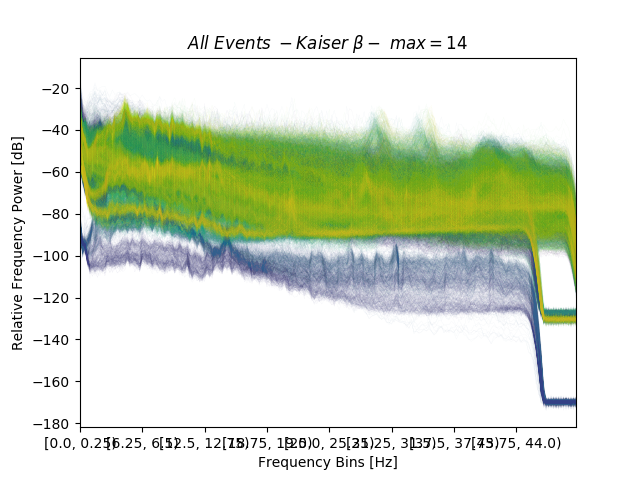

In [21]:
plotter_df = final_df.copy()
plotter_df=plotter_df.drop(["Label", "Mean", "Median"], axis=1)

ax = plotter_df.transpose().plot(legend=False, title=r"$All\ Events\ - Kaiser\ \beta -\ max = 14$", lw=0.01, colormap="viridis")
ax.set_xlabel("Frequency Bins [Hz]")
ax.set_ylabel("Relative Frequency Power [dB]")

With the table constructed and the data saved as a csv, all noise spectra  were plotted showing a common flat trend similar to the one first seen. With some stations more proximal or distal to Nabro, the amplutide levels do differ from dataset (colour) to dataset.

NB: the colour scheme used here gradually changes from purple for the first noise recording to yellow for the very last, as a way to show internal patterns for thousands of data series.